In [1]:
import os
import sys

import numpy as np
import math
import uproot as uproot
import pickle
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
from matplotlib import gridspec

# Add the head direcoty to sys.path
workspace_root = "/exp/sbnd/app/users/amoor/cafpyana/cafpyana/analysis_village/sample_validations/202503"  
sys.path.insert(0, workspace_root + "/../../../")

# import this repo's classes
import pyanalib.pandas_helpers as ph
from makedf.util import *
import pyanalib.pandas_helpers as ph
import pyanalib.split_df_helpers as splh
import pyanalib.stat_helpers as sh

In [2]:
#get sample file paths
#need four for the analysis standard: data (BNB + fixed light dev, intime cosmic), mc (BNB + light, low + threshold BNB + light) 

#input_path = "/exp/sbnd/data/users/amoor/cafpyana_samples/2025Cb/"
input_path = "/exp/sbnd/data/users/apapadop/dfs/v10_14_00/"
#mc_file = input_path + "mc_2025B_Oct25_afm.df"        #mc BNB + light?
#data_file = input_path + "data_2025B_Oct25_afm.df"    #data BNB + fixed light

#mc_bnb_cosmic_file = input_path + "list_mc_MCP2025C_FallValidationII_prodgenie_corsika_proton_rockbox0p1_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Dec25b.df"
##mc_rockbox_dirt_file = input_path + "mc_MCP2025B_prodgenie_corsika_proton_rockbox_lowenergydirt_sbnd_CV_caf_flat_caf_sbnd_sungbin_afm_Nov25.df"
#data_offbeam_light_file = input_path + "list_data_MCP2025C_FallValidationII_RollingDev_offbeamlight_v10_14_00_flatcaf_sbnd_afm_Dec25b.df"
#data_bnb_light_dev_file = input_path + "list_data_MCP2025C_FallValidationII_RollingDev_bnblight_v10_14_00_flatcaf_sbnd_afm_Dec25b.df"

mc_bnb_cosmic_file = "/exp/sbnd/data/users/sungbino/dfs/v10_14_00/mc_MCP2025C_FallValidationII_prodgenie_corsika_proton_rockbox0p1_sbnd_CV_caf_flat_caf_sbnd_general_dfs.df"
data_offbeam_light_file = input_path + "data_MCP2025C_FallValidationII_RollingDev_offbeamlight_v10_14_00_flatcaf_sbnd.df"
data_bnb_light_dev_file = input_path + "data_MCP2025C_FallValidationII_RollingDev_bnblight_v10_14_00_flatcaf_sbnd.df"

In [3]:
sample_str = "v10_14_00"

In [4]:
## Check keys in each file
print("keys in mc_bnb_cosmic_file")
splh.print_keys(mc_bnb_cosmic_file)

print("keys in data_offbeam_light_file")
splh.print_keys(data_offbeam_light_file)

print("keys in data_bnb_light_dev_file")
splh.print_keys(data_bnb_light_dev_file)

keys in mc_bnb_cosmic_file
Keys: ['/evt_0', '/evt_1', '/evt_10', '/evt_11', '/evt_12', '/evt_13', '/evt_14', '/evt_15', '/evt_16', '/evt_17', '/evt_18', '/evt_19', '/evt_2', '/evt_20', '/evt_21', '/evt_3', '/evt_4', '/evt_5', '/evt_6', '/evt_7', '/evt_8', '/evt_9', '/hdr_0', '/hdr_1', '/hdr_10', '/hdr_11', '/hdr_12', '/hdr_13', '/hdr_14', '/hdr_15', '/hdr_16', '/hdr_17', '/hdr_18', '/hdr_19', '/hdr_2', '/hdr_20', '/hdr_21', '/hdr_3', '/hdr_4', '/hdr_5', '/hdr_6', '/hdr_7', '/hdr_8', '/hdr_9', '/histpotdf_0', '/histpotdf_1', '/histpotdf_10', '/histpotdf_11', '/histpotdf_12', '/histpotdf_13', '/histpotdf_14', '/histpotdf_15', '/histpotdf_16', '/histpotdf_17', '/histpotdf_18', '/histpotdf_19', '/histpotdf_2', '/histpotdf_20', '/histpotdf_21', '/histpotdf_3', '/histpotdf_4', '/histpotdf_5', '/histpotdf_6', '/histpotdf_7', '/histpotdf_8', '/histpotdf_9', '/mcnu_0', '/mcnu_1', '/mcnu_10', '/mcnu_11', '/mcnu_12', '/mcnu_13', '/mcnu_14', '/mcnu_15', '/mcnu_16', '/mcnu_17', '/mcnu_18', '/mcnu_1

In [5]:
## Check split multiplicity
print("mc_bnb_cosmic_file n_split: %d" %splh.get_n_split(mc_bnb_cosmic_file))
#print("mc_rockbox_dirt_file n_split: %d" %splh.get_n_split(mc_rockbox_dirt_file))
print("data_offbeam_light_file n_split: %d" %splh.get_n_split(data_offbeam_light_file))
print("data_bnb_light_dev_file n_split: %d" %splh.get_n_split(data_bnb_light_dev_file))

mc_bnb_cosmic_file n_split: 22
data_offbeam_light_file n_split: 2
data_bnb_light_dev_file n_split: 4


In [6]:
## Define keys to load
n_max_concat = 4 ## for big files, each key would have more than one split
keys2load = ['opflash', 'hdr', 'pot', 'evt', 'mcnu']

## Load DataFrames
mc_bnb_cosmic_dfs = splh.load_dfs(mc_bnb_cosmic_file, keys2load, n_max_concat)
#mc_rockbox_dirt_dfs = splh.load_dfs(mc_rockbox_dirt_file, keys2load, n_max_concat)
data_offbeam_light_dfs = splh.load_dfs(data_offbeam_light_file, keys2load, n_max_concat)
data_bnb_light_dfs = splh.load_dfs(data_bnb_light_dev_file, keys2load, n_max_concat)

In [7]:
data_offbeam_light_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

## Check for duplication

In [8]:
def find_duplicate_run_evt_combinations(df):
    """
    Given a DataFrame with a MultiIndex of (__ntuple, entry), find all rows
    where (run, evt) combinations are duplicated.

    Parameters:
        df (pd.DataFrame): Input DataFrame with MultiIndex and columns 'run' and 'evt'.

    Returns:
        pd.DataFrame: Filtered DataFrame containing only duplicated (run, evt) combinations,
                      including the original (__ntuple, entry) indices.
    """
    # Reset index to access MultiIndex as columns
    df_reset = df.reset_index()

    # Find duplicated (run, evt) combinations
    dup_mask = df_reset.duplicated(subset=['run', 'subrun', 'evt'], keep=False)

    # Extract duplicates
    duplicates = df_reset[dup_mask]

    # Sort for readability
    duplicates_sorted = duplicates.sort_values(by=['run', 'subrun', 'evt'])

    #return duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']]

    print(duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']])
    #return duplicates_sorted[['__ntuple', 'entry', 'run', 'subrun', 'evt']]

def plot_duplicate_run_subrun_evt_distribution(df, title=""):
    """
    Computes and plots the distribution of how many times each (run, subrun, evt) combination appears.

    Parameters:
        df (pd.DataFrame): Input DataFrame with MultiIndex (__ntuple, entry)
                           and columns including 'run', 'subrun', and 'evt'.
        title (str): Title for the plot (optional).
    
    Returns:
        pd.Series: Duplication count distribution 
                   (index = count, value = number of (run, subrun, evt) with that count)
    """
    # Reset index to work with columns
    df_reset = df.reset_index()

    # Count occurrences of each (run, subrun, evt)
    combo_counts = df_reset.groupby(['run', 'subrun', 'evt']).size()

    # Get distribution of these counts
    distribution = combo_counts.value_counts().sort_index()

    # Plotting
    plt.figure(figsize=(8, 5))
    distribution.plot(kind='bar', log=True)
    plt.xlabel('Number of times (run, subrun, evt) appears')
    plt.ylabel('Entries (spills)')
    plt.title(title)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def filter_unique_events(df):
    # If your index includes '__ntuple' and 'entry', reset to access them as columns
    df_reset = df.reset_index()

    # Find duplicated (run, subrun, evt) — keep=False marks *all* occurrences as duplicates
    dup_mask = df_reset.duplicated(subset=['run', 'subrun', 'evt'], keep=False)

    # Keep only rows that are NOT duplicated
    unique_df = df_reset[~dup_mask]

    # Optional: set index back if needed
    return unique_df.set_index(df.index.names)

def filter_using_hdr(df, hdrdf):
    allowed_keys = set(hdrdf.index)

    ntuples = df.index.get_level_values('__ntuple').to_numpy()
    entries = df.index.get_level_values('entry').to_numpy()
    keys = np.column_stack((ntuples, entries))

    # Create mask using list comprehension (faster than pure zip for large data)
    mask = [(nt, en) in allowed_keys for nt, en in keys]

    return df[mask]

In [9]:
print("duplication for MC BNB + Cosmic sample")
find_duplicate_run_evt_combinations(mc_bnb_cosmic_dfs["hdr"])

print("\n")
print("duplication for Off-beam + light sample")
find_duplicate_run_evt_combinations(data_offbeam_light_dfs["hdr"])

print("\n")
print("duplication for BNB + light sample")
find_duplicate_run_evt_combinations(data_bnb_light_dfs["hdr"])

duplication for MC BNB + Cosmic sample
       __ntuple  entry  run  subrun  evt
52387       123    336   57      60   40
59796       135    156   57      60   40
52389       123    338   57      60   43
59797       135    157   57      60   43
52390       123    339   57      60   46
59799       135    159   57      60   46
10275        70    370  310      68    1
60885       154    377  310      68    1
10279        70    374  310      68    8
60888       154    380  310      68    8
10281        70    376  310      68   17
60889       154    381  310      68   17
10282        70    377  310      68   18
60890       154    382  310      68   18
10283        70    378  310      68   22
60894       154    386  310      68   22
10286        70    381  310      68   31
60898       154    390  310      68   31
10291        70    386  310      68   49
60900       154    392  310      68   49


duplication for Off-beam + light sample
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, ev

In [10]:
### Filter the hdr DataFrame first, then filter other DataFrames by matching with the hdr DataFrame
mc_bnb_cosmic_dfs["hdr"] = filter_unique_events(mc_bnb_cosmic_dfs["hdr"])
data_offbeam_light_dfs["hdr"] = filter_unique_events(data_offbeam_light_dfs["hdr"])
data_bnb_light_dfs["hdr"] = filter_unique_events(data_bnb_light_dfs["hdr"])

In [11]:
## Double check if it is filtered
find_duplicate_run_evt_combinations(mc_bnb_cosmic_dfs["hdr"])
find_duplicate_run_evt_combinations(data_offbeam_light_dfs["hdr"])
find_duplicate_run_evt_combinations(data_bnb_light_dfs["hdr"])

Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []
Empty DataFrame
Columns: [__ntuple, entry, run, subrun, evt]
Index: []


In [12]:
mc_bnb_cosmic_dfs["evt"] = filter_using_hdr(mc_bnb_cosmic_dfs["evt"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["opflash"] = filter_using_hdr(mc_bnb_cosmic_dfs["opflash"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["pot"] = filter_using_hdr(mc_bnb_cosmic_dfs["pot"], mc_bnb_cosmic_dfs["hdr"])
mc_bnb_cosmic_dfs["mcnu"] = filter_using_hdr(mc_bnb_cosmic_dfs["mcnu"], mc_bnb_cosmic_dfs["hdr"])

data_offbeam_light_dfs["evt"] = filter_using_hdr(data_offbeam_light_dfs["evt"], data_offbeam_light_dfs["hdr"])
data_offbeam_light_dfs["opflash"] = filter_using_hdr(data_offbeam_light_dfs["opflash"], data_offbeam_light_dfs["hdr"])
data_offbeam_light_dfs["pot"] = filter_using_hdr(data_offbeam_light_dfs["pot"], data_offbeam_light_dfs["hdr"])

data_bnb_light_dfs["evt"] = filter_using_hdr(data_bnb_light_dfs["evt"], data_bnb_light_dfs["hdr"])
data_bnb_light_dfs["opflash"] = filter_using_hdr(data_bnb_light_dfs["opflash"], data_bnb_light_dfs["hdr"])
data_bnb_light_dfs["pot"] = filter_using_hdr(data_bnb_light_dfs["pot"], data_bnb_light_dfs["hdr"])

## Normalisation

In [13]:
def get_n_evt(df):
    unique_count = df.index.droplevel(
        list(df.index.names[2:])  # drop everything except first two levels
    ).nunique()
    return unique_count

In [14]:
##remove these

## Collect the offbeam data fudge factor and scale for offbeam data
n_record_spill_data = get_n_evt(data_bnb_light_dfs['hdr'])
print("n_record_spill_data", n_record_spill_data)
n_gates_data =  len(data_bnb_light_dfs["pot"])
print("n_gates_data", n_gates_data)

n_record_spill_offbeam_data = get_n_evt(data_offbeam_light_dfs['hdr'])
print("n_record_spill_offbeam_data", n_record_spill_offbeam_data)
n_gates_offbeam_data = data_offbeam_light_dfs["hdr"][data_offbeam_light_dfs["hdr"]['first_in_subrun'] == 1]['noffbeambnb'].sum()
print("n_gates_offbeam_data", n_gates_offbeam_data)

p_trig_data = n_record_spill_data / n_gates_data
p_trig_offbeam_data = n_record_spill_offbeam_data / n_gates_offbeam_data

f_factor = (p_trig_data - p_trig_offbeam_data) / (1 - p_trig_offbeam_data)
print("f_factor: %f" %f_factor)

intime_gate_scale = (1. - f_factor) * (n_gates_data + 0.) / (n_gates_offbeam_data + 0.)
print("intime_gate_scale: %f" %intime_gate_scale)
intime_gate_scale = 0
print("intime_gate_scale: %f" %intime_gate_scale)

n_record_spill_data 63855
n_gates_data 709166
n_record_spill_offbeam_data 33080
n_gates_offbeam_data 0.0
f_factor: nan
intime_gate_scale: nan
intime_gate_scale: 0.000000


/tmp/ipykernel_2850/1901335783.py:15: RuntimeWarning: divide by zero encountered in scalar divide
  p_trig_offbeam_data = n_record_spill_offbeam_data / n_gates_offbeam_data
/tmp/ipykernel_2850/1901335783.py:17: RuntimeWarning: invalid value encountered in scalar divide
  f_factor = (p_trig_data - p_trig_offbeam_data) / (1 - p_trig_offbeam_data)


In [15]:
## Collect pot scale for MC
mc_tot_pot = mc_bnb_cosmic_dfs["hdr"]['pot'].sum()
#n_evt_mc = get_n_evt(mc_bnb_cosmic_dfs["hdr"])

data_tot_pot = data_bnb_light_dfs["hdr"]['pot'].sum()
#data_tot_TOR860 = data_bnb_light_dfs["pot"]['TOR860'].sum()
#data_tot_TOR875 = data_bnb_light_dfs["pot"]['TOR875'].sum()

print("mc_tot_pot: %e" %(mc_tot_pot))
#print("n_evt_mc: %e" %(n_evt_mc))

print("data_tot_pot: %e" %(data_tot_pot))
#n_evt_data = get_n_evt(data_bnb_light_dfs["hdr"])
#print(n_evt_data)
#print("data_tot_TOR860: %e" %(data_tot_TOR860))
#print("data_tot_TOR875: %e" %(data_tot_TOR875))

#target_pot = data_tot_pot
#ignore data for now, look at Lynn's POT
target_pot = 3.5e20
mc_pot_scale = target_pot / mc_tot_pot
#print(mc_pot_scale)
#print(mc_low_th_scale)
print("MC POT scale: %.3f" %(mc_pot_scale))

mc_tot_pot: 4.575711e+18
data_tot_pot: 3.279966e+18
MC POT scale: 76.491


In [16]:
## Comparison between observed and expected total number of recorded spills
n_evt_mc = get_n_evt(mc_bnb_cosmic_dfs["hdr"])

#intime_gate_scale = 1 #fudge for 0 POT

print("n_evt_data_onbeam: %d" %n_record_spill_data)
print("n_evt_exp.: %f" %(n_evt_mc * mc_pot_scale + n_record_spill_offbeam_data** intime_gate_scale))
print("- n_evt_mc: %f" %(n_evt_mc * mc_pot_scale))
print("- n_evt_data_offbeam: %f" %(n_record_spill_offbeam_data * intime_gate_scale))

n_evt_data_onbeam: 63855
n_evt_exp.: 6434029.047219
- n_evt_mc: 6434028.047219
- n_evt_data_offbeam: 0.000000


## OpFlash and light timing cut

In [17]:
def draw_a_distribution(df, col, title_x, x_min, x_max, nbins, title_y = "", is_logx = False, is_logy = False, label_top = ""):
    var = df[col]
    bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1) if is_logx else np.linspace(x_min, x_max, nbins + 1)
    bin_centers = np.sqrt(bins[:-1] * bins[1:]) if is_logx else 0.5 * (bins[:-1] + bins[1:])
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.hist(var, bins, weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
    if is_logy:
        ax.yscale('log')
    ax.set_xlabel(title_x)
    ax.set_ylabel(title_y)
    ax.legend()
    ax.text(1.0, 1.02, label_top, transform=ax.transAxes, fontsize=14, fontweight='bold', ha='right') 
    plt.show()

def abs_comp_total_pe_two_mc_stack(
    df_mc, df_data_bnb_light, df_data_offbeam_light,
    col_mc, col_data, title_x, x_min, x_max, nbins,
    title_y = "", is_logx = False, is_logy = False, label_top = "",
    mc_scale = 1.533, intime_scale = 1.
):
    mc_var = df_mc[col_mc]
    data_bnb_light_var = df_data_bnb_light[col_data]
    data_offbeam_light_var = df_data_offbeam_light[col_data]

    # (kept for reference; override via intime_scale argument)
    #data_offbeam_light_scale = 0.103

    # Binning
    bins = (np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1)
            if is_logx else np.linspace(x_min, x_max, nbins + 1))
    bin_centers = (np.sqrt(bins[:-1] * bins[1:])
                   if is_logx else 0.5 * (bins[:-1] + bins[1:]))
    bin_widths = np.diff(bins)

    fig, ax = plt.subplots(figsize=(8, 5))

    # --- Data histogram (BNB light) ---
    ax.hist(
        data_bnb_light_var, bins=bins,
        histtype="step", color="black", linewidth=2,
        label="BNB + light data"
    )

    # --- Components: compute binned counts ---
    mc_hist, _ = np.histogram(mc_var, bins=bins)
    offbeam_hist, _ = np.histogram(data_offbeam_light_var, bins=bins)

    # Apply scales
    mc_hist = mc_hist * mc_scale
    offbeam_hist = offbeam_hist

    # --- Stack components as bars (to show contributions) ---
    # Bottoms for stacking
    bottom0 = np.zeros_like(mc_hist, dtype=float)
    h1 = mc_hist
    h3 = offbeam_hist * intime_scale

    # Use bars so stack works in both linear and log-x; they also respect log-y.
    # (We avoid specifying colors explicitly so you can theme globally if you like.)
    ax.bar(bins[:-1], h1, width=bin_widths, align="edge",
           alpha=0.45, edgecolor="none", label="MC (BNB+cosmic)")
    ax.bar(bins[:-1], h3, width=bin_widths, align="edge",
           bottom=h1, alpha=0.45, edgecolor="none", label="Off-beam light")

    # --- Total prediction overlay (dashed step) ---
    pred_hist = h1 + h3
    ax.step(bin_centers, pred_hist, where="mid", linewidth=2, linestyle="--",
            label="Total prediction", color='red')

    # Scales, labels, cosmetics
    if is_logx:
        ax.set_xscale("log")
    if is_logy:
        ax.set_yscale("log")

    ax.set_xlabel(title_x)
    ax.set_ylabel(title_y if title_y else "Events")
    ax.set_xlim(x_min, x_max)

    # Legend: put data first, then components, then total
    # (Matplotlib collects in order added; this already matches that.)
    ax.legend(frameon=False)

    if label_top:
        ax.text(1.0, 1.02, label_top, transform=ax.transAxes,
                fontsize=14, fontweight='bold', ha='right')

    plt.tight_layout()
    plt.show()
    

In [18]:
mc_bnb_cosmic_opflash_df = mc_bnb_cosmic_dfs['opflash']
data_bnb_light_opflash_df = data_bnb_light_dfs['opflash']
data_offbeam_light_opflash_df = data_offbeam_light_dfs['opflash']

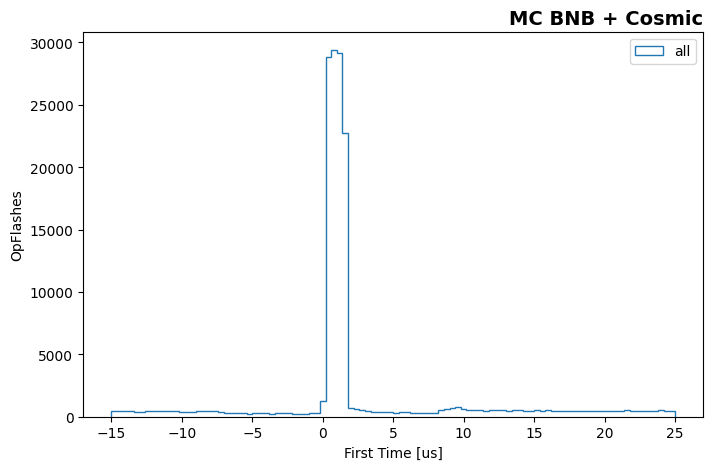

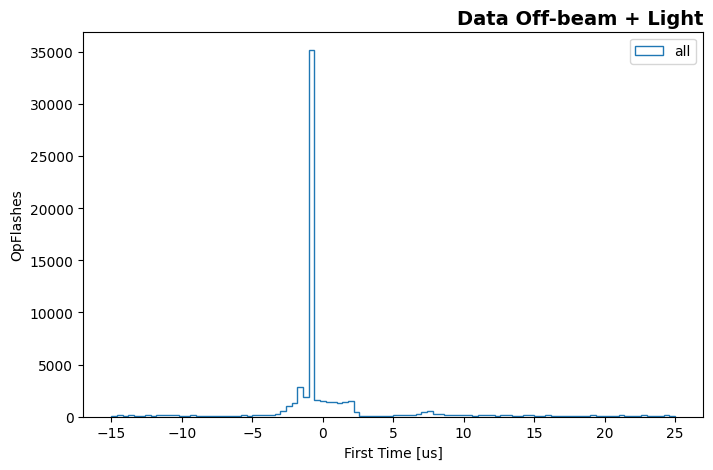

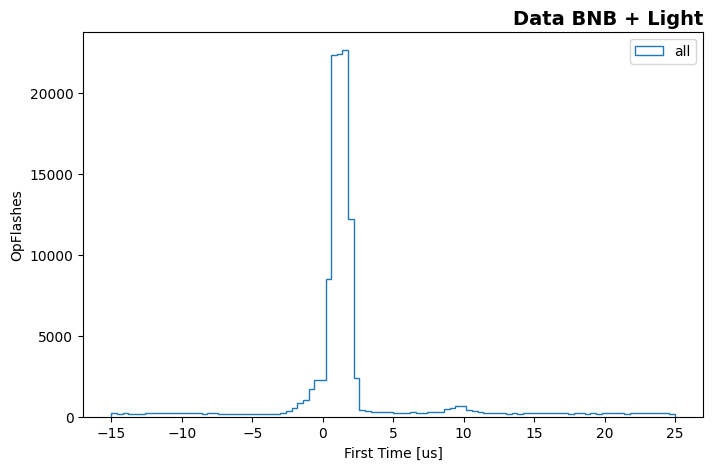

In [19]:
## Check OpFlash First Time distributions
draw_a_distribution(mc_bnb_cosmic_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "MC BNB + Cosmic")
draw_a_distribution(data_offbeam_light_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "Data Off-beam + Light")
draw_a_distribution(data_bnb_light_opflash_df, ('firsttime'), "First Time [us]", -15., 25., 100, "OpFlashes", False, False, "Data BNB + Light")

In [20]:
## Based on the previous block's result, we use [-5 us, +5 us] window for collecting OpFlashes corresponding to the trigger

mc_bnb_light_opflash_time_cut_df = mc_bnb_cosmic_opflash_df[(mc_bnb_cosmic_opflash_df.firsttime > -5.) & (mc_bnb_cosmic_opflash_df.firsttime < 5.)]
data_offbeam_light_opflash_df = data_offbeam_light_opflash_df[(data_offbeam_light_opflash_df.firsttime > -5.) & (data_offbeam_light_opflash_df.firsttime < 5.)]
data_bnb_light_opflash_df = data_bnb_light_opflash_df[(data_bnb_light_opflash_df.firsttime > -5.) & (data_bnb_light_opflash_df.firsttime < 5.)]

In [21]:
## Sum PEs for OpFlashes within the timing window

mc_bnb_cosmic_totalpe_sum_time_cut=(mc_bnb_light_opflash_time_cut_df.groupby(level=[0, 1])["totalpe"].sum())
data_offbeam_light_totalpe_sum_time_cut=(data_offbeam_light_opflash_df.groupby(level=[0, 1])["totalpe"].sum())
data_bnb_light_totalpe_sum_time_cut=(data_bnb_light_opflash_df.groupby(level=[0, 1])["totalpe"].sum())

In [22]:
## Add the total PE column to the hdr DataFrames, and fill empty (NaN) entries with 0.

mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'] = mc_bnb_cosmic_totalpe_sum_time_cut
mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'] = (mc_bnb_cosmic_dfs['hdr']['totalpe_timecut'].fillna(-1.))

data_offbeam_light_dfs['hdr']['totalpe_timecut'] = data_offbeam_light_totalpe_sum_time_cut
data_offbeam_light_dfs['hdr']['totalpe_timecut'] = (data_offbeam_light_dfs['hdr']['totalpe_timecut'].fillna(-1.))

data_bnb_light_dfs['hdr']['totalpe_timecut'] = data_bnb_light_totalpe_sum_time_cut
data_bnb_light_dfs['hdr']['totalpe_timecut'] = (data_bnb_light_dfs['hdr']['totalpe_timecut'].fillna(-1.))

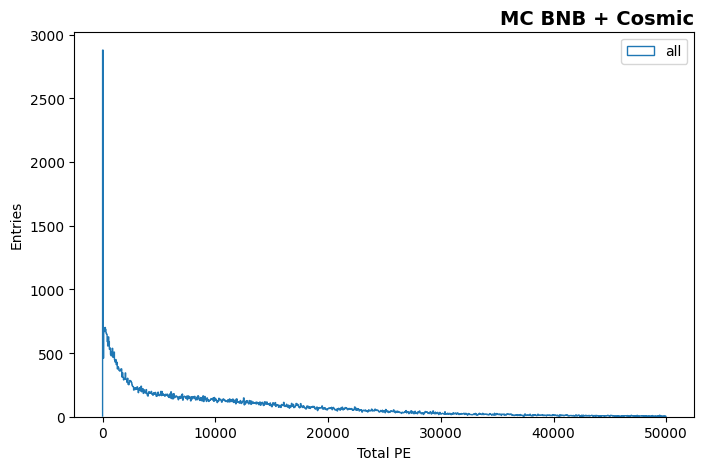

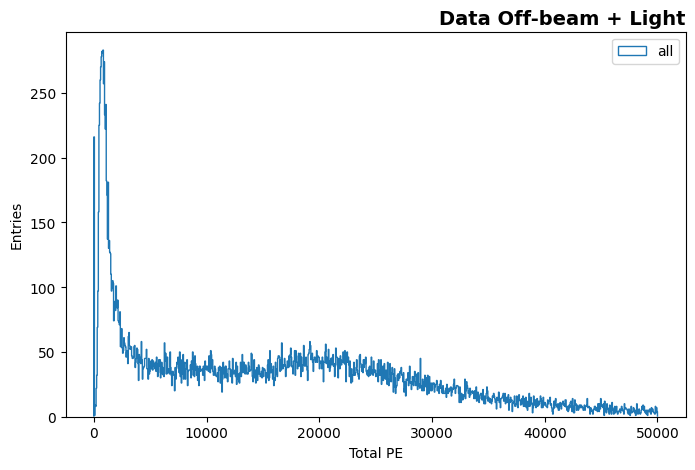

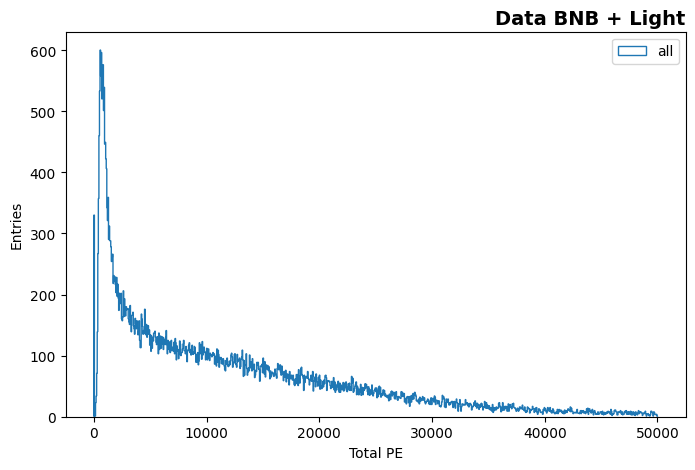

In [23]:
## Check the total PE distributions

draw_a_distribution(mc_bnb_cosmic_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "MC BNB + Cosmic")
draw_a_distribution(data_offbeam_light_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "Data Off-beam + Light")
draw_a_distribution(data_bnb_light_dfs['hdr'], ('totalpe_timecut'), "Total PE", -10, 50000, 1000, "Entries", False, False, "Data BNB + Light")

In [24]:
## Apply a scale to MC total PE
mc_bnb_cosmic_hdr_df = mc_bnb_cosmic_dfs['hdr']
#mc_bnb_cosmic_hdr_df['totalpe_timecut_0p66'] = mc_bnb_cosmic_hdr_df['totalpe_timecut'] * 0.66

data_offbeam_light_hdr_df = data_offbeam_light_dfs['hdr']
data_bnb_light_hdr_df = data_bnb_light_dfs['hdr']

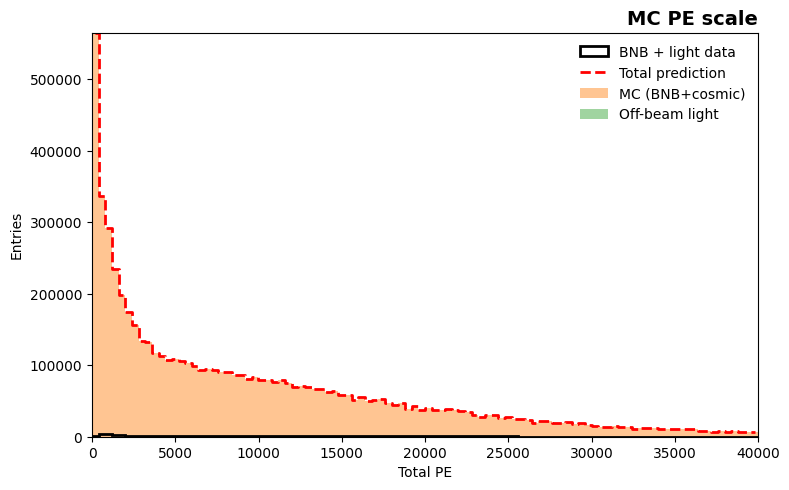

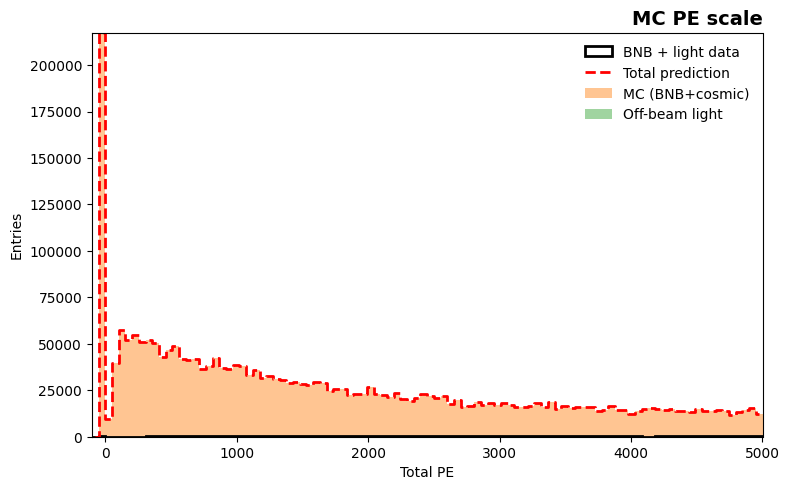

In [25]:
## Check total PE distribution
abs_comp_total_pe_two_mc_stack(mc_bnb_cosmic_hdr_df, data_bnb_light_hdr_df, data_offbeam_light_hdr_df, ('totalpe_timecut'), ('totalpe_timecut'), "Total PE", -10., 40000, 100, "Entries", False, False, "MC PE scale", mc_pot_scale, intime_gate_scale)
abs_comp_total_pe_two_mc_stack(mc_bnb_cosmic_hdr_df, data_bnb_light_hdr_df, data_offbeam_light_hdr_df, ('totalpe_timecut'), ('totalpe_timecut'), "Total PE", -100, 5000, 100, "Entries", False, False, "MC PE scale", mc_pot_scale, intime_gate_scale)

In [26]:
##leave it there, no PE cut for now

## DEFINE PE CUT
total_pe_cut = 2000.
mc_bnb_cosmic_pe_mask = mc_bnb_cosmic_hdr_df["totalpe_timecut"] > total_pe_cut
data_offbeam_pe_mask = data_offbeam_light_hdr_df['totalpe_timecut'] > total_pe_cut
data_bnb_light_pe_mask = data_bnb_light_hdr_df['totalpe_timecut'] > total_pe_cut

In [27]:
## Since evt DataFrame has more level in labels, we should make a mask for considering the difference
def get_evt_pe_mask(mask, df):
    sel_idx = mask[mask].index
    pairs = df.index.droplevel([-2, -1])
    mask2 = pairs.isin(sel_idx)
    return mask2

In [28]:
mc_bnb_cosmic_evt_pe_mask = get_evt_pe_mask(mc_bnb_cosmic_pe_mask, mc_bnb_cosmic_dfs["evt"])
data_offbeam_evt_pe_mask = get_evt_pe_mask(data_offbeam_pe_mask, data_offbeam_light_dfs["evt"])
data_bnb_light_evt_pe_mask = get_evt_pe_mask(data_bnb_light_pe_mask, data_bnb_light_dfs["evt"])

In [29]:
## Double checking for legnths of evt DataFrame and the mask array
print("mc_bnb_cosmic_dfs['evt'] length: %d" %len(mc_bnb_cosmic_dfs['evt']))
print("mc_bnb_cosmic_evt_pe_mask length: %d" %len(mc_bnb_cosmic_evt_pe_mask))

print("data_offbeam_light_dfs['evt'] length: %d" %len(data_offbeam_light_dfs['evt']))
print("data_offbeam_evt_pe_mask length: %d" %len(data_offbeam_evt_pe_mask))

print("data_bnb_light_dfs['evt'] length: %d" %len(data_bnb_light_dfs['evt']))
print("data_bnb_light_evt_pe_mask length: %d" %len(data_bnb_light_evt_pe_mask))

mc_bnb_cosmic_dfs['evt'] length: 3934878
mc_bnb_cosmic_evt_pe_mask length: 3934878
data_offbeam_light_dfs['evt'] length: 1836403
data_offbeam_evt_pe_mask length: 1836403
data_bnb_light_dfs['evt'] length: 3408174
data_bnb_light_evt_pe_mask length: 3408174


In [30]:
## Add PE cut decision (boolean) column to evt DataFrame
mc_bnb_cosmic_dfs["evt"][('pemask', '', '', '', '', '')] = mc_bnb_cosmic_evt_pe_mask
data_bnb_light_dfs["evt"][('pemask', '', '', '', '', '')] = data_bnb_light_evt_pe_mask
data_offbeam_light_dfs["evt"][('pemask', '', '', '', '', '')] = data_offbeam_evt_pe_mask

## Define FV

In [31]:
def InFV_trk(data): # cm
    xmin = -190.
    ymin = -190.
    zmin = 10.
    xmax = 190.
    ymax =  190.
    zmax =  450.
    return (data.x > xmin) & (data.x < xmax) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)

def InFV(data): # cm
    xmin = -190.
    ymin = -190.
    zmin = 10.
    xmax = 190.
    ymax =  190.
    zmax =  450.
    return (np.abs(data.x) > 10) & (np.abs(data.x) < 190) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)

def InAV(data): # cm
    xmin = -200.
    ymin = -200.
    zmin = 0.
    xmax = 200.
    ymax =  200.
    zmax =  500.
    return (np.abs(data.x) > 10) & (np.abs(data.x) < 190) & (data.y > ymin) & (data.y < ymax) & (data.z > zmin) & (data.z < zmax)


def InFV_xy(data): # cm
    xmin = 10.
    ymin = -190.
    xmax = 190.
    ymax =  190.
    return (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.y > ymin) & (data.y < ymax)

## Vetoing high y and high z region
def InFV_nohiyz(data):
    xmin = 10.
    xmax = 190.
    zmin = 10.
    zmax = 450.
    ymax_highz = 100.
    pass_xz = (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (np.abs(data.y) < 190.)) | ((data.z > 250) & (data.y > -190.) & (data.y < ymax_highz))
    return pass_xz & pass_y

def InFV_nohiyz_trk(data):
    xmax = 190.
    zmin = 10.
    zmax = 450.
    ymax_highz = 100.
    pass_xz = (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (np.abs(data.y) < 190.)) | ((data.z > 250) & (data.y > -190.) & (data.y < ymax_highz))
    return pass_xz & pass_y

#from Lynn
def InFV_nohiyz_pm10(data):
    xmin = -190.
    xmax = 190.
    zmin = 10.
    zmax = 450.
    pass_xz = (np.abs(data.x) > xmin) & (np.abs(data.x) < xmax) & (data.z > zmin) & (data.z < zmax)
    pass_y = ((data.z < 250) & (data.z > 10) & (np.abs(data.y) < 190)) | ((data.z < 450) & (data.z > 250) & (data.y < 100) & (data.y > -190))
    return pass_xz & pass_y

## Match truth and MC and create categories

In [32]:
def get_true_t(df):
    t = (df.E - df.mu.genE - df.cpi.genE)**2 - (df.momentum.x - df.mu.genp.x - df.cpi.genp.x)**2 - (df.momentum.y - df.mu.genp.y - df.cpi.genp.y)**2 - (df.momentum.z - df.mu.genp.z - df.cpi.genp.z)**2
    return np.abs(t)

In [33]:
true_t = get_true_t(mc_bnb_cosmic_dfs['mcnu']).fillna(999999)
mc_bnb_cosmic_dfs['mcnu']['true_t'] = true_t

In [34]:
mc_bnb_cosmic_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

In [35]:
mc_bnb_cosmic_dfs["mcnu"].columns.values

array([('E', '', ''), ('baseline', '', ''), ('time', '', ''),
       ('bjorkenX', '', ''), ('inelasticityY', '', ''), ('Q2', '', ''),
       ('w', '', ''), ('momentum', 'x', ''), ('momentum', 'y', ''),
       ('momentum', 'z', ''), ('position', 'x', ''),
       ('position', 'y', ''), ('position', 'z', ''), ('pdg', '', ''),
       ('iscc', '', ''), ('genie_mode', '', ''), ('parent_pdg', '', ''),
       ('parent_dcy_E', '', ''), ('genie_evtrec_idx', '', ''),
       ('max_proton_ke', '', ''), ('nn', '', ''), ('np', '', ''),
       ('nmu', '', ''), ('npi', '', ''), ('npi0', '', ''), ('ng', '', ''),
       ('nk', '', ''), ('nk0', '', ''), ('nsm', '', ''), ('nsp', '', ''),
       ('nmu_27MeV', '', ''), ('np_20MeV', '', ''), ('np_50MeV', '', ''),
       ('npi_30MeV', '', ''), ('nn_0MeV', '', ''), ('mu', 'genE', ''),
       ('mu', 'length', ''), ('mu', 'pdg', ''), ('mu', 'genp', 'x'),
       ('mu', 'genp', 'y'), ('mu', 'genp', 'z'), ('mu', 'start', 'x'),
       ('mu', 'start', 'y'), ('mu', 'st

In [36]:
mc_bnb_cosmic_dfs["mcnu"].e.genE

__ntuple  entry  rec.mc.nu..index
58        0      0                  NaN
                 1                  NaN
                 2                  NaN
          1      0                  NaN
                 1                  NaN
                                     ..
193       465    0                  NaN
                 1                  NaN
                 2                  NaN
          466    0                  NaN
                 1                  NaN
Name: genE, Length: 149844, dtype: float32

In [37]:
## For MC BNB + cosmic sample
is_fv = InFV_nohiyz_pm10(mc_bnb_cosmic_dfs['mcnu'].position)     #based on the true position
is_cc = mc_bnb_cosmic_dfs['mcnu'].iscc               #based on truth CC info
genie_mode = mc_bnb_cosmic_dfs['mcnu'].genie_mode    #based on true interaction category
w = mc_bnb_cosmic_dfs['mcnu'].w
true_pdg = mc_bnb_cosmic_dfs['mcnu'].pdg
electron_energy = mc_bnb_cosmic_dfs["mcnu"].e.genE

try :
    nuint_categ = pd.Series(8, index=mc_bnb_cosmic_dfs['mcnu'].index)
except Exception as e:
    print(f"Error init nuint_categ")

nuint_categ[~is_fv] = -1  # Out of FV
nuint_categ[is_fv & is_cc & ((true_pdg == 12) & (electron_energy > 0.5))] = 1 # Signal
nuint_categ[is_fv & ~is_cc] = 0  # NC
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode == 3)] = 2  #  CCCOH
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode == 0)] = 3  # CCQE
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode == 10)] = 4  # 2p2h
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w < 1.4) | (genie_mode == 1))] = 5  # RES
nuint_categ[is_fv & is_cc & (~((true_pdg == 12) & (electron_energy > 0.5))) & (genie_mode != 0) & (genie_mode != 3) & (genie_mode != 10) & ((w > 2.0) | (genie_mode == 2))] = 6  # DIS

mc_bnb_cosmic_dfs['mcnu']['nuint_categ'] = nuint_categ

In [38]:
#### 1) Merging is based on matching between slc.tmatch.idx of evtdf and rec.mc.nu..index of mcnudf.
####    For each entry (readout window), there could be multiple truth neutrino interactions and reconstructed slices
####    We want to match each truth neutrino interaction to a corresponding slice

#It matches the levels of the two datasets to be merged, and then merges them (so all columns and rows join the dataset)


# match for mc bnb cosmic
mc_bnb_cosmic_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([('gen',) + col if isinstance(col, tuple) else ('gen', col) for col in mc_bnb_cosmic_dfs["mcnu"].columns])
mc_bnb_cosmic_dfs["mcnu"].columns = pd.MultiIndex.from_tuples([
    col + ('',) * (6 - len(col)) for col in mc_bnb_cosmic_dfs["mcnu"].columns
])
mc_bnb_cosmic_dfs["evt"] = ph.multicol_merge(mc_bnb_cosmic_dfs["evt"].reset_index(), mc_bnb_cosmic_dfs["mcnu"].reset_index(),
                                            left_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('slc','tmatch', 'idx', '', '', '')],
                                            right_on=[('__ntuple', '', '', '', '', ''), ('entry', '', '', '', '', ''), ('rec.mc.nu..index', '','', '', '', '')], 
                                            how="left") ## -- save all sllices
mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"].set_index(["__ntuple", "entry", "rec.slc..index", "rec.slc.reco.pfp..index"], verify_integrity=True)
mc_bnb_cosmic_dfs["evt"].loc[mc_bnb_cosmic_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')].isna(), [('gen', 'nuint_categ', '', '', '', '')]] = -2

data_offbeam_light_dfs["evt"][('gen', 'nuint_categ', '', '', '', '')] = -3

In [39]:
## Check 
mc_bnb_cosmic_dfs["mcnu"].gen.nuint_categ.value_counts()

nuint_categ
-1    120844
 3     10766
 0      8245
 5      5832
 4      2883
 6      1129
 1       103
 2        42
Name: count, dtype: int64

values =  [      0.  505395. 3429483.       0.]
sum values =  3934878.0


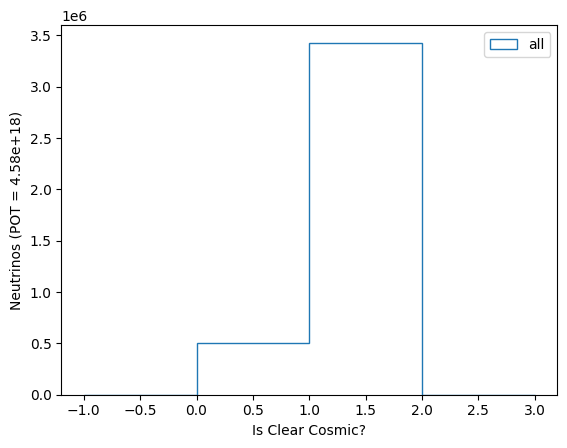

In [40]:
#Plot a variable

var = mc_bnb_cosmic_dfs["evt"].slc.is_clear_cosmic 
values, bins, patches = plt.hist(var, bins=np.linspace(-1., 3., 5), weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
print("values = ", values)
print("sum values = ", sum(values))
plt.xlabel("Is Clear Cosmic?")
plt.ylabel(f"Neutrinos (POT = {mc_tot_pot:.2e})")
plt.legend()
plt.show()

sum_value_nocut = sum(values)

def HasMuonCandidate(data): # cm
    track = data.pfp.trackScore > 0.6
    length = data.pfp.trk.len > 32
    muchi2 = data.pfp.trk.chi2pid.I2.chi2_muon < 18
    pchi2 = data.pfp.trk.chi2pid.I2.chi2_proton > 97
    return (track & length & muchi2 & pchi2)

def HasMuonCandidate_lowZ(data): # cm
    track = data.pfp.trackScore > 0.6
    length = data.pfp.trk.len > 32
    muchi2 = data.pfp.trk.chi2pid.I2.chi2_muon < 18
    pchi2 = data.pfp.trk.chi2pid.I2.chi2_proton > 97
    z = data.pfp.trk.end.z > 6
    return (track & length & muchi2 & pchi2 & z)

In [41]:
mc_bnb_cosmic_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

In [42]:
mc_bnb_cosmic_dfs["evt"].slc.barycenterFM

chargeTotal  \
                                                                      
                                                                      
                                                                      
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                 
58       0     0              0                        41488.691406   
                              1                        41488.691406   
                              2                        41488.691406   
               1              0                        -9999.000000   
                              1                        -9999.000000   
...                                                             ...   
193      466   5              0                        65226.507812   
                              1                        65226.507812   
               6              0                        53121.050781   
                              1                        53121.050781   
                              2                        53121.050781   

                                                         flashTime  \
                                                                     
                                                                     
                                                                     
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                
58       0     0              0                           1.123172   
                              1                           1.123172   
                              2                           1.123172   
               1              0                       -9999.000000   
                              1                       -9999.000000   
...                                                            ...   
193      466   5              0                           0.434118   
                              1                           0.434118   
               6              0                           0.855140   
                              1                           0.855140   
                              2                           0.855140   

                                                           flashPEs  \
                                                                      
                                                                      
                                                                      
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                 
58       0     0              0                        11756.978516   
                              1                        11756.978516   
                              2                        11756.978516   
               1              0                        -9999.000000   
                              1                        -9999.000000   
...                                                             ...   
193      466   5              0                         2756.051514   
                              1                         2756.051514   
               6              0                        10546.672852   
                              1                        10546.672852   
                              2                        10546.672852   

                                                            chi2        score  \
                                                                                
                                                                                
                                                                                
__ntuple entry rec.slc..index rec.slc.reco.pfp..index                           
58       0     0              0                        1000000.0     0.000001   
                              1                        1000000.0     0.000001   
                              2                        1000000.0     0.000001   
             

sum values =  3266584.0


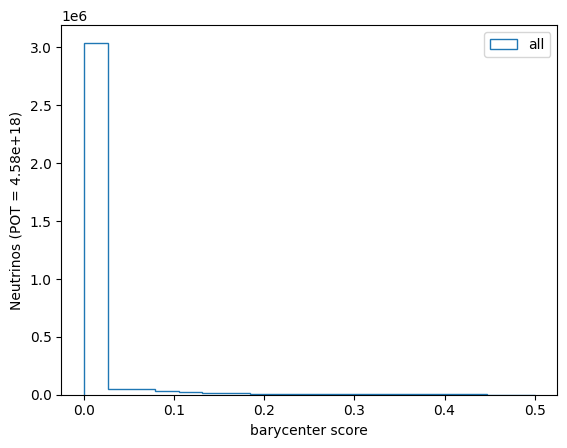

In [43]:
#Plot a variable

var = mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.score
values, bins, patches = plt.hist(var, bins=np.linspace(0., 0.5, 20), weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
#print("values = ", values)
print("sum values = ", sum(values))
plt.xlabel("barycenter score")
plt.ylabel(f"Neutrinos (POT = {mc_tot_pot:.2e})")
plt.legend()
plt.show()

sum_value_nocut = sum(values)

sum values =  3203763.0


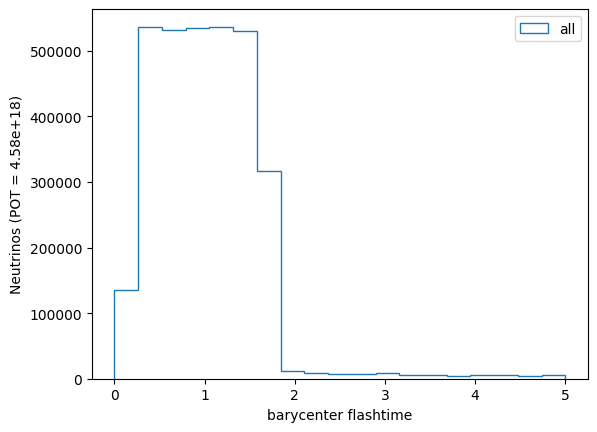

In [44]:
#Plot a variable

var = mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.flashTime
values, bins, patches = plt.hist(var, bins=np.linspace(0., 5, 20), weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
#print("values = ", values)
print("sum values = ", sum(values))
plt.xlabel("barycenter flashtime")
plt.ylabel(f"Neutrinos (POT = {mc_tot_pot:.2e})")
plt.legend()
plt.show()

sum_value_nocut = sum(values)

sum values =  949223.0


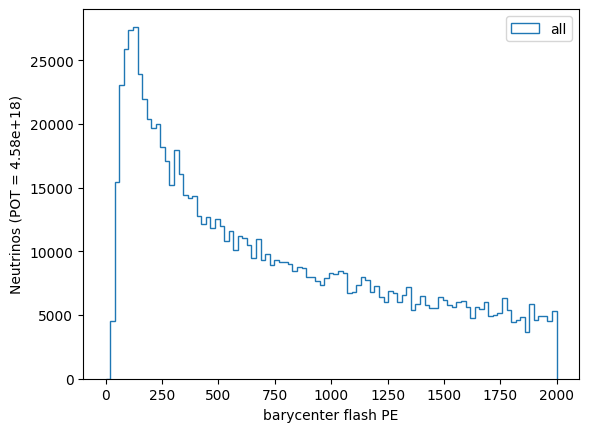

In [45]:
#Plot a variable

var = mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.flashPEs
values, bins, patches = plt.hist(var, bins=np.linspace(0., 2e3, 100), weights=[np.ones_like(data) * 1. for data in var], histtype="step", label=["all"])
#print("values = ", values)
print("sum values = ", sum(values))
plt.xlabel("barycenter flash PE")
plt.ylabel(f"Neutrinos (POT = {mc_tot_pot:.2e})")
plt.legend()
plt.show()

sum_value_nocut = sum(values)

## Set up plotting

In [46]:

mode_list = [1, 2, 0, 3, 4, 5, 6, -1, -2, -3, -4]
mode_labels = ["Signal", "CC COH (non. Sig)", "NC (non. Sig)", "QE (non. Sig)", "2p2h (non. Sig)", "RES (non. Sig)", "DIS (non. Sig)", "Non-FV (non. Sig)", "Others (non. Sig)", "Intime Cosmics (non. Sig)"]
colors = ['#d62728',  # Red            Signal
          '#1f77b4',  # Blue           NS CCCOH
          '#ff7f0e',  # Orange          NC
          '#2ca02c',  # Green           QE
          '#17becf',  # Teal           2p2h
          '#9467bd',  # Purple         RES
          '#8c564b',  # Brown           DIS
          '#e377c2',  # Pink            NON FV
          '#7f7f7f',  # Gray             Other
          '#bcbd22']  # Yellow-green      In time cosmics

def draw_reco_stacked_hist(var_mc, var_offbeam_data, is_logx, is_logy,
                           title_x, title_y, x_min, x_max, nbins, outname,
                           data_overlay=False, var_data=[], draw_density=False):
    
    ## Define the output figure to have two pads
    fig = plt.figure(figsize=(8, 8), dpi=100)
    gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1], hspace=0.10)
    ax_main = fig.add_subplot(gs[0])
    ax_ratio = fig.add_subplot(gs[1], sharex=ax_main)
    
    if is_logx:
        ax_main.set_xscale('log')
        ax_ratio.set_xscale('log')        
    if is_logy:
        ax_main.set_yscale('log')


    ax_main.set_xlabel("")  # Only bottom has x-label
    ax_main.set_ylabel(title_y)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize = 20)

    ax_ratio.axhline(1.0, color='red', linestyle='--', linewidth=1)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize=12)
    ax_ratio.set_ylim(0.5, 1.5)
    ax_ratio.tick_params(width=2, length=6)
    for spine in ax_ratio.spines.values():
        spine.set_linewidth(2)

    plt.setp(ax_main.get_xticklabels(), visible=False)

    ## Defind binning
    if is_logx:
        bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1)
        bin_centers = np.sqrt(bins[:-1] * bins[1:])
    else:
        bins = np.linspace(x_min, x_max, nbins + 1)
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

    ## Define data for MC
    all_mc_data = var_mc + var_offbeam_data
    #print("all_mc_data ", all_mc_data)
    all_weights = (
        [np.ones_like(data) * mc_pot_scale for data in var_mc] + 
        [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    )
    each_mc_hist_data = [np.histogram(data, bins=bins, weights=w)[0] for data, w in zip(all_mc_data, all_weights)]
    total_mc = np.sum(each_mc_hist_data, axis=0)

    ## Plot stacked MC
    hist_data, bins, _ = ax_main.hist(all_mc_data,
                                      bins=bins,
                                      weights=all_weights,
                                      stacked=True,
                                      color=colors,
                                      label=mode_labels,
                                      edgecolor='none',
                                      linewidth=0,
                                      density=draw_density,
                                      histtype='stepfilled')

    max_y = np.max(total_mc)

    ## Plot MC stat error box
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(all_mc_data, all_weights):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)
    #mc_stat_err = np.sqrt(total_mc)

    ax_main.bar(
       bin_centers,
        2 * mc_stat_err,
        width=np.diff(bins),
        bottom=total_mc - mc_stat_err,
        facecolor='none',             # transparent fill
        edgecolor='black',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )

    ax_main.tick_params(width=2, length=10)
    for spine in ax_main.spines.values():
        spine.set_linewidth(2)

    ## Draw Ratio error bar
    mc_stat_err_ratio = mc_stat_err / total_mc
    mc_content_ratio = total_mc / total_mc
    mc_stat_err_ratio = np.nan_to_num(mc_stat_err_ratio, nan=0.)
    mc_content_ratio = np.nan_to_num(mc_content_ratio, nan=-999.)
    ax_ratio.bar(
        bin_centers,
        2*mc_stat_err_ratio,
        width=np.diff(bins),
        bottom=mc_content_ratio - mc_stat_err_ratio,
        facecolor='none',             # transparent fill
        edgecolor='black',            # outline color of the hatching
        hatch='xxxx',                 # hatch pattern similar to ROOT's 3004
        linewidth=0.0,
        label='MC Stat. Unc.'
    )

    ## Draw data too
    if data_overlay:
        ax_main.set_ylabel("Events (POT = %.2e)" % target_pot)
        if draw_density:
            ax_main.set_ylabel("A.U.")

        ## Define data histogram
        counts, _ = np.histogram(var_data, bins=bins)

        bin_widths = np.diff(bins)
        total_data = np.sum(counts)
        print("total data = ", total_data)
        norm_counts = counts
        data_eylow, data_eyhigh = sh.return_data_stat_err(counts)

        if draw_density:
            norm_counts = counts / (total_data * bin_widths)
            data_eylow = data_eylow / (total_data * bin_widths) if total_data > 0 else np.zeros_like(counts)
            data_eyhigh = data_eyhigh / (total_data * bin_widths) if total_data > 0 else np.zeros_like(counts)

        errors = data_eylow + data_eyhigh
        
        ## Plot data points on main histogram
        #ax_main.errorbar(bin_centers, norm_counts, yerr=errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)
        
        ax_main.errorbar(bin_centers, norm_counts,
                 yerr=np.vstack((data_eylow, data_eyhigh)),
                 fmt='o', color='black', label='Data',
                 markersize=5, capsize=3, linewidth=1.5)
        
        max_y_data = np.max(norm_counts + data_eyhigh)
        #print("max_y: %f" %(max_y))
        #print("max_y_data: %f" %(max_y_data))
        max_y = max(max_y, max_y_data)
        #print("max_y: %f" %(max_y))

        ## Make data/mc ratio plot
        data_ratio = norm_counts / total_mc
        print(norm_counts)
        print(total_mc)
        print("data ratio ", data_ratio)
        data_ratio_eylow = data_eylow / total_mc
        data_ratio_eyhigh = data_eyhigh / total_mc
        data_ratio = np.nan_to_num(data_ratio, nan=-999.)
        data_ratio_eylow = np.nan_to_num(data_ratio_eylow, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_ratio_eyhigh, nan=0.)
        
        #data_ratio_errors = data_ratio_eylow + data_ratio_eyhigh
        #ax_ratio.errorbar(bin_centers, data_ratio, yerr=data_ratio_errors,
        #                 fmt='o', color='black', label='Data',
        #                 markersize=5, capsize=3, linewidth=1.5)

        ax_ratio.errorbar(bin_centers, data_ratio,
                  yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
                  fmt='o', color='black', label='Data',
                  markersize=5, capsize=3, linewidth=1.5)

    ## Set ax_main axes variables
    ax_main.set_xlim(x_min, x_max)
    ax_main.set_ylim(0.0, max_y * 1.5)
    if is_logy:
        ax_main.set_ylim(0.1, max_y * 600)
    
    # Legend with fractions
    accum_sum = [np.sum(data) for data in hist_data]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i + 1] - accum_sum[i] for i in range(len(accum_sum) - 1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(mode_labels[::-1], fractions[::-1])]
    if data_overlay:
        if draw_density:
            legend_labels.append("Data")
        else:
            legend_labels.append(f"Total MC Stat. Unc. ({total_sum:.0f})")
            legend_labels.append(f"Data ({total_data:.0f})")
            #legend_labels.append(f"Data ({total_data:.0f})")
    ax_main.legend(legend_labels, loc='upper left', fontsize=8, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))

    legend_labels_ratio = ["y=1", "MC (Stat. Only)", "Data/MC"]
    ax_ratio.legend(legend_labels_ratio, loc='upper left', fontsize=6, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))


    ax_main.text(0.00, 1.02, "SBND " + sample_str + ", Preliminary",
                 transform=ax_main.transAxes, fontsize=14, fontweight='bold')

    #fig.savefig("./plots/pandora_df/2025_v10_06_00_05/data_vs_mc_tpc/" + outname + ".pdf", format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

In [47]:
def draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name, is_logx = False, is_logy = False):
    nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')

    mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()

    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()

    mode_list_mc = [m for m in mode_list if ((m != -3) and (m != -4))]
    var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]
    var_data_offbeam = [data_offbeam_df_per_slc[data_offbeam_df_per_slc.gen.nuint_categ == -3][column]]
    var_data = data_df_per_slc[column]
    draw_reco_stacked_hist(var_mc_bnb_cosmic, var_data_offbeam, is_logx, is_logy, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data)


In [48]:
#Draw plots for a number of variables

def draw_reco_valid_plots(mc_bnb_cosmic_df, data_offbeam_df, data_df, suffix, is_logx = False, is_logy = False):
    ## draw 1) clear cosmic, 2) nu score, 3) vertex x,y and z
    
    ## -- 1) Clear cosmic
    #clear_cosmic_col = ('slc', 'is_clear_cosmic', '', '', '', '')
    #fractions_clear_cosmic = draw_mc_data_shape_comp_per_slc(mc_df, data_df, clear_cosmic_col, "Is Clear Cosmic", "A.U.", -0.5, 1.5, 2, suffix + "_slc_is_clear_cosmic")
    clear_cosmic_col = ('slc', 'is_clear_cosmic', '', '', '', '')
    draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, clear_cosmic_col, "Is Clear Cosmic", "A.U.", -0.5, 1.5, 2, suffix + "_slc_is_clear_cosmic", is_logx, is_logy)

    opt0_score_col = ('slc', 'opt0', 'score', '', '', '')
    fractions_opt0_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, opt0_score_col, "Opt0 Score", "A.U.", -4000, 4000, 100, suffix + "_slc_opt0_score", is_logx, is_logy)

    
    ## -- 2) nu score
    nu_score_col = ('slc', 'nu_score', '', '', '', '')
    fractions_nu_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, nu_score_col, "Nu Score", "A.U.", -1.1, 1.1, 44, suffix + "_slc_nu_score", is_logx, is_logy)

    ## -- 3) vertex x,y,z
    vtx_x_col = ('slc', 'vertex', 'x', '', '', '')
    vtx_y_col = ('slc', 'vertex', 'y', '', '', '')
    vtx_z_col = ('slc', 'vertex', 'z', '', '', '')
    fractions_vtx_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, vtx_x_col, "Slice Vertex X [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_x", is_logx, is_logy)
    fractions_vtx_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, vtx_y_col, "Slice Vertex Y [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_y", is_logx, is_logy)
    fractions_vtx_z = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, vtx_z_col, "Slice Vertex Z [cm]", "A.U.", -100, 600, 100, suffix + "_slc_vtx_z", is_logx, is_logy)

    ## -- 4) track length and multiplicity
    #mc_matchdf.pfp.trk.len
    trk_len_col = ('pfp', 'trk', 'len', '', '', '')
    fractions_trk_len = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_len_col, "Track Length [cm]", "A.U.", 0, 400, 40, suffix + "_pfp_trk_len", is_logx, is_logy)


    ## -- 4) track score and multiplicity
    #mc_matchdf.pfp.trk.len
    trk_score_col = ('pfp', 'trackScore', '', '', '', '')
    fractions_trk_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_score_col, "Track Score", "A.U.", 0, 1, 50, suffix + "_pfp_trk_score", is_logx, is_logy)
    
        ## -- 4) track length and multiplicity
    #mc_matchdf.pfp.trk.len
    #dist_vtx_col = ('pfp', 'dist_to_vertex', '', '', '', '')
    #fractions_dist_vtx = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, dist_vtx_col, "Dist to Vtx [cm]", "A.U.", 0, 5, 40, suffix + "_pfp_dist_vtx", is_logx, is_logy)

    ## -- 3) vertex x,y,z
    trk_x_col = ('pfp', 'trk', 'start', 'x', '', '')
    trk_y_col = ('pfp', 'trk', 'start', 'y', '', '')
    trk_z_col = ('pfp', 'trk', 'start', 'z', '', '')
    fractions_trks_x = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_x_col, "PFP Start X [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_x", is_logx, is_logy)
    fractions_trks_y = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_y_col, "PFP Start Y [cm]", "A.U.", -300, 300, 100, suffix + "_slc_vtx_y", is_logx, is_logy)
    fractions_trks_z = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, trk_z_col, "PFP Start Z [cm]", "A.U.", -100, 600, 100, suffix + "_slc_vtx_z", is_logx, is_logy)

    ##barycenterFM
    bary_flash_col = ('slc', 'barycenterFM', 'flashTime', '', '', '')
    bary_score_col = ('slc', 'barycenterFM', 'score', '', '', '')
    fractions_bary_flash = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, bary_flash_col, "Bary Flash Time", "A.U.", 0, 5, 40, suffix + "_bary_flash", is_logx, is_logy)
    fractions_bary_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, bary_score_col, "Bary Flash Score", "A.U.", 0, 5, 40, suffix + "_bary_score", is_logx, is_logy)

    ##shower angle
    shr_angle_col = ('pfp', 'shw', 'open_angle', '', '', '')
    fractions_ang_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_angle_col, "Shower Angle", "A.U.", -3.5, 3.5, 40, suffix + "_shr_angle", is_logx, is_logy)

    shr_conv_col = ('pfp', 'shw', 'conversion_gap', '', '', '')
    fractions_sonv_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_conv_col, "Shower Conversion Gap", "A.U.", 0, 20, 40, suffix + "_shr_conv", is_logx, is_logy)

    shr_dedx_col = ('pfp', 'shw', 'bestplane_dEdx', '', '', '')
    fractions_dedx_score = draw_mc_data_shape_comp_per_slc(mc_bnb_cosmic_df, data_offbeam_df, data_df, shr_dedx_col, "Shower dEdx", "A.U.", 0, 20, 40, suffix + "_shr_dedx", is_logx, is_logy)


    
    #return fractions_clear_cosmic, fractions_nu_score, fractions_vtx_x, fractions_vtx_y, fractions_vtx_z, fractions_trk_len 


In [49]:
### For drawing data blind plots: this function does not draw data points in bins with singal contribution greater than 10%
def draw_reco_stacked_hist_blind(
    var_mc, var_offbeam_data, is_logx, is_logy,
    title_x, title_y, x_min, x_max, nbins, outname,
    data_overlay=False, var_data=[], draw_density=False,
    blind=True, blind_req=0.1
):
    fig = plt.figure(figsize=(8, 8), dpi=100)
    gs = gridspec.GridSpec(2, 1, height_ratios=[5, 1], hspace=0.10)
    ax_main = fig.add_subplot(gs[0])
    ax_ratio = fig.add_subplot(gs[1], sharex=ax_main)

    if is_logx:
        ax_main.set_xscale('log')
        ax_ratio.set_xscale('log')
    if is_logy:
        ax_main.set_yscale('log')

    ax_main.set_xlabel("")
    ax_main.set_ylabel(title_y)
    ax_ratio.set_ylabel("Data/MC", fontsize=12)
    ax_ratio.set_xlabel(title_x, fontsize=12)
    ax_ratio.axhline(1.0, color='red', linestyle='--', linewidth=1)
    ax_ratio.set_ylim(0.4, 1.6)
    ax_ratio.tick_params(width=2, length=6)
    for spine in ax_ratio.spines.values():
        spine.set_linewidth(2)

    plt.setp(ax_main.get_xticklabels(), visible=False)

    bins = np.logspace(np.log10(x_min), np.log10(x_max), nbins + 1) if is_logx else np.linspace(x_min, x_max, nbins + 1)
    bin_centers = np.sqrt(bins[:-1] * bins[1:]) if is_logx else 0.5 * (bins[:-1] + bins[1:])

    all_mc_data = var_mc + var_offbeam_data
    all_weights = (
        [np.ones_like(data) * mc_pot_scale for data in var_mc] +
        [np.ones_like(data) * intime_gate_scale for data in var_offbeam_data]
    )

    each_mc_hist_data = [
        np.histogram(data, bins=bins, weights=w)[0]
        for data, w in zip(all_mc_data, all_weights)
    ]
    total_mc = np.sum(each_mc_hist_data, axis=0)

    hist_data, bins, _ = ax_main.hist(
        all_mc_data, bins=bins, weights=all_weights,
        stacked=True, color=colors, label=mode_labels,
        edgecolor='none', linewidth=0, density=draw_density, histtype='stepfilled'
    )

    max_y = np.max(total_mc)
    each_mc_hist_data = []
    each_mc_hist_err2 = []  # sum of squared weights for error

    for data, w in zip(all_mc_data, all_weights):
        hist_vals, _ = np.histogram(data, bins=bins, weights=w)
        hist_err2, _ = np.histogram(data, bins=bins, weights=np.square(w))
        each_mc_hist_data.append(hist_vals)
        each_mc_hist_err2.append(hist_err2)

    total_mc = np.sum(each_mc_hist_data, axis=0)
    total_mc_err2 = np.sum(each_mc_hist_err2, axis=0)
    mc_stat_err = np.sqrt(total_mc_err2)
    #mc_stat_err = np.sqrt(total_mc)

    ax_main.bar(
        bin_centers, 2 * mc_stat_err,
        width=np.diff(bins), bottom=total_mc - mc_stat_err,
        facecolor='none', edgecolor='black', hatch='xxxx',
        linewidth=0.0, label='MC Stat. Unc.'
    )

    mc_stat_err_ratio = np.nan_to_num(mc_stat_err / total_mc, nan=0.)
    mc_content_ratio = np.nan_to_num(total_mc / total_mc, nan=-999.)
    ax_ratio.bar(
        bin_centers, 2 * mc_stat_err_ratio,
        width=np.diff(bins), bottom=mc_content_ratio - mc_stat_err_ratio,
        facecolor='none', edgecolor='black', hatch='xxxx',
        linewidth=0.0, label='MC Stat. Unc.'
    )

    if data_overlay:
        ax_main.set_ylabel("A.U." if draw_density else f"Events (POT = {target_pot:.2e})")

        counts, _ = np.histogram(var_data, bins=bins)
        bin_widths = np.diff(bins)
        total_data = np.sum(counts)

        norm_counts = counts
        data_eylow, data_eyhigh = sh.return_data_stat_err(counts)
        if draw_density and total_data > 0:
            norm_counts = counts / (total_data * bin_widths)
            data_eylow = data_eylow / (total_data * bin_widths)
            data_eyhigh = data_eyhigh / (total_data * bin_widths)
        elif draw_density:
            norm_counts[:] = 0
            data_eylow[:] = 0
            data_eyhigh[:] = 0

        ### --> Apply blinding to bins where Signal fraction > blind_req
        if blind:
            signal_mc = each_mc_hist_data[0]  # index 0 = "Signal"
            signal_frac = np.nan_to_num(signal_mc / total_mc, nan=0.)
            blind_bins = signal_frac > blind_req
            norm_counts[blind_bins] = -1
            data_eylow[blind_bins] = 0
            data_eyhigh[blind_bins] = 0

        ax_main.errorbar(
            bin_centers, norm_counts,
            yerr=np.vstack((data_eylow, data_eyhigh)),
            fmt='o', color='black', label='Data',
            markersize=5, capsize=3, linewidth=1.5
        )

        max_y_data = np.max(norm_counts + data_eyhigh)
        max_y = max(max_y, max_y_data)

        data_ratio = np.nan_to_num(norm_counts / total_mc, nan=-1.)
        data_ratio_eylow = np.nan_to_num(data_eylow / total_mc, nan=0.)
        data_ratio_eyhigh = np.nan_to_num(data_eyhigh / total_mc, nan=0.)

        ax_ratio.errorbar(
            bin_centers, data_ratio,
            yerr=np.vstack((data_ratio_eylow, data_ratio_eyhigh)),
            fmt='o', color='black', label='Data',
            markersize=5, capsize=3, linewidth=1.5
        )

    ax_main.set_xlim(x_min, x_max)
    ax_main.set_ylim(0.1 if is_logy else 0.0, max_y * (600 if is_logy else 1.5))

    accum_sum = [np.sum(data) for data in hist_data]
    accum_sum = [0.] + accum_sum
    total_sum = accum_sum[-1]
    individual_sums = [accum_sum[i+1] - accum_sum[i] for i in range(len(accum_sum)-1)]
    fractions = [(count / total_sum) * 100 for count in individual_sums]
    legend_labels = [f"{label} ({frac:.1f}%)" for label, frac in zip(mode_labels[::-1], fractions[::-1])]

    if data_overlay:
        if draw_density:
            legend_labels.append("Data")
        else:
            legend_labels.append(f"Total MC Stat. Unc. ({total_sum:.0f})")
            legend_labels.append(f"Data ({total_data:.0f})")

    ax_main.legend(legend_labels, loc='upper left', fontsize=10, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))
    ax_ratio.legend(["y=1", "MC (Stat. Only)", "Data/MC"], loc='upper left', fontsize=7, frameon=False, ncol=3, bbox_to_anchor=(0.05, 0.98))

    ax_main.text(0.00, 1.02, "SBND " + sample_str + ", Preliminary",
                 transform=ax_main.transAxes, fontsize=14, fontweight='bold')

    #fig.savefig(f"./plots/pandora_df/2025_v10_06_00_05/data_vs_mc_tpc/{outname}.pdf", format='pdf', bbox_inches='tight')
    plt.show()
    plt.close()

def draw_mc_data_shape_comp_per_slc_blind(mc_bnb_cosmic_df,  data_offbeam_df, data_df, column, x_title, y_title, x_min, x_max, n_bins, out_name, is_logx = False, is_logy = False, blind = True, blind_req = 0.1):
    nuint_categ_col = ('gen', 'nuint_categ', '', '', '', '')

    mc_bnb_cosmic_df_per_slc = mc_bnb_cosmic_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_offbeam_df_per_slc = data_offbeam_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column, nuint_categ_col]].first()
    data_df_per_slc = data_df.groupby([('__ntuple'), ('entry'), ('rec.slc..index')])[[column]].first()

    mode_list_mc = [m for m in mode_list if ((m != -3) and (m != -4))]
    var_mc_bnb_cosmic = [mc_bnb_cosmic_df_per_slc[mc_bnb_cosmic_df_per_slc[nuint_categ_col] == mode][column]for mode in mode_list_mc]
    var_data_offbeam = [data_offbeam_df_per_slc[data_offbeam_df_per_slc.gen.nuint_categ == -3][column]]
    var_data = data_df_per_slc[column]

    draw_reco_stacked_hist_blind(var_mc_bnb_cosmic, var_data_offbeam, is_logx, is_logy, x_title, y_title, x_min, x_max, n_bins, out_name, True, var_data, False, blind, blind_req)

In [50]:
data_bnb_light_dfs["evt"].columns.values

array([('slc', 'barycenterFM', 'chargeTotal', '', '', ''),
       ('slc', 'barycenterFM', 'flashTime', '', '', ''),
       ('slc', 'barycenterFM', 'flashPEs', '', '', ''),
       ('slc', 'barycenterFM', 'chi2', '', '', ''),
       ('slc', 'barycenterFM', 'score', '', '', ''),
       ('slc', 'barycenterFM', 'deltaZ', '', '', ''),
       ('slc', 'is_clear_cosmic', '', '', '', ''),
       ('slc', 'vertex', 'x', '', '', ''),
       ('slc', 'vertex', 'y', '', '', ''),
       ('slc', 'vertex', 'z', '', '', ''),
       ('slc', 'self', '', '', '', ''),
       ('slc', 'tmatch', 'eff', '', '', ''),
       ('slc', 'tmatch', 'pur', '', '', ''),
       ('slc', 'tmatch', 'idx', '', '', ''),
       ('slc', 'producer', '', '', '', ''),
       ('slc', 'nuid', 'crlongtrkdiry', '', '', ''),
       ('slc', 'nu_score', '', '', '', ''),
       ('slc', 'opt0', 'score', '', '', ''),
       ('slc', 'opt0', 'time', '', '', ''),
       ('slc', 'opt0', 'measPE', '', '', ''),
       ('slc', 'opt0', 'hypoPE', '', '

total data =  588960
[147355 441605]
[13116268.91037869 42929190.54896517]
data ratio  [0.01123452 0.01028682]


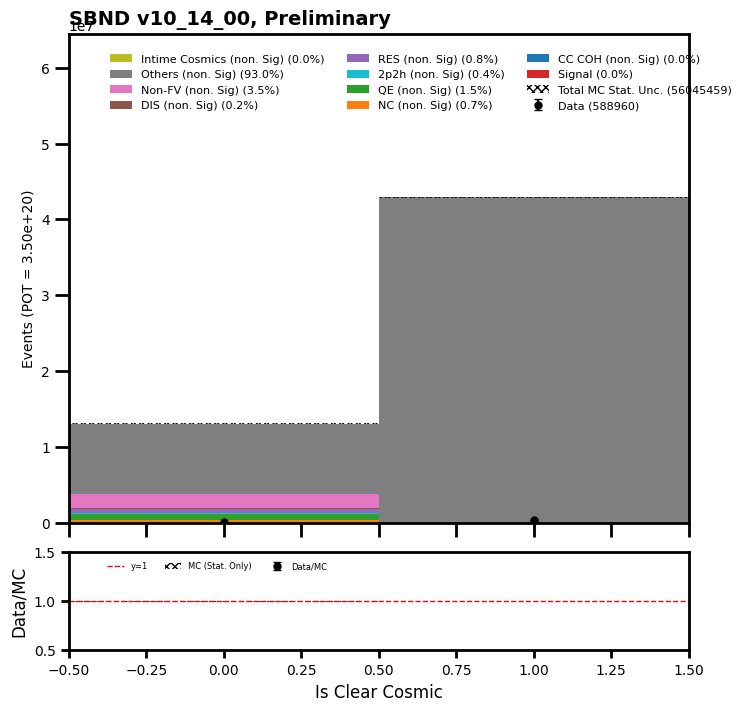

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  123118
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0 80827  8565  7761  7941  6788  4888  3102  1730   841   353
   173    79    39    19     4     4     1     2     0     0     0     1
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00

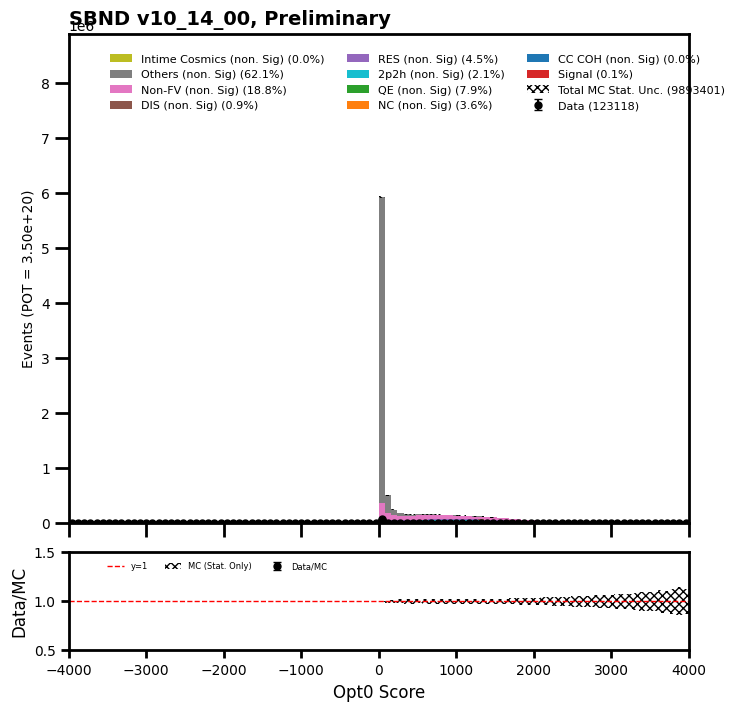

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  588960
[     0      0 441605      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      4    316   3945  14887  30685
  35264  25104  15047   9993   6979   4225    889     17      0      0
      0      0      0      0]
[0.0000000e+00 0.0000000e+00 4.2933864e+07 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.3760000e+03 6.9844000e+04 5.9119494e+05 1.7141311e+06 2.7068548e+06
 2.7652060e+06 1.9116992e+06 1.2296258e+06 8.8875569e+05 6.7087412e+05
 4.5103688e+05 1.1337315e+05 3.6748237e+03 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan 0.01

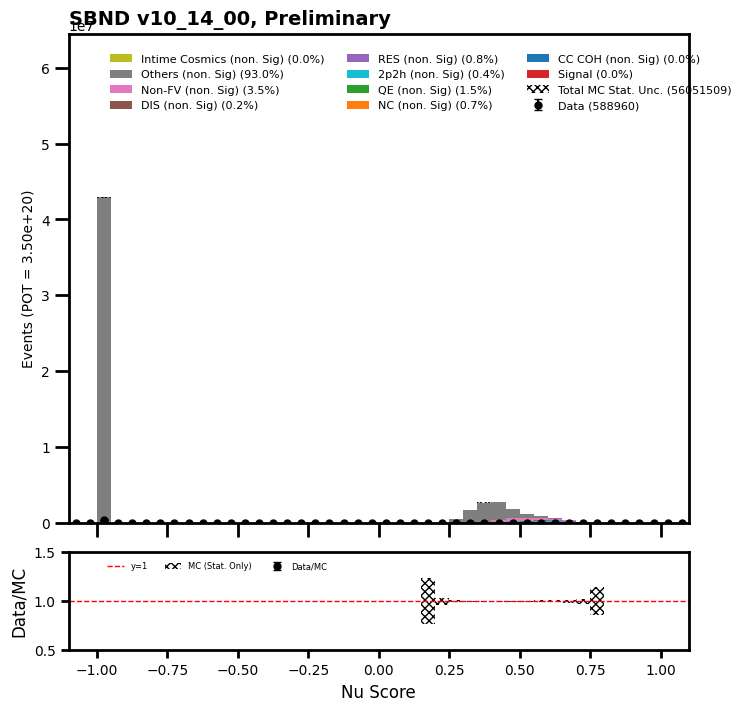

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  588820
[    0     0     0     0     0     0     0     0     0     0   144 17036
  2948  3350  3590  3416  8879  5008  4922  4914  5022  5071  5320  5426
  5509  5566  5595  5542  5766  5770  5788  5834  5960  6093  6284  6318
  6400  6589  6500  6814  6768  6938  7002  7264 39216 10940 11663 11981
 11684 10569 10063 11388 11541 11413 10956 39514  7152  7327  7063  6971
  6761  6757  6378  6526  6312  6259  6099  6002  5876  6000  5823  5578
  5622  5632  5431  5391  5246  5083  5036  4902  4829  4885  4820  8231
  3337  3609  3368  3084 16925   231     0     0     0     0     0     0
     0     0     0     0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 7.64908524e+01 0.00000000e+00
 0.00000000e+00 7.64908524e+01 1.13206455e+04 1.59437212e+06
 2.90947875e+05 3.03414375e+05 3.18023750e+05 3.03663250e+05
 8.08126062e+05 4.60285094e+05 4.71455375e+05 4.74518656e+05
 4.75976344e+05 4.88673688e+05 4.78347844e+05 5.19198375e+05
 5.

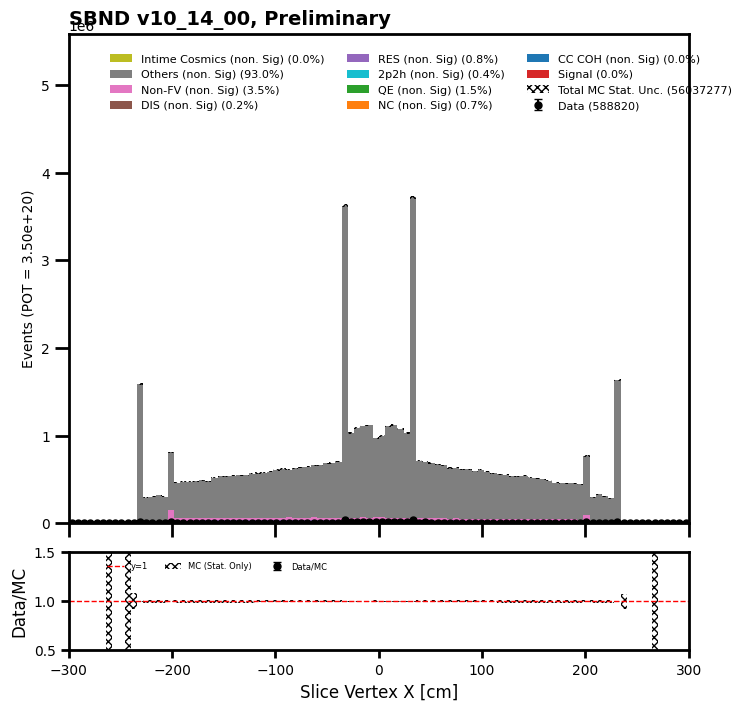

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  588805
[     0      0      0      0      0      0      0      0      2      1
      0      1      0      0      0     21   8491   2812   2605   3042
   3174   3425   3550   3670   3887   3947   4168   4118   4201   4357
   4659   4586   4427   4554   4715   4955   4746   4766   4858   4771
   5084   5153   4955   5110   5059   5639   5058   5059   5274   6373
   5302   5107   5802   5268   5476   5488   5957   5544   5699   5800
   5780   5779   5818   6080   6072   6236   6069   6130   6344   6565
   6629   6710   6600   6977   7121   7084   7293   7643   7798   8035
   8421  10019  15347 197415  13939     70     35     32      8      4
      8      5      8      3      7      1      0      1      0      3]
[7.6490852e+01 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 7.6490860e+01 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 7.6490845e+01 7.6490845e+01 0.0000000e+00 7.6490852e+01 7.6490860e+01
 2.2335332e+04 6.6379181e+05 1.6307766e+05 2.0790189e+0

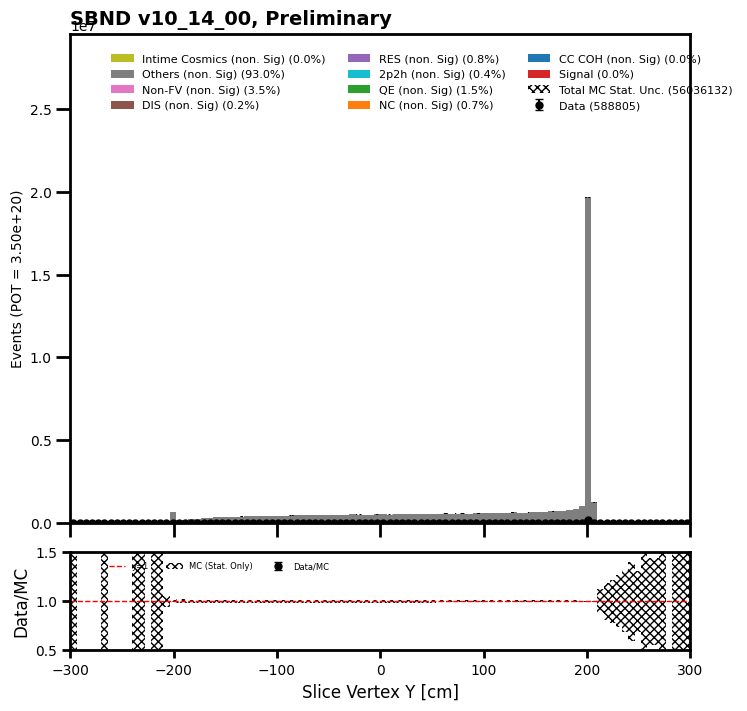

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  588813
[    2     0     0     1     0     0     0     2     0     1     1     6
     9 12279 37602  6428  6473  6561  6984  6955  7048  7048  7075  6737
  6667  7229  7032  7059  7116  7146  7245  6999  7133  7154  7206  6969
  7528  7106  7296  7356  7164  7292  7082  7179  7150  7256  7155  7127
  6194  6720  8005  7951  7806  7433  7367  7396  7273  7348  7229  7483
  7375  7292  7324  7340  7262  7201  7438  7513  7117  7245  7558  7419
  7390  7287  7525  7358  7291  7466  7448  7321  7387  7590  7590  7836
  7590 20487 12083    11     0     2     0     0     0     1     0     0
     0     2     1     0]
[0.0000000e+00 7.6490860e+01 0.0000000e+00 7.6490845e+01 0.0000000e+00
 0.0000000e+00 0.0000000e+00 7.6490845e+01 2.2947256e+02 7.6490845e+01
 3.0596344e+02 3.8245422e+02 7.6490845e+02 4.9527994e+05 4.0703845e+06
 6.2392800e+05 6.2989250e+05 6.5490650e+05 6.7640406e+05 6.5858031e+05
 6.7633281e+05 6.6317450e+05 6.8620175e+05 6.5231212e+05 6.7090088e+05
 6.8497562e+05

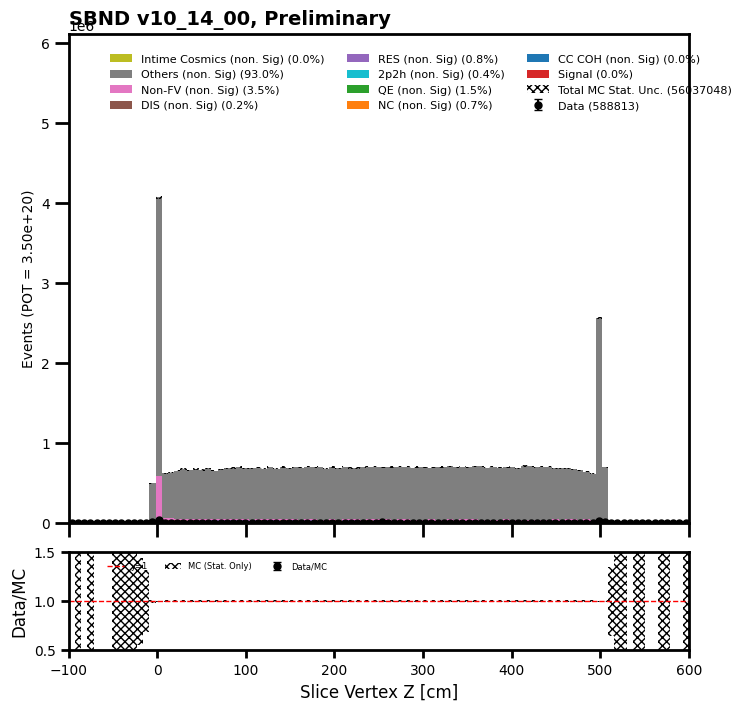

total data =  501014
[13995 24413 19753 18975 18965 18592 18440 18229 17977 17623 17185 16776
 16220 15777 15388 14882 14541 14103 13124 12971 12676 12012 11310 10830
 10461  9732  9239  8847  8397  7794  7405  7032  6915  6469  6352  5929
  5479  5392  5078  5736]
[1399033.1  2148553.8  1565395.4  1551319.2  1601276.   1636017.8
 1644278.9  1630431.   1630658.2  1640149.8  1616974.4  1567403.1
 1549428.9  1515692.4  1488458.9  1459770.   1404462.8  1358636.9
 1319087.5  1268828.5  1233715.1  1191639.8  1121182.   1060444.
 1010102.5   965505.3   927790.75  890002.9   821454.25  778921.75
  750847.44  708695.94  698447.44  658047.94  622406.56  589659.2
  571988.7   536876.6   519284.1   517065.3 ]
data ratio  [0.01000334 0.01136253 0.01261854 0.01223152 0.01184368 0.01136418
 0.01121464 0.01118048 0.01102438 0.01074475 0.01062787 0.01070305
 0.01046837 0.0104091  0.01033821 0.01019476 0.01035343 0.01038026
 0.0099493  0.01022282 0.01027466 0.01008023 0.01008757 0.0102127
 0.01035637 0

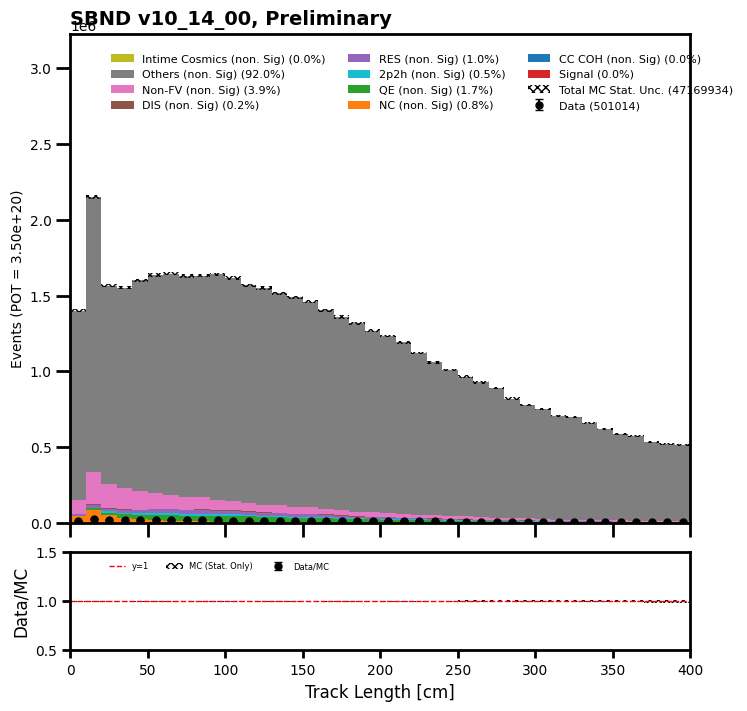

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  147317
[   0    0    0    0    0    0    0    0    0    0   16   36   68  118
  199  277  414  539  787 1101 1606 2447 3649 4138 3992 3943 4787 5883
 6727 6779 6888 6828 6676 6795 6816 7297 7514 7830 7455 7636 7222 7124
 6512 5185 1931  102    0    0    0    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 7.64921875e+01 3.80492188e+02 1.22344006e+03 2.45193066e+03
 6.65277588e+03 1.03990811e+04 1.83648359e+04 2.61594414e+04
 4.46011172e+04 6.54790156e+04 9.17120000e+04 1.28443195e+05
 1.76476125e+05 2.45255844e+05 3.51583750e+05 3.81492812e+05
 3.30780719e+05 2.96736281e+05 3.41642938e+05 4.49966906e+05
 5.56680812e+05 5.81085000e+05 6.07619938e+05 5.90414000e+05
 5.73583750e+05 5.87196938e+05 6.06329625e+05 6.34947250e+05
 6.67688875e+05 7.03872125e+05 6.84215000e+05 6.78010812e+05
 6.68834250e+05 6.67540438e+05 6.26991688e+05 4.99388000e+05
 1.99739969e+05 1.03359844e+04 0.00000000e+00 0.00000

/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


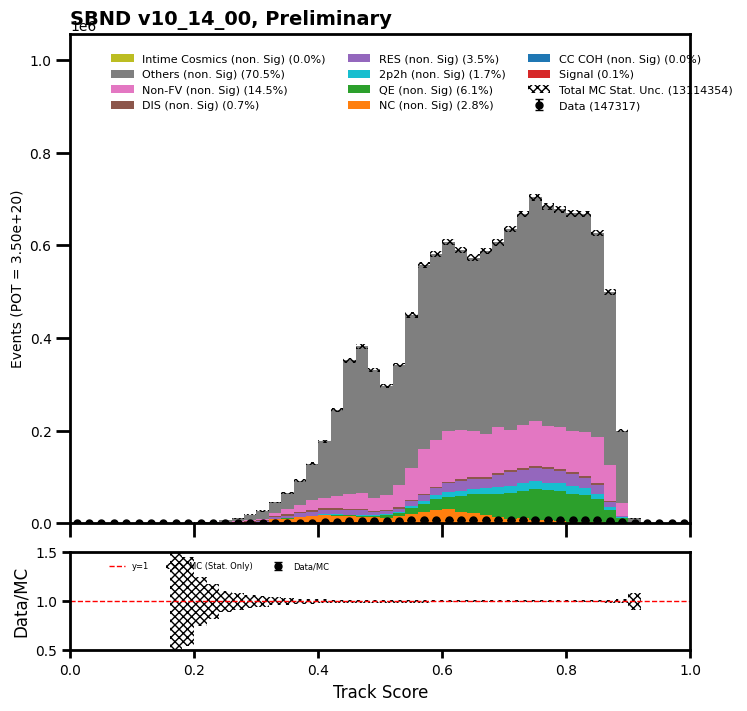

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  588861
[    0     0     0     0     0     0     0     0     0     0   145 17003
  2958  3354  3593  3433  8860  5014  4917  4901  5054  5073  5290  5440
  5495  5561  5585  5526  5777  5775  5770  5837  5959  6117  6260  6343
  6375  6589  6526  6817  6785  6944  6984  7276 39182 10955 11663 11978
 11670 10637 10128 11401 11507 11438 10971 39473  7157  7285  7111  6972
  6757  6757  6399  6513  6364  6257  6051  5995  5889  5956  5833  5606
  5640  5644  5434  5379  5237  5079  5010  4896  4832  4888  4797  8231
  3341  3603  3373  3098 16908   230     0     0     0     0     0     0
     0     0     0     0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 7.64908524e+01 0.00000000e+00
 0.00000000e+00 7.64908524e+01 1.13971377e+04 1.59192475e+06
 2.91559625e+05 3.04562000e+05 3.18023250e+05 3.03663250e+05
 8.06366750e+05 4.59137906e+05 4.71837625e+05 4.75513000e+05
 4.76434812e+05 4.88368719e+05 4.78270812e+05 5.19504344e+05
 5.

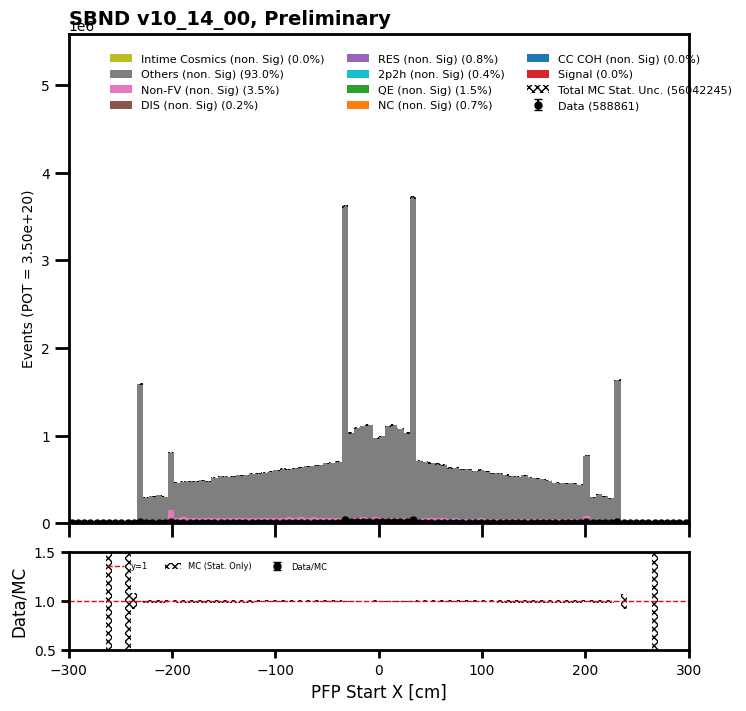

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  588844
[     0      0      0      0      0      0      1      0      3      4
      1      2      4      3      7     37   8582   2779   2581   3007
   3171   3437   3548   3657   3859   3956   4177   4105   4217   4342
   4692   4576   4441   4547   4723   4988   4726   4762   4831   4779
   5096   5149   4941   5103   5088   5643   5046   5087   5261   6377
   5329   5078   5776   5271   5472   5494   5961   5551   5706   5773
   5790   5766   5804   6077   6044   6202   6043   6140   6358   6507
   6632   6713   6617   6937   7079   7062   7331   7616   7835   7960
   8447   9901  15326 197599  14069    102     45     38     11      4
      9      8      8      3      8      1      0      2      0      3]
[7.64908524e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.64908447e+01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.64908524e+01 1.52981689e+02 2.29472565e+02
 7.64908447e+01 2.29472549e+02 3.82454224e+02 2.51654980e+04
 6.65704062e+05 1.601712

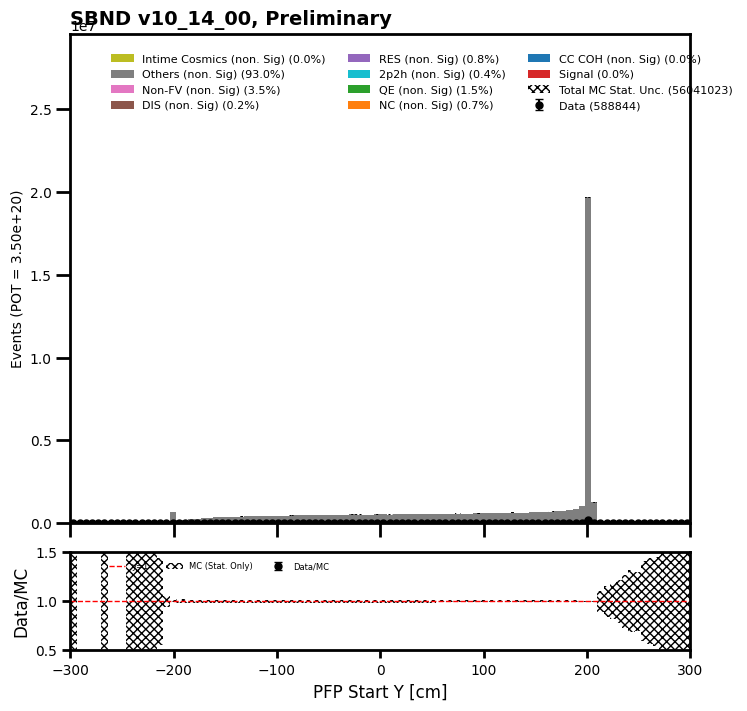

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 - lolims), 1 - uplims]) * err


total data =  588845
[    2     0     0     3     0     0     2     2     2     1     7     7
    19 12393 37287  6371  6452  6526  6985  6948  7036  7025  7052  6714
  6668  7198  7006  7075  7113  7124  7247  6966  7121  7158  7211  6942
  7554  7078  7304  7346  7179  7279  7039  7226  7145  7257  7161  7103
  6171  6633  8121  7976  7769  7430  7388  7392  7314  7337  7226  7479
  7397  7261  7335  7362  7281  7208  7485  7485  7093  7271  7587  7404
  7405  7321  7507  7375  7289  7482  7471  7332  7418  7624  7602  7856
  7580 20654 12158    13     5     5     1     1     0     1     1     0
     2     2     1     0]
[7.6490845e+01 7.6490845e+01 7.6490845e+01 7.6490845e+01 2.2947260e+02
 1.5298169e+02 0.0000000e+00 7.6490845e+01 1.5298169e+02 3.8245422e+02
 2.2947290e+02 3.8245435e+02 9.1788977e+02 4.9772766e+05 4.0524075e+06
 6.1811419e+05 6.2683262e+05 6.4871012e+05 6.7403325e+05 6.5529031e+05
 6.7533844e+05 6.6080306e+05 6.8474925e+05 6.5200456e+05 6.6600569e+05
 6.8382869e+05

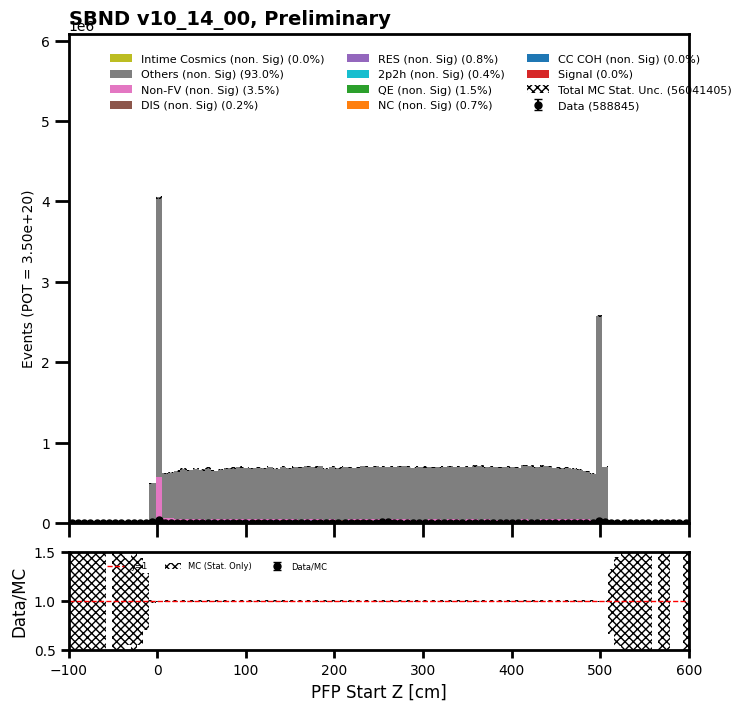

total data =  42235
[1647 1333 2566 2624 2714 2593 2473 2493 2313 2392 2285 2190 2443 1887
 1159  562  652  531  619  399  309  335  332  346  394  298  403  338
  375  318  351  280  298  296  280  261  242  366  295  243]
[  33736.848 1485154.6   3523851.    3499165.    3531746.    3558154.2
 3536652.8   3578575.2   3488462.2   3593506.    3514710.2   3501937.
 3501170.    3009578.     104198.49    77948.5     62426.484   62041.5
   59666.484   46210.      56528.984   55776.984   50716.5     49111.484
   58599.97    42304.      38404.984   38782.5     45593.953   33736.992
   32355.977   29454.5     34731.46    33435.484   37404.984   34649.484
   28998.484   37405.484   36030.      40478.   ]
data ratio  [0.04881902 0.00089755 0.00072818 0.00074989 0.00076846 0.00072875
 0.00069925 0.00069665 0.00066304 0.00066565 0.00065012 0.00062537
 0.00069777 0.000627   0.011123   0.00720989 0.01044429 0.00855879
 0.01037433 0.00863449 0.00546622 0.00600606 0.00654619 0.0070452
 0.00672355 0.00

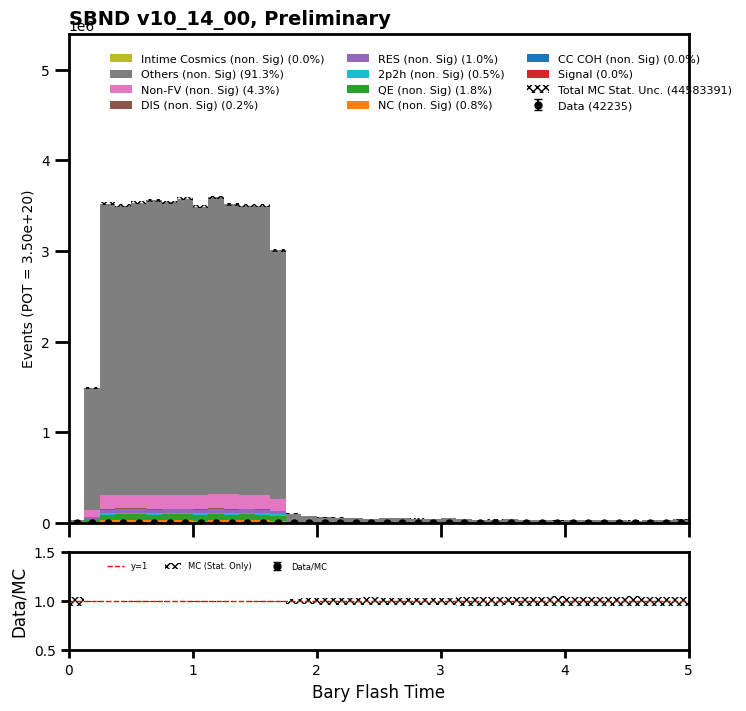

total data =  520787
[492863  11796   5251   3002   1901   1318    836    646    550    385
    300    256    234    172    150    124    119    101     95     70
     63     62     48     59     29     49     43     22     30     34
     23     20     22     19     14     20     15     22      9     15]
[4.3867324e+07 9.5919844e+05 3.6145812e+05 1.7257159e+05 9.9069531e+04
 5.9362801e+04 4.3141117e+04 2.8770977e+04 2.1801100e+04 1.4228257e+04
 1.2999155e+04 9.0237344e+03 8.1183428e+03 6.3473740e+03 4.5853906e+03
 4.2064375e+03 4.8244219e+03 3.1384297e+03 2.6774219e+03 2.3714609e+03
 2.6034453e+03 2.3709141e+03 1.2999688e+03 1.2239609e+03 1.1464688e+03
 9.9447656e+02 1.2239766e+03 1.0705000e+03 1.4524766e+03 9.1794531e+02
 6.1150000e+02 6.1196875e+02 6.8846875e+02 6.1146875e+02 5.3549219e+02
 5.3550000e+02 1.5300000e+02 5.3898438e+02 6.1149219e+02 2.2950000e+02]
data ratio  [0.01123531 0.01229777 0.01452727 0.01739568 0.01918854 0.02220246
 0.01937826 0.02245318 0.02522809 0.02705883 0

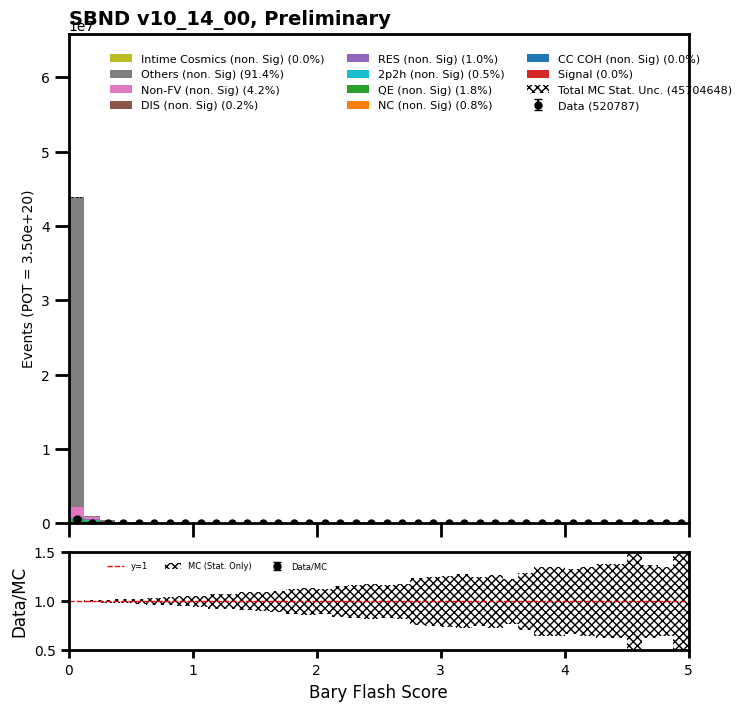

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  588722
[     0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
 578014   7251   2046    820    388    144     44     13      2      0
      0      0      0      0      0      0      0      0      0      0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 5.5009728e+07 6.9898362e+05 1.8972159e+05 7.5046391e+04 3.4424398e+04
 1.4837992e+04 4.4409912e+03 6.9200000e+02 7.6000000e+01 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan  

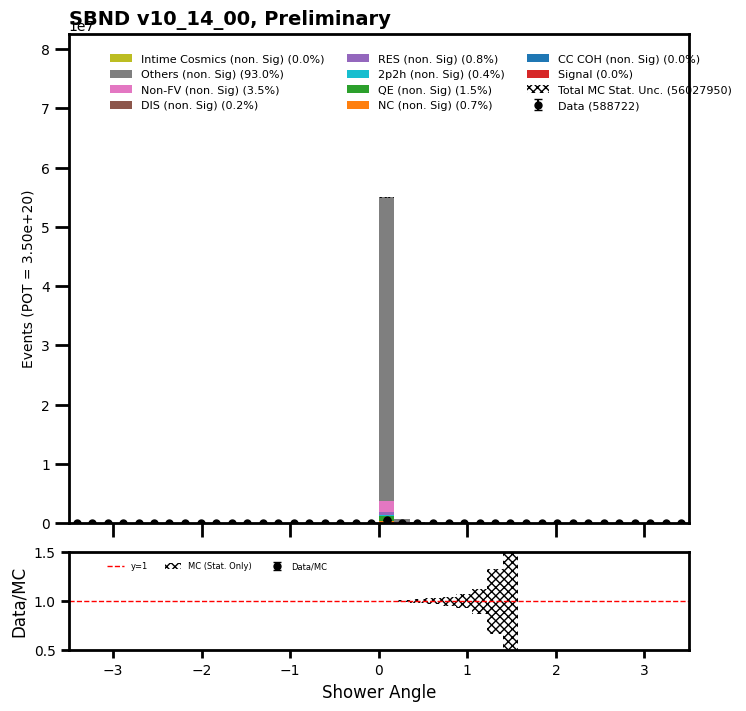

total data =  583122
[531693  30961   8269   2642   1533   1086    882    641    466    390
    338    309    271    245    239    208    195    179    162    183
    149    139    158    132    146    150    133    112    110    108
     93    109     82    101     84     95     99     68     93     69]
[5.17085040e+07 2.09598562e+06 6.26831000e+05 2.28435422e+05
 1.29050398e+05 9.03441953e+04 6.80834453e+04 5.63085508e+04
 4.35993125e+04 3.52712188e+04 2.78373340e+04 2.50173789e+04
 2.08099355e+04 2.26408750e+04 2.09643730e+04 2.01898750e+04
 1.82909199e+04 1.62203965e+04 1.31564346e+04 1.40719668e+04
 1.54554297e+04 1.61439512e+04 1.39969141e+04 1.56844453e+04
 1.26954609e+04 1.15529531e+04 1.20094531e+04 1.14789766e+04
 1.11684375e+04 9.25296094e+03 1.03234453e+04 8.49442969e+03
 9.94848438e+03 9.40496875e+03 8.34348438e+03 9.09646875e+03
 8.41948438e+03 7.49346094e+03 8.11746875e+03 6.65393750e+03]
data ratio  [0.01028251 0.01477157 0.01319175 0.01156563 0.01187908 0.01202069
 0.0

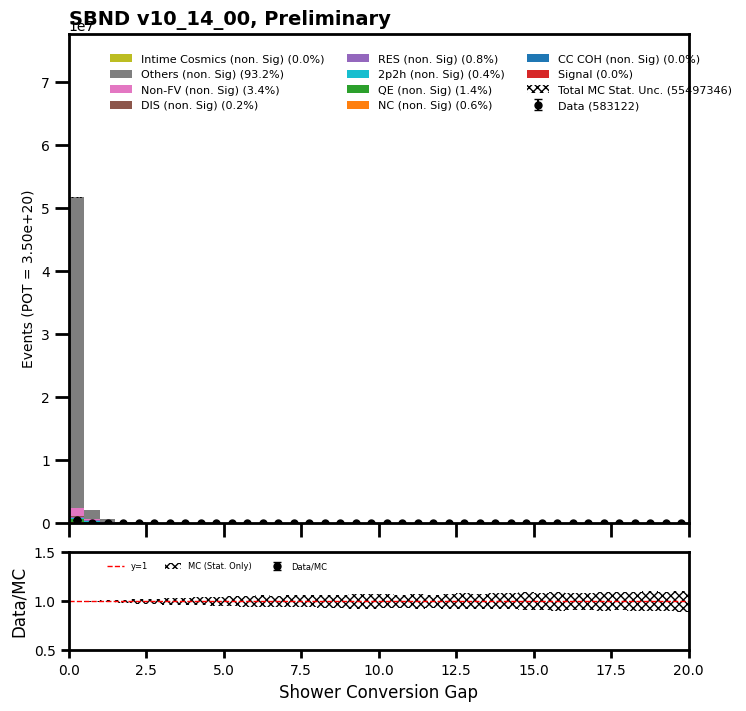

total data =  362189
[   864  10588  61358 175192  49626  15451   9028   7470   7286   6234
   5010   3524   2303   1481    986    711    586    442    418    337
    324    344    316    335    289    295    215    208    147    140
     98     97     90     70     65     62     51     53     61     34]
[2.7844893e+04 2.4104945e+05 4.0018975e+06 2.2625552e+07 4.0801940e+06
 1.2586482e+06 8.2764625e+05 8.5594650e+05 7.7540075e+05 6.6806550e+05
 5.4390644e+05 3.4800078e+05 2.1833644e+05 1.4565005e+05 1.0189409e+05
 7.4669188e+04 5.3469188e+04 4.5906312e+04 4.4293301e+04 3.3884727e+04
 2.9300367e+04 3.2665207e+04 3.2434789e+04 3.8860250e+04 4.3609383e+04
 4.6821344e+04 3.9471344e+04 3.5188797e+04 2.5859914e+04 1.7052906e+04
 1.4689375e+04 1.2244836e+04 9.7858750e+03 8.4192734e+03 7.1909375e+03
 6.8014595e+03 6.8119531e+03 5.2029609e+03 4.5849297e+03 4.7469062e+03]
data ratio  [0.03102903 0.0439246  0.01533223 0.0077431  0.01216266 0.01227587
 0.01090804 0.00872718 0.00939643 0.00933142 0

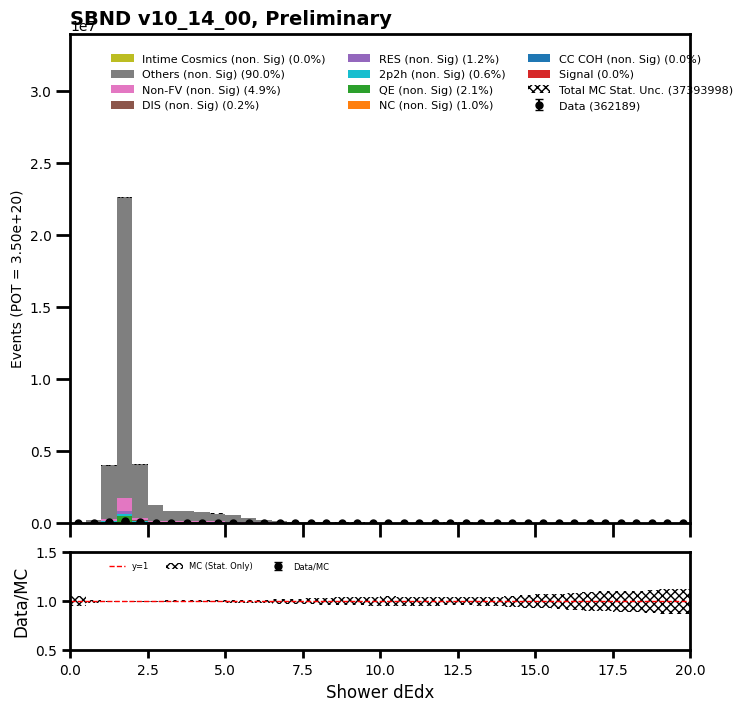

In [51]:
## Reco 1) Nocut
draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "no_cut")

## Neutrino Candidate Selection

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147355
[147355      0]
[13116268.91038049        0.        ]
data ratio  [0.01123452        nan]


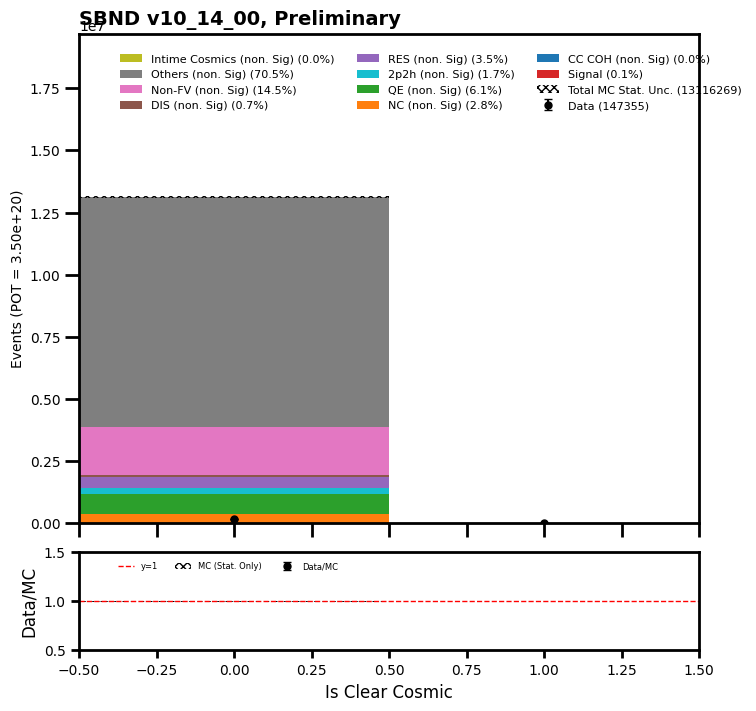

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  122459
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0 80304  8522  7744  7915  6765  4877  3093  1724   840   353
   173    79    39    19     4     4     1     2     0     0     0     1
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.

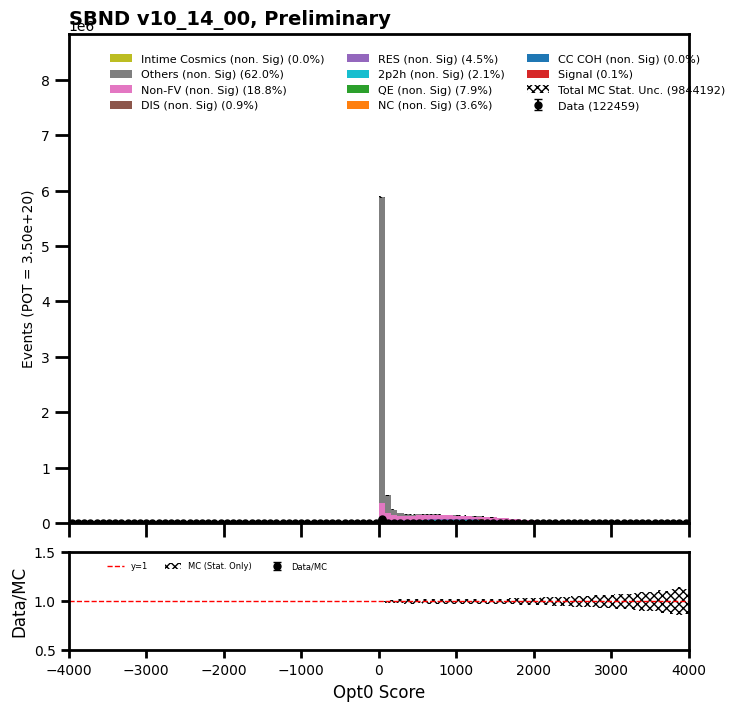

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147355
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     4   316  3945 14887 30685 35264 25104 15047  9993  6979  4225
   889    17     0     0     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.3768353e+03 6.9836062e+04 5.9111831e+05 1.7141310e+06 2.7068575e+06
 2.7652040e+06 1.9116968e+06 1.2296239e+06 8.8874962e+05 6.7088125e+05
 4.5103288e+05 1.1336915e+05 3.6708223e+03 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
     

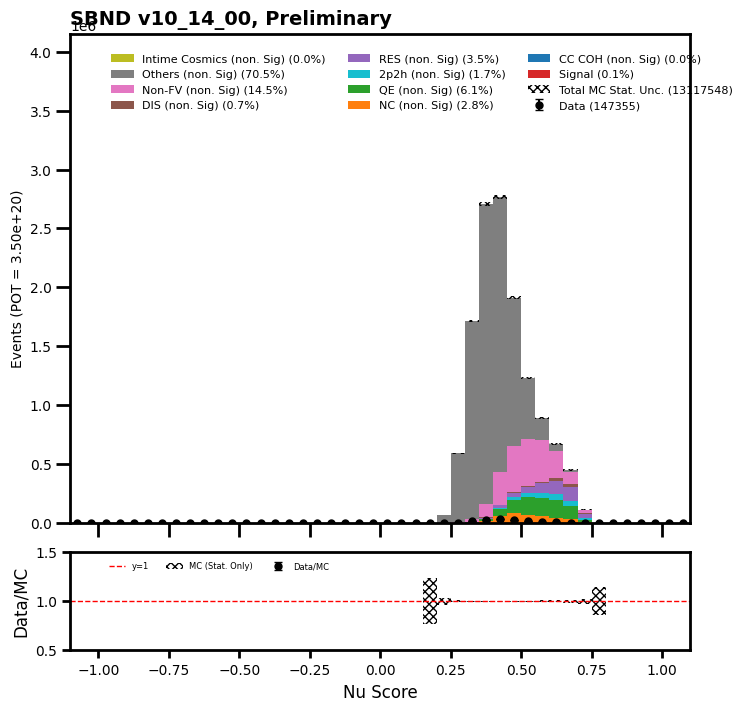

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147355
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0 3490 1975 2092 2132 2118 2235 2266 2326 2213 2386 2336 2297
 2332 2305 2339 2341 2334 2373 2353 2378 2289 2411 2236 2309 2249 2266
 2231 2249 2151 2146 2086 2110 1856 2290 2119 1850 1905 1920 2033 1974
 2077 2159 2118 2189 2162 2186 2068 2125 2094 2095 2164 2064 2065 2245
 2108 2030 2060 2133 2060 1987 1983 1980 1924 1895 1883 1803 1702 2695
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[     0.        0.        0.        0.        0.        0.        0.
      0.        0.        0.        0.        0.        0.        0.
      0.        0.   273532.94 179903.6  183642.38 186015.22 180911.84
 194841.72 197213.34 196065.89 200732.66 194153.58 203409.94 199508.6
 200349.33 201572.86 204326.73 203867.88 205550.39 209834.6  208533.53
 201036.33 207691.72 205702.47 196984.33 202185.58 192547.   200579.72
 192776.58 193311.78 188033.03 180460.06 187038.9

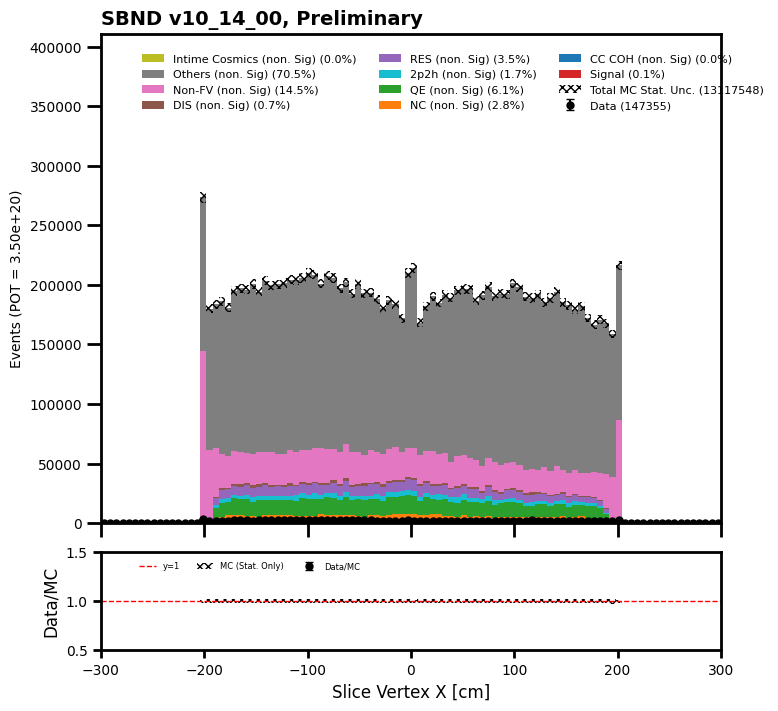

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  147352
[    0     0     0     0     0     0     0     0     1     1     0     0
     0     0     0    21  8411  2245  1467  1410  1370  1366  1333  1349
  1388  1271  1297  1256  1275  1283  1360  1332  1233  1311  1293  1382
  1392  1270  1325  1364  1347  1390  1399  1412  1378  1582  1444  1401
  1510  1687  1586  1544  1637  1541  1476  1486  1599  1514  1601  1671
  1600  1623  1664  1724  1754  1799  1732  1746  1844  1920  1991  2059
  2006  2151  2279  2337  2506  2658  2773  2974  3272  3953  4722 23344
   703     3     0     2     2     0     0     0     0     0     0     0
     0     0     0     0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.64908524e+01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 7.64908600e+01 7.64908447e+01
 0.00000000e+00 7.64908524e+01 7.64908524e+01 2.22588535e+04
 6.57121250e+05 1.23078141e+05 1.20707914e+05 1.16654680e+05
 1.15736977e+05 1.18720172e+05 1.18265562e+05 1.16200203e+05
 1.

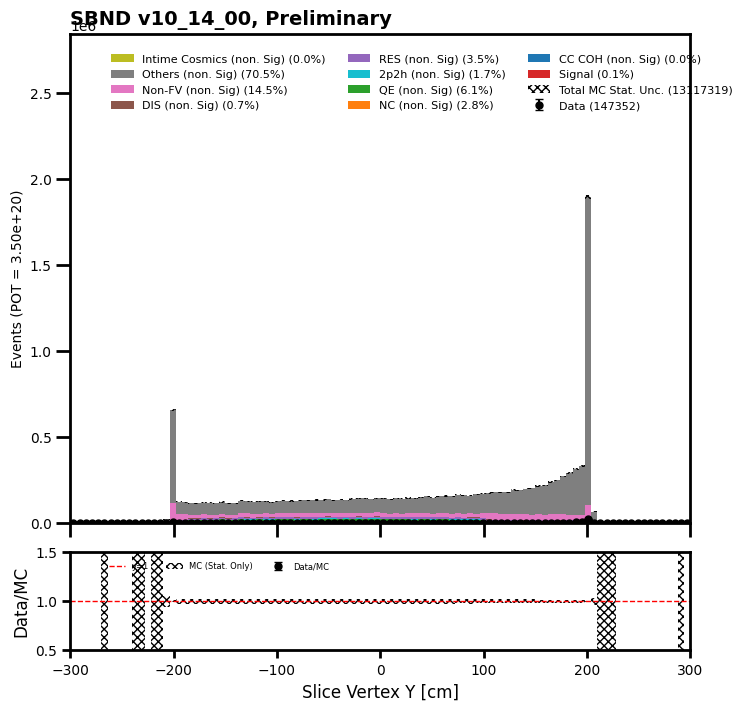

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  147355
[    1     0     0     0     0     0     0     0     0     0     0     2
     0  4202 18684  2413  1962  1758  1755  1659  1626  1693  1458  1537
  1490  1550  1531  1585  1553  1587  1555  1484  1569  1580  1528  1494
  1566  1550  1575  1617  1530  1594  1545  1552  1543  1632  1585  1657
  1517  1462  1924  1784  1758  1644  1618  1663  1582  1658  1649  1723
  1639  1672  1692  1690  1723  1722  1753  1714  1677  1716  1801  1814
  1793  1706  1887  1849  1843  1948  1990  2067  1996  2204  2304  2732
  2819  2952   467     1     0     0     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.5298170e+02 7.6490860e+01
 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.3982638e+05 1.7578622e+06
 2.0524800e+05 1.8183658e+05 1.7235055e+05 1.7273312e+05 1.6623086e+05
 1.6110536e+05 1.6141103e+05 1.4320488e+05 1.5666819e+05 1.5269025e+05
 1.5659019e+05

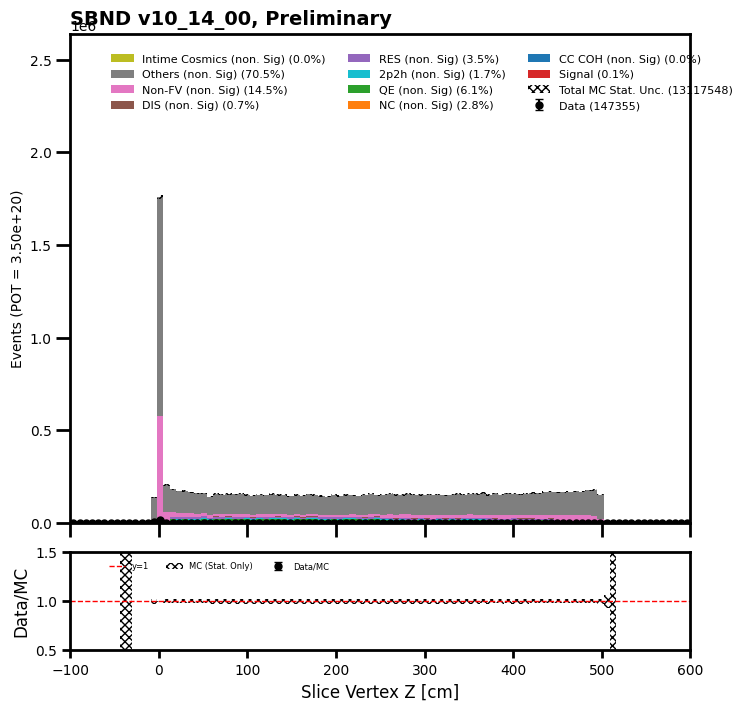

total data =  141148
[ 9211 13845  8769  7818  7179  6566  6160  5577  5259  5057  4735  4446
  4079  3925  3585  3429  3178  3033  2678  2746  2557  2406  2168  2124
  2054  1882  1789  1655  1554  1359  1368  1324  1142  1076  1100   998
   886   863   823   745]
[ 977724.6   1337633.9    750602.94   649931.1    593781.3    558438.5
  516057.62   476274.56   460362.56   434047.97   408197.84   382265.25
  360005.38   344401.9    320227.88   309364.3    291004.25   279682.44
  247093.5    239290.47   226362.1    209685.25   189336.5    187118.
  171053.02   164168.31   149709.75   145961.34   131732.27   125229.734
  119492.414  104727.91   104804.45   103274.93    93558.58    88740.195
   86214.7     78948.09    72980.11    61964.305]
data ratio  [0.00942085 0.01035037 0.01168261 0.01202897 0.01209031 0.01175779
 0.01193665 0.01170963 0.0114236  0.01165079 0.01159977 0.01163067
 0.01133039 0.01139657 0.01119515 0.01108402 0.0109208  0.01084444
 0.010838   0.01147559 0.01129606 0.0114

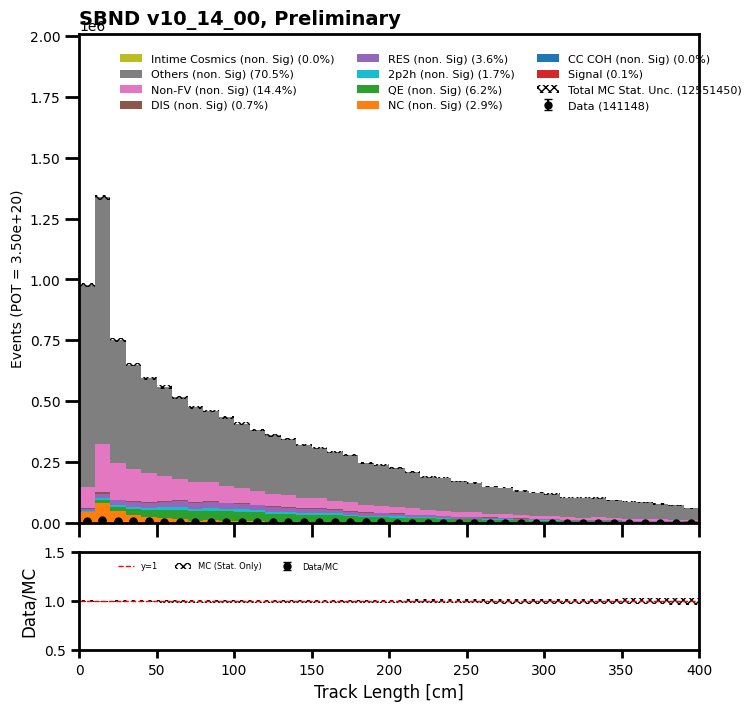

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147317
[   0    0    0    0    0    0    0    0    0    0   16   36   68  118
  199  277  414  539  787 1101 1606 2447 3649 4138 3992 3943 4787 5883
 6727 6779 6888 6828 6676 6795 6816 7297 7514 7830 7455 7636 7222 7124
 6512 5185 1931  102    0    0    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 7.6490845e+01 3.8245422e+02
 1.2238534e+03 2.4477090e+03 6.6547051e+03 1.0402746e+04 1.8357869e+04
 2.6159777e+04 4.4594117e+04 6.5476711e+04 9.1713414e+04 1.2843011e+05
 1.7645756e+05 2.4522000e+05 3.5158531e+05 3.8149528e+05 3.3077725e+05
 2.9673347e+05 3.4163894e+05 4.4996569e+05 5.5668131e+05 5.8108300e+05
 6.0762544e+05 5.9041388e+05 5.7358250e+05 5.8719894e+05 6.0632469e+05
 6.3494362e+05 6.6768988e+05 7.0387394e+05 6.8421200e+05 6.7801531e+05
 6.6883575e+05 6.6753544e+05 6.2699169e+05 4.9939000e+05 1.9974097e+05
 1.0326984e+04 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [

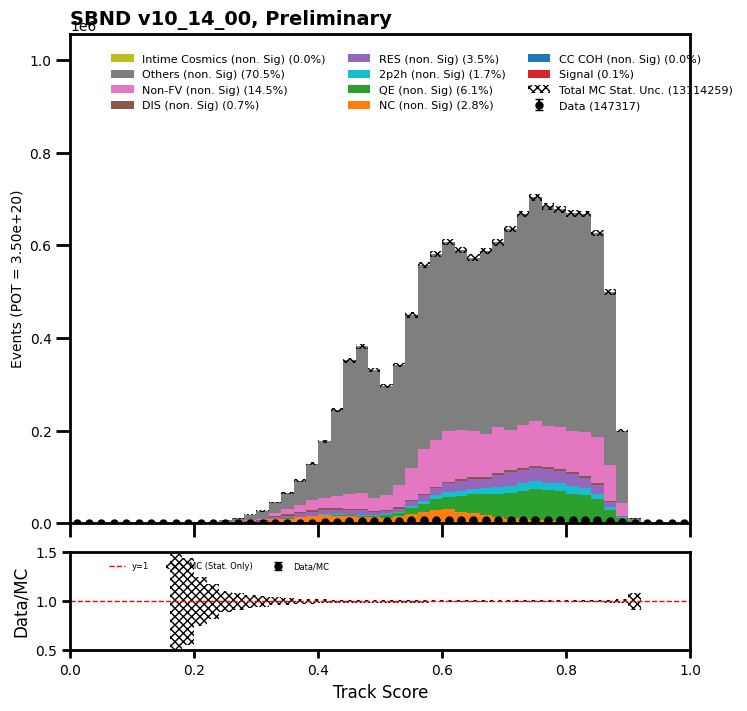

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147355
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0 3474 1981 2085 2114 2154 2234 2235 2341 2202 2379 2326 2282
 2339 2312 2322 2339 2336 2396 2328 2398 2268 2411 2260 2309 2266 2269
 2211 2255 2172 2130 2074 2101 1835 2370 2205 1844 1883 1916 2031 1966
 2081 2115 2158 2189 2156 2183 2088 2110 2144 2092 2113 2060 2074 2203
 2116 2058 2077 2148 2059 1975 1974 1977 1899 1886 1886 1806 1684 2691
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[     0.        0.        0.        0.        0.        0.        0.
      0.        0.        0.        0.        0.        0.        0.
      0.        0.   270702.84 178909.42 183948.38 186779.6  181676.83
 194459.25 196983.81 196065.86 200962.14 192853.12 198590.52 201803.47
 201267.31 203026.28 202949.92 205244.78 206544.94 208381.17 207309.6
 203254.5  206314.72 207232.52 197978.8  198666.66 191705.25 201650.7
 195148.06 194382.83 186350.12 181760.5  188415.89

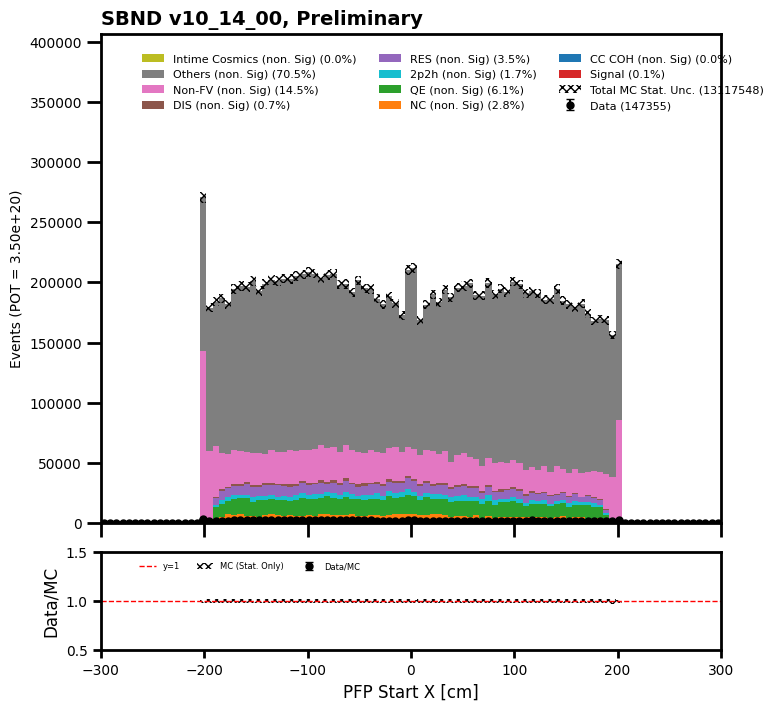

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  147350
[    0     0     0     0     0     0     1     0     2     4     1     1
     4     2     7    34  8492  2206  1439  1375  1362  1380  1327  1331
  1355  1283  1308  1238  1289  1265  1390  1320  1245  1301  1311  1406
  1371  1260  1305  1363  1359  1387  1389  1402  1409  1588  1433  1424
  1495  1694  1610  1517  1609  1534  1488  1486  1609  1520  1602  1649
  1602  1612  1658  1717  1723  1770  1702  1761  1851  1860  1996  2052
  2019  2111  2242  2312  2537  2631  2806  2893  3299  3823  4676 23628
   829    33     8     7     5     0     1     3     0     0     0     0
     0     1     0     0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.64908600e+01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.64908524e+01 1.52981720e+02 2.29472534e+02
 7.64908447e+01 1.52981689e+02 3.05963409e+02 2.50125391e+04
 6.58421938e+05 1.19712523e+05 1.19483656e+05 1.15889734e+05
 1.16960906e+05 1.19255758e+05 1.18647914e+05 1.14823312e+05
 1.

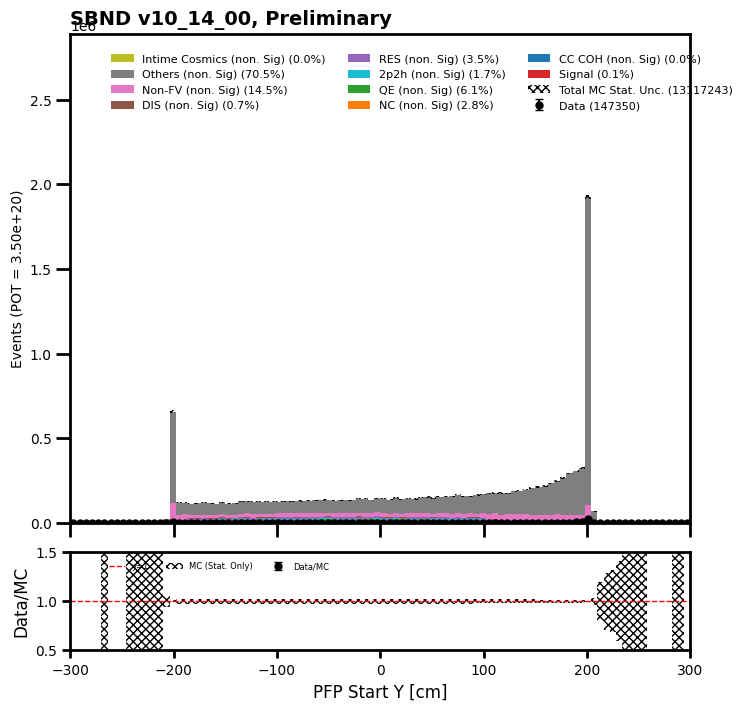

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  147346
[    1     0     0     2     0     0     1     1     2     0     6     3
    10  4312 18379  2359  1927  1728  1759  1647  1614  1676  1426  1506
  1486  1527  1504  1599  1550  1563  1559  1444  1557  1594  1529  1470
  1596  1526  1573  1608  1548  1580  1501  1600  1530  1627  1600  1632
  1492  1366  2042  1816  1720  1634  1637  1662  1617  1659  1646  1722
  1656  1636  1701  1716  1740  1729  1795  1691  1654  1747  1822  1799
  1808  1740  1871  1863  1840  1969  2011  2075  2030  2245  2307  2743
  2810  3118   541     2     5     2     1     1     0     0     1     0
     2     0     0     0]
[7.6490845e+01 0.0000000e+00 7.6490845e+01 0.0000000e+00 2.2947260e+02
 1.5298169e+02 0.0000000e+00 0.0000000e+00 7.6490845e+01 2.2947253e+02
 7.6490845e+01 0.0000000e+00 1.5298169e+02 1.4189169e+05 1.7402678e+06
 1.9889872e+05 1.7892969e+05 1.6668966e+05 1.6990280e+05 1.6309436e+05
 1.6003448e+05 1.5873359e+05 1.4175134e+05 1.5651511e+05 1.4695311e+05
 1.5521322e+05

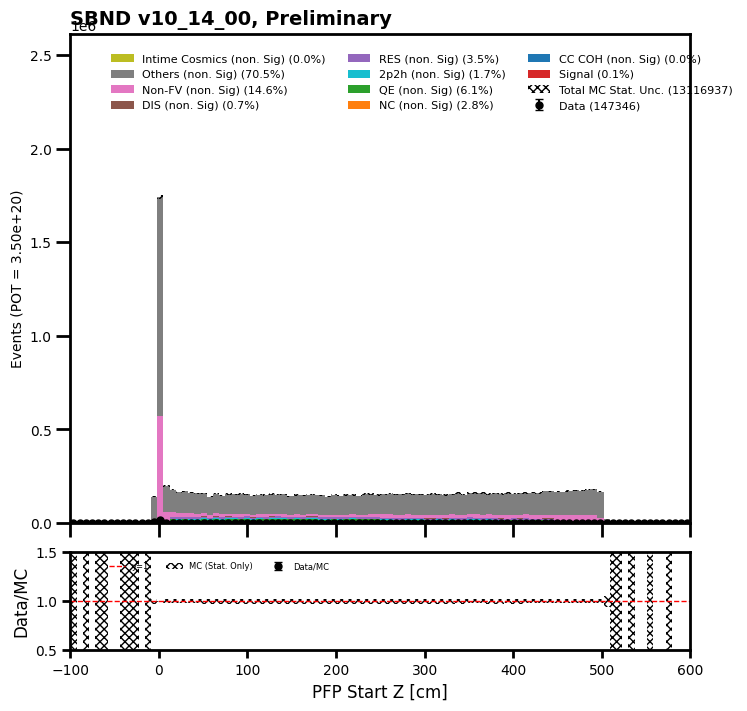

total data =  10921
[454 360 685 737 692 662 670 635 613 595 581 578 606 484 274 135 159 139
 159  95  70  86  92  96 110  77 100  80  83  85  89  63  71  71  68  78
  52  95  80  62]
[  7955.8467 346299.9    796014.1    784638.25   794505.4    803153.1
 787092.4    812719.9    794670.1    814714.3    811429.3    794677.6
 795059.6    689949.25    22031.992   15606.      11322.484   14152.5
  13540.484   10939.      14229.984   12850.984   10940.      10786.484
  13157.969    9333.       9332.484    9410.5     10632.953    7190.992
   7267.9766   6272.5      8032.961    7572.9844   8797.484    7649.4844
   6044.4844   9332.484    9333.       8644.    ]
data ratio  [0.05706495 0.00103956 0.00086054 0.00093929 0.00087098 0.00082425
 0.00085123 0.00078133 0.00077139 0.00073032 0.00071602 0.00072734
 0.00076221 0.0007015  0.01243646 0.00865052 0.01404285 0.00982159
 0.01174256 0.00868452 0.00491919 0.00669209 0.00840951 0.00890003
 0.00835995 0.00825029 0.01071526 0.00850114 0.00780592 0.0

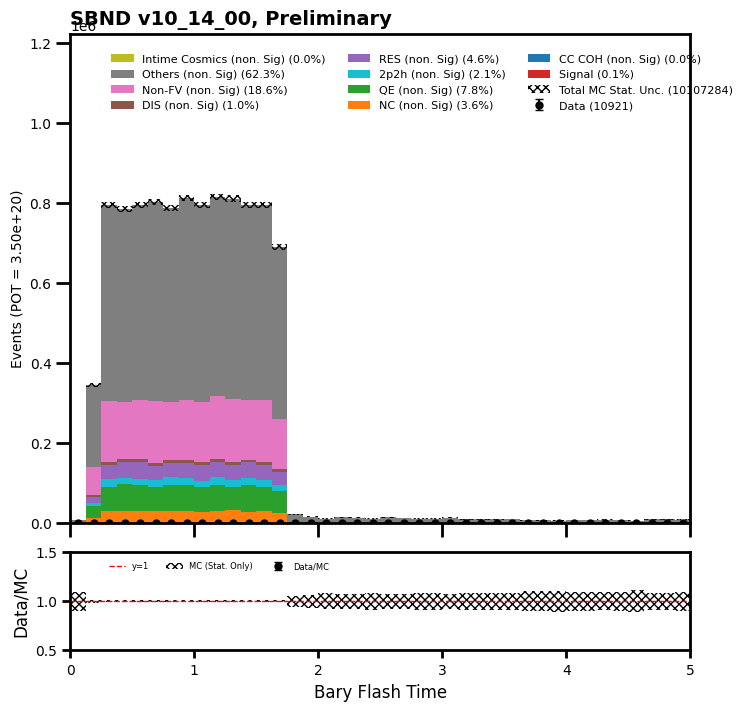

total data =  126559
[104567   9282   4212   2375   1474   1051    666    498    424    301
    220    203    184    133    114     94     84     79     80     51
     46     49     32     46     22     39     36     15     25     25
     19     11     19     14     10     15     10     15      5     14]
[8.6350920e+06 8.7604238e+05 3.4271369e+05 1.6332409e+05 9.4398531e+04
 5.7067301e+04 4.0774617e+04 2.7844977e+04 2.0577598e+04 1.3769757e+04
 1.2469154e+04 8.7212344e+03 7.4963428e+03 6.1203740e+03 4.5133906e+03
 4.0544375e+03 4.4369219e+03 2.8304297e+03 2.6774219e+03 2.3714609e+03
 2.5244453e+03 2.2949141e+03 1.2239688e+03 1.2239609e+03 1.1474688e+03
 9.9447656e+02 1.2239766e+03 9.9450000e+02 1.3764766e+03 9.1794531e+02
 5.3550000e+02 6.1196875e+02 6.8846875e+02 6.1246875e+02 5.3549219e+02
 5.3550000e+02 1.5300000e+02 5.3598438e+02 6.1149219e+02 2.2950000e+02]
data ratio  [0.01210954 0.01059538 0.01229014 0.01454164 0.01561465 0.01841685
 0.01633369 0.01788473 0.02060493 0.0218595  0

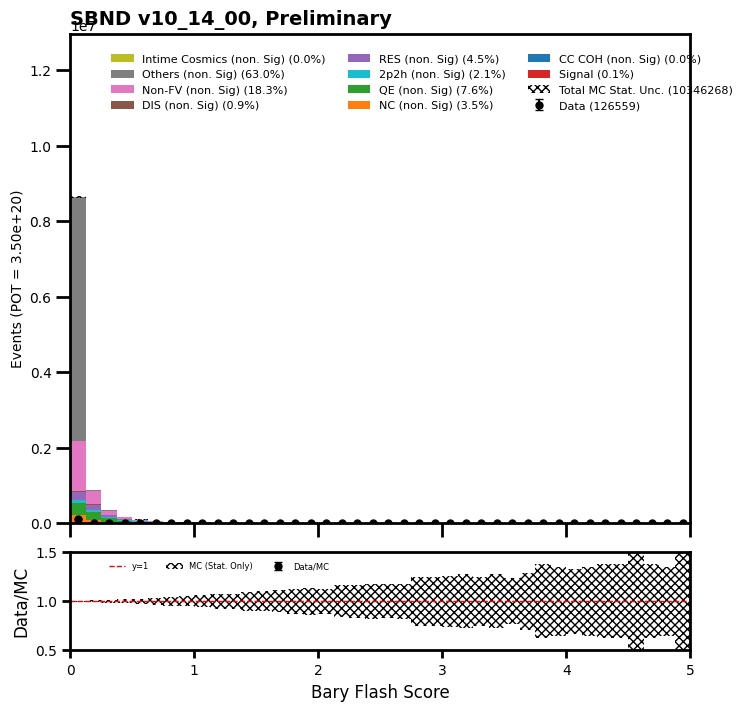

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  147299
[     0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
 138369   6239   1645    621    283     99     31     10      2      0
      0      0      0      0      0      0      0      0      0      0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.2236118e+07 6.1605362e+05 1.6095459e+05 5.7910891e+04 2.5933898e+04
 1.1245492e+04 3.0589907e+03 5.3600000e+02 7.6000000e+01 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan  

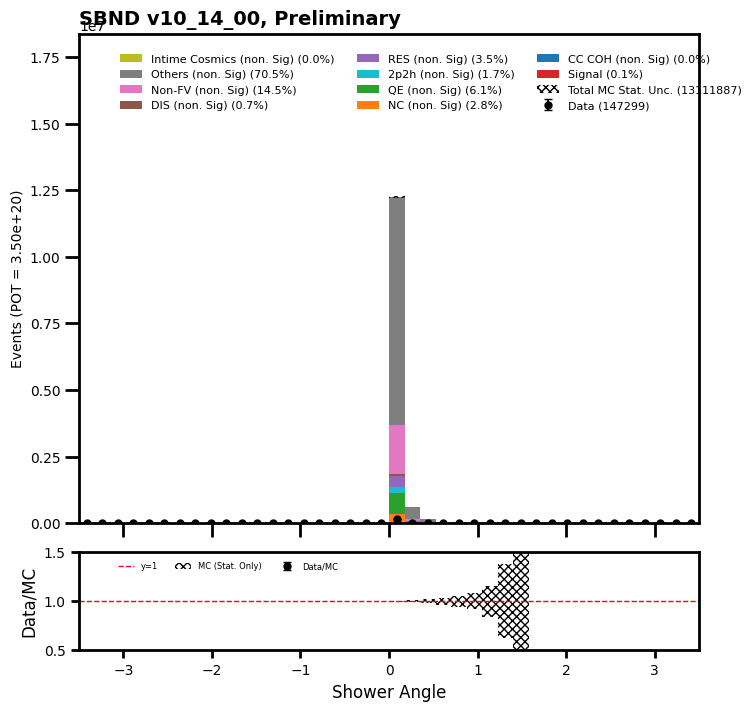

total data =  142083
[91732 30776  8207  2604  1500  1056   849   619   436   364   303   278
   238   217   209   169   169   164   133   162   123   124   137   116
   121   119   113    96    83    95    80    97    69    85    76    78
    87    61    78    60]
[8.9127070e+06 2.0793810e+06 6.1964406e+05 2.2605592e+05 1.2737040e+05
 8.8510195e+04 6.5713445e+04 5.4084551e+04 4.1615312e+04 3.2283219e+04
 2.5703834e+04 2.1266379e+04 1.8513436e+04 2.0042875e+04 1.8283373e+04
 1.7441875e+04 1.6294420e+04 1.4075396e+04 1.1475435e+04 1.2010967e+04
 1.3233430e+04 1.3922951e+04 1.2316914e+04 1.3999445e+04 1.1015961e+04
 9.5629531e+03 1.0327453e+04 1.0173977e+04 9.6394375e+03 8.2614609e+03
 9.1034453e+03 7.4204297e+03 8.7974844e+03 7.8029688e+03 6.8089844e+03
 7.6494688e+03 7.2674844e+03 6.3494609e+03 7.2674688e+03 5.5849375e+03]
data ratio  [0.01029227 0.01480056 0.0132447  0.01151927 0.01177668 0.01193083
 0.01291973 0.01144504 0.01047691 0.01127521 0.01178812 0.01307228
 0.01285553 0.01082

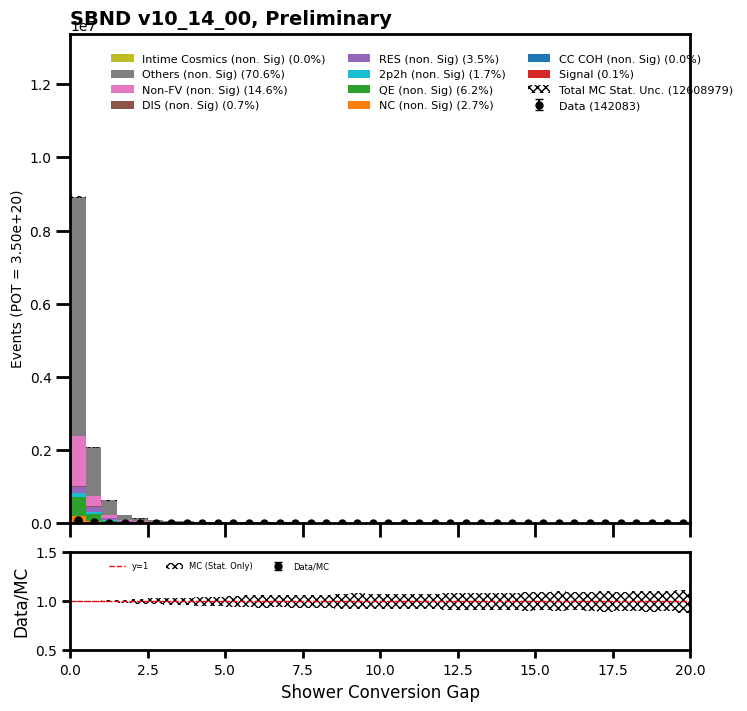

total data =  126576
[  330  2748 14943 50867 16912  6930  4447  4317  4833  4702  4078  2898
  1871  1182   785   528   453   336   327   275   265   281   263   297
   259   263   181   176   127   124    92    81    70    63    55    54
    41    44    52    26]
[1.8970938e+04 8.5065031e+04 8.6746669e+05 5.5125785e+06 1.3981776e+06
 5.9195181e+05 4.0743294e+05 4.3298156e+05 4.7926328e+05 5.0412850e+05
 4.5578256e+05 2.9360628e+05 1.7969744e+05 1.1727456e+05 8.0018594e+04
 5.6992184e+04 4.1997688e+04 3.6108812e+04 3.5724801e+04 2.8151225e+04
 2.3179867e+04 2.8074707e+04 2.8151812e+04 3.4501766e+04 3.9091383e+04
 4.4140344e+04 3.7025344e+04 3.2895312e+04 2.4174414e+04 1.5605406e+04
 1.3158375e+04 1.0709336e+04 8.9503906e+03 7.7262734e+03 6.1964375e+03
 5.8904595e+03 5.9674531e+03 4.7429609e+03 3.9774297e+03 4.3599062e+03]
data ratio  [0.01739503 0.0323047  0.01722602 0.00922744 0.01209574 0.01170703
 0.01091468 0.0099704  0.01008423 0.00932699 0.00894725 0.00987036
 0.01041195 0.01007

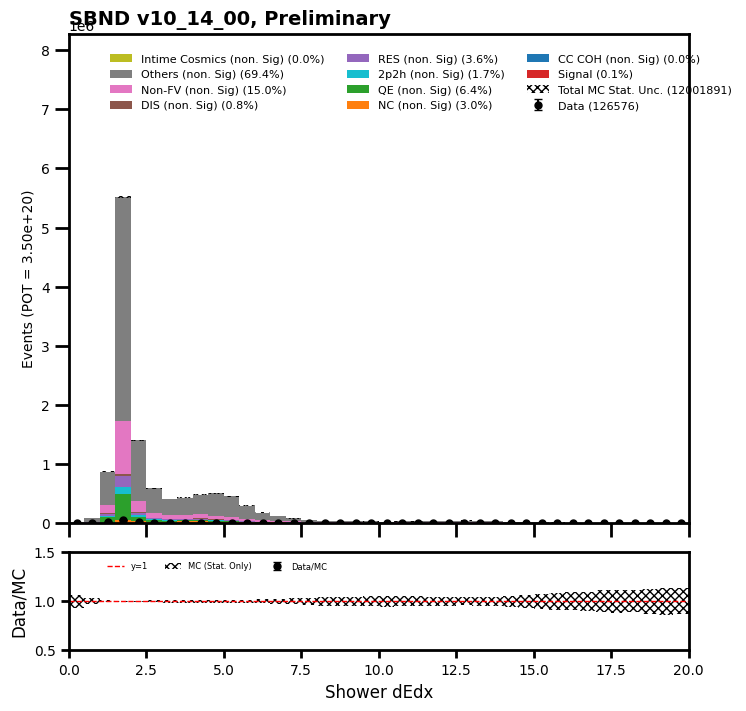

In [52]:
#Clear cosmic

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][mc_bnb_cosmic_dfs["evt"].slc.is_clear_cosmic == 0]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][data_offbeam_light_dfs["evt"].slc.is_clear_cosmic == 0]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][data_bnb_light_dfs["evt"].slc.is_clear_cosmic == 0]


draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic")

In [62]:
#opflash?

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  53796
[53796     0]
[5417005.67408661       0.        ]
data ratio  [0.00993095        nan]


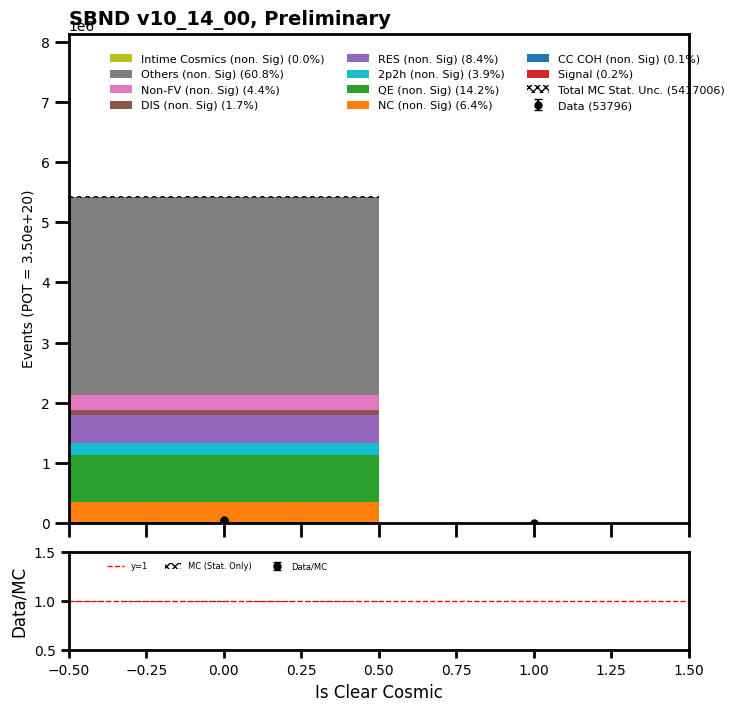

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  46006
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0 25107  3450  3672  4093  3670  2600  1703   947   433   176
    84    41    17    11     1     1     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0]
[      0.           0.           0.           0.           0.
       0.           0.           0.           0.           0.
       0.           0.           0.           0.           0.
       0.           0.           0.           0.           0.
       0.           0.           0.           0.           0.
       0.           0.           0.           0.           0

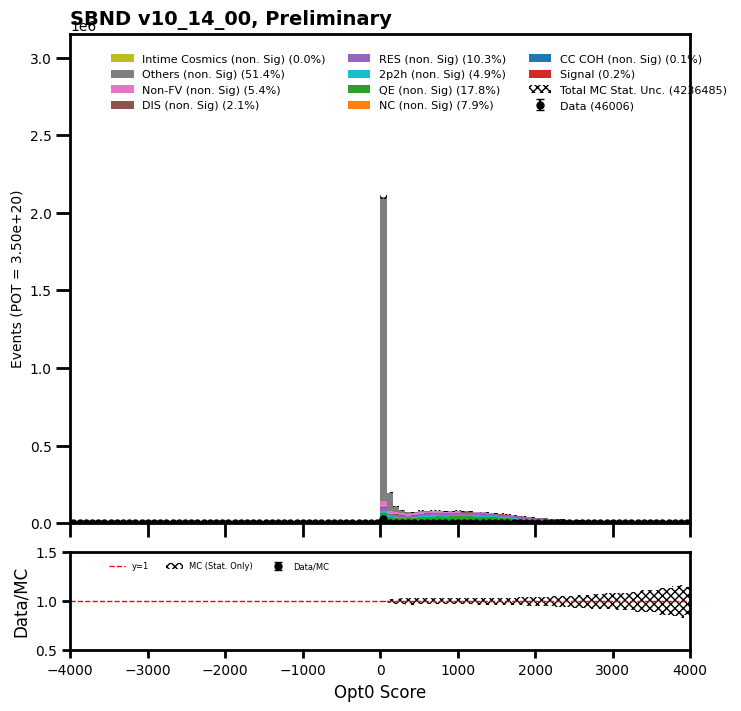

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  53796
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     2    72   924  3473  8581 12146  9557  6566  4992  4057  2792
   623    11     0     0     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 4.5894510e+02 1.0555746e+04 1.2322823e+05 4.2638338e+05 8.8846388e+05
 1.1417419e+06 8.8399575e+05 5.9848819e+05 4.6668856e+05 4.3670831e+05
 3.4729662e+05 9.0648383e+04 2.7538066e+03 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
      

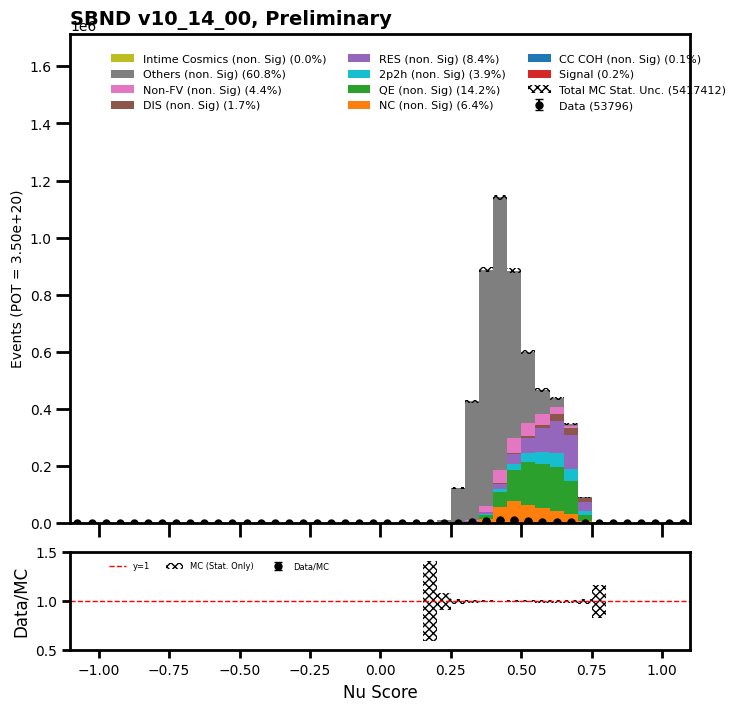

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc


total data =  53796
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0  638  921  940  981  988  988  959 1019  942  935
  971  939  954  946  909  990  931  878  859  947  873  859  924  821
  807  837  802  774  761  755  708  826  761  697  691  662  778  725
  733  771  799  825  814  802  760  820  814  829  796  823  841  887
  832  835  814  878  882  834  835  827  841  843  817  548    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[    0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.    63716.844 92325.484 88958.164
 97826.8   93161.266 94320.35  90801.875 88965.75  93096.62  91796.23
 92025.555 92024.586 91718.53  88658.516 95849.11  95007.89  93936.72
 86133.125 91028.98  90569.72  82997.68  90801.91  81851.445 82999.11
 83610.96  81315.51  80091.586 74736.92  79938.77  800

/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


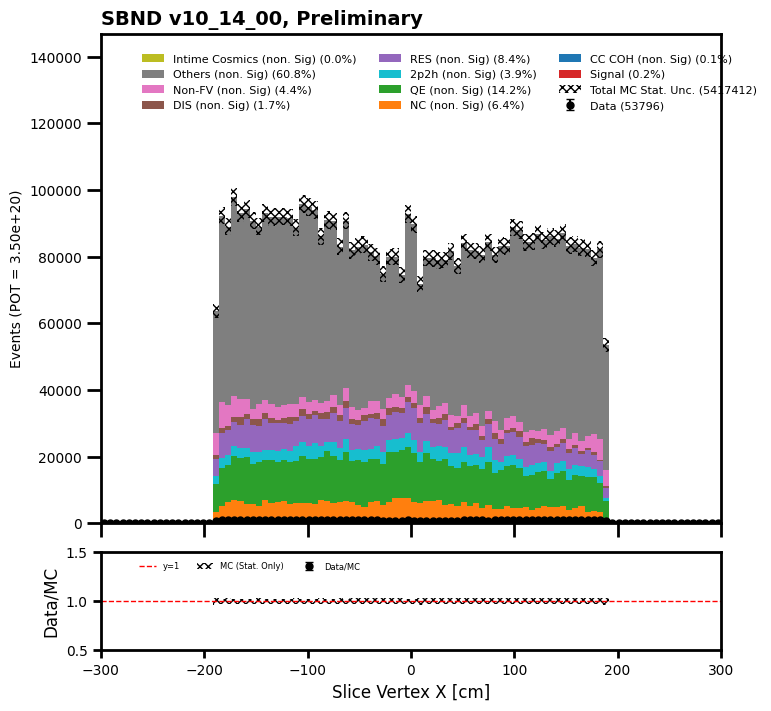

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  53796
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0  560  829  777  760  786  776  826  714  755  726
  759  762  782  799  709  749  800  806  838  811  829  789  799  821
  841  823  850  880  865  855  948  893  874  979  936  935  936  900
  907  909 1012 1045 1002  971 1067 1070 1136 1113  915  576  625  645
  647  732  662  708  767  804  800  857  903  928 1068  850    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[     0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
  48877.625  74885.07   72207.984  74960.47   73580.875  73351.64
  78859.5    67316.8    72901.16   83533.77   76802.17   78331.25
  79095.734  81161.24   74353.04   78865.95   79784.086  81314.01
  80931.375  81466.11   83533.086  82081.22   85752.8    88506.16
  85140.72   85

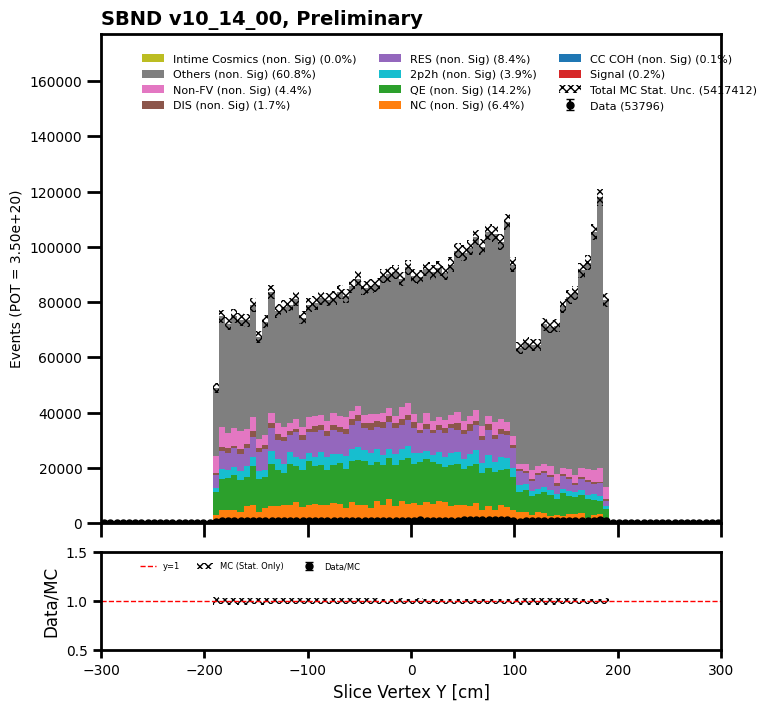

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  53796
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0  401 1318 1125 1167 1049 1033 1110  941  994  976 1017 1009  974
 1002 1001 1003  945  991  962  951  956  938  994  940  983  961  983
  932  958  923 1009  989 1005 1000  969  673  717  670  620  639  641
  625  656  644  677  640  636  654  627  670  681  705  687  654  629
  706  675  731  679  750  698  727  762  414    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[     0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.     40463.625 124681.23  120163.86
 115265.97  110764.09  109084.58  110308.336  97151.06  103729.64
 103347.29  108547.984 104569.86  104493.336 100897.92   97991.47
 102198.58   98679.586 103268.625 100131.72   98221.69   96769.09
 103577.39   94014.97  100593.14  101128.57   94703.03   92331.33
 100593.766  

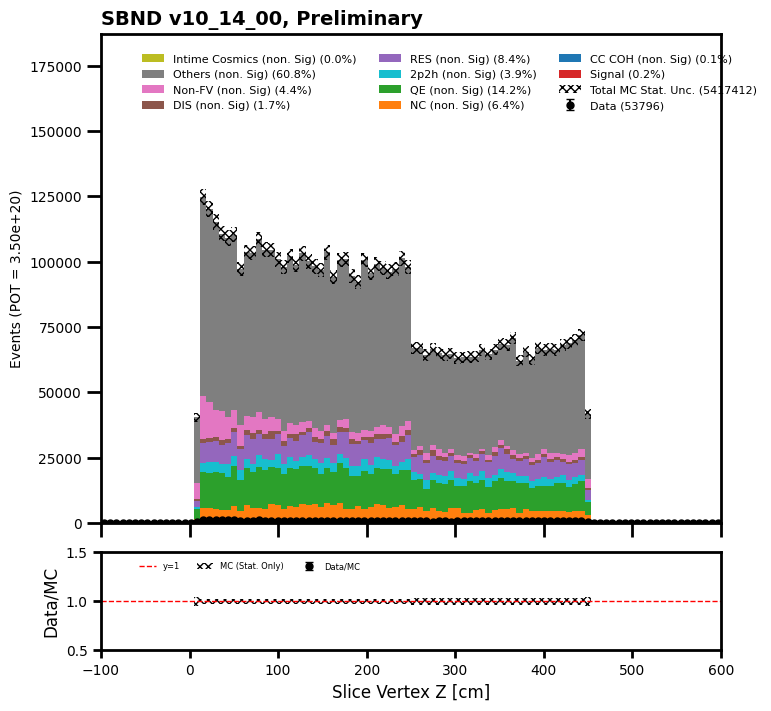

total data =  52372
[4372 5014 2547 2315 2108 2090 2114 1936 1776 1814 1686 1803 1641 1623
 1486 1490 1387 1296 1125 1177 1052  975  876  860  843  765  726  647
  631  538  511  491  424  382  393  380  292  293  238  255]
[487178.84  566542.56  280128.06  245014.97  223519.97  213804.11
 202021.94  188248.88  187485.25  177234.94  173721.8   165539.62
 160185.03  156822.9   143971.3   137392.12  132572.31  127523.44
 110617.24  105338.62  101360.875  92257.516  84454.7    82618.766
  71067.34   69767.13   64564.977  61275.664  57833.176  54084.56
  49877.258  44216.28   39090.793  43374.82   37714.01   33506.586
  32053.125  29681.516  26850.951  22337.68 ]
data ratio  [0.00897412 0.00885017 0.00909227 0.0094484  0.00943092 0.0097753
 0.01046421 0.01028426 0.00947275 0.010235   0.00970517 0.01089165
 0.0102444  0.01034925 0.0103215  0.01084487 0.01046221 0.01016284
 0.0101702  0.01117349 0.01037876 0.01056824 0.01037242 0.01040926
 0.01186199 0.01096505 0.01124449 0.01055884 0.010910

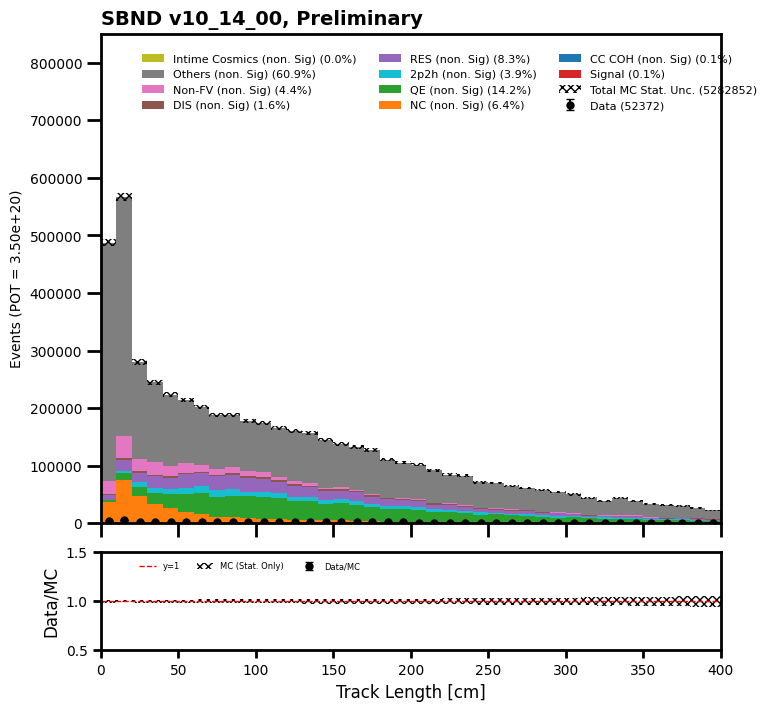

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  53780
[   0    0    0    0    0    0    0    0    0    0    6   20   37   65
  104  134  198  262  416  529  771 1154 1701 1865 1599 1421 1491 1749
 2106 2141 2326 2312 2371 2468 2536 2656 2858 2942 2821 2790 2682 2626
 2284 1743  572   24    0    0    0    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.52981689e+02 5.35435913e+02 1.30034497e+03
 3.21261816e+03 5.88979102e+03 9.79084766e+03 1.32329219e+04
 2.39415742e+04 3.24322148e+04 4.45944102e+04 6.34116367e+04
 8.65876562e+04 1.22607766e+05 1.76016062e+05 1.90940156e+05
 1.65542719e+05 1.37925953e+05 1.36853906e+05 1.79231422e+05
 2.04244969e+05 2.15718250e+05 2.28567422e+05 2.32467391e+05
 2.33305875e+05 2.41034406e+05 2.50747562e+05 2.61084688e+05
 2.78072812e+05 2.93756281e+05 2.92301438e+05 2.79525719e+05
 2.73406188e+05 2.59024312e+05 2.40358984e+05 1.74341391e+05
 6.08932188e+04 2.90698438e+03 0.00000000e+00 0.000000

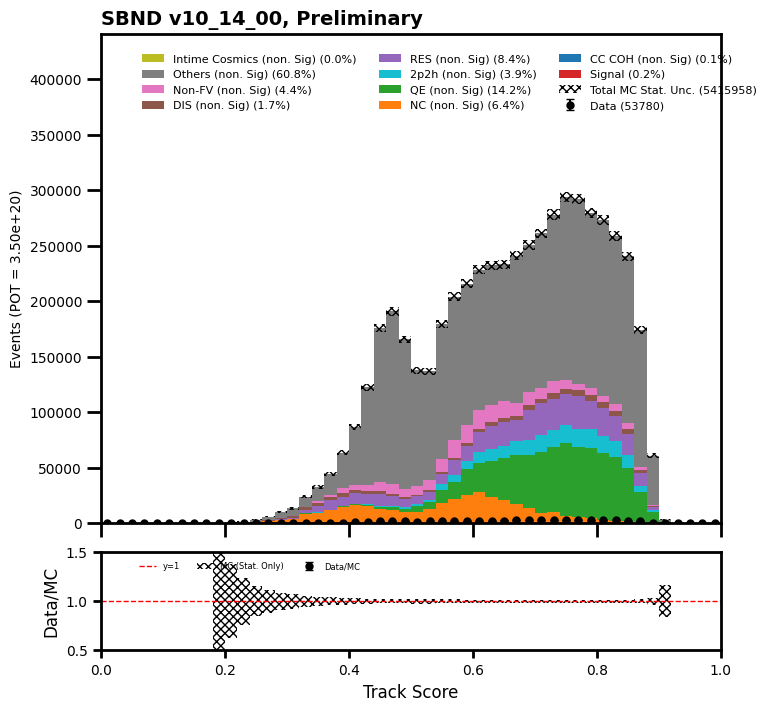

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  53796
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0   25   30  633  896  951  964  963 1007  940 1002  944  927
  977  942  938  950  915  987  911  884  854  945  897  861  926  827
  803  838  815  767  761  736  686  847  805  693  689  670  777  724
  734  769  801  824  805  791  783  820  835  827  783  821  841  861
  842  850  819  887  874  830  831  814  823  825  815  539   22   23
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.      1912.2712  2524.199
 63104.953  91254.61   88499.055  97750.305  92243.484  93096.484
 91413.84   89195.33   90342.72   91719.625  90954.58   93325.02
 92101.18   88428.96   96231.664  93630.88   92865.83   89039.766
 90263.98   90187.25   83915.69   88583.484  82616.336  82846.13
 85140.91   81774

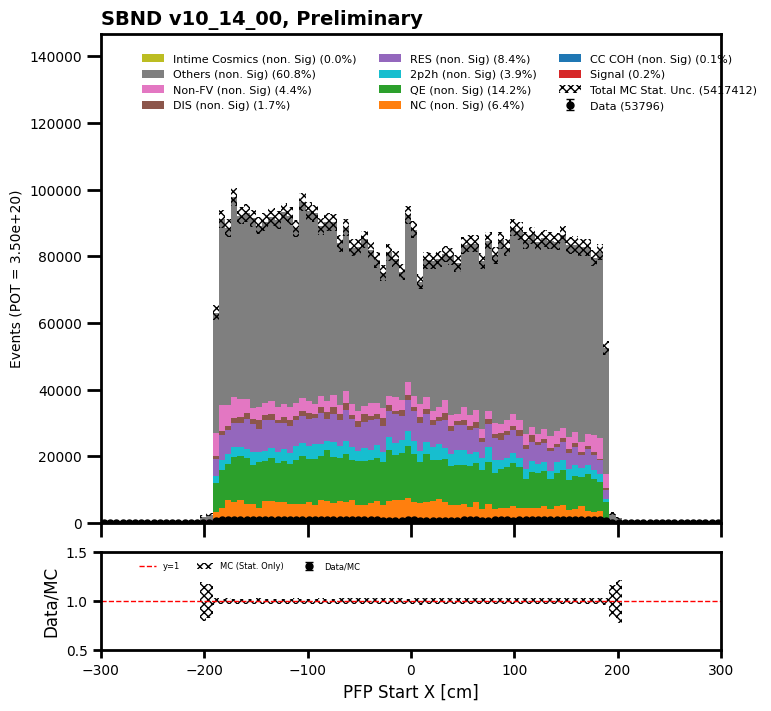

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  53794
[   0    0    0    0    0    0    0    0    1    0    1    0    2    0
    5    4  117   35  544  782  768  770  753  763  803  726  753  725
  755  740  804  783  721  743  800  826  829  788  806  774  815  817
  829  812  857  899  852  869  950  881  876  946  923  924  932  904
  911  909 1007 1030  980  970 1041 1066 1095 1076  894  592  638  619
  652  728  671  694  738  790  799  848  889  902 1029  814  105  271
   19    6    2    0    0    0    0    1    0    0    0    0    0    1
    0    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 7.64908524e+01
 7.64908524e+01 7.64908524e+01 1.52981705e+02 8.41399414e+02
 8.87293555e+03 2.60069287e+03 4.71182656e+04 7.37379062e+04
 7.11370625e+04 7.38125703e+04 7.34278984e+04 7.19749062e+04
 7.73303906e+04 6.64753594e+04 7.46605547e+04 8.07799609e+04
 7.73375781e+04 7.73368125e+04 7.80247891e+0

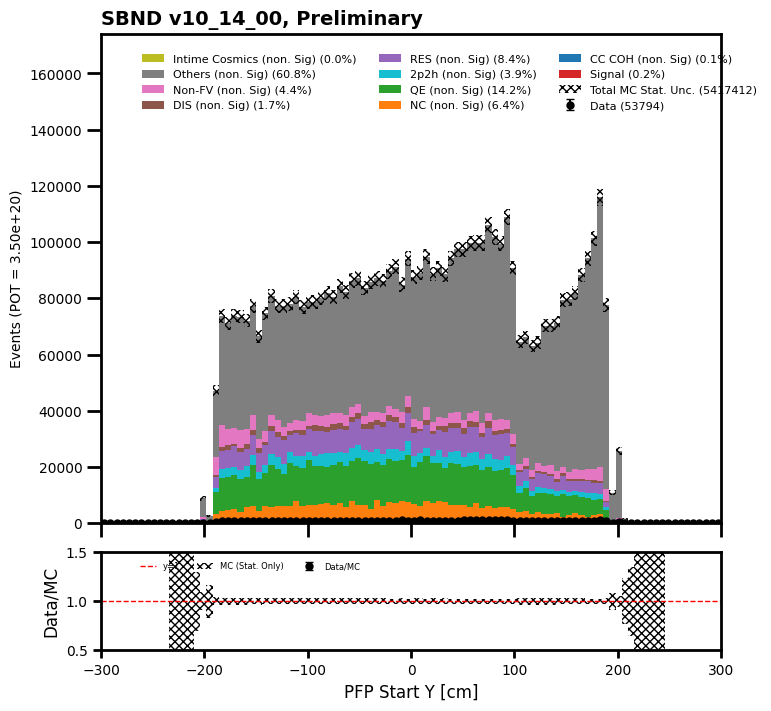

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  53791
[   0    0    0    2    0    0    0    0    0    0    2    0    1   37
  145  369 1219 1072 1136 1024 1020 1082  898  976  977  997  975  977
  988  972  994  920  967  967  948  939  966  953  933  975  984  960
  910  990  908  996  995  992  980  883  766  745  660  619  658  646
  653  663  648  675  650  631  654  645  668  690  718  676  629  646
  715  677  752  688  745  700  714  757  448   28   39   22   16   23
   32   49   15    0    1    1    0    0    0    0    0    0    0    0
    0    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.29472565e+02 0.00000000e+00 0.00000000e+00 0.00000000e+00
 7.64908447e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.14736267e+03 1.32329180e+04 3.73274531e+04
 1.17491172e+05 1.12055984e+05 1.11288703e+05 1.06326250e+05
 1.05489203e+05 1.07248422e+05 9.44736172e+04 1.04035578e+05
 9.89869766e+04 1.06635695e+05 1.02427867e+05 1.03269398e+05
 1.02580781e+05 9.66144688e+04 1.00209734e+0

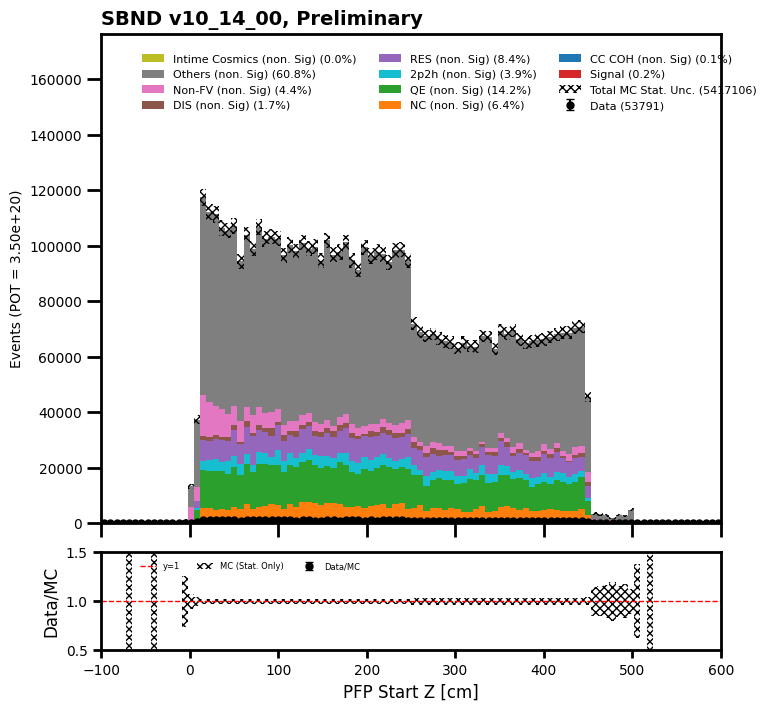

total data =  3851
[140 140 242 269 251 243 262 224 220 205 201 204 218 190 109  40  40  41
  62  29  25  23  33  33  30  18  36  31  28  33  26  26  26  25  18  25
  12  28  27  18]
[  3136.4353 149854.33   345990.56   340863.3    349656.8    340326.
 341479.1    354406.9    337349.38   349438.25   344924.75   349138.1
 340875.62   299796.22     7726.4766   6425.9688   3518.9688   4895.9688
   5737.453    3977.9844   5278.453    4666.453    3901.4688   4130.9688
   4589.953    3289.5      3671.9531   3442.5      3671.9062   2906.9453
   2830.4766   2371.5      2677.4453   2065.4844   2830.4766   2218.4688
   1912.4688   3824.9688   3059.9688   3212.9688]
data ratio  [0.04463666 0.00093424 0.00069944 0.00078917 0.00071785 0.00071402
 0.00076725 0.00063204 0.00065214 0.00058666 0.00058274 0.0005843
 0.00063953 0.00063376 0.01410734 0.00622474 0.01136697 0.00837424
 0.01080619 0.00729012 0.00473624 0.0049288  0.00845835 0.00798844
 0.00653601 0.00547196 0.00980405 0.00900508 0.00762547 0

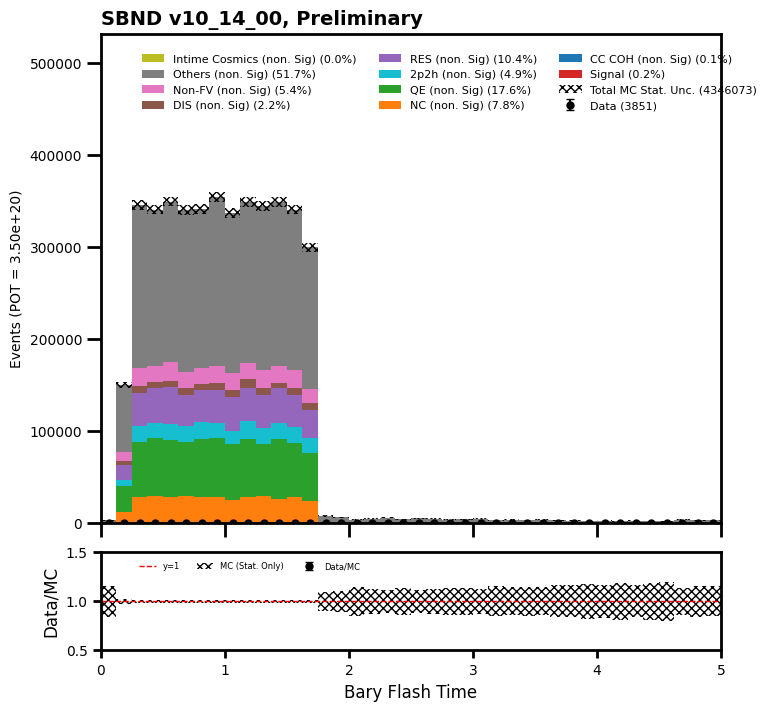

total data =  47158
[34547  4883  2424  1431   914   638   425   338   263   191   155   135
   119    73    76    64    54    49    52    29    24    36    22    34
    15    26    26    11    15    13    12     6    10     9     4    10
     4    10     3     8]
[3.27430275e+06 5.56870750e+05 2.39282312e+05 1.18646875e+05
 6.77765312e+04 4.15378789e+04 3.02929004e+04 1.98127734e+04
 1.51465205e+04 9.86817871e+03 9.33259180e+03 5.96671875e+03
 5.35478027e+03 4.43681152e+03 2.98339062e+03 3.13640625e+03
 3.28942188e+03 1.91242969e+03 1.60640625e+03 1.52994531e+03
 1.83591406e+03 2.06538281e+03 9.17953125e+02 7.64960938e+02
 6.11968750e+02 5.35476562e+02 9.94476562e+02 7.64984375e+02
 7.64976562e+02 7.64929688e+02 3.06000000e+02 4.58968750e+02
 4.58953125e+02 4.58968750e+02 3.05992188e+02 2.29500000e+02
 7.65000000e+01 1.52984375e+02 4.58992188e+02 1.52984375e+02]
data ratio  [0.01055095 0.00876864 0.01013029 0.012061   0.01348549 0.01535947
 0.01402969 0.0170597  0.01736372 0.01935514 

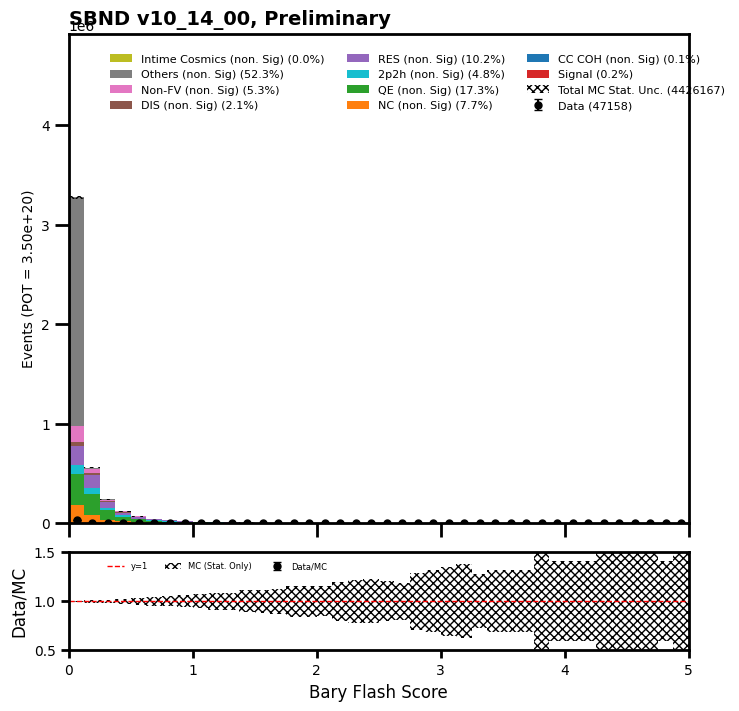

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  53775
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0 49489  3007   763   291
   149    52    16     7     1     0     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 4.9874880e+06 3.0064088e+05 8.0017688e+04 2.8151576e+04 1.2086867e+04
 4.9724453e+03 1.4534438e+03 7.6500000e+01 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

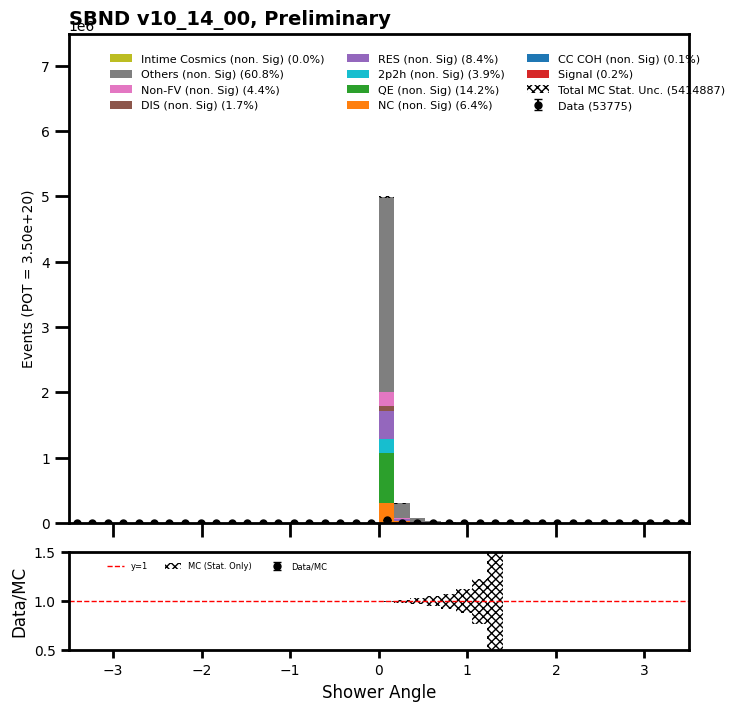

total data =  50940
[28750 12611  3884  1334   769   539   407   296   218   171   160   140
   113   113   103    87    74    77    68    74    64    54    65    65
    57    65    49    43    37    54    43    53    33    39    43    39
    48    27    44    30]
[3.0789642e+06 1.1271762e+06 3.6374538e+05 1.3524853e+05 7.3132422e+04
 4.8193820e+04 3.6336703e+04 3.0369762e+04 2.1343115e+04 1.7747656e+04
 1.4075771e+04 1.2086817e+04 1.0174373e+04 9.6387969e+03 9.8683418e+03
 8.5677969e+03 8.8738496e+03 7.2672876e+03 5.9668877e+03 6.9614048e+03
 6.2728359e+03 7.0378735e+03 7.6498828e+03 8.4913047e+03 5.5843828e+03
 5.7374141e+03 5.3548906e+03 5.0489297e+03 5.8138750e+03 3.8249141e+03
 5.5844141e+03 4.5133516e+03 4.5899375e+03 4.3604219e+03 3.7484219e+03
 3.6719531e+03 3.7484531e+03 3.4424375e+03 3.9779062e+03 2.9834219e+03]
data ratio  [0.00933756 0.01118813 0.0106778  0.00986332 0.01051517 0.01118401
 0.0112008  0.00974654 0.01021407 0.00963508 0.01136705 0.01158287
 0.01110634 0.011723

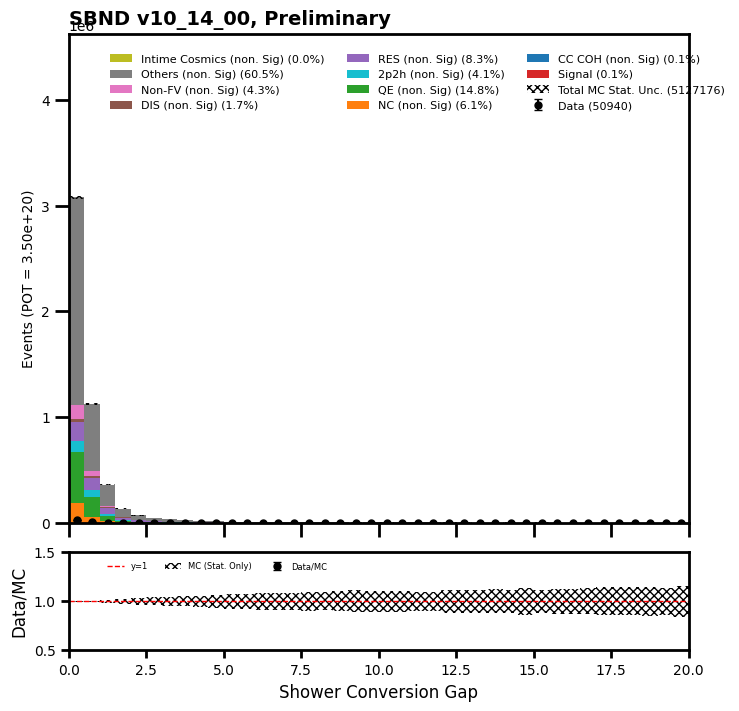

total data =  52297
[  183   885  4554 16916  6589  3264  2178  2306  2802  2828  2576  1887
  1211   749   482   319   276   198   187   169   147   174   166   190
   169   162   118   118    83    82    47    41    34    33    32    35
    31    27    33    16]
[  11320.74     45283.094   333492.34   1896499.4     585515.25
  295742.53    211287.66    232856.28    275770.7     309202.8
  286712.56    185735.97    113752.8      72444.14     48652.934
   32205.66     26468.451    20501.64     21190.082    17976.99
   13616.711    16982.566    18818.5      21343.04     24555.977
   27156.969    22643.586    21037.047    15682.133     9791.781
    8261.766     6808.289     5813.8594    5354.742     3518.9219
    4130.8813    4054.4219    2753.8672    2524.4297    2983.375 ]
data ratio  [0.01616502 0.01954372 0.01365549 0.00891959 0.01125334 0.01103663
 0.01030822 0.0099031  0.01016062 0.0091461  0.00898461 0.01015958
 0.01064589 0.010339   0.00990691 0.00990509 0.01042751 0.00965776
 0.

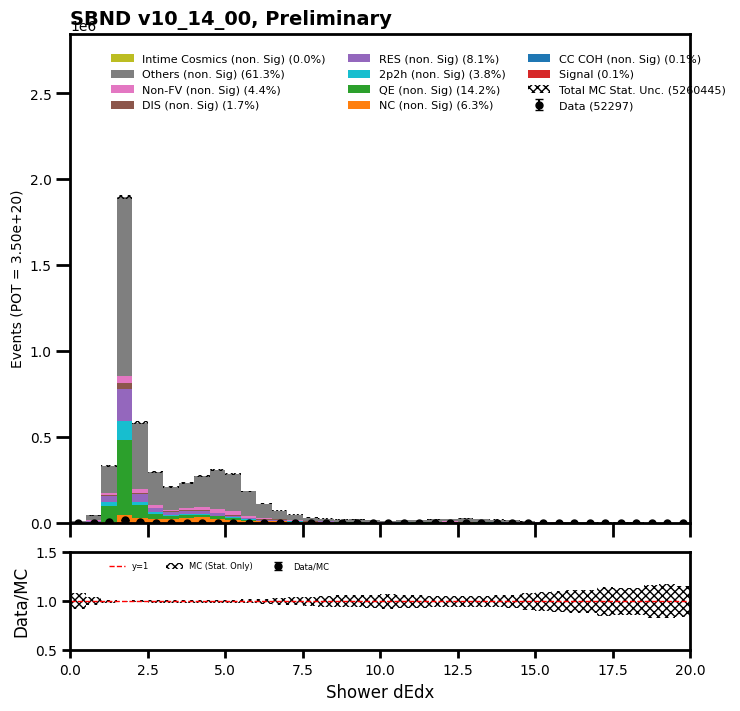

In [53]:
#Vertex Cut

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][InFV_nohiyz_pm10(mc_bnb_cosmic_dfs["evt"].slc.vertex)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][InFV_nohiyz_pm10(data_offbeam_light_dfs["evt"].slc.vertex)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][InFV_nohiyz_pm10(data_bnb_light_dfs["evt"].slc.vertex)]

#plot

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_b_vtxfvcut")

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[19041     0]
[1942485.19597119       0.        ]
data ratio  [0.00980239        nan]


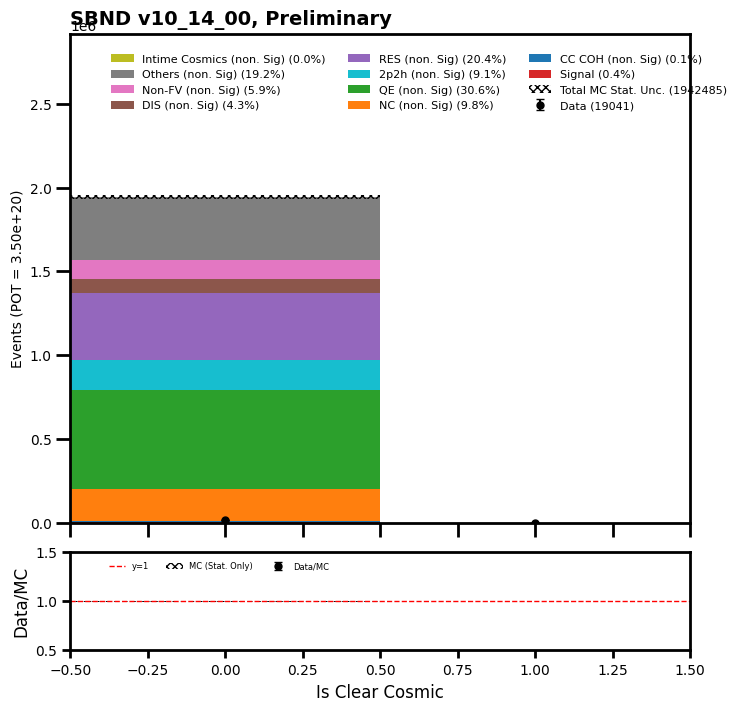

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17758
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0 4254 1395 2390 2895 2639 1804
 1183  677  295  116   56   29   14    9    1    1    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[     0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0. 

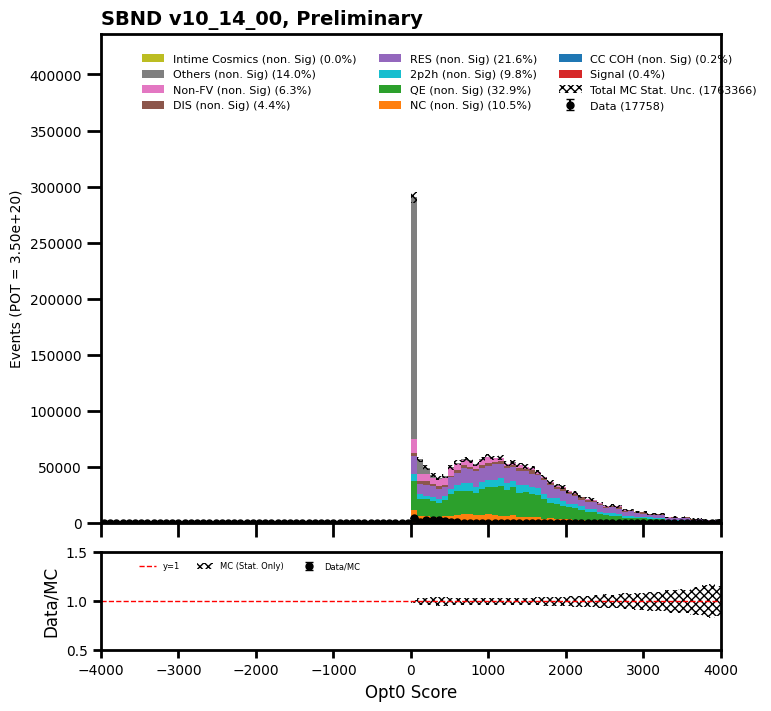

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0 6566 4992 4057 2792  623   11    0    0    0    0
    0    0]
[     0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.    598456.5   466677.38  436698.34  347289.2
  90647.125   2753.705      0.         0.         0.         0.
      0.         0.   ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
  

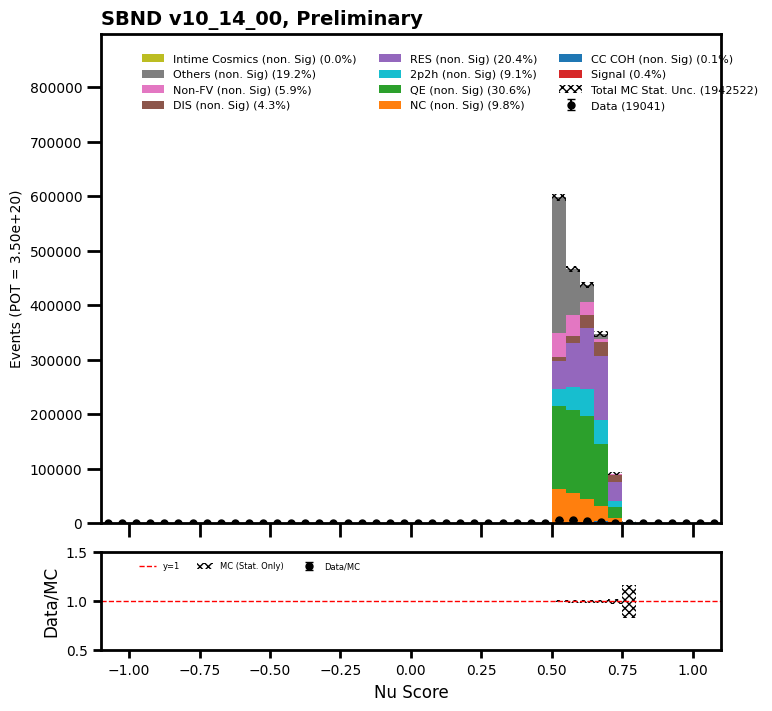

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 201 327 303 357 342 320 337 384 361 349 348 330 350 328 323 368 344 353
 339 344 326 331 347 326 291 332 291 323 305 316 278 281 268 272 251 251
 314 263 260 292 296 274 283 287 268 293 279 271 276 271 300 290 285 265
 273 286 269 240 245 276 233 263 244 148   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.    20193.59  29066.547 30213.91
 32355.498 33503.082 33656.18  31897.023 32891.42  34115.273 33656.34
 31744.06  32126.59  32509.016 33044.523 35873.605 34190.938 34267.402
 31972.617 33578.9   34266.797 32813.35  37479.062 30441.72  31053.535
 31512.39  33042.17  32890.5   30367.125 32891.555 32356.223 31514.816
 36410.016 35186.117 29831.73  35033.316 32126.512 32279.404 32433.254
 29603.482 30

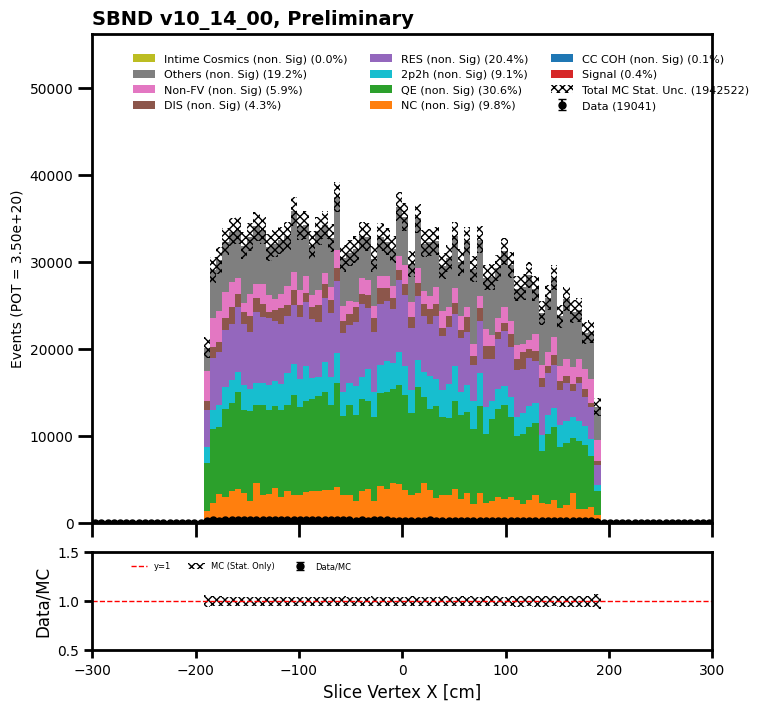

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 209 336 332 300 330 323 367 305 307 303 310 301 332 327 270 308 323 320
 343 356 340 319 347 350 341 376 317 345 335 324 424 354 348 349 349 357
 349 328 355 370 386 389 399 353 378 319 378 333 289 189 184 197 202 207
 173 192 173 188 171 154 152 147 113  96   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
 20117.1    31743.734  30290.367  31437.668  30519.95   29372.574
 34727.156  27078.045  29831.77   35033.17   34650.68   31208.668
 32432.623  34191.5    32661.035  33578.723  34343.89   37021.
 33884.98   35414.727  34113.766  35337.43   38091.03   37096.527
 37555.69   37328.094  37327.85   36945.33   38551.66   37404.387
 38398.88   39622.574  34803.72   33962.2    35492.37   3

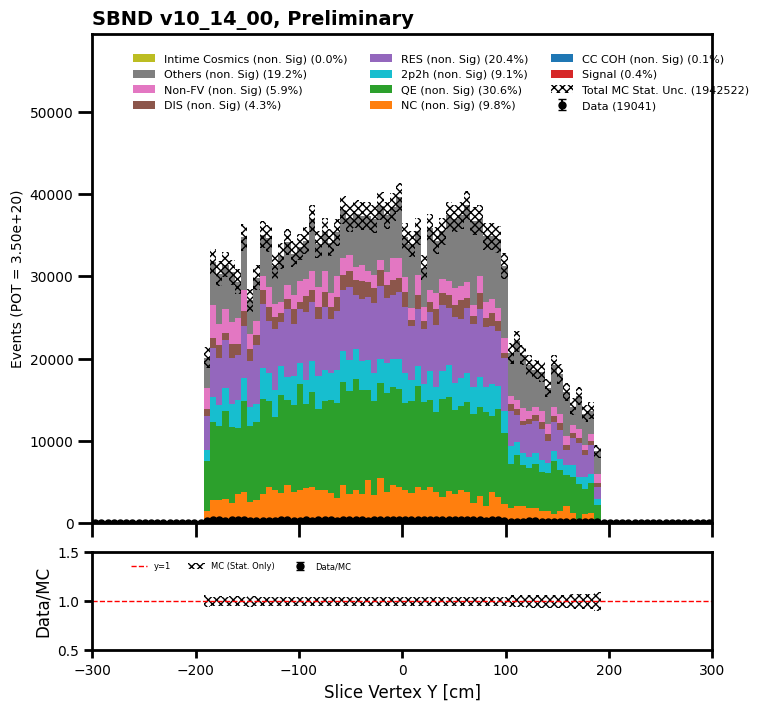

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 127 397 364
 397 388 352 358 304 328 287 352 364 304 322 310 331 319 343 315 356 322
 330 329 306 335 353 347 321 338 306 338 326 325 321 298 239 275 268 227
 261 254 241 264 252 270 280 262 277 232 250 284 278 265 269 244 254 253
 275 266 266 269 280 309 164   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.        0.        0.        0.
     0.    12773.977 41152.12  39622.242 39469.062 38551.547 36333.49
 37939.953 31361.676 35109.74  34115.36  35262.707 35645.242 35645.24
 36333.176 31437.203 34955.797 34496.777 34114.36  33961.406 31666.246
 33195.258 35183.82  32583.35  35719.293 36942.92  31818.883 31208.543
 32662.02  32585.414 34650.72  33350.56  33579.84  32814.695 34650.527
 34727.285 25242.354 25854.117 25853.988 26771.979 25472.857 25549.35
 25319.809 236

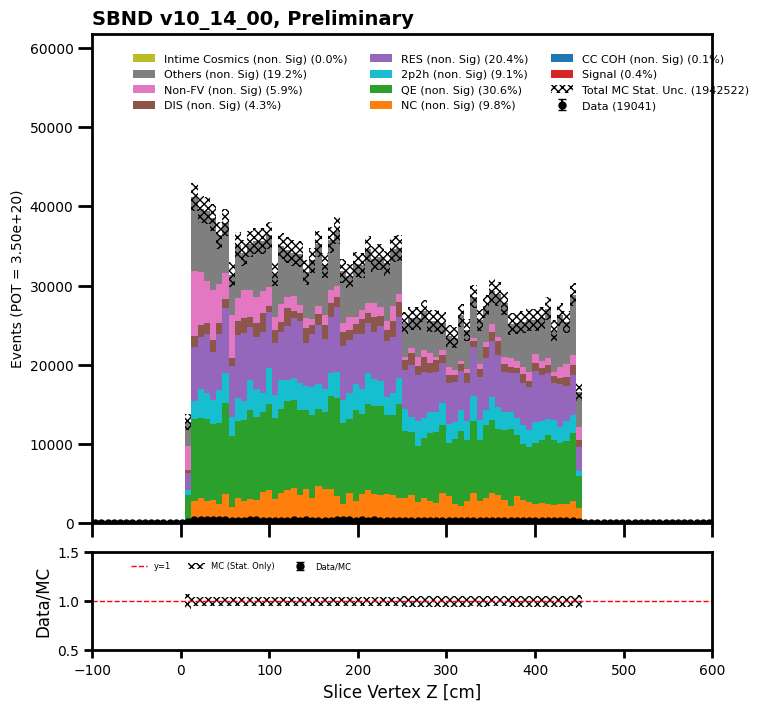

total data =  18494
[  72  465  660  781  863  952 1034 1011  936  928  881  888  801  727
  684  637  635  537  474  475  441  394  326  319  293  288  253  211
  202  184  164  161  146  117  111  120   85  103   60   75]
[ 5813.306 53696.57  72284.02  83604.92  89495.266 99439.586 99975.07
 96762.58  98059.29  95072.125 95377.664 82451.625 77250.52  75266.21
 68229.99  65936.33  59896.86  53854.387 48499.73  46740.08  43297.703
 37483.44  35341.71  32740.79  27844.793 26850.564 24096.633 24173.127
 20118.668 20348.129 17441.36  15299.252 13616.34  13310.423 13233.95
 10021.154  9179.648  9485.53   9179.545  7420.258]
data ratio  [0.01238538 0.00865977 0.00913065 0.00934156 0.00964297 0.00957365
 0.01034258 0.01044825 0.00954525 0.00976101 0.00923696 0.01076995
 0.01036886 0.00965905 0.01002492 0.00966084 0.01060156 0.00997133
 0.00977325 0.01016258 0.0101853  0.01051131 0.00922423 0.0097432
 0.01052261 0.01072603 0.01049939 0.0087287  0.01004043 0.0090426
 0.00940294 0.01052339 0.01

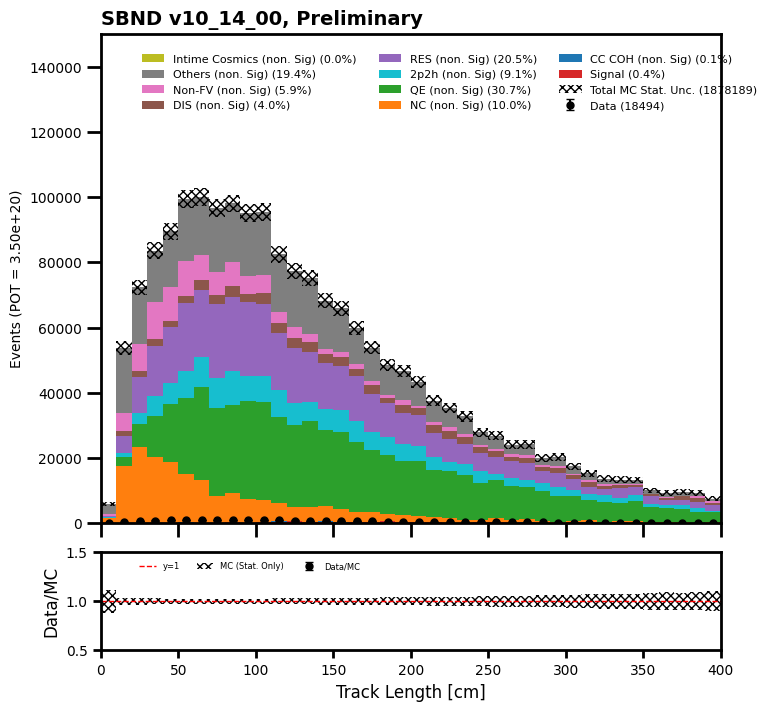

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  19041
[   0    0    0    0    0    0    0    0    0    0    3    9   21   34
   62  100  147  178  260  279  317  291  267  241  223  244  279  380
  551  685  821  966  988 1072 1136 1167 1280 1296 1206 1148 1069  931
  777  450  156    7    0    0    0    0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 7.6490852e+01
 3.8245425e+02 6.1192682e+02 2.1417437e+03 4.4364707e+03 6.8076875e+03
 1.0096796e+04 1.8969766e+04 2.4094602e+04 2.9525350e+04 3.3885477e+04
 3.6716016e+04 3.1055723e+04 2.6160227e+04 2.4859869e+04 1.8893473e+04
 2.1035215e+04 2.5548219e+04 3.5186070e+04 4.5282922e+04 5.9587152e+04
 7.5726133e+04 8.5898844e+04 9.6146875e+04 1.0042773e+05 1.1557024e+05
 1.1970043e+05 1.2719804e+05 1.3065295e+05 1.2583932e+05 1.2293194e+05
 1.1826474e+05 1.1160949e+05 9.1108305e+04 4.9799770e+04 1.5222835e+04
 9.1798438e+02 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [ 

/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


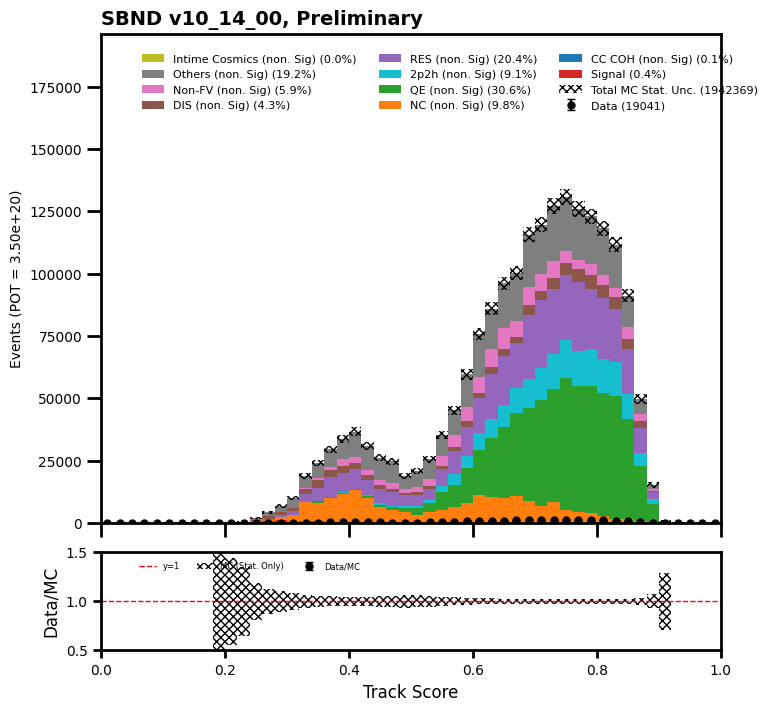

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   8   8
 203 308 314 350 336 333 329 373 361 343 350 334 348 338 322 363 331 354
 335 346 335 345 341 324 292 327 300 316 296 313 265 305 285 259 256 247
 305 268 263 295 289 278 280 275 283 301 281 273 277 272 298 281 284 272
 265 288 282 242 244 266 233 247 239 151   7   9   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.        994.3811    305.9634
 20117.102   28607.6     30290.406   32584.96    33120.62    33885.65
 32661.953   31897.04    33809.312   33962.297   30902.652   31514.643
 32509.018   33350.484   35797.15    34267.426   33120.016   34267.355
 32431.525   34878.688   33807.754   36025.754   31359.598   31206.521
 32124.355   32736.219   32431.453   30749.617   33580.008   31667.723
 30290.943 

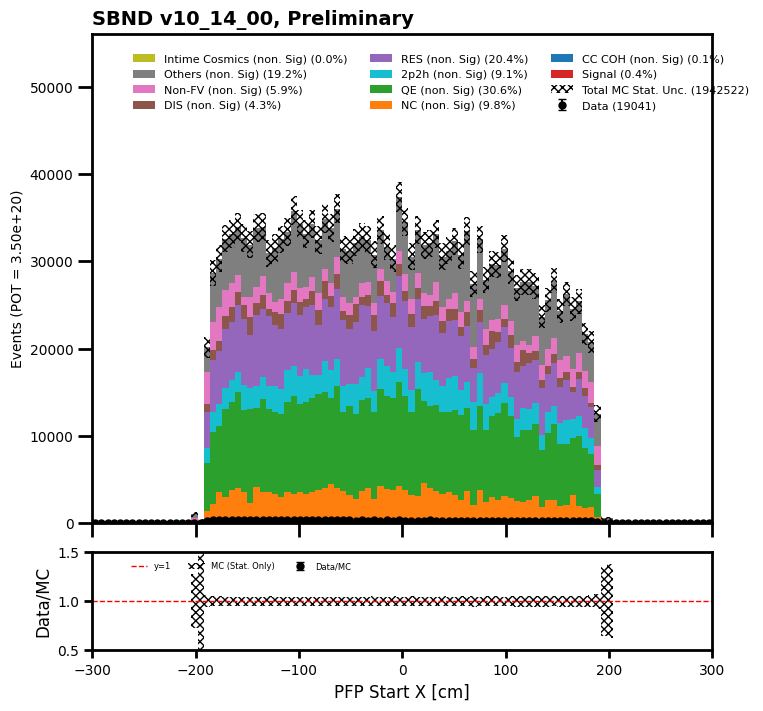

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  19041
[  0   0   0   0   0   0   0   0   1   0   0   0   0   0   3   0  29   6
 204 317 328 308 316 326 350 321 312 305 314 291 339 305 295 304 323 330
 340 344 328 319 341 344 340 378 315 352 334 336 431 348 346 329 349 346
 348 337 360 364 386 381 389 360 366 333 377 324 279 206 191 186 200 216
 179 175 176 189 186 150 143 145 104  86  11  38   3   5   0   0   0   0
   0   0   0   0   0   0   0   1   0   0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.         76.49085
     0.          0.         76.49085   458.94513  2830.1616   1147.363
 18740.262   31284.799   29831.41    30978.719   29984.516   28837.137
 34650.688   27384.012   30061.225   32891.414   34268.22    31208.66
 32050.164   32738.17    34037.875   34114.15    34420.367   36562.08
 33426.04    35567.69    34878.684   36025.805   38626.48    36637.562
 36714.355   37328.305   37633.68    35874.49    39087.137   38398.773
 36333.6

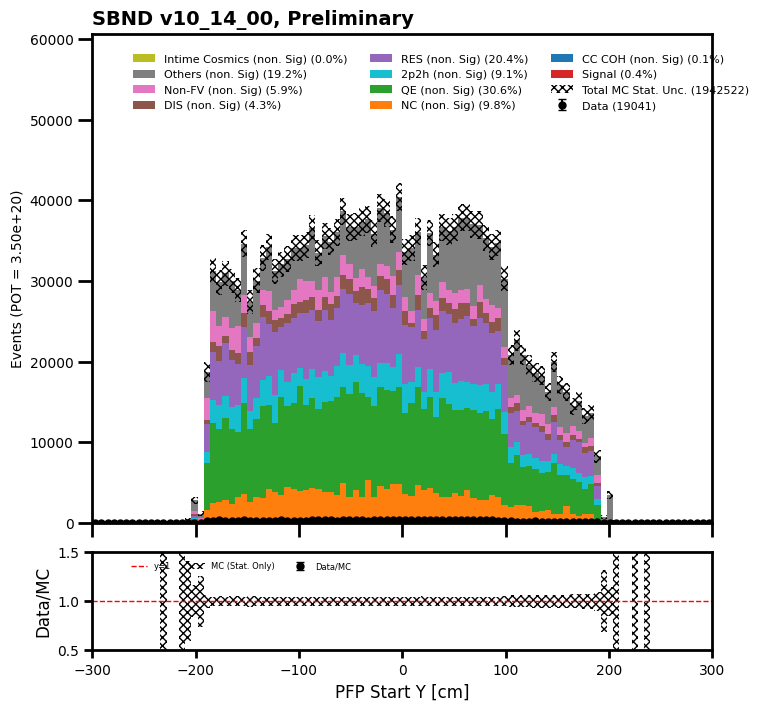

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  19038
[  0   0   0   1   0   0   0   0   0   0   1   0   1  11  59 110 364 354
 380 363 355 344 298 327 287 345 345 305 316 296 322 325 334 329 342 318
 334 315 307 334 353 345 301 354 311 333 328 325 317 268 278 287 259 221
 264 245 258 264 255 278 277 259 291 236 238 284 281 257 270 247 249 257
 285 276 271 274 276 300 172  12  20  11   3   6   3  14   2   0   0   1
   0   0   0   0   0   0   0   0   0   0]
[    0.          0.          0.          0.        152.98169     0.
     0.          0.          0.          0.          0.          0.
     0.        305.9634   5507.3438  10632.229   39010.39    36409.605
 37021.38    38016.07    34191.695   37175.04    31055.691   35262.727
 32968.004   34574.273   35033.297   35645.215   37633.586   31207.744
 34955.797   33272.9     34496.83    34496.82    31207.486   33042.586
 34036.57    32124.385   35260.336   36789.953   33042.625   30443.623
 32050.082   32891.4     33426.805   33962.48    32585.508   34038.555
 33885.625 

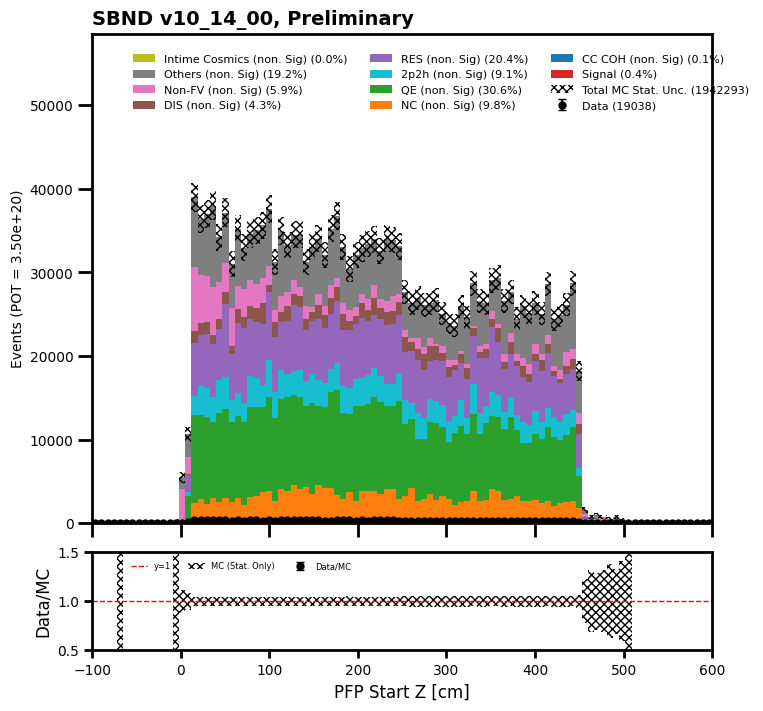

total data =  1354
[ 51  54  91 104 105 103 104  84  75  79  93  68  81  76  42  10   7   4
  11   8   6  10   9   7   4   3   8   6   6   8   4   6   1   2   2   4
   3   4   6   5]
[   688.42334  65705.78    144567.      148468.38    147011.56
 139666.48    145172.69    148317.94    141511.39    149547.77
 141747.88    147560.89    141211.16    125606.12      1147.4766
   1070.9609     688.47656   1300.4609     994.4844     918.
   1606.4609    1376.9688     535.5        994.47656    764.9531
    611.9844     917.97656    841.46875    994.4453     458.98438
    841.46094    382.5        841.4531     458.96875    459.
    535.4844     458.96875    994.4844    1147.4688    1070.9766 ]
data ratio  [0.07408232 0.00082185 0.00062947 0.00070049 0.00071423 0.00073747
 0.00071639 0.00056635 0.00052999 0.00052826 0.00065609 0.00046083
 0.00057361 0.00060507 0.03660205 0.00933741 0.01016738 0.00307583
 0.01106101 0.0087146  0.00373492 0.00726233 0.01680672 0.00703888
 0.00522908 0.00490209 0.0

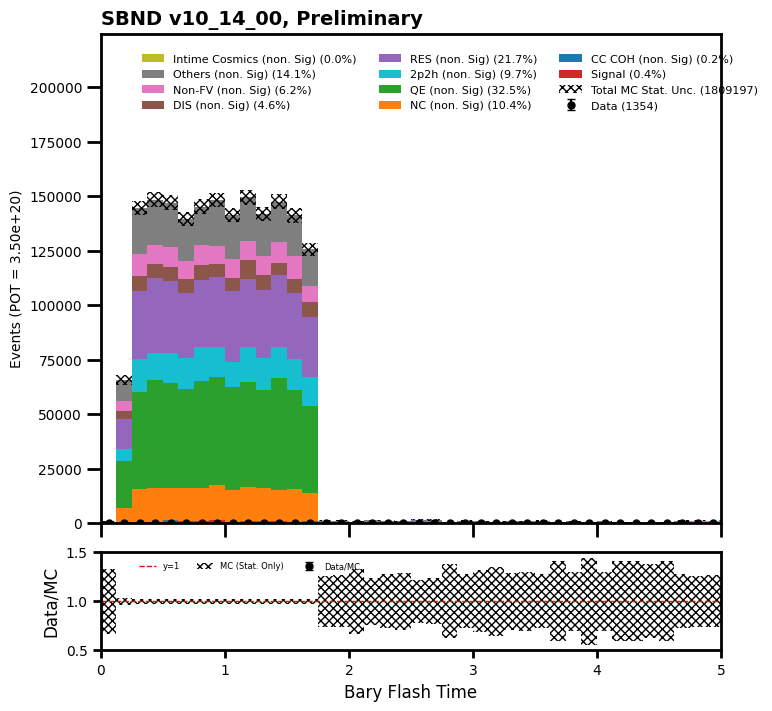

total data =  17884
[8499 3408 1795 1091  704  517  353  273  209  148  125  112   97   54
   59   56   46   40   44   21   18   32   16   26   14   19   17   11
   14    9    9    5    6    7    4    8    3    6    3    6]
[8.84231188e+05 4.33250625e+05 1.98124734e+05 1.01662555e+05
 5.79834609e+04 3.53409805e+04 2.65440566e+04 1.75174844e+04
 1.25453799e+04 8.56756152e+03 8.10852979e+03 5.27816406e+03
 4.58974902e+03 4.05428003e+03 2.67734375e+03 2.67739844e+03
 2.90685938e+03 1.68292188e+03 1.52986719e+03 1.37689062e+03
 1.68290625e+03 1.60637500e+03 8.41429688e+02 6.88445312e+02
 6.11953125e+02 5.35460938e+02 9.94476562e+02 6.11960938e+02
 7.64945312e+02 6.88421875e+02 2.29484375e+02 3.82453125e+02
 3.82468750e+02 4.58968750e+02 2.29492188e+02 2.29500000e+02
 7.65000000e+01 1.52984375e+02 4.58992188e+02 1.52992188e+02]
data ratio  [0.00961174 0.00786612 0.00905995 0.01073158 0.01214139 0.01462891
 0.01329865 0.01558443 0.01665952 0.01727446 0.01541586 0.0212195
 0.02113405 0.013319

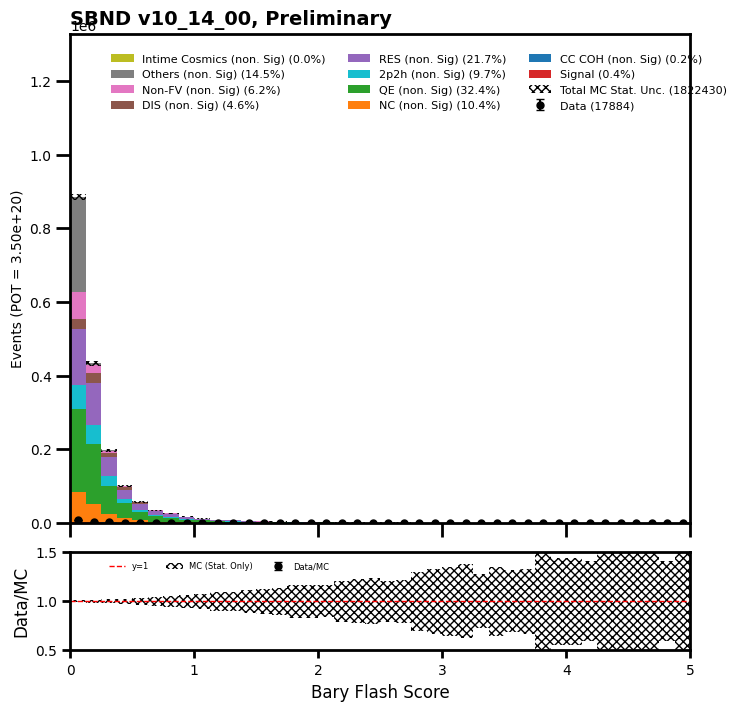

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  19041
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0 17992   729   185    75
    40    13     6     1     0     0     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.8317580e+06 8.0089625e+04 2.0577012e+04 5.5077251e+03 2.2948828e+03
 1.6064375e+03 5.3547510e+02 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

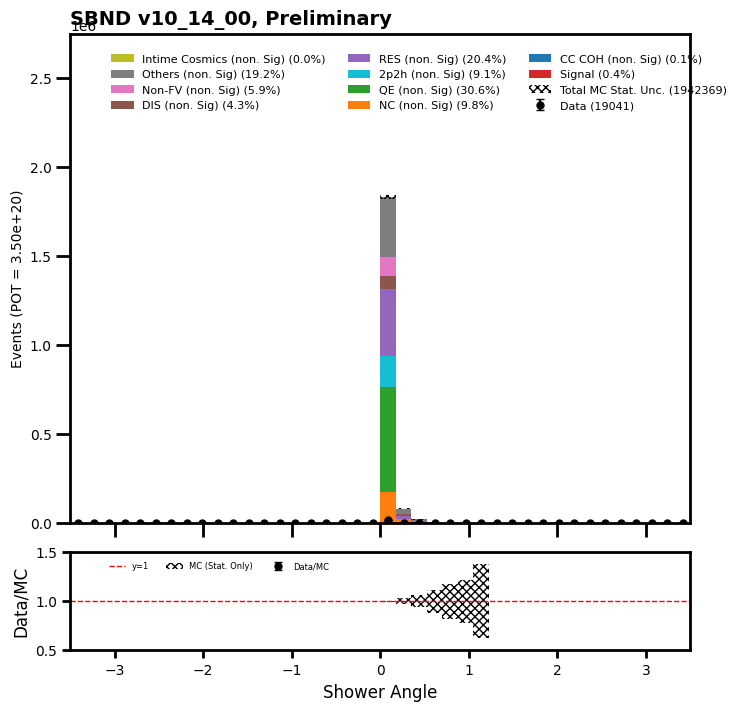

total data =  18116
[9968 4650 1499  471  266  179  128  101   74   69   52   55   33   49
   35   35   26   26   29   25   18   18   25   23   26   24   16   10
   16   17   16   17    8   14   18   19   19   10   19   13]
[989869.5    469202.44   156892.94    57142.67    30598.414   20271.354
  14304.498   12545.122    8185.061    7955.4453   5354.6313   4819.177
   3442.2798   3595.2188   3748.233    3365.7812   3824.647    3212.725
   2677.3252   3212.789    2906.7812   2677.3188   3595.2734   3442.2344
   2294.8047   2294.8281   1835.8672   1529.8828   2065.2812   1759.3203
   2065.2344   2141.8125   1453.4297   1759.3828   1529.8438   1759.3203
   1529.8438   1529.8906   1606.375    1529.8906]
data ratio  [0.01007001 0.00991043 0.00955429 0.00824253 0.00869326 0.00883019
 0.00894823 0.00805094 0.00904086 0.0086733  0.00971122 0.01141274
 0.00958667 0.01362921 0.00933773 0.01039877 0.00679801 0.00809282
 0.01083171 0.0077814  0.00619242 0.00672314 0.00695357 0.00668171
 0.01132994

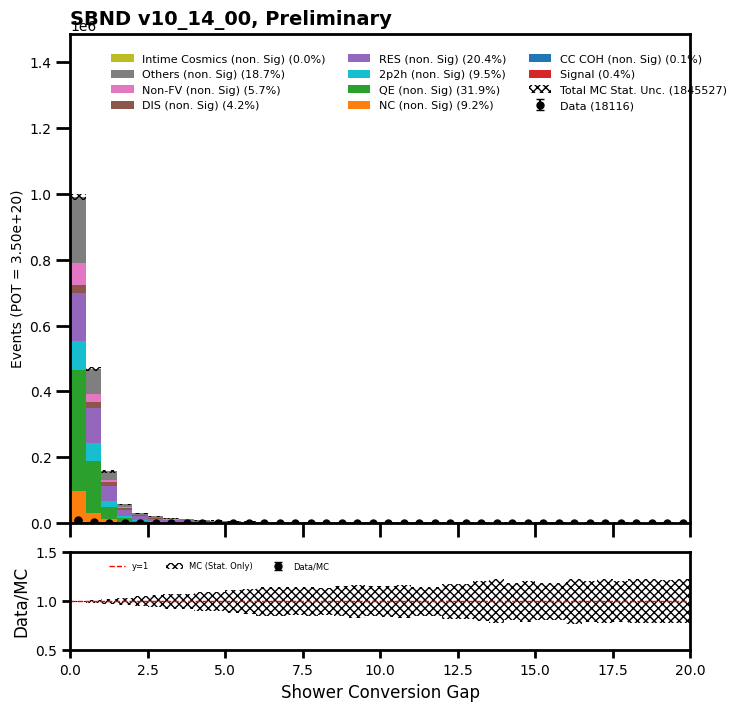

total data =  18382
[  93  273 1637 7402 2136 1062  769  816  872  772  618  475  259  174
  122   99   65   63   54   55   41   49   48   57   51   44   37   33
   28   30   17   21   11   15   17   16   12    9   21    9]
[  5660.3306  15451.153  151299.56   782049.7    180139.53   100433.234
  76875.13    85518.086   93396.22    85746.      68157.89    44597.277
  27003.062   19888.725   12698.388    9714.942    8414.389    6808.039
   7267.0283   6884.522    4666.2266   6578.5376   5201.547    6655.0938
   6961.0703   6196.008    5431.172    4666.211    4589.758    3059.836
   3824.7188   3595.2578   2371.3438   2447.7812   1453.4531   2218.4517
   1606.4297   1376.9219   1682.9453   1835.8516]
data ratio  [0.01643014 0.01766858 0.0108196  0.00946487 0.01185748 0.01057419
 0.01000323 0.00954184 0.00933657 0.00900334 0.00906718 0.01065087
 0.0095915  0.00874868 0.00960752 0.01019049 0.00772486 0.00925377
 0.00743082 0.00798894 0.00878654 0.00744846 0.00922802 0.00856487
 0.00732646 

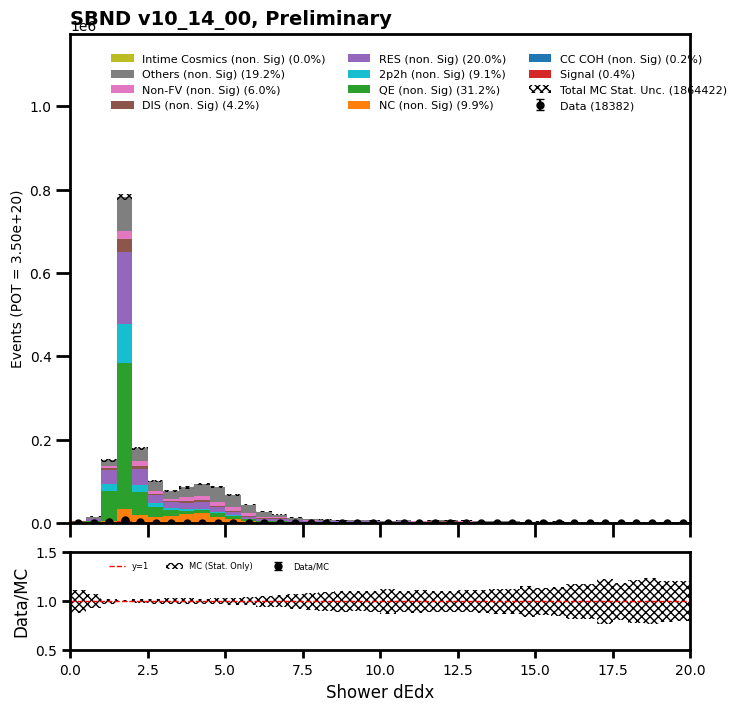

In [54]:
#nuscore

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].slc.nu_score > 0.5)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.nu_score > 0.5)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.nu_score > 0.5)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[19041     0]
[1942485.19597119       0.        ]
data ratio  [0.00980239        nan]


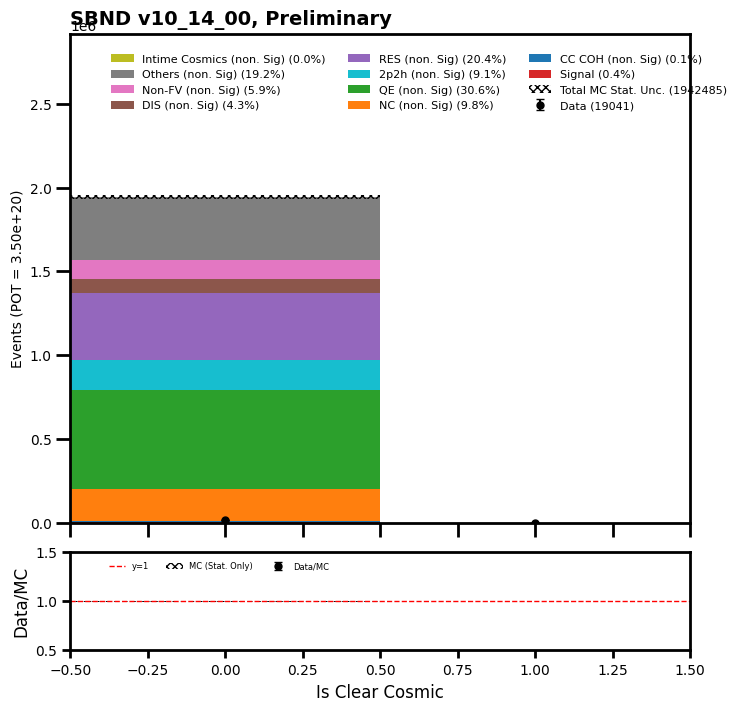

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  17758
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0 4254 1395 2390 2895 2639 1804
 1183  677  295  116   56   29   14    9    1    1    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
[     0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0.          0.
      0.          0.          0.          0.          0. 

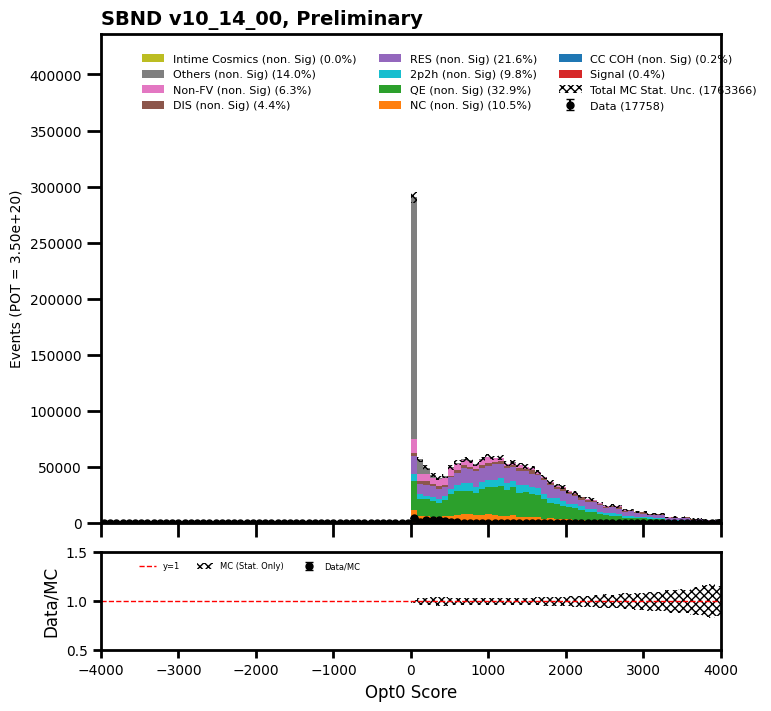

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0 6566 4992 4057 2792  623   11    0    0    0    0
    0    0]
[     0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.         0.         0.         0.         0.
      0.         0.    598456.5   466677.38  436698.34  347289.2
  90647.125   2753.705      0.         0.         0.         0.
      0.         0.   ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
  

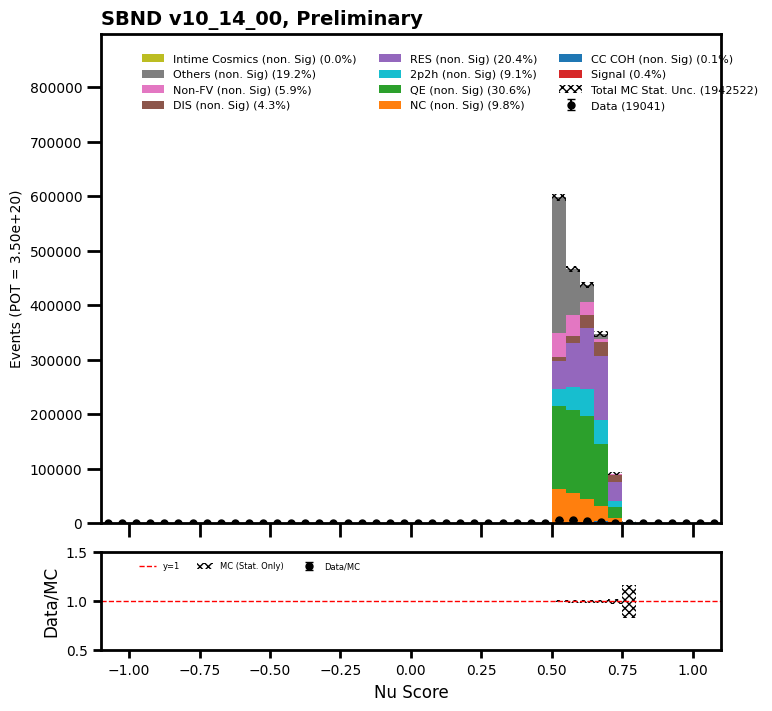

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 201 327 303 357 342 320 337 384 361 349 348 330 350 328 323 368 344 353
 339 344 326 331 347 326 291 332 291 323 305 316 278 281 268 272 251 251
 314 263 260 292 296 274 283 287 268 293 279 271 276 271 300 290 285 265
 273 286 269 240 245 276 233 263 244 148   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.    20193.59  29066.547 30213.91
 32355.498 33503.082 33656.18  31897.023 32891.42  34115.273 33656.34
 31744.06  32126.59  32509.016 33044.523 35873.605 34190.938 34267.402
 31972.617 33578.9   34266.797 32813.35  37479.062 30441.72  31053.535
 31512.39  33042.17  32890.5   30367.125 32891.555 32356.223 31514.816
 36410.016 35186.117 29831.73  35033.316 32126.512 32279.404 32433.254
 29603.482 30

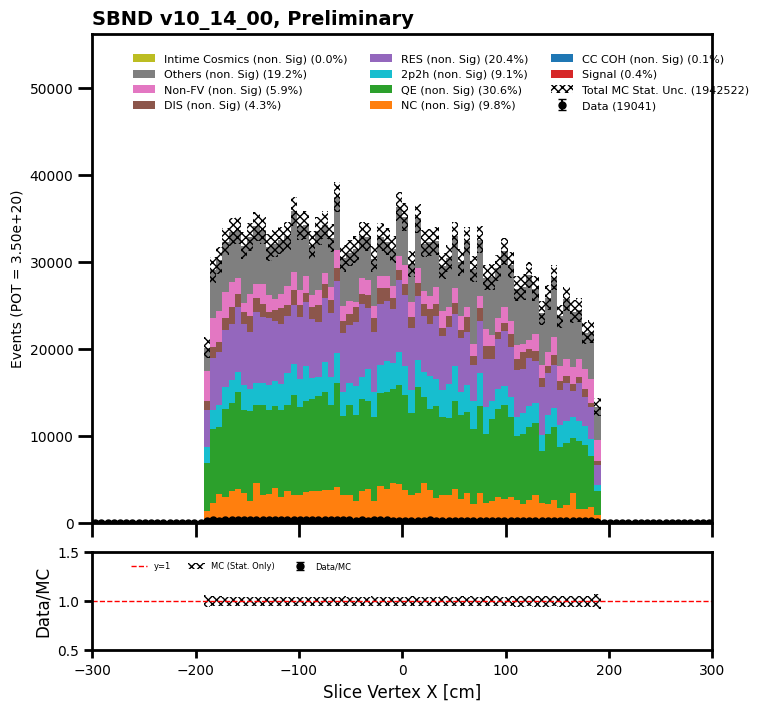

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
 209 336 332 300 330 323 367 305 307 303 310 301 332 327 270 308 323 320
 343 356 340 319 347 350 341 376 317 345 335 324 424 354 348 349 349 357
 349 328 355 370 386 389 399 353 378 319 378 333 289 189 184 197 202 207
 173 192 173 188 171 154 152 147 113  96   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
 20117.1    31743.734  30290.367  31437.668  30519.95   29372.574
 34727.156  27078.045  29831.77   35033.17   34650.68   31208.668
 32432.623  34191.5    32661.035  33578.723  34343.89   37021.
 33884.98   35414.727  34113.766  35337.43   38091.03   37096.527
 37555.69   37328.094  37327.85   36945.33   38551.66   37404.387
 38398.88   39622.574  34803.72   33962.2    35492.37   3

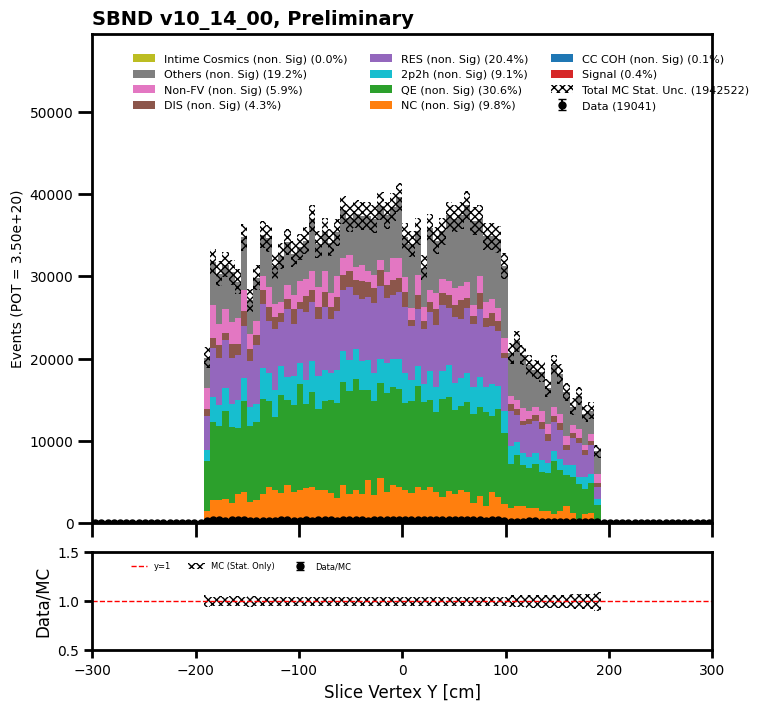

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  19041
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0 127 397 364
 397 388 352 358 304 328 287 352 364 304 322 310 331 319 343 315 356 322
 330 329 306 335 353 347 321 338 306 338 326 325 321 298 239 275 268 227
 261 254 241 264 252 270 280 262 277 232 250 284 278 265 269 244 254 253
 275 266 266 269 280 309 164   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.        0.        0.        0.        0.        0.        0.
     0.        0.        0.        0.        0.        0.        0.
     0.    12773.977 41152.12  39622.242 39469.062 38551.547 36333.49
 37939.953 31361.676 35109.74  34115.36  35262.707 35645.242 35645.24
 36333.176 31437.203 34955.797 34496.777 34114.36  33961.406 31666.246
 33195.258 35183.82  32583.35  35719.293 36942.92  31818.883 31208.543
 32662.02  32585.414 34650.72  33350.56  33579.84  32814.695 34650.527
 34727.285 25242.354 25854.117 25853.988 26771.979 25472.857 25549.35
 25319.809 236

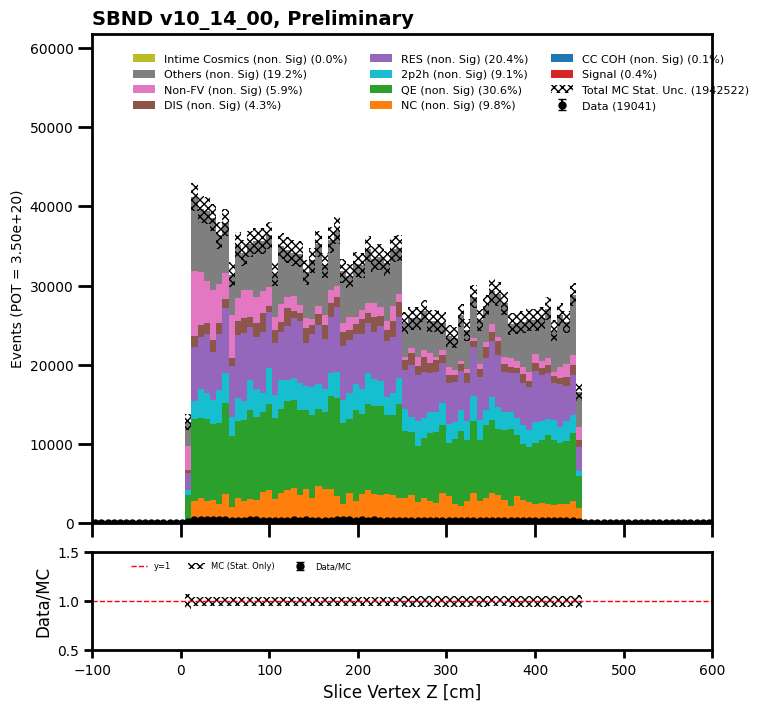

total data =  14562
[4752 2837 1240 1012  769  540  452  363  297  250  239  236  182  142
  132  125  113   95   84   81   80   60   49   50   47   36   48   28
   37   23   25   18   23   17   15   25   10   11    6   13]
[459173.3    298154.12   138675.5    101042.54    73965.08    55378.34
  42453.19    31133.1     30444.676   24707.576   23942.496   22719.502
  17517.762   18741.729   16140.766   14534.295   12239.291   11627.275
   9332.419    7420.0176   7267.033    6578.4956   6655.0376   4895.7095
   4666.183    4819.08     2983.294    3977.6597   3212.7861   3059.769
   3442.2769   3136.2236   2524.2847   1529.894    1606.3657   1529.9048
    994.4375   1453.3828   1147.4517   1300.4219]
data ratio  [0.01034903 0.00951521 0.00894174 0.01001558 0.0103968  0.0097511
 0.01064702 0.01165962 0.0097554  0.01011835 0.00998225 0.01038755
 0.01038946 0.00757668 0.00817805 0.00860035 0.00923256 0.00817044
 0.00900088 0.01091642 0.01100862 0.00912063 0.00736284 0.01021302
 0.01007247 0.

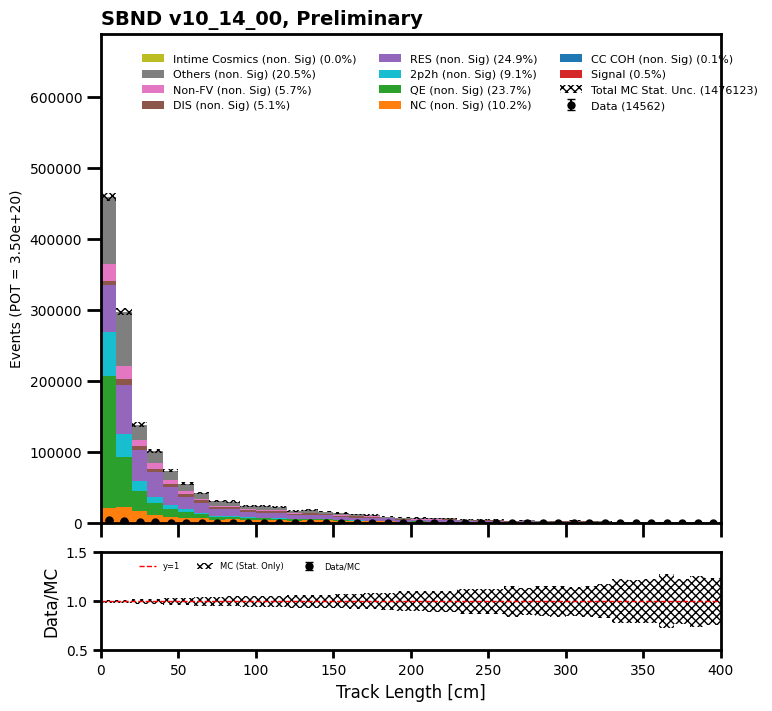

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  14752
[   0    0    0    0    0    0    0    0    0    0    7   10   26   38
   73  129  201  292  460  615  867 1114 1288 1219 1093 1021 1168 1383
 1799 1949    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.64921875e+01 5.35439331e+02 9.17884277e+02
 2.52420898e+03 4.81896289e+03 8.10805420e+03 1.23915762e+04
 2.47832656e+04 3.67924375e+04 5.23966953e+04 6.33348750e+04
 8.78125547e+04 1.10758836e+05 1.24448516e+05 1.16187680e+05
 1.00048992e+05 9.74529453e+04 1.10304477e+05 1.52458312e+05
 1.88027484e+05 2.02790844e+05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000000

/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


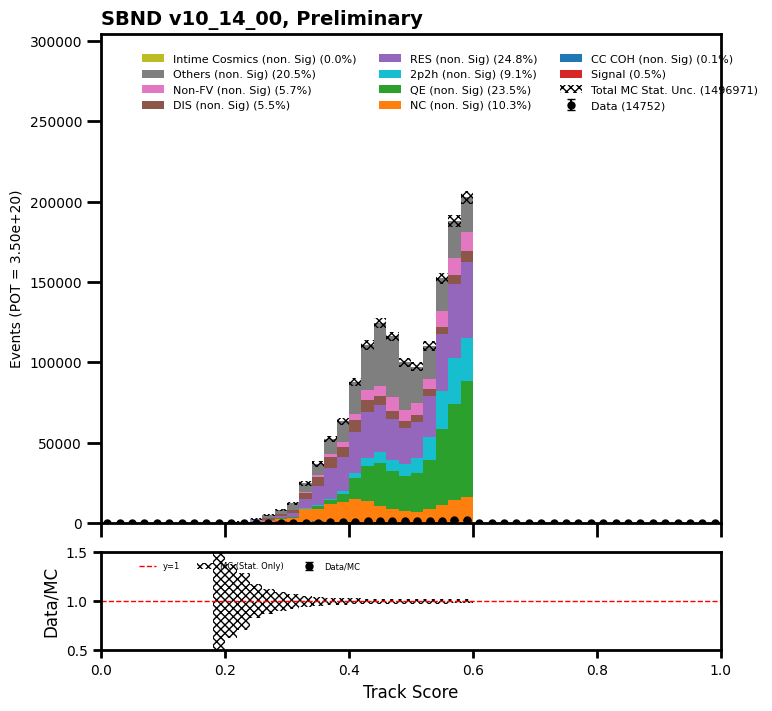

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  14719
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  20  41
 166 230 243 248 230 253 239 267 249 256 263 242 252 265 263 266 247 269
 247 263 268 258 248 250 250 253 235 264 234 280 202 215 202 230 226 202
 234 207 215 231 234 242 202 214 209 230 241 206 238 216 237 208 227 210
 200 189 212 167 191 199 182 180 180 129  29  24   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.      1606.3079  2983.1433
 15910.104  21952.883  23482.75   24018.078  25012.41   25241.92
 23712.332  23788.854  25242.283  24783.275  23406.443  24859.787
 25318.732  25624.715  24936.31   25165.795  25930.807  25471.816
 23941.984  25242.344  26542.486  25088.744  24094.24   23329.14
 24399.84   27000.25   25929.457  23864.281  28682.719  23557.967
 25699.574  25928.951  26464.45   25852.473  26387.8

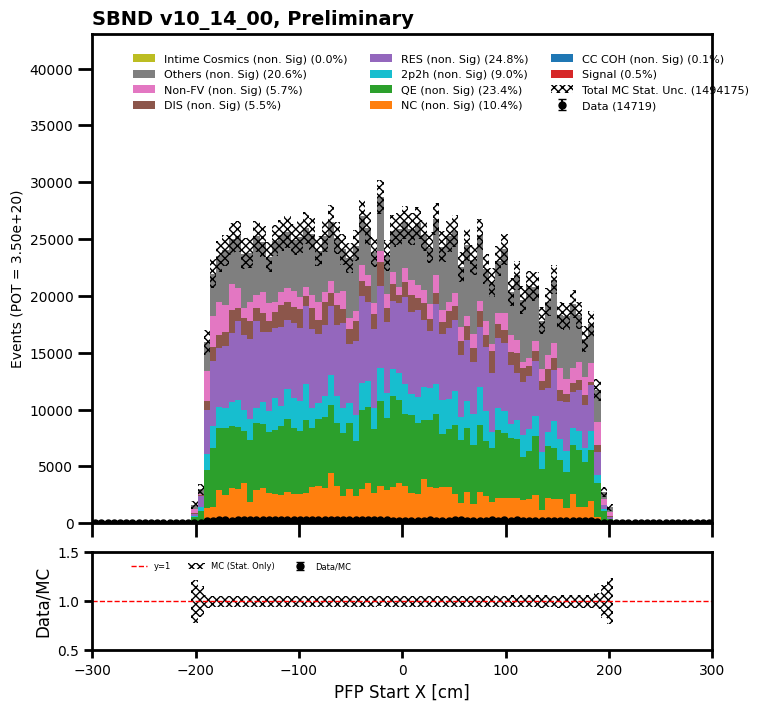

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14719
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   3   1  34  35
 176 251 240 220 230 256 254 235 242 241 229 224 262 215 209 241 235 273
 258 267 240 265 262 273 281 249 257 250 237 244 307 259 274 275 246 281
 239 254 278 250 264 285 290 262 269 247 259 260 196 171 158 136 156 173
 145 151 142 162 166 139 135 145 104  94  70  77   4   6   0   0   0   0
   0   0   0   0   0   0   0   1   0   0]
[   76.49085     0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.         76.49085
     0.          0.         76.49085   458.94513  3518.579    4665.943
 14150.813   23329.723   22564.852   24782.96    22182.248   22335.254
 25012.666   21188.19    20576.238   24094.854   27689.945   23635.895
 24324.328   24706.824   23559.512   24630.398   25624.785   27154.64
 27307.629   25548.328   24936.418   26312.943   29066.094   27076.766
 25700.059   28071.125   29448.047   28989.027   27535.73    29753.719
 26999.

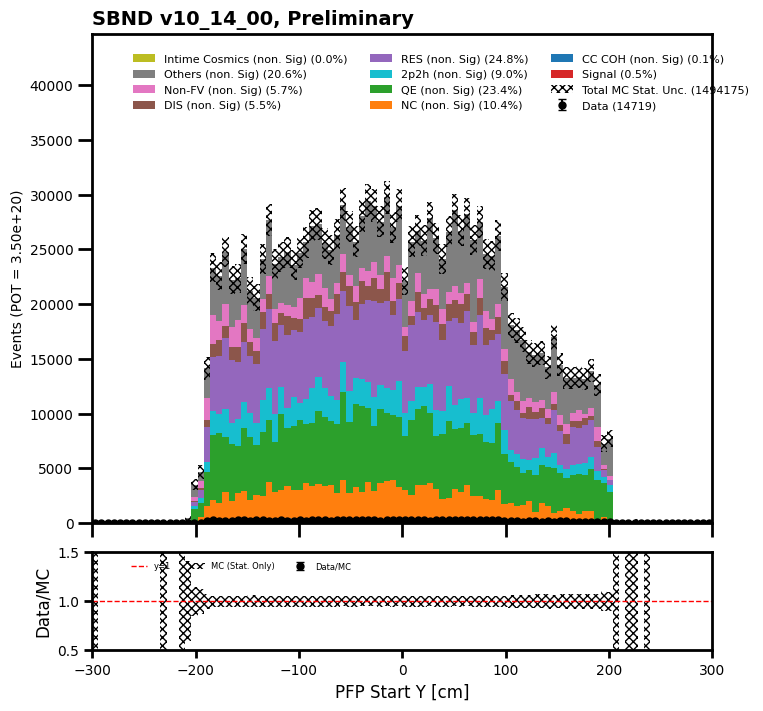

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14719
[  0   0   0   0   0   0   0   0   0   0   0   0   0   4  54 103 245 270
 254 248 242 260 216 194 198 255 239 222 227 202 244 252 242 246 240 248
 238 228 259 256 250 238 260 258 246 243 261 268 259 251 234 210 202 197
 189 207 180 220 211 201 219 191 220 182 186 226 219 210 222 191 206 202
 228 202 199 217 196 233 145  59  60  43  43  45  41  45  16   1   0   1
   0   0   0   0   0   0   0   0   0   0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.        229.47256  4206.997    9561.361   25241.973   25165.572
 27383.71    27001.092   23941.549   27536.771   20882.232   20346.79
 25624.744   26083.688   26313.184   24324.367   27001.582   23406.457
 25624.734   22947.613   25395.365   24095.002   23789.041   23636.057
 26848.707   24629.94    25394.766   27918.676   24093.465   23940.43
 23940.303   24322.834   23863.92    23405.033   25699.617   27382.215
 26081.955   

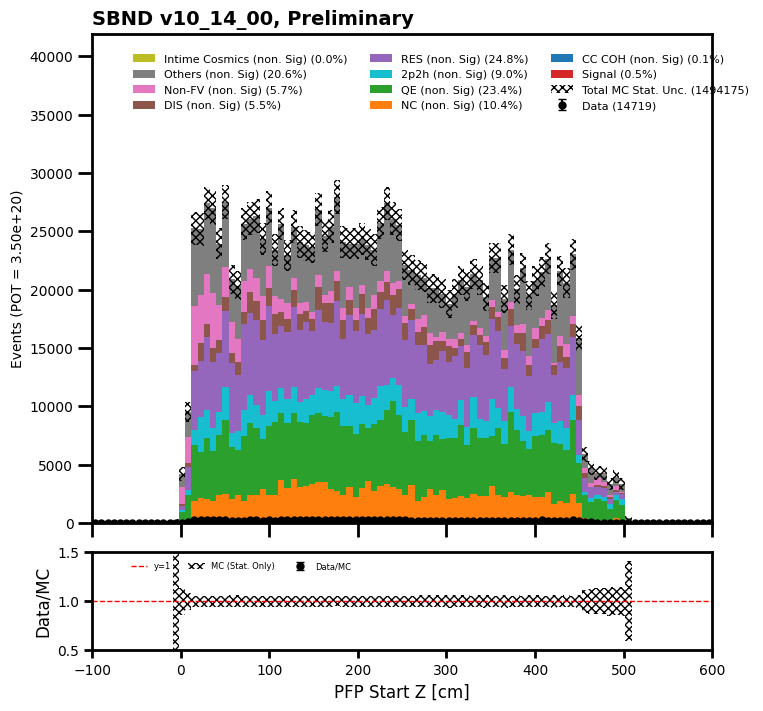

total data =  1354
[ 51  54  91 104 105 103 104  84  75  79  93  68  81  76  42  10   7   4
  11   8   6  10   9   7   4   3   8   6   6   8   4   6   1   2   2   4
   3   4   6   5]
[   688.42334  65705.78    144567.      148468.38    147011.56
 139666.48    145172.69    148317.94    141511.39    149547.77
 141747.88    147560.89    141211.16    125606.12      1147.4766
   1070.9609     688.47656   1300.4609     994.4844     918.
   1606.4609    1376.9688     535.5        994.47656    764.9531
    611.9844     917.97656    841.46875    994.4453     458.98438
    841.46094    382.5        841.4531     458.96875    459.
    535.4844     458.96875    994.4844    1147.4688    1070.9766 ]
data ratio  [0.07408232 0.00082185 0.00062947 0.00070049 0.00071423 0.00073747
 0.00071639 0.00056635 0.00052999 0.00052826 0.00065609 0.00046083
 0.00057361 0.00060507 0.03660205 0.00933741 0.01016738 0.00307583
 0.01106101 0.0087146  0.00373492 0.00726233 0.01680672 0.00703888
 0.00522908 0.00490209 0.0

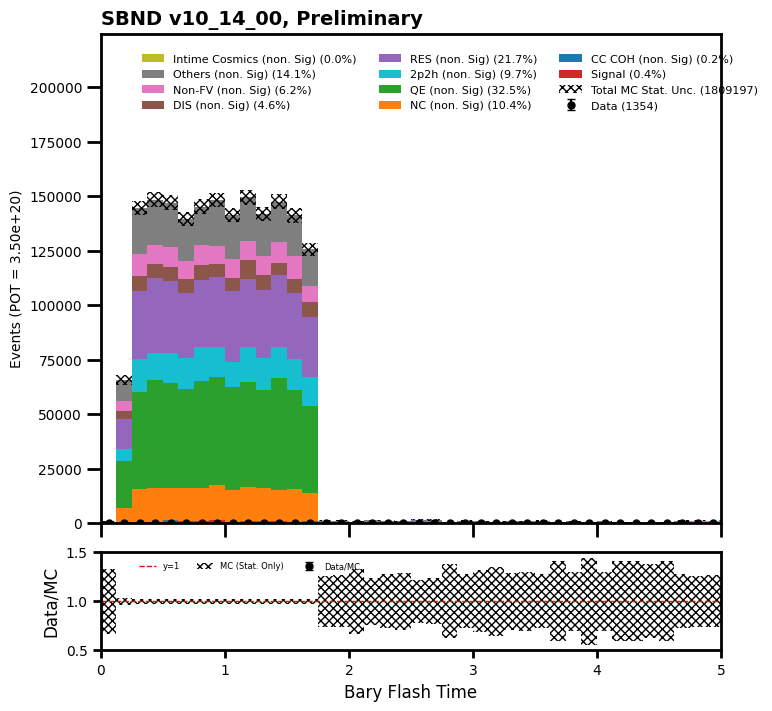

total data =  17884
[8499 3408 1795 1091  704  517  353  273  209  148  125  112   97   54
   59   56   46   40   44   21   18   32   16   26   14   19   17   11
   14    9    9    5    6    7    4    8    3    6    3    6]
[8.84231188e+05 4.33250625e+05 1.98124734e+05 1.01662555e+05
 5.79834609e+04 3.53409805e+04 2.65440566e+04 1.75174844e+04
 1.25453799e+04 8.56756152e+03 8.10852979e+03 5.27816406e+03
 4.58974902e+03 4.05428003e+03 2.67734375e+03 2.67739844e+03
 2.90685938e+03 1.68292188e+03 1.52986719e+03 1.37689062e+03
 1.68290625e+03 1.60637500e+03 8.41429688e+02 6.88445312e+02
 6.11953125e+02 5.35460938e+02 9.94476562e+02 6.11960938e+02
 7.64945312e+02 6.88421875e+02 2.29484375e+02 3.82453125e+02
 3.82468750e+02 4.58968750e+02 2.29492188e+02 2.29500000e+02
 7.65000000e+01 1.52984375e+02 4.58992188e+02 1.52992188e+02]
data ratio  [0.00961174 0.00786612 0.00905995 0.01073158 0.01214139 0.01462891
 0.01329865 0.01558443 0.01665952 0.01727446 0.01541586 0.0212195
 0.02113405 0.013319

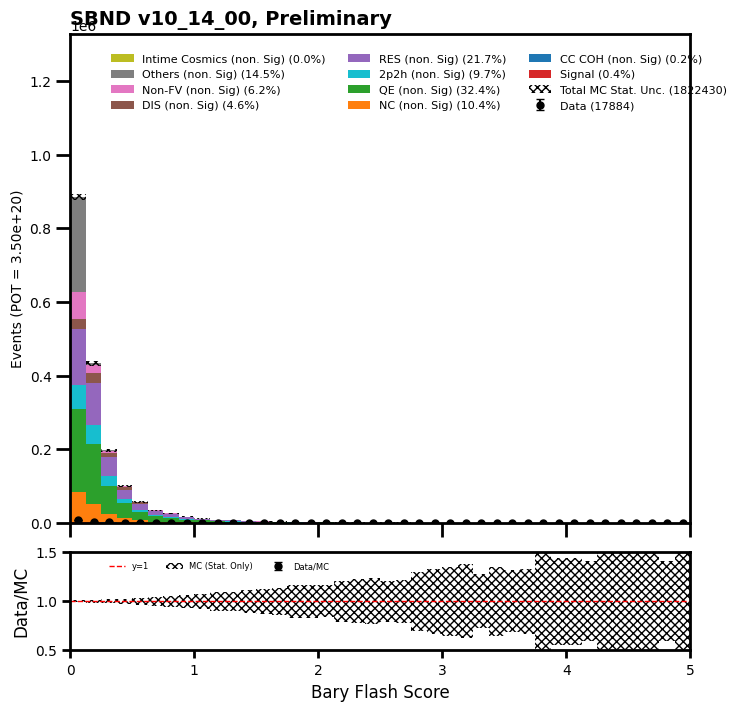

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14676
[    0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0 10700  2611   799   345
   147    56    15     2     1     0     0     0     0     0     0     0
     0     0     0     0]
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 1.1154830e+06 2.4348819e+05 7.8867891e+04 3.3735250e+04 1.1474539e+04
 5.1252812e+03 2.2184360e+03 1.5299219e+02 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        n

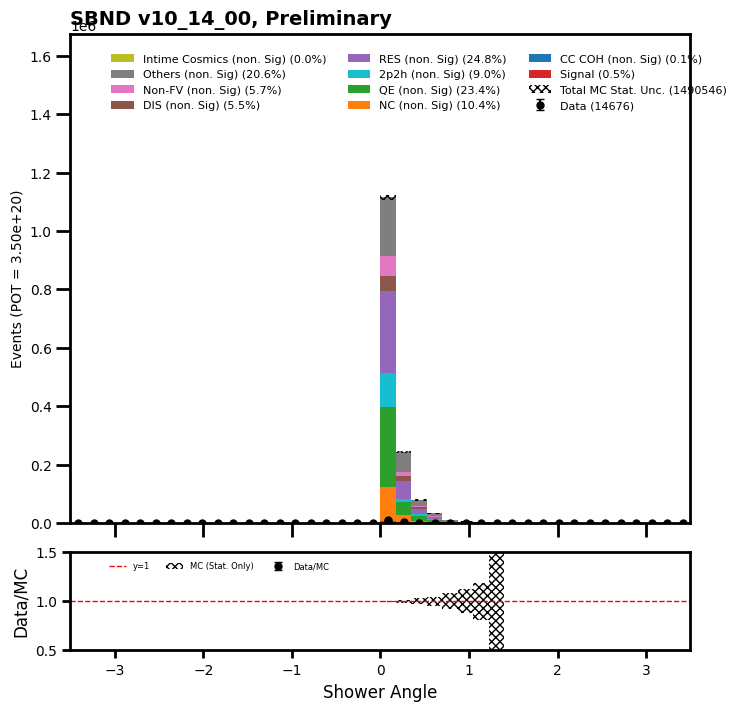

total data =  11419
[3933 2849 1257  612  374  316  248  189  163  145  114   89   78   73
   55   63   48   56   55   38   25   43   40   47   41   39   24   34
   29   27   38   34   30   25   37   31   32   23   36   29]
[393785.66   276593.8    120853.97    56525.18    40310.28    29602.877
  22259.566   19734.99    17746.201   13692.109   11167.764    9408.217
   7878.483    7343.1875   6272.2485   5124.789    7037.561    6655.1626
   5584.247    6731.6094   5125.211    5431.2173   5737.1953   4895.6953
   4513.211    4666.289    3518.8281   3136.3438   2983.2734   3365.8125
   2983.2188   3442.2656   2371.3984   3595.35     3212.7734   4054.1953
   3365.8032   2065.375    2753.7734   3595.3828]
data ratio  [0.00998767 0.0103003  0.01040098 0.01082703 0.00927803 0.01067464
 0.01114128 0.0095769  0.00918506 0.01059004 0.01020795 0.00945982
 0.00990038 0.00994119 0.00876879 0.01229319 0.00682054 0.00841452
 0.00984913 0.00564501 0.00487785 0.00791719 0.00697205 0.00960027
 0.0090844

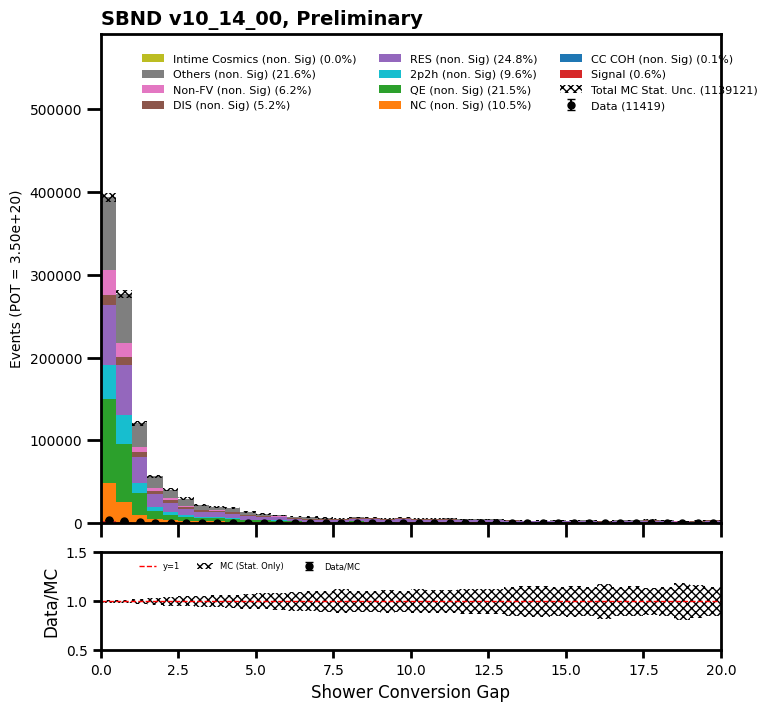

total data =  13888
[ 218  626 1111 3073 1684  869  668  797  834  693  473  406  309  222
  208  178  150  146  112  112  108   91   85   92   78   70   67   59
   53   53   40   31   36   26   19   28   13   18   15   17]
[ 10402.611   33885.297   79706.98   307496.7    152673.9     82993.61
  63566.145   87354.12   102575.516   77490.09    60661.348   41307.996
  33276.008   27538.396   21418.848   19965.418   16216.967   13233.672
  13922.068   14381.131   11627.3125  12315.842   12774.742    9714.992
  11015.25    10556.398    7955.547    7879.078    7190.633    5584.241
   6808.0938   6348.992    5966.672    6196.2188   5048.75     3901.2642
   3365.836    3289.2734   2983.3125   3289.2266]
data ratio  [0.02095628 0.01847409 0.01393855 0.0099936  0.01103004 0.01047069
 0.01050874 0.00912378 0.0081306  0.00894308 0.00779739 0.00982861
 0.00928597 0.00806147 0.00971107 0.00891542 0.00924957 0.01103246
 0.00804478 0.00778798 0.00928847 0.00738886 0.00665375 0.0094699
 0.00708109 0.0

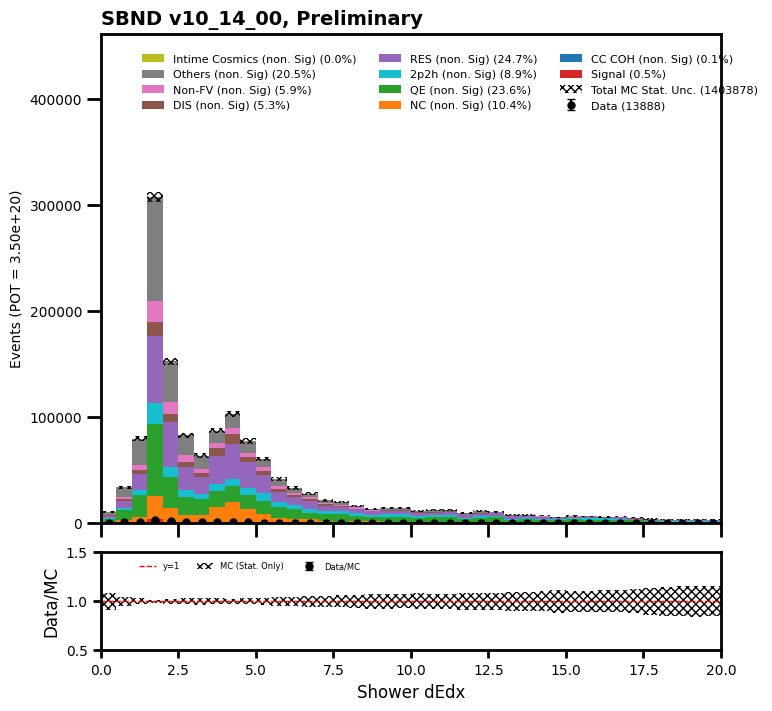

In [55]:
#trackscore

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.trackScore < 0.6)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].pfp.trackScore < 0.6)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].pfp.trackScore < 0.6)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  767
[767   0]
[80085.92243284     0.        ]
data ratio  [0.00957721        nan]


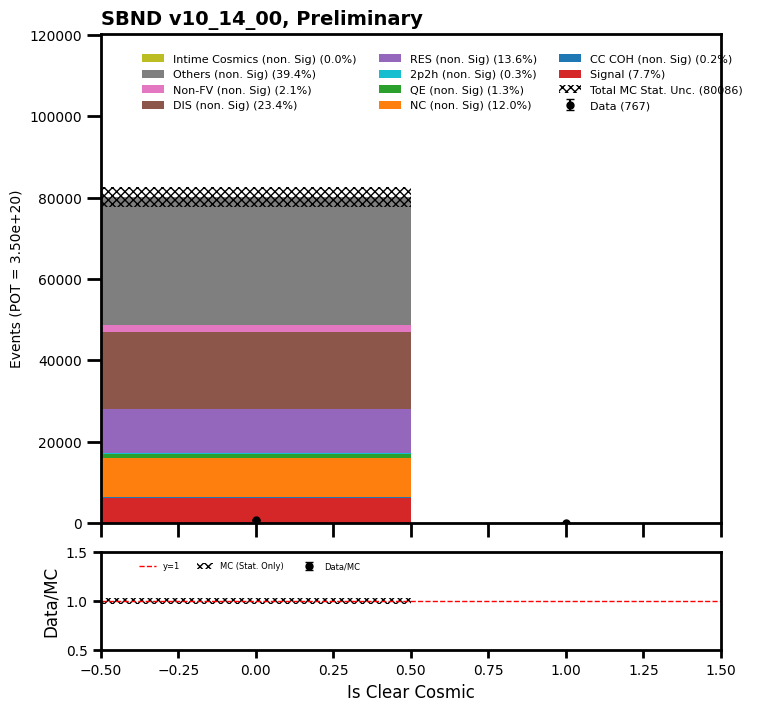

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  671
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 301  44  48  81
  78  50  33  15  11   6   1   1   1   1   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.      19887.

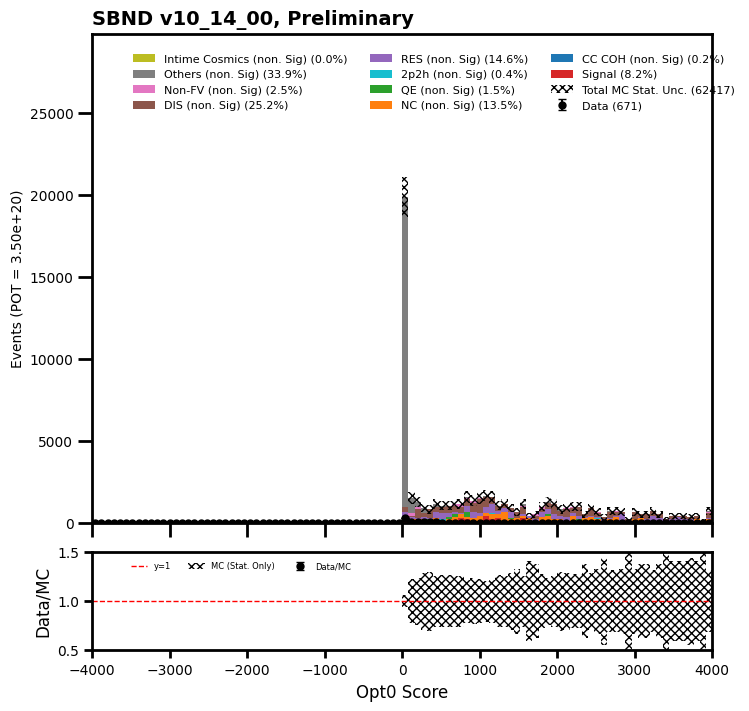

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  767
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0 188 189 160 147
  76   7   0   0   0   0   0   0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.     16369.061  13844.825  19046.164  16675.008
 13079.931   1070.8702     0.         0.         0.         0.
     0.         0.    ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        na

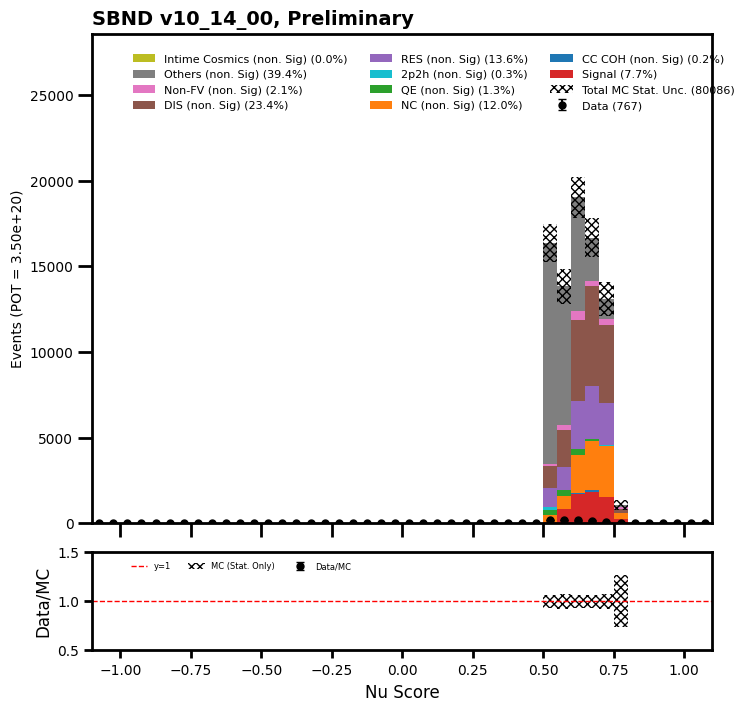

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  767
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  7 14 14  7 12  7
 13 18 11 17 16 13 16 11  7 12 17 13 16 14 14  8 17 13 22 16 14 14 16 14
 15 14 11  8  9 12 15  9 11 11 11 14 13 14 10  9 15  7 12 13 14  7  8 12
 13 11  5  6 11  8 12  9 11  4  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
  917.89026 1376.8354  1759.2897  1070.8726  1453.3268  1300.345
  841.3999   994.3817   994.3806  1835.7793  1223.8531  1223.8533
  994.38086 1606.3074  1453.3264   841.3993  1147.3649  1453.3286
 1682.8021   994.3834  1147.3644  1759.293   1223.8555  1070.873
  994.3821  1453.329   1529.8186  1376.8364  1529.8188   994.38293
 1300.347   1682.8024  1376.8386  1070.8744  1147.3612  1759.284
 1453.3259  1376.8326  1223.8516  1606.3032  1606.3069   764.9048
 1529.8141  1147.3591  1453.32

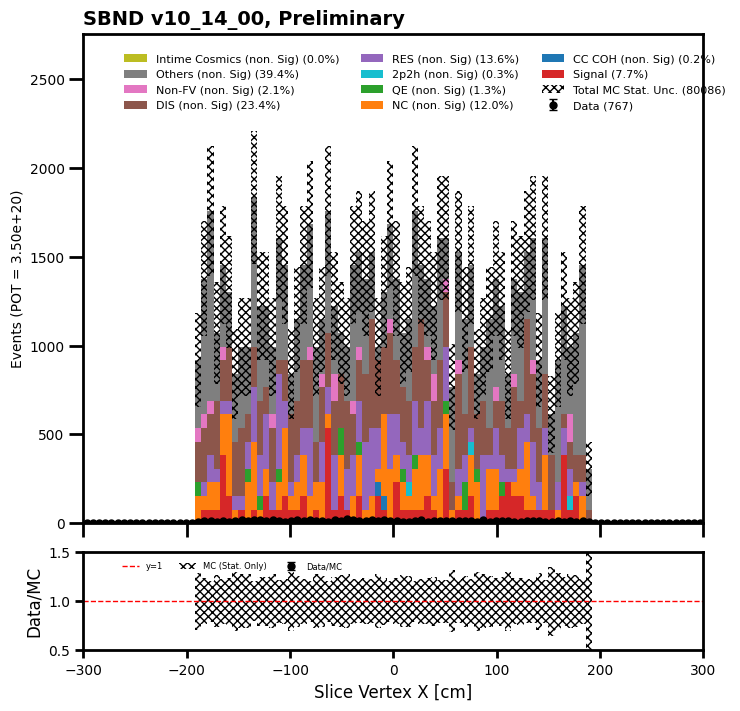

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  767
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  4  8  9  5 16 16
 12 13 16  7 17 11 15 15  8 18 14  8 15 13 16 13 14 12 14 11 15 13 16  8
 19 15 16 21 14 10 19 14 14 19 14 14 14 10 16 14 15 12  7  4  7  8 10  5
  6 16  9  5  4 11  9  8  7  9  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
  611.9268   917.89026 1606.3079   841.3993  1070.8721  1682.7997
 1759.2906   458.94556 1529.8177  1453.3259  1070.8715   917.8899
 1070.8713  1300.3442   841.3988  1070.8712  2065.252   1376.8344
 1223.8544  1223.856   1376.838   1453.3278  1529.8196  1453.3268
 1988.7645  1835.7859   764.91113 1835.7854  1759.2928  1759.2938
 1529.8218  1682.8035  1376.838    994.38354 1147.3655  1223.8522
 1376.8336  1453.322    994.3789  1682.7944  1453.3219  1912.2661
 1300.3428   994.38    1223.

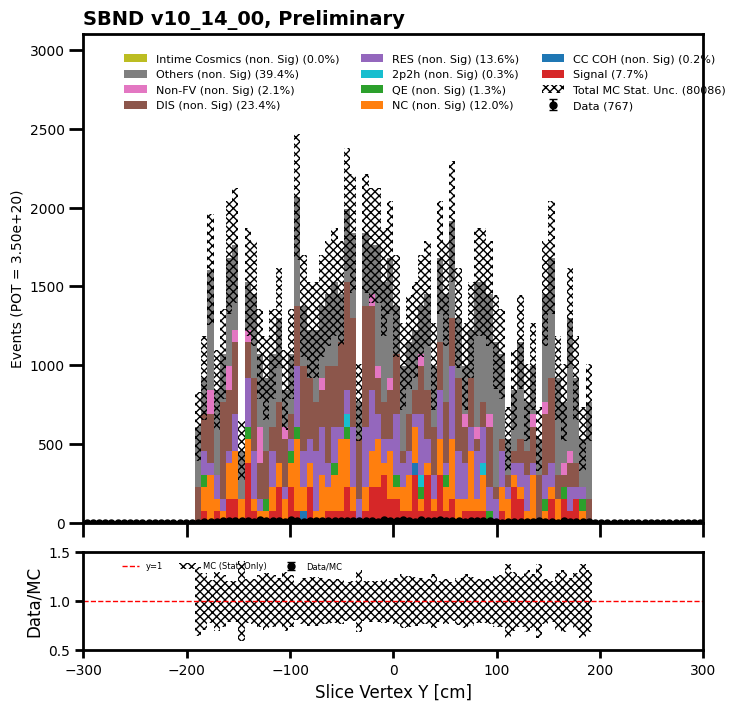

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  767
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  7 21 12 16 15 12  9 14 10
 13 10 25  8 15 13 12 16 20  7  7 22 15 18 10 14 14 14 11 14 14 12 16  7
 18 13 14 19 16  2 10 14  8  9  9 11 16 12  9 12  8 10  6  8  9 13 12  7
  9 11  8  9  6 10  6  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.       688.41766 1835.7803  1912.2712
 1223.8539  1453.3271  1147.3635  1529.8184  1147.3625  1835.781
 2065.2527  1223.8524  1606.3059  1759.2881  1529.8162  1759.2932
 2065.2573  1912.275   1529.8206   994.38367 1759.2925  1606.3108
 1529.8196  1606.3115   841.4016   917.89233 1606.3127  1147.3663
 1529.8123  1453.3248  1300.3392  1147.363   1529.811   1300.3395
 1759.2866  1147.3589  1147.3629  1147.3604  1300.3442  1223.852
  841.39667 1147.3584  1147.361   1300.3413   458.94336  688.41504
  994.38086  994.37646 11

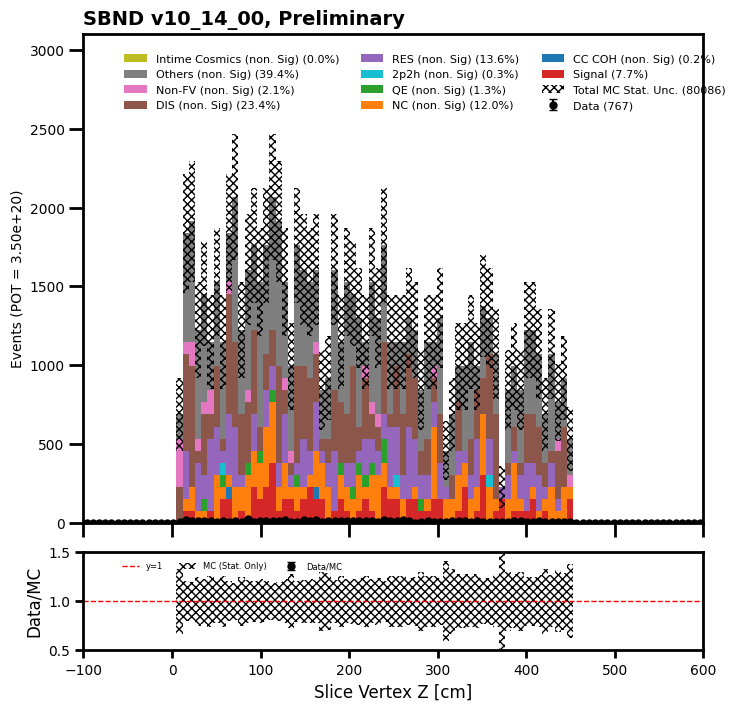

total data =  653
[ 0  5  4  8  9 12  8 17 14 20 12 30 23 26 24 30 29 25 25 24 31 19 19 25
 25 14 20 15 19 17 11 13 15 11  9 17  5  9  5  9]
[  76.49085  229.47256  152.98169  535.436    611.9268  1682.7993
 1606.3096  1529.8168  1376.8342  1682.7966  2830.1587  3289.1162
 2906.6587  3289.1152  2524.2017  2677.186   3518.587   2677.173
 2141.7395  2371.2092  1682.7919  2065.247   2141.7344  1682.7905
 1759.2871  1835.7797  1147.3629  1606.3033  1835.7761  1759.2872
 1912.2682  2065.2505  1529.8169   841.39905 1070.8688  1147.3633
  688.4155  1070.8711   688.41797  994.38007]
data ratio  [0.         0.0217891  0.02614692 0.0149411  0.01470764 0.00713098
 0.00498036 0.01111244 0.01016825 0.01188498 0.00424004 0.00912099
 0.00791287 0.00790486 0.00950796 0.0112058  0.00824195 0.00933821
 0.01167275 0.01012142 0.01842177 0.00919987 0.00887131 0.01485628
 0.0142103  0.00762619 0.01743128 0.00933821 0.01034985 0.009663
 0.00575233 0.00629464 0.0098051  0.01307346 0.00840439 0.01481658
 0.007

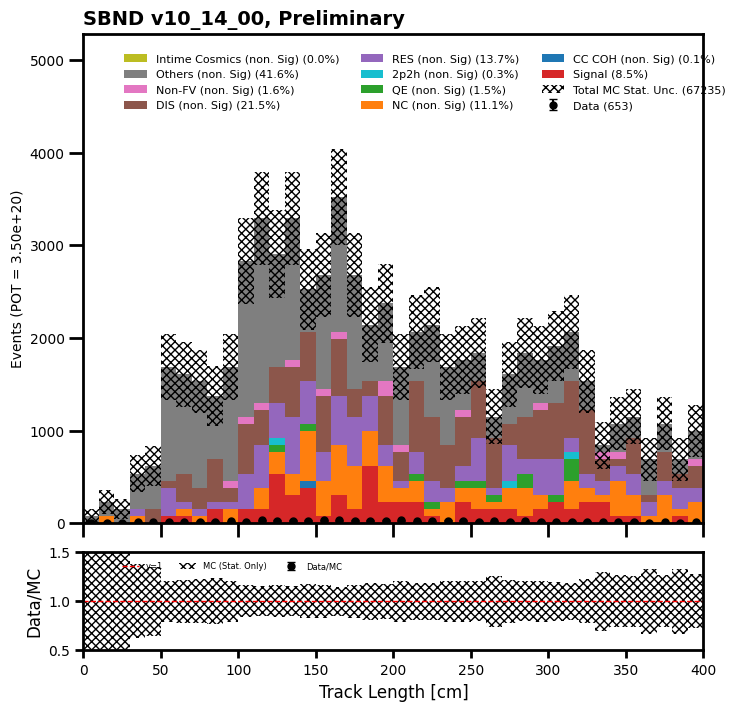

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  766
[ 0  0  0  0  0  0  0  0  0  0  3  9 20 34 61 72 74 73 87 68 57 38 40 24
 24 12  6 12 24 28  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.        76.49085  382.45425  611.9268
 2218.2346  4359.9795  6425.2344  6578.211   8414.01    8414.002
 8872.948   7649.0674  6348.723   4359.971   4054.0024  3289.0952
 2524.1833  1606.3015  1147.3572  1070.8684   611.9258   994.3802
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.         0.00784408 0.01470764
 0.00901618 0.0077982  0.00949382 0.01094523 0.00879486 0.00867601
 0.00980508 0.00888997 0.00897818 0.00871565 0.00986679 0.00729684
 0.00950803 0

/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


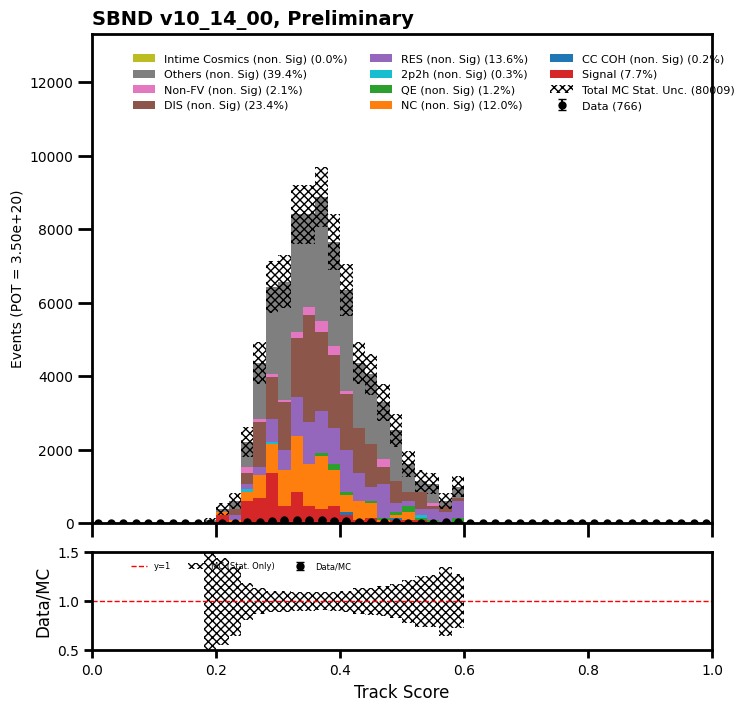

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  766
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  6 12 19  7 10  8
 12 12 13 13 16 15 13 10 10  9 18 16 14 14 17  5 21 19 15 20 16 14 12 16
 12 15 14  7 14  9  8 13 10 12 10 13 12  9 17 11 14  9 10 17 16  8  9 10
 10 10 10  9  7  7  9  3  9  4  2  4  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.        76.49085  229.47256
  764.90857 1529.8171  1223.8535   917.89087 1376.8358  1529.8179
 1453.3271   917.8904   611.92676 1606.3073   994.38116 1223.853
 1682.7979  1147.362   1223.8542   994.3805   994.38074 1682.802
 1300.347   1759.293   1223.8556  1376.8375  1529.8198  1376.838
 1070.873   1147.3649  1376.8362  1835.7817  1300.3477   994.3832
 1223.8563  1529.82    1606.3121  1759.289    611.92554 1606.3046
 1300.343   1376.8312  1300.3425  1529.8113  1606.3052   994.3784
 1223.8512   841.39856 145

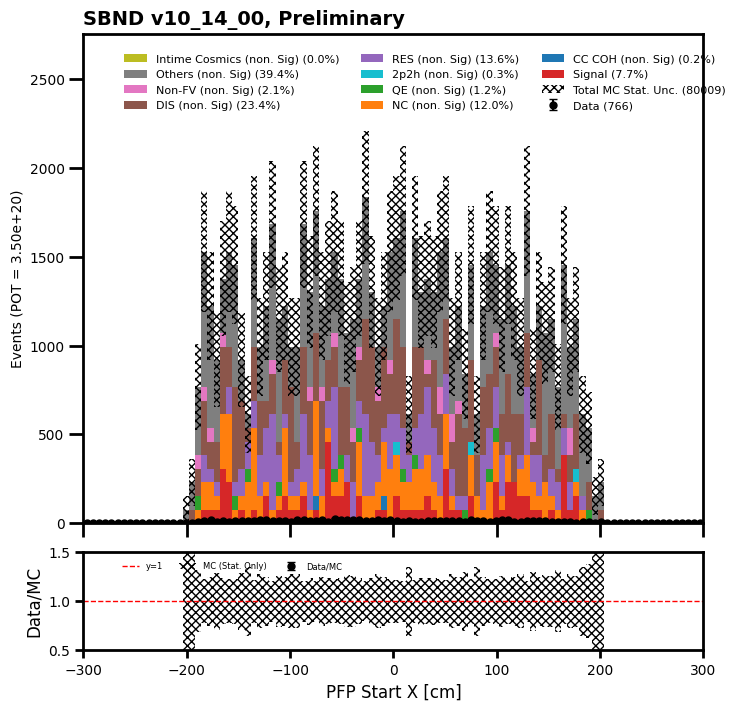

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  766
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  3  0  2  0  6  4  8  8 12 13
 11 17 17 10 18 12 15  7 14 20 13 12 12 13 18  9 13 12 12 11 17 17 15 18
 18  8 17 15 16 13 10 16 19 15 12 12 12 13 14 16 13 14  7  6  9  7  9  7
  3  7  8  9  4  5  8  6  5  3  1 12  2  5  0  0  0  0  0  0  0  0  0  0
  0  1  0  0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.         76.49085
    0.          0.         76.49085   305.96344   841.3993    458.94516
  305.96338   994.381     994.381     764.9089   1223.8541   1606.3086
 1376.8367    841.3993   1147.3629   1223.8541    994.38025  1070.8716
  917.8893   1147.3625    841.39905  1453.3251   1759.289    1682.7982
 1223.8544   1070.8733   1070.874    1682.8007   1223.8564   1835.7816
 1682.7999   1759.295    1070.875    1682.802    2065.2583   1759.2932
 1529.8232   1453.3303    994.3832   1147.3655   1376.8372   1529.8159
 1223.8507   1223.8506    994.3779   14

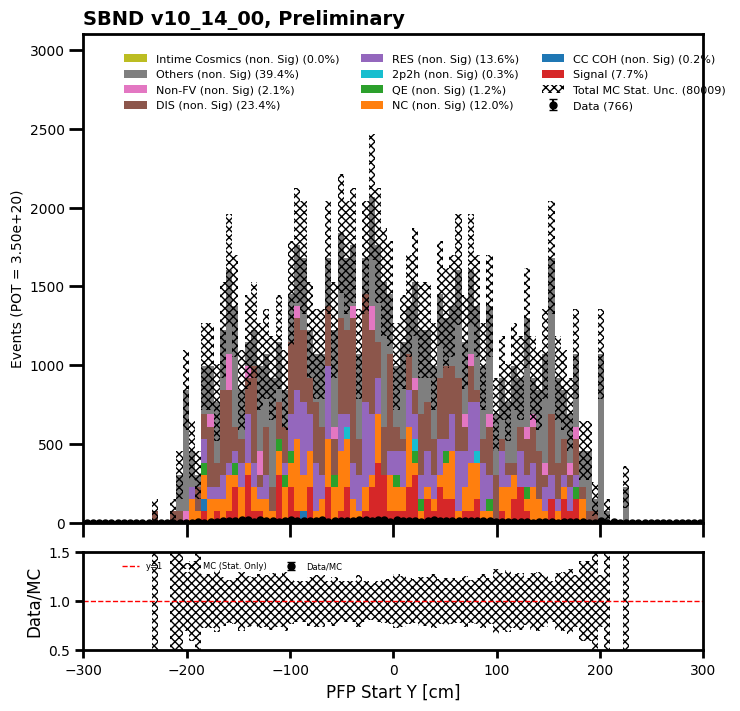

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  766
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  7  7 11 13 11  7 13  9  9  9
 10 11 15 15 16 10 17 17  9 18  5 16 20 11 10 16 12 15 15 14 10  8 17 17
 14 15 15 18  9  8  6 10  8 17  9 10 14 14 10 10  8 16  9 10 10 12 11 10
 11  7  7 12 10  4  9  6  2  0  0  1  1  0  2  0  0  1  0  0  0  0  0  0
  0  0  0  0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.        152.9817    688.4177    229.47255   994.38104  1453.3262
  917.89026  1682.7998    688.418    1223.8541   1300.3455   1529.8177
 1376.8344   1223.8535   1300.3442   1606.3074   1912.269    1682.7981
 1988.7668   1147.365    2141.747    1300.3472   1300.3474   1453.3293
 1529.8186   1682.7999   1147.3655   1682.8015   1223.8577   1070.8756
 1453.3303    841.4005   1453.3225   1300.346    1223.8502   1300.339
 1376.8342   1223.8501   1376.8322    764.906    1300.3436   1223.8525
 1912.2673    994.37695  1759.2847   1529.8105

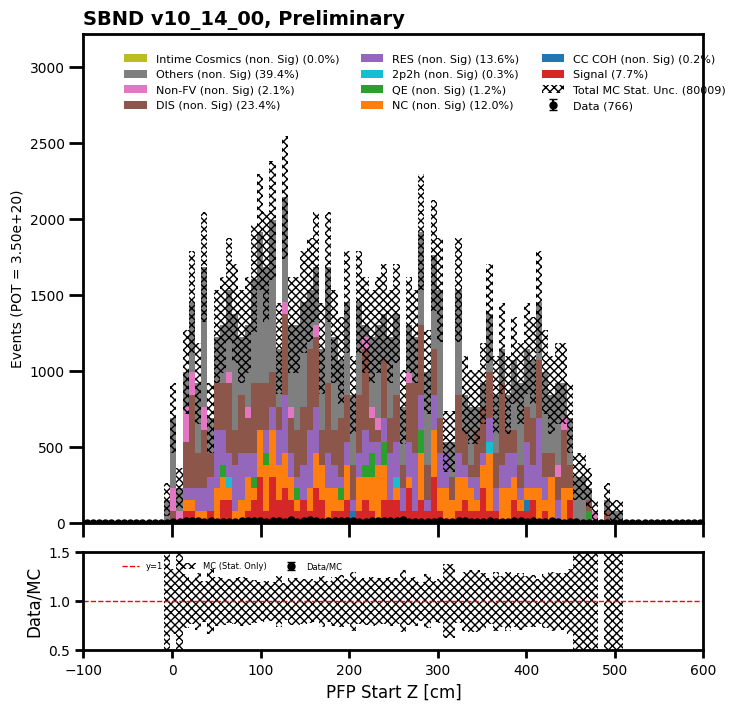

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  57
[1 1 5 6 3 4 4 4 4 3 2 3 1 2 3 0 0 0 2 1 0 1 0 1 1 0 3 0 0 0 1 1 0 0 0 0 0
 0 0 0]
[   0.       2830.1665   5048.4053   5354.369    6119.2783   5277.8604
 5277.8555   5660.3154   4818.9185   5736.8      6042.767    5048.3955
 6501.709    5201.3574      0.          0.          0.         76.490234
  152.98047    76.490234   76.49121   152.98047     0.        152.98047
    0.         76.490906   76.490234    0.          0.         76.490234
    0.         76.49121    76.490234    0.          0.         76.490234
    0.          0.         76.490234   76.49121 ]
data ratio  [       inf 0.00035334 0.00099041 0.00112058 0.00049025 0.00075788
 0.00075788 0.00070667 0.00083006 0.00052294 0.00033097 0.00059425
 0.00015381 0.00038452        inf        nan        nan 0.
 0.01307356 0.01307356 0.         0.00653678        nan 0.00653678
        inf 0.         0.03922069        nan        nan 0.
        inf 0.0130734  0.                nan        nan 0.
        nan        nan 0.  

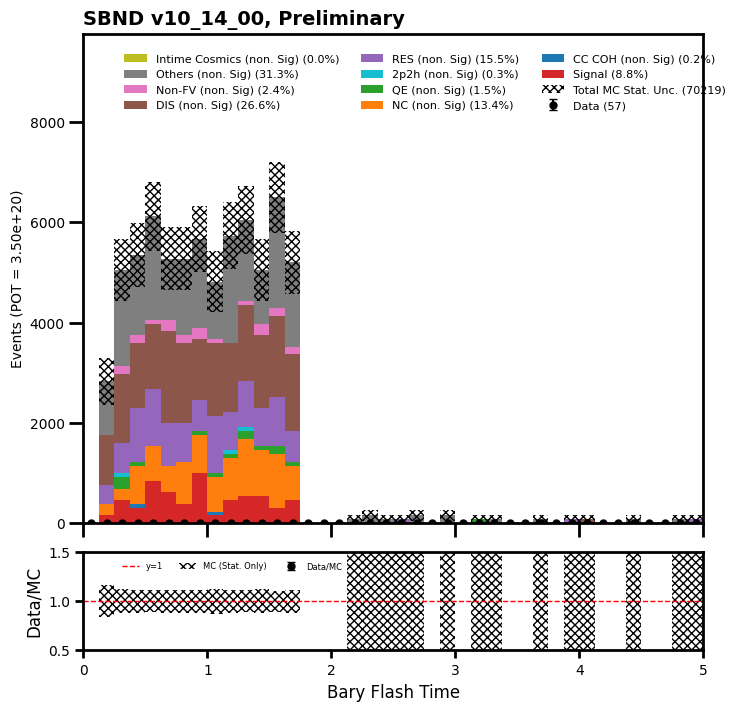

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  688
[437  76  37  27  23  22   9   9  11   3   4   5   5   4   1   0   1   2
   4   0   1   1   0   0   0   4   1   1   0   0   0   0   0   0   0   0
   0   0   0   0]
[34114.844    16216.062     7037.165     4589.4565    2065.2598
  1759.2935    1529.8184     611.9238     611.9269     535.43524
   305.96143    229.47168    152.98047     76.490234    76.49121
    76.49121      0.           0.         152.98047     76.49121
     0.           0.         152.98206     76.490234     0.
    76.490234     0.           0.         152.98145      0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.      ]
data ratio  [0.01280967 0.00468671 0.0052578  0.00588305 0.01113661 0.01250502
 0.00588305 0.01470771 0.017976   0.00560292 0.01307354 0.02178918
 0.03268391 0.05229426 0.0130734  0.                inf        inf
 0.02614713 0.                inf        inf 0.         0.
        nan 0.05229426        inf       

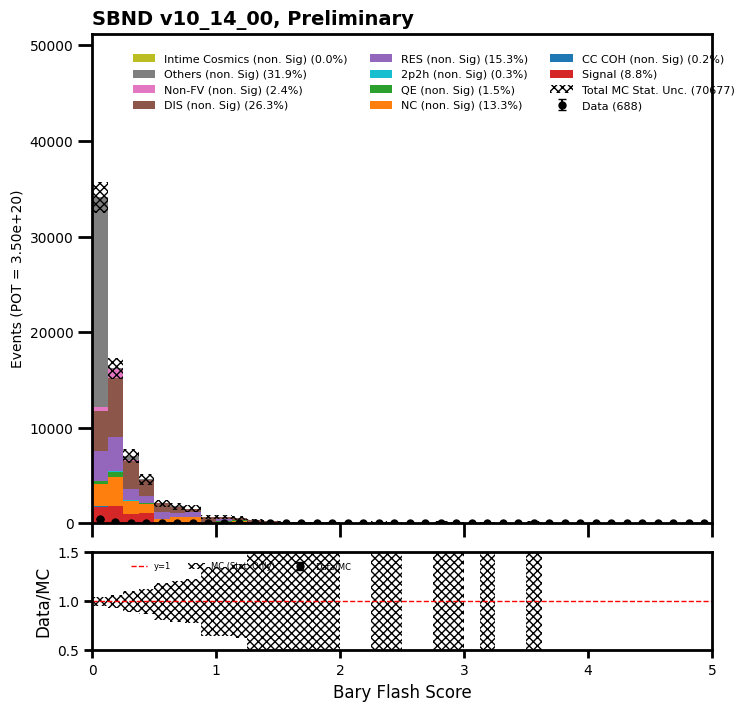

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  766
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0 404 234  61  38  21   6   2   0   0   0   0   0   0   0   0   0
   0   0   0   0]
[    0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.      40157.73    26083.328    8566.955    2983.128
  1147.3574    917.8867    152.98108     0.          0.          0.
     0.          0.          0.          0.          0.          0.
     0.          0.          0.          0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.01006033 0.00897125 0.00712038 0.01273831
 0.01830293 0.00653675 0.01307351        nan        nan        nan
        na

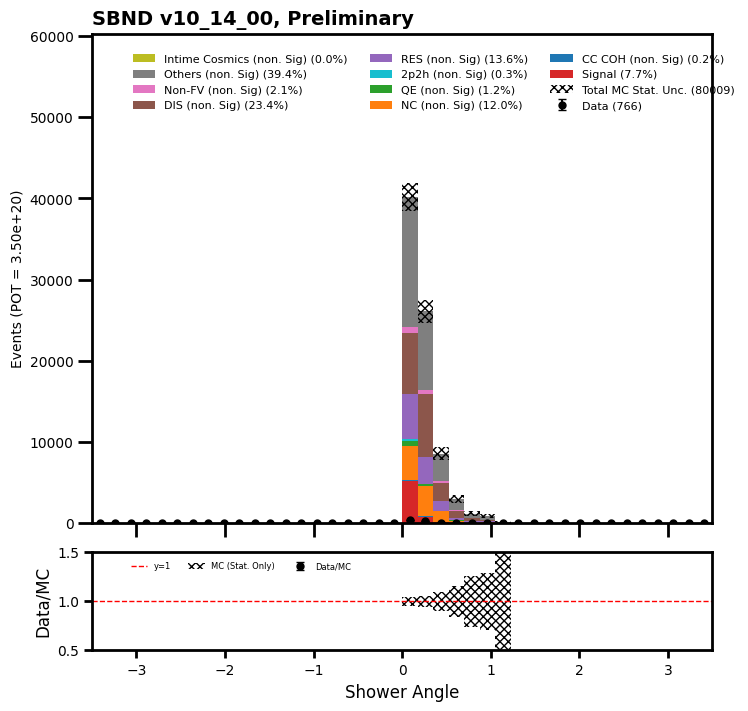

total data =  625
[237  76  46  34  18  19  21  16   9  12   9   7   7   7   9  11   5   5
   5   4   6   4   2   2   5   4   4   3   6   4   3   5   1   2   3   3
   3   1   5   2]
[21340.957    8872.961    4512.9683   3671.5574   2600.6816   2447.6985
  1835.773    1147.3599   1912.2651   1147.361    1223.853     994.3789
   917.8883    994.3805    764.9072    305.96387   688.4165    688.41797
   382.4536    535.4341    305.96387   535.43604   535.43604   382.45374
   152.98145   458.94482   305.96338   152.98096   152.98193   152.98242
   458.94385   611.9263    152.98145   535.43604   229.47168   229.47314
   382.45557   229.47266   229.47168   305.96484]
data ratio  [0.01110541 0.00856535 0.01019285 0.00926038 0.00692126 0.00776239
 0.01143932 0.01394506 0.00470646 0.01045878 0.00735382 0.00703957
 0.0076262  0.00703956 0.01176613 0.03595196 0.00726304 0.00726303
 0.01307348 0.00747057 0.01961016 0.00747055 0.00373527 0.00522939
 0.0326837  0.00871564 0.01307346 0.01961028 0.03922

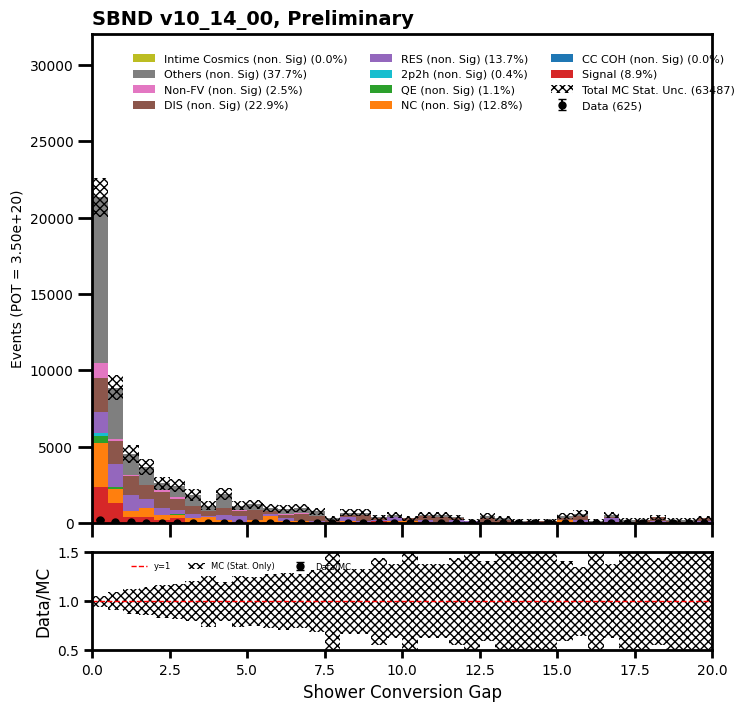

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  613
[ 18  38  51 102  53  39  31  50  48  38  20  17  10  12  10   6   3   4
   8   4   3   5   6   5   3   2   4   0   4   5   1   4   2   1   0   3
   0   1   1   1]
[  841.3982    2218.2324    3518.5833   12238.564     5889.8027
  3136.1135    2524.1902    5966.2793    7419.6074    4130.4966
  3212.6099    1606.3059     917.8906    1376.8351    1070.8677
  1070.8683     611.92676    917.8878     764.9079     764.90576
   535.4365     688.417      688.41614    841.39844    688.41797
   305.9619     229.47168    229.47168    305.96094     76.490234
   229.47168    229.47168     76.49121    152.98145      0.
   229.47314    152.98145    152.98145    229.4707     152.98145 ]
data ratio  [0.02139296 0.01713076 0.01449447 0.00833431 0.0089986  0.01243577
 0.01228117 0.00838043 0.00646934 0.00919986 0.00622547 0.01058329
 0.01089454 0.00871564 0.00933822 0.00560293 0.00490255 0.00435783
 0.01045878 0.0052294  0.00560291 0.00726304 0.00871566 0.00594249
 0.00435782 0.00653676 

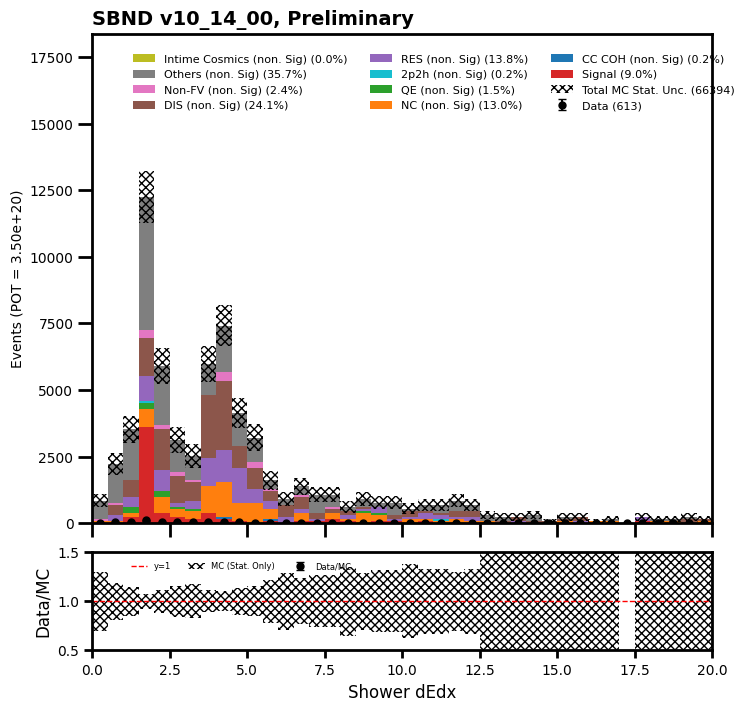

In [56]:
#'pfp', 'shw', 'bestplane_energy'

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.shw.bestplane_energy > 0.5)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].pfp.shw.bestplane_energy  > 0.5)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].pfp.shw.bestplane_energy  > 0.5)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score")

## Shower Selection

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[344   0]
[47806.78273211     0.        ]
data ratio  [0.00719563        nan]


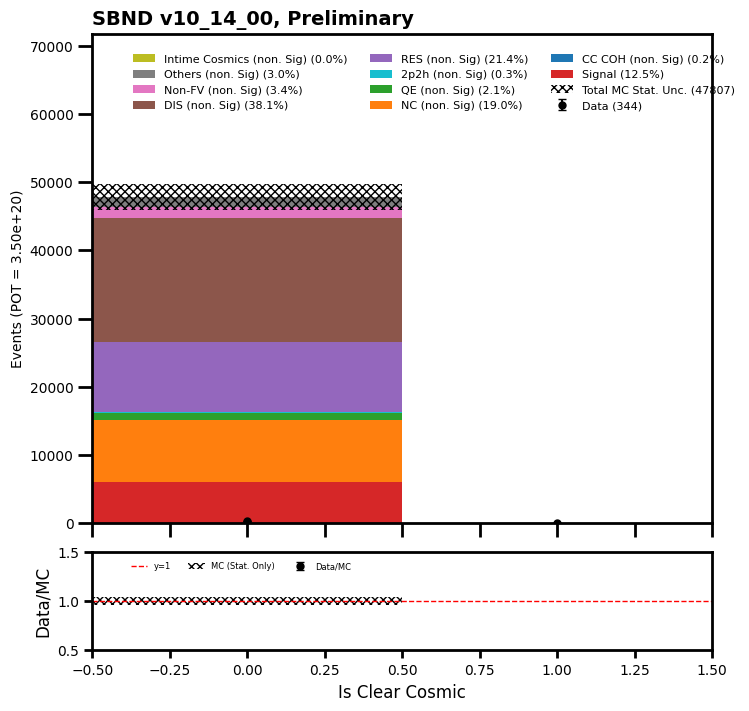

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  337
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  8 20 41 79 76 49 30 14 11  5  1  1  1  1  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.       458.94513  535.436    917.89026  535.4359
  841.3994  1070.8718  1070.872   1070.8726  1147.3633  1147.3634
 1529.8175  1300.3455  1453.325   1682.7982  152

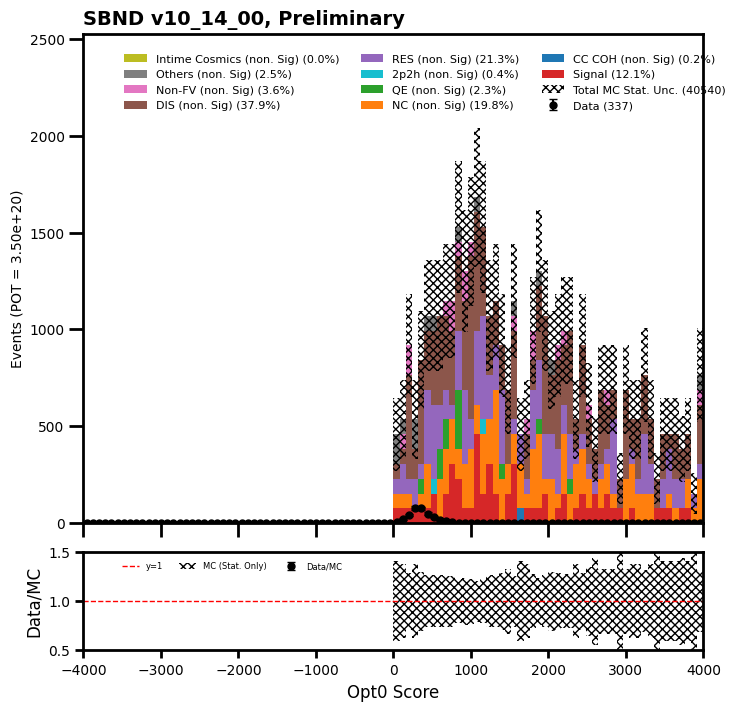

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0  35  58  83 102
  62   4   0   0   0   0   0   0]
[    0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.         0.         0.         0.         0.
     0.         0.      3595.07    6348.7427 11856.08   13615.392
 11473.632    917.8898     0.         0.         0.         0.
     0.         0.    ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        na

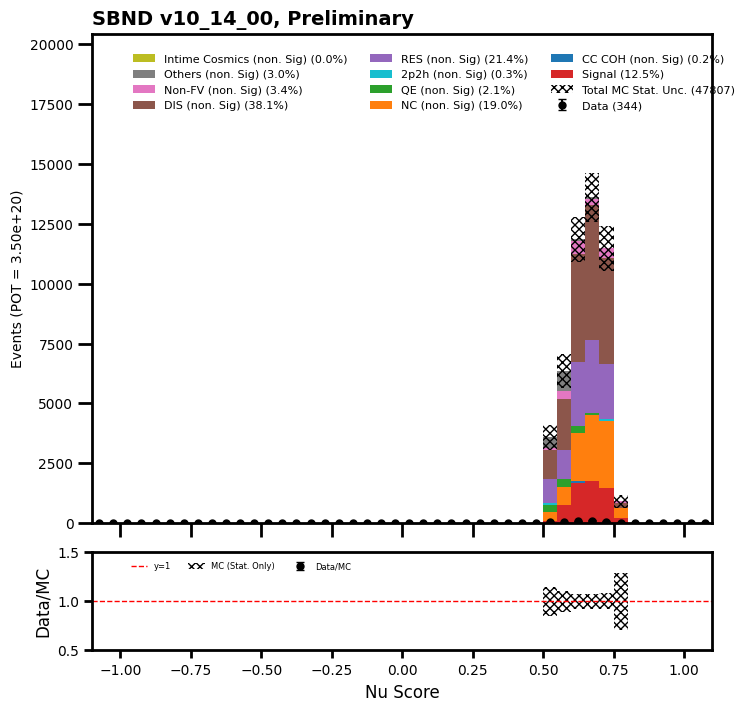

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  2  9  6  3  6  2
  4  7  9  7  8 10  9  5  3  9  6  5  8  5  5  6 13  6 11  7  6  2  5  6
  8  4  4  4  7  7  5  7  5  7  2  8  6  7  4  4  6  2  6  4  7  4  2  3
  1  5  4  3  1  4  3  4  3  3  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
  535.436     611.9268    764.90845   688.4177    994.381    1070.872
  458.9451    535.4364    611.927     841.39966   764.909     688.41797
  535.43646   917.8906    917.89136   611.9271    611.92664   917.89014
 1223.8538    611.92664   841.39954   994.3812    841.3994    764.90845
  688.4175    688.41736   994.3804    688.4165   1147.3624    917.8917
  917.891    1147.3639    764.90967   764.90955   764.90967   917.89087
 1147.365     917.89026   764.90924   841.4004

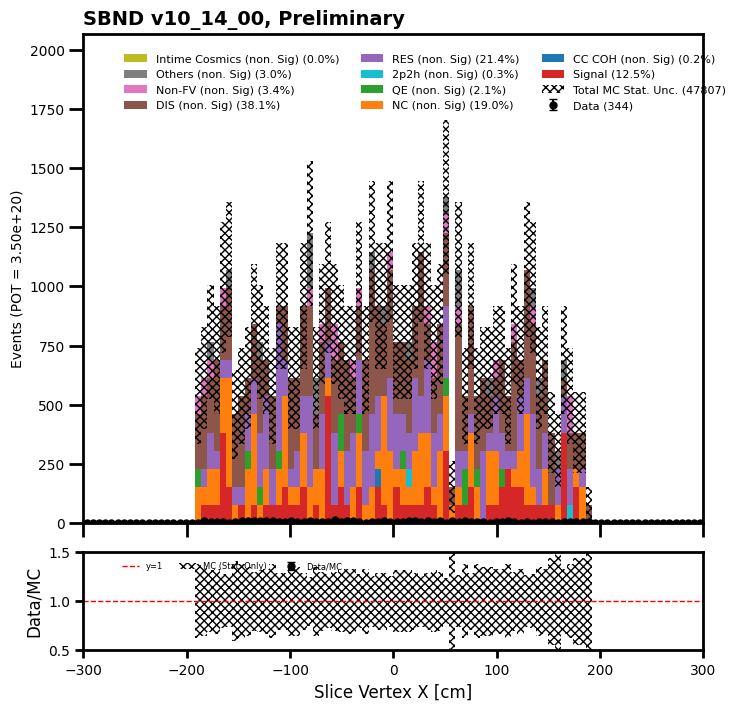

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  2  4  5  2  7  6
  5  6  9  2  6  6  5  8  3  8  8  4  8  5  7  2  8  6 11  3  5  7  9  4
  9 11  7  8  7  4 11  8  7 11  7 11  7  5  6  6  6  5  3  2  3  4  3  2
  1  2  3  1  2  2  2  4  2  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
  152.9817   535.436    764.9085   229.47255  764.90857  917.89014
 1147.3627   152.98175 1223.8539   841.39996  611.9271   458.94556
  611.927    841.39996  611.92725  764.9082  1376.8354   994.38074
  917.89     688.4177   917.89075 1223.853    917.8904  1070.8717
 1529.8158  1223.8567   535.4375  1300.3474  1453.328    994.38184
  764.90967  917.89136 1070.8732   458.94507  688.4182   688.41846
  841.39984  764.9099   611.92773 1147.3629   841.40027 1223.8536
  994.3825   688.4181  

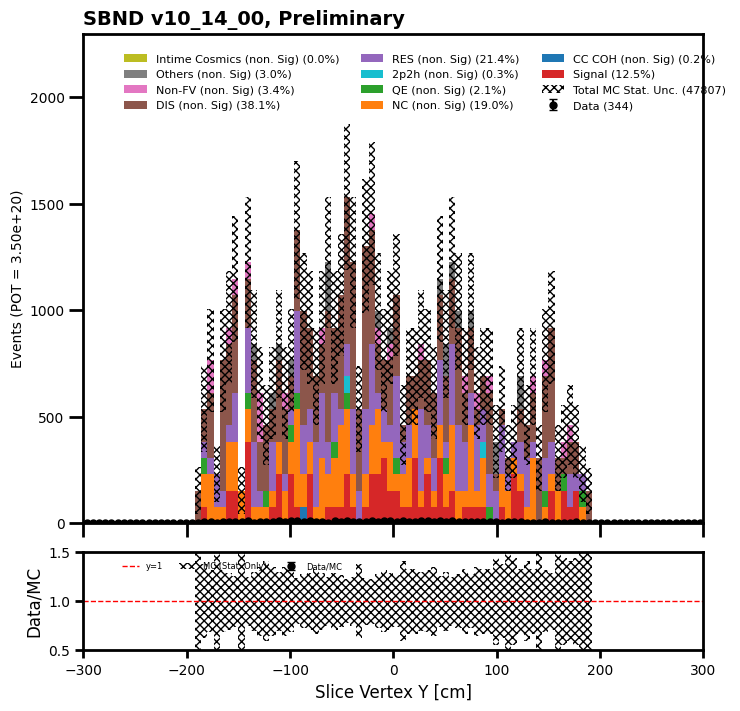

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1 11  5 10  5  5  4  6  4
  9  5 17  4  6  8  4  8  4  3  2  7  8  8  5  8  9  8  2  6  5  3 11  3
  7  7  6  8  7  0  4  5  2  3  6  4 11  5  6  6  3  5  5  6  3  5  6  0
  4  3  2  3  4  3  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.       535.436   1147.3627   994.3811
  535.436    841.3993   841.39935  917.89075  535.43604 1300.3455
 1070.8729   688.41815  764.90784 1223.853    611.9265   994.38104
 1223.854    994.3805   917.8908   535.43604  994.3804  1070.872
  994.381   1070.872    535.43677  611.9276   841.40063  841.4016
  688.4187   994.3834   688.41797  994.38257  688.41785  688.4176
 1147.3644   764.9083   917.8917   535.4375   994.3828   917.8911
  458.94562  535.4365  1070.8713   688.41846  229.47217  305.96387
  841.4      458.94434 

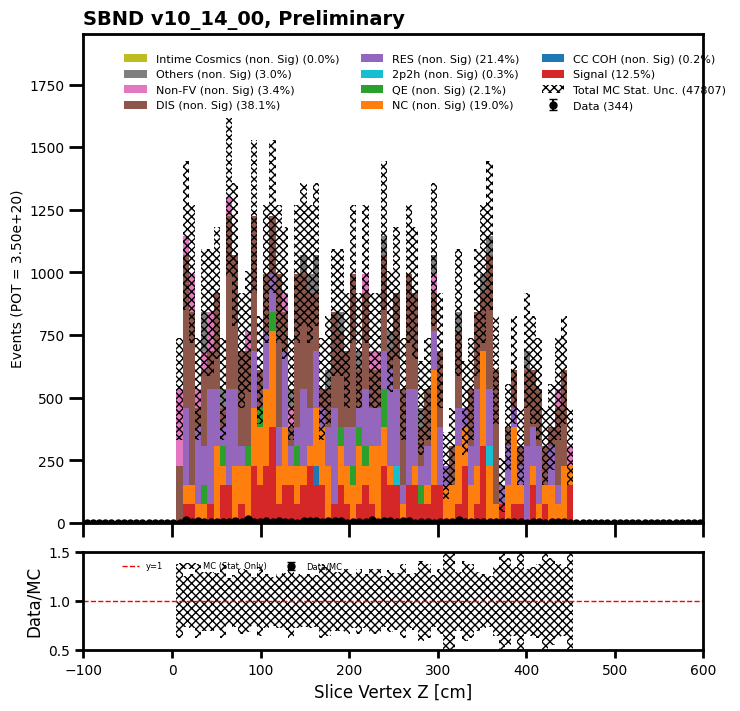

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  278
[ 0  3  0  0  1  3  0  5  1  3  5  7  6 10  9 11  9 16 14 12 17 11  7 12
 14 10 11 10 10  8  6  6  9  6  6  6  1  5  3  5]
[   0.        76.49085    0.        76.49085  152.9817   458.94513
  611.9268   458.94507  688.41766  458.9451  1070.8718  1147.3632
 1682.7992  1759.2909  1912.2727  1300.3453  2065.2532  1376.836
 1453.3269  1453.3259   841.3992  1453.3251  1223.8523   917.8894
 1223.8536  1453.3278   994.38354  994.381   1070.8732  1300.3458
 1300.3463  1529.8188  1147.3647   764.9088   841.3987   917.8911
  382.45422  764.90967  535.4375   611.92786]
data ratio  [       nan 0.03922038        nan 0.         0.00653673 0.00653673
 0.         0.01089455 0.00145261 0.00653673 0.00466909 0.00610095
 0.00356549 0.00568411 0.00470644 0.00845929 0.00435782 0.01162085
 0.00963307 0.00825692 0.02020444 0.00756885 0.00571964 0.01307347
 0.01143928 0.00688076 0.01106213 0.01005651 0.00933817 0.00615221
 0.00461416 0.00392203 0.00784406 0.00784407 0.00713098 0.00653672
 0.

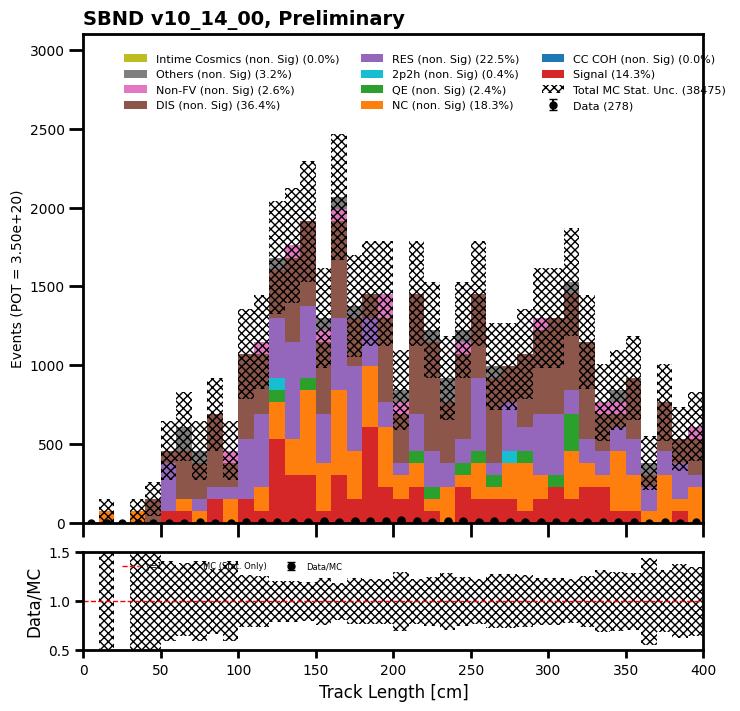

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[ 0  0  0  0  0  0  0  0  0  0  1  5 12 18 27 32 33 39 42 31 19 12 14  9
 11  4  2  5 12 16  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.       305.9634   382.45428
 1529.8169  2677.1797  4054.0176  3289.1099  5201.3794  5813.3003
 5277.8745  4818.9287  3595.0742  2371.2212  2141.7495  1759.2903
 1147.3591   841.3992   764.906    611.9276   458.94495  688.4188
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan 0.00326836 0.01307346
 0.00784408 0.00672349 0.00666006 0.00972908 0.00634447 0.00670875
 0.00795775 0.00643297 0.00528501 0.00506068 0.00653671 0.0051157
 0.00958723 

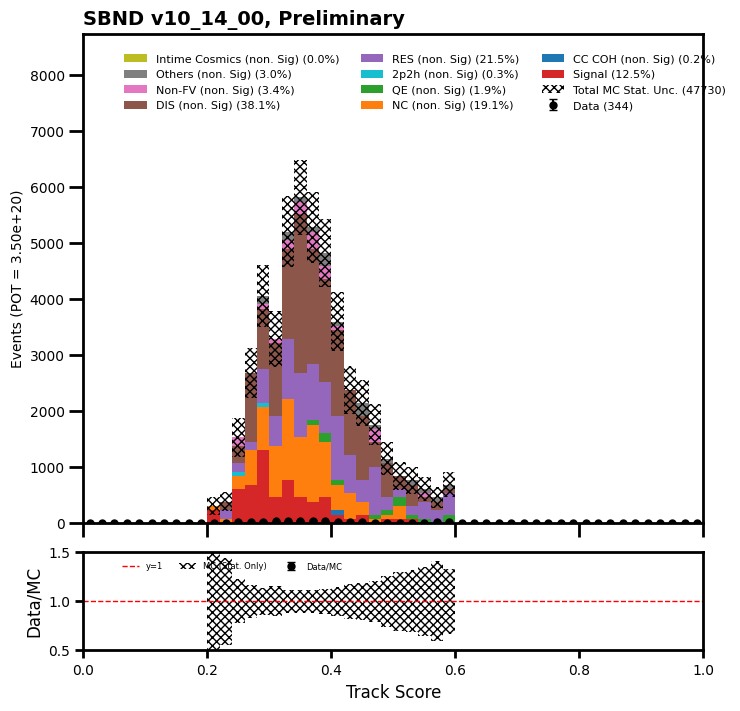

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  344
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  7  9  3  3  4
  7  6  8  6  6  9  8  6  6  6  9  3  8  9  7  1 11 12  7 10  6  4  4  6
  6  4  5  3 11  5  1  6  6  8  2  6  6  4  7  5  7  3  5  5  6  3  4  4
  2  2  5  3  2  3  3  0  5  3  2  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.        76.49085
  382.45428  764.90857  535.4359   535.4359  1070.872   1070.872
  764.90845  688.4182   535.43604  841.3998   688.4183   611.9271
  841.3998   458.94537  917.89136  764.9083   458.94507 1070.872
  841.3994  1223.8538   764.9083   841.3994  1070.8726   688.41736
  764.90845  535.4354   994.38074 1147.3608   917.8917   841.4004
  917.8915   917.89026 1147.3649   917.8915   382.45435  917.89185
  994.3821   917.8898   764.90894  764.9091  1147.3638   458.9453
  611.9291   535.4376  

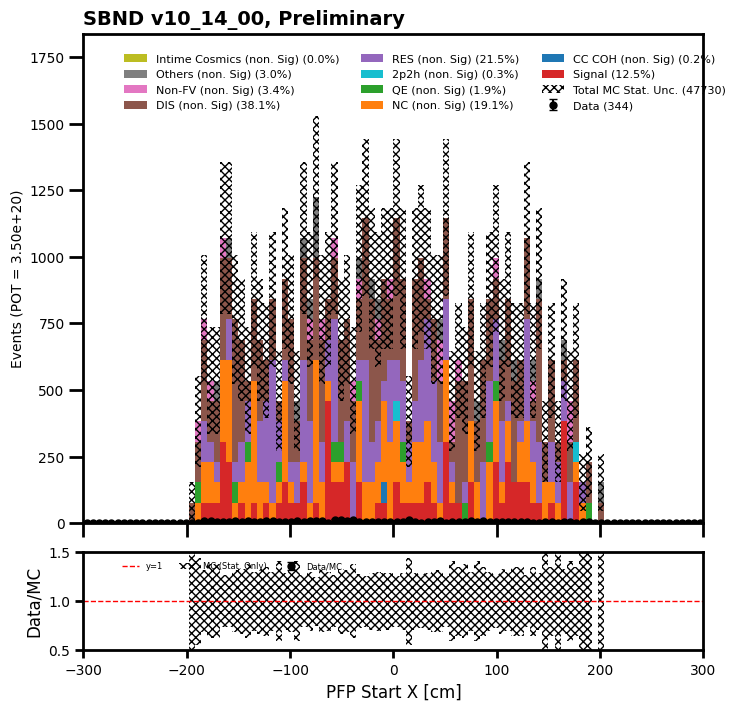

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  3  2  3  3  6  6
  5  9  7  1  8  4  6  4  7  9  6  5  5  5 11  4 11  5  7  4  9  6  7 10
  9  4 12  8  7  5  6  6 10  7  7 10  8  5  6  5  5  6  4  2  2  4  6  2
  1  1  3  2  2  0  3  2  3  2  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.         76.49085
    0.          0.         76.49085     0.         76.49085   229.47256
  152.98172   535.4359    611.9268    305.9634    841.39935   994.381
  611.92676   535.4362    994.3815    841.40015   458.94522   611.92725
  305.96362   764.9089    611.9271   1147.3623   1376.8352   1223.8539
  994.38135   611.9265    611.92676  1453.3267    611.9269   1300.3442
 1223.8524   1376.8375    535.4365   1453.3285   1376.8374   1070.8724
  611.9287   1070.8743    688.41797   458.94507  1070.8723    841.40015
  535.4375    764.90967   535.4365    

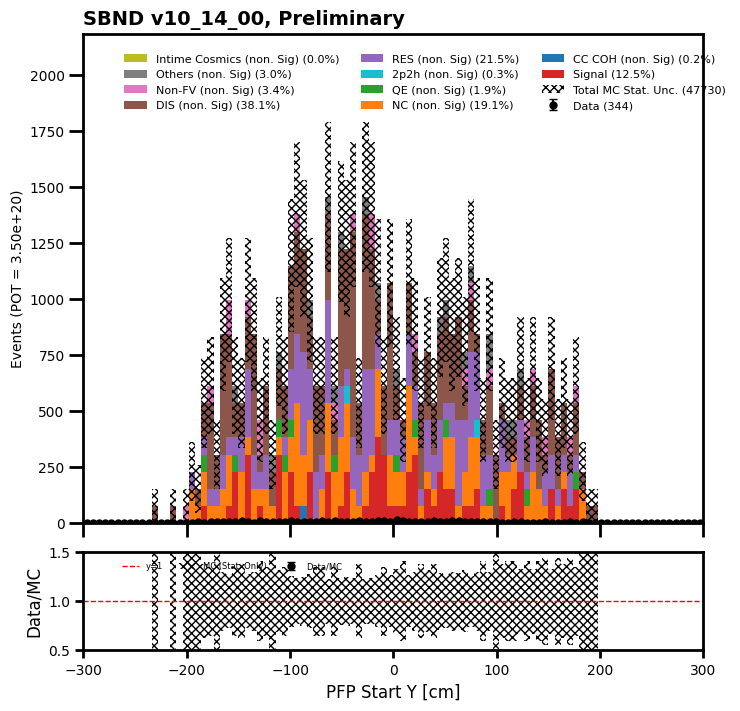

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  4  1  6  6  6  4  3  4  6  6
  5  7 10  9  6  7  4  8  1  6  3  8  8  7  4  6  7  9  3  8  5  2 10  4
  5  8  8  8  4  3  3  2  2  8  3  5 12  6  4  5  2  9  4  7  5  5  3  4
  6  3  3  5  5  0  2  2  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.        229.47256    76.49086   764.9085    994.381
  458.94516   764.90845   535.436     764.90845   917.89075   764.90906
  611.927     764.90906   688.41797   917.8912    917.88995   841.39905
  994.38086   764.9087   1376.8354    841.3995    611.9265    841.3993
 1147.3628   1147.3625    611.927     917.8895    611.9265    764.9099
  841.4011    382.4552    917.89197  1223.8557    764.9088    688.4171
  994.3821    688.41846   917.8915    382.45483   994.3827    917.8916
 1147.3641    458.94592  1300.3445    688.41

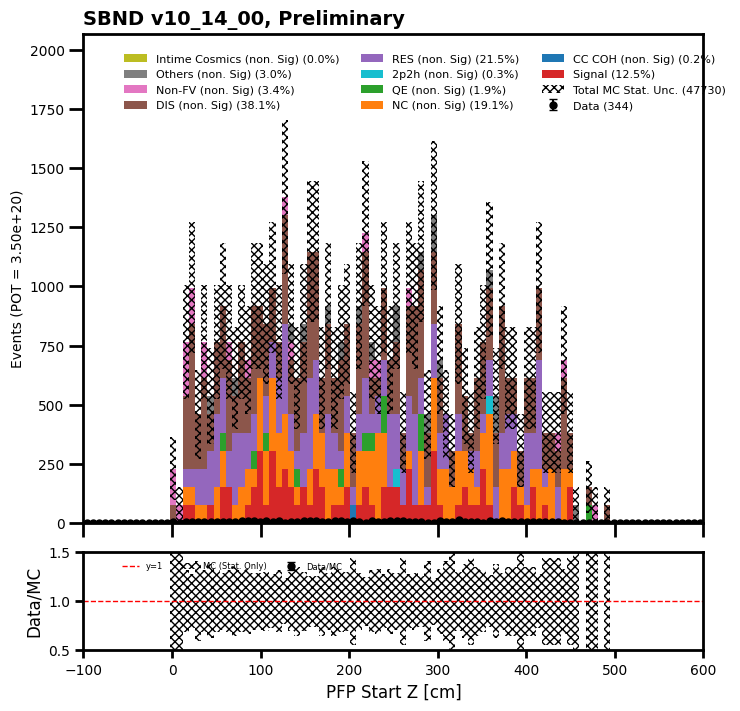

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[1 0 3 2 1 1 1 1 4 1 1 3 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[   0.     1835.7804 3059.6343 3671.5625 4054.0166 4130.505  3365.5952
 3977.531  3518.5835 3671.5652 4512.963  3671.5664 4359.985  3518.5718
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.    ]
data ratio  [       inf 0.         0.00098051 0.00054473 0.00024667 0.0002421
 0.00029712 0.00025141 0.00113682 0.00027236 0.00022158 0.00081709
 0.         0.                nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        inf        nan        inf        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


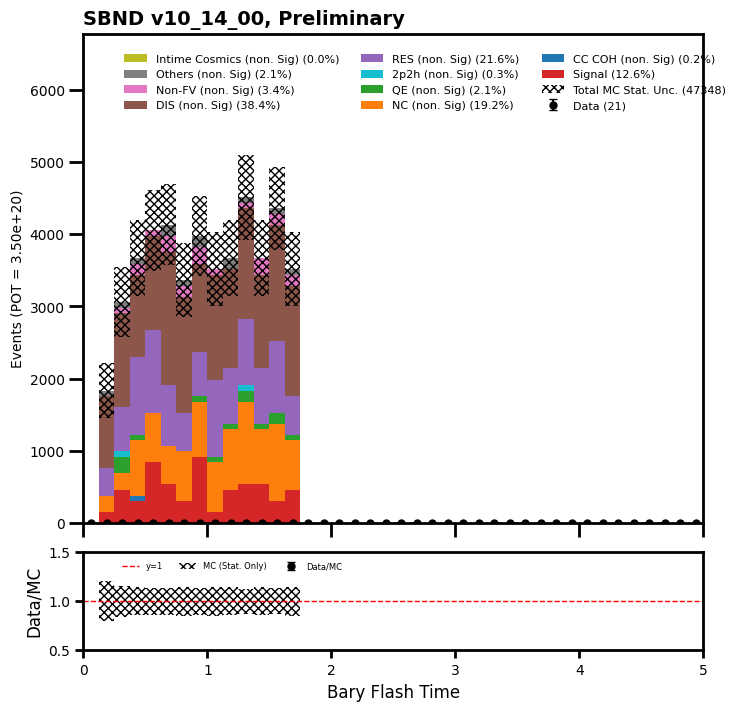

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  341
[90 76 37 27 23 22  9  9 11  3  4  5  5  4  1  0  1  2  4  0  1  1  0  0
  0  4  1  1  0  0  0  0  0  0  0  0  0  0  0  0]
[10938.194    16216.063     7037.168     4589.454     2065.2588
  1759.2936    1529.8203     611.9258     611.9269     535.4352
   305.96143    229.47168    152.98047     76.490234    76.49121
    76.49121      0.           0.         152.98047     76.49121
     0.           0.         152.98206     76.490234     0.
    76.490234     0.           0.         152.98145      0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.      ]
data ratio  [0.00822805 0.00468671 0.0052578  0.00588305 0.01113662 0.01250502
 0.00588304 0.01470767 0.017976   0.00560292 0.01307354 0.02178918
 0.03268391 0.05229426 0.0130734  0.                inf        inf
 0.02614713 0.                inf        inf 0.         0.
        nan 0.05229426        inf        inf 0.                nan
        nan    

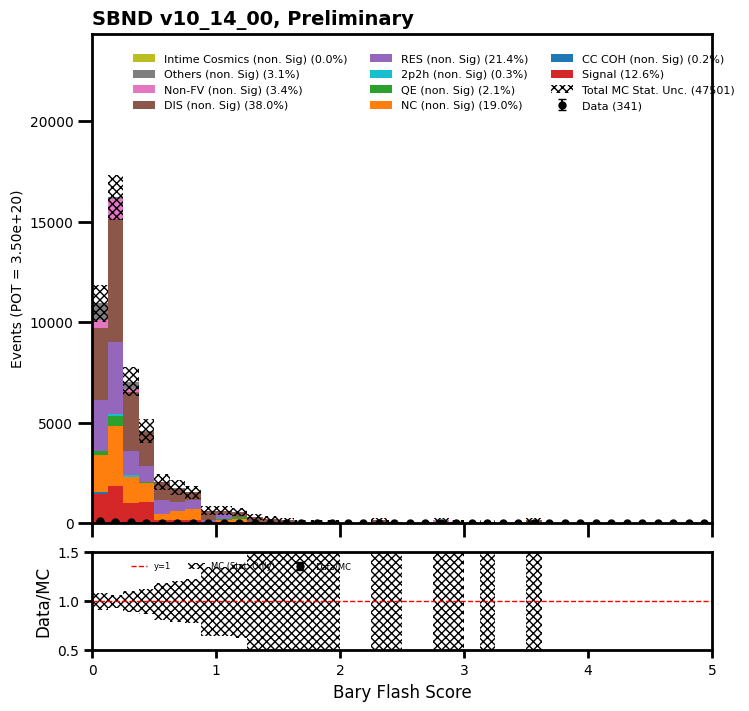

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  344
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0 193 104  26  11   9   1   0   0   0   0   0   0   0   0   0   0
   0   0   0   0]
[    0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.
 23865.148    15833.623     5277.878     1606.3041     611.9248
   458.94592     76.490845     0.           0.           0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00808711 0.0065683  0.00492622 0.00684802
 0.01470769 0.00217891 0.                nan   

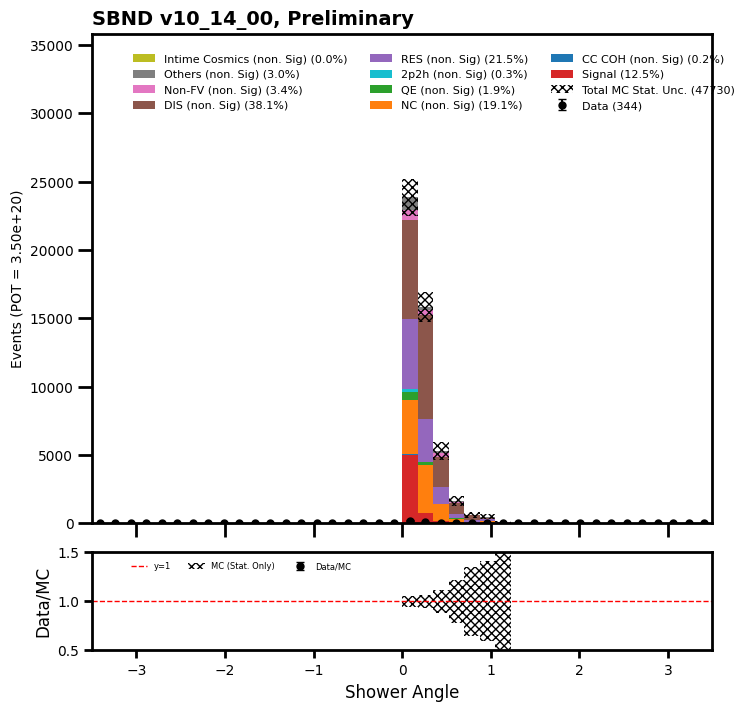

total data =  276
[83 41 26 18  8  9  9  8  5  6  1  3  4  2  4  6  2  2  2  1  6  1  1  0
  3  2  1  3  4  2  3  1  0  1  2  2  1  1  2  0]
[10096.794    5354.366    3059.6362   2447.705    1988.7589   1759.287
  1147.3608    764.9072    917.8911    841.4       841.40186   764.9082
   611.92737   688.41956   382.45557   229.47363   611.9269    535.4375
   305.96338   382.4536    229.47266   458.9458    382.45557   229.47266
   152.98145   305.96436   229.47314    76.49072   152.98193   152.98242
   382.45422   535.43665    76.49121   305.96338    76.49121   229.47314
   382.45508   152.98242    76.49121   305.96387]
data ratio  [0.00822043 0.0076573  0.00849774 0.00735383 0.00402261 0.00511571
 0.00784409 0.01045878 0.00544727 0.00713097 0.00118849 0.00392204
 0.00653672 0.00290521 0.01045873 0.02614679 0.00326836 0.00373526
 0.00653673 0.0026147  0.02614691 0.00217891 0.00261468 0.
 0.01961022 0.00653671 0.00435781 0.03922044 0.02614688 0.0130734
 0.00784408 0.00186763 0.         0.0

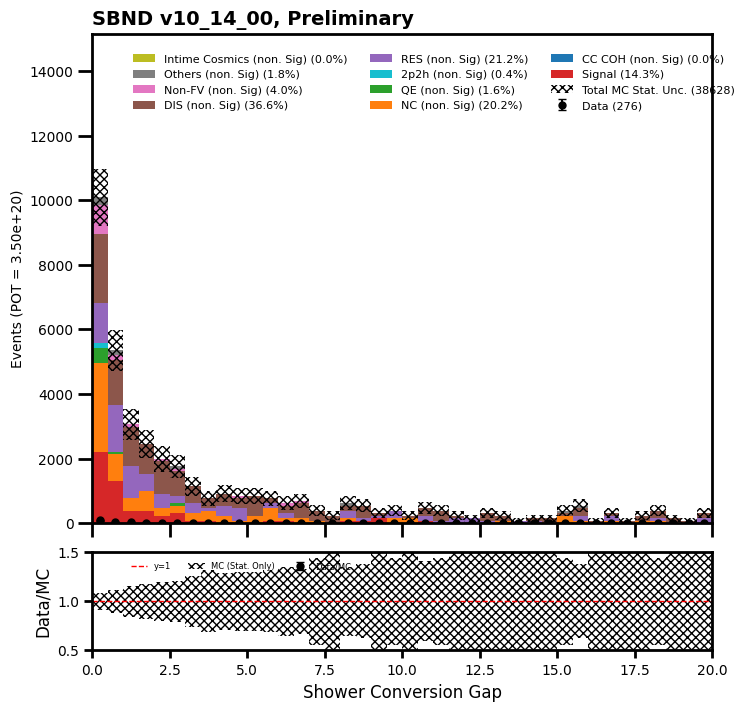

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  298
[ 0  9 15 60 24 11 15 31 24 20 11 10  9  6  6  3  0  2  6  3  3  4  5  5
  1  2  1  0  2  3  0  2  0  1  0  2  0  1  0  1]
[ 152.98169  764.90857 1529.817   7343.126   3518.5803  1912.2699
 1682.7982  4665.9424  5583.842   2906.6528  2141.7446  1223.8541
  688.41943  994.38245  382.4552   535.43616  458.9453   611.9269
  535.43616  305.96436  458.9463   458.9463   305.96448  458.9463
  458.94678   76.49072   76.49121  229.47363   76.49121   76.49121
  152.98193  229.47363   76.49121   76.49121    0.       229.47314
   76.49121   76.49121  152.98047  152.98145]
data ratio  [0.         0.01176611 0.00980509 0.00817091 0.00682093 0.00575233
 0.00891372 0.00664389 0.00429812 0.00688077 0.005136   0.00817091
 0.01307343 0.0060339  0.01568811 0.00560291 0.         0.00326836
 0.01120582 0.00980506 0.00653671 0.00871562 0.01634177 0.01089452
 0.0021789  0.02614696 0.0130734  0.         0.02614679 0.03922019
 0.         0.0087156  0.         0.0130734         nan 0.00871562
 

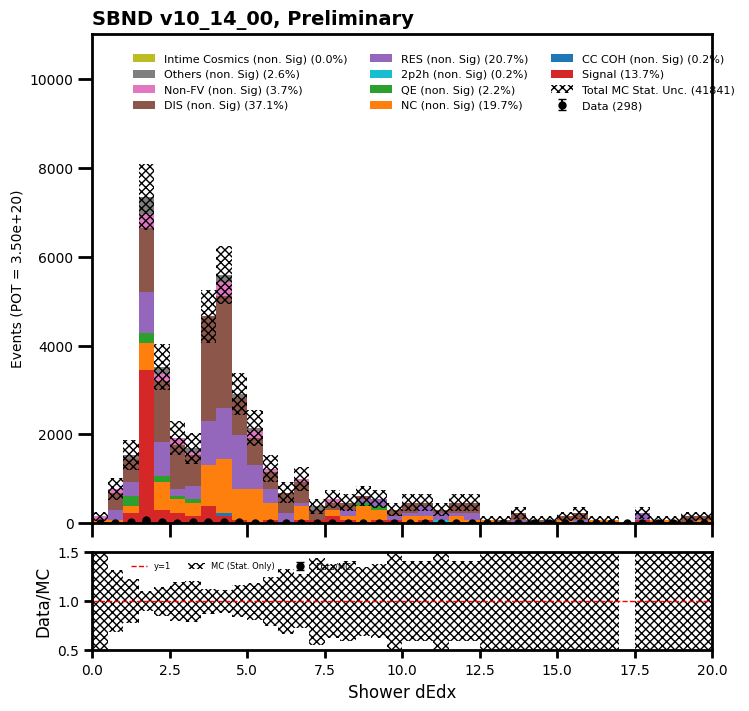

In [57]:
#bary score

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][ (mc_bnb_cosmic_dfs["evt"].slc.barycenterFM.score > 0.02)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].slc.barycenterFM.score > 0.02)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].slc.barycenterFM.score > 0.02)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_nu_score_bscore")

## Electron Selection

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  122
[122   0]
[18663.76797862     0.        ]
data ratio  [0.00653673        nan]


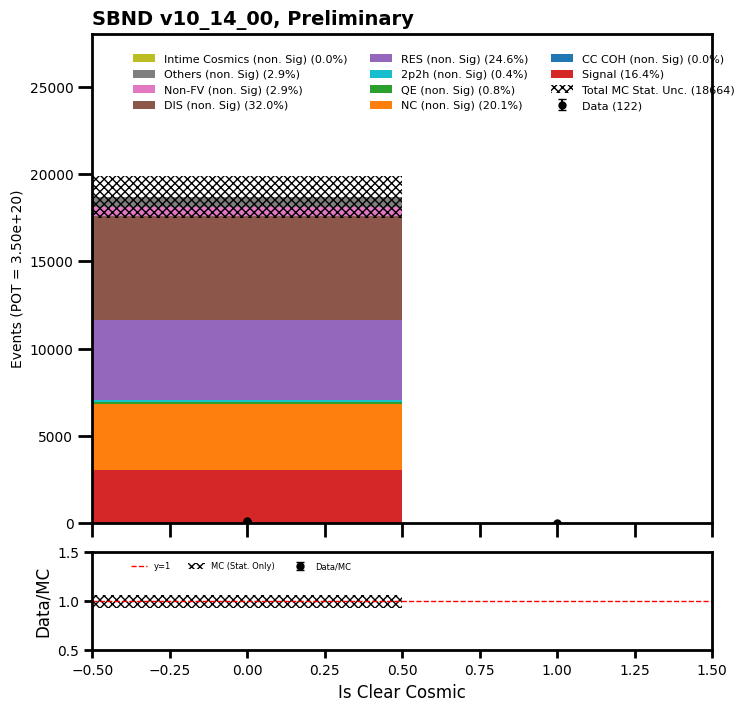

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  120
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  2 11 20 25 25 16  6  7  5  2  1  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.      229.47256 305.9634  382.45428 305.9634  229.47256 382.45422
 458.94513 229.47255 305.96338 611.9269  458.9451  611.92676 458.94513
 535.4359  458.94507 688.41766 535.4361  305.9635  229.47278 305.9635
 1

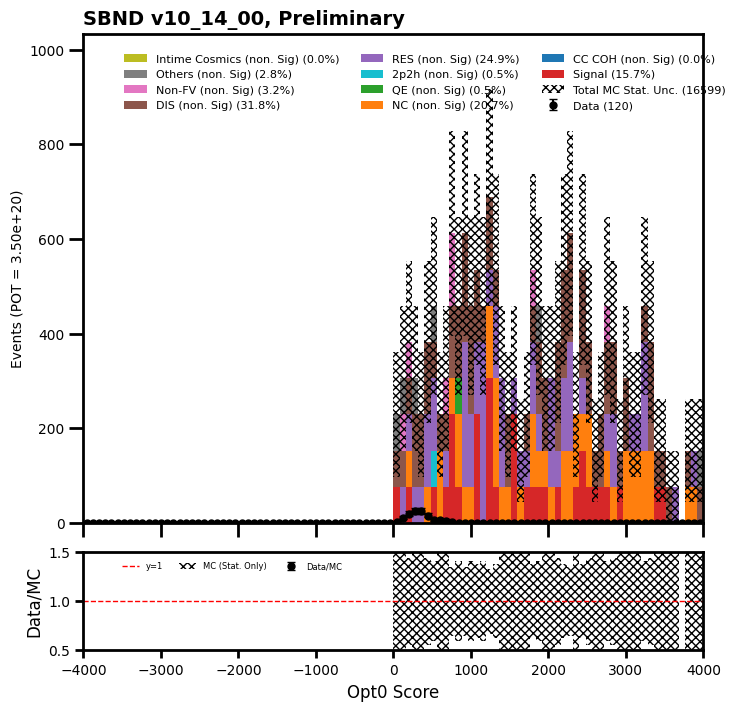

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  122
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0 10 22 30 38 20  2  0  0  0  0  0  0]
[   0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.     1223.8536 2524.1982 4359.979
 5354.3647 4895.4146  305.9633    0.        0.        0.        0.
    0.        0.    ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00817091 0.00871564 0.00688077 0.00709701
 0.004

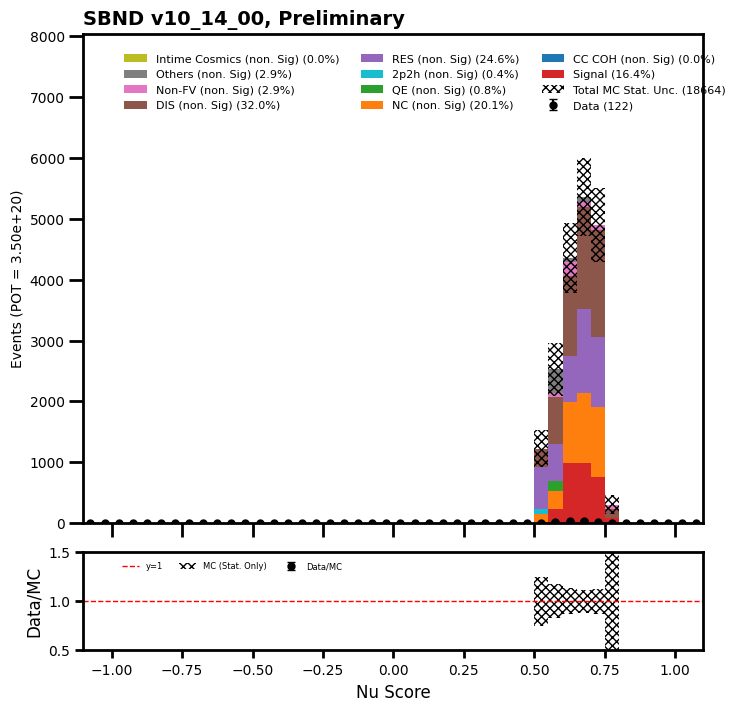

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 3 1 1 0 1 2 3 3 1 7 4 1 2 3 3 1 4
 1 2 2 5 1 2 5 3 1 1 2 3 0 1 0 0 4 0 2 2 3 1 5 3 2 2 2 1 0 3 2 3 2 2 1 0 0
 2 1 0 2 3 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.       229.47256  305.9634   305.9634   535.4359   305.9634
 305.96338  229.47256  229.47253  305.96338  305.96338  382.45428
 229.4726   458.94513  229.47253   76.490906 229.47253  764.90845
 535.4359   152.98169  305.96338  382.45428  229.47253   76.490845
 382.45435  229.47253  382.45435  458.9458   305.96387  229.47278
 458.9453   535.43665  535.4365   382.4546   152.98181  305.96375
 305.96375  305.96375  229.47278  152.98193  535.4363    76.49097
 305.96338   76.490845 458.94482    0.       229.47266  229.47266
 229.47278  229.47266  458.9453   305.96378  382.45483  535.43604
 

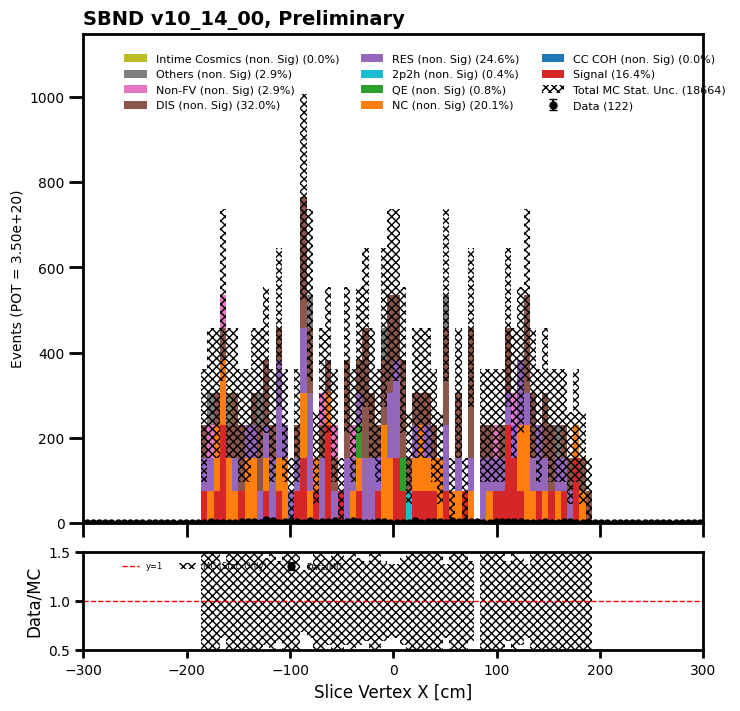

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 2 3 2 4 2 3 3 2 2 0 1 3 2 1
 4 0 1 3 1 8 0 1 1 6 2 4 6 3 2 1 1 4 4 4 7 1 5 0 2 1 1 1 1 0 0 1 0 1 1 1 0
 2 0 2 0 0 2 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.       305.9634   305.9634   229.47256  152.98169  458.9451
 535.43604   76.490845 611.92676  305.96338  305.96344  152.98169
 229.4726   382.45425  382.45422  382.45422  382.45428  382.45422
 229.47253  229.47253  229.47253  458.94543  152.98193  458.9453
 382.4546   458.9453   229.47266  688.4185   688.4181   382.4546
 229.47266  764.9093   458.94556  152.98193  152.98193  458.94543
  76.49072  382.4541   229.47241  305.96375  229.47253  688.41785
 305.96353  458.9453   688.41797  152.98193  305.9635   305.96326
  76.49097  152.98193  152.98169  152.98193  152.98145  152.98169
 229

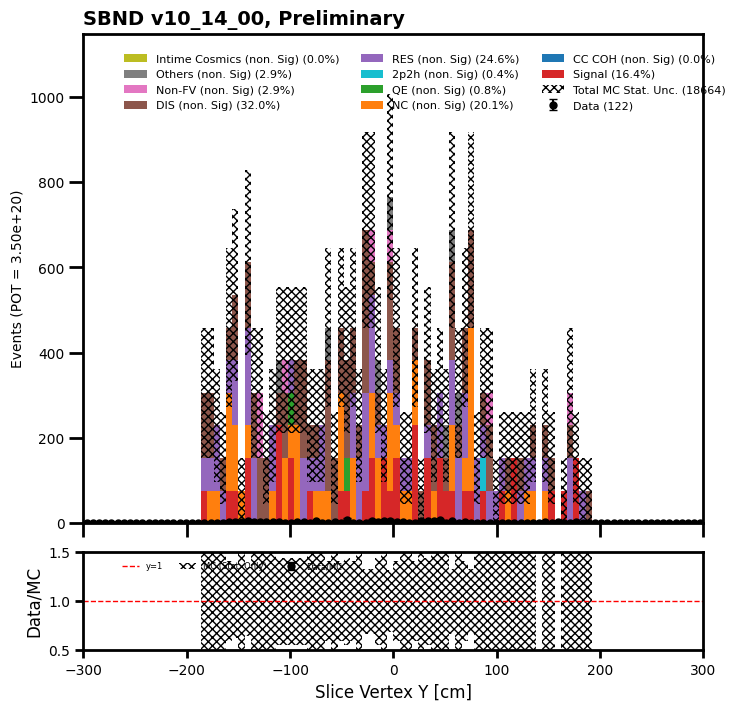

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 2 1 2 1 0 2 1 4 4 9 2 3 4 2 1 1 0 0 2 4
 4 0 2 3 1 2 3 1 1 3 1 2 3 0 1 1 0 1 0 1 1 2 0 0 1 1 3 1 3 5 2 1 3 5 0 3 3
 2 3 3 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.       152.9817   305.96344  229.47253
 152.9817   152.98172  305.96338  458.94513  229.47253  152.98169
 229.47253  229.47253  458.94513  535.4359   229.47256  305.9634
 152.98169  382.45422  458.94513  152.98169  305.96338  229.47253
 535.4361   611.927    382.4544   305.9635   229.47266  535.43616
  76.490845 229.4729   152.98181  305.96375  229.47278  458.94543
 458.9452   152.98181  229.4729     0.       152.98193  305.96375
   0.       229.4729   152.98181  305.96387  152.98181  152.98169
 152.98181  229.4729   152.98193  152.98193  458.9458   611.9276
 305.96338   76.49097  229.47266  382.45435  152.98193  611.9264

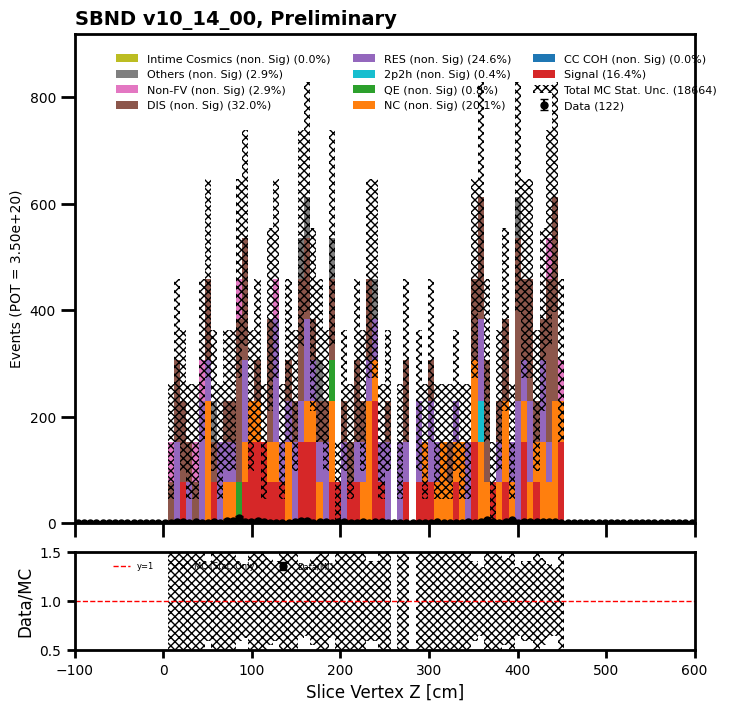

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[ 1  4  0  0  1  3  0  5  2  3  5  8  6 11 10 11  9 16 14 13  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[   0.        76.49085    0.        76.49085  152.9817   458.94513
  611.9268   458.94507  841.39935  458.94513 1147.3627  1300.3451
 1682.7992  1759.2908  1912.2727  1300.345   2141.7441  1376.836
 1453.3269  1453.3259     0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [       inf 0.05229383        nan 0.         0.00653673 0.00653673
 0.         0.01089455 0.00237699 0.00653673 0.00435782 0.00615221
 0.00356549 0.00625252 0.00522938 0.00845929 0.00420218 0.01162085
 0.00963307 0.008945          nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

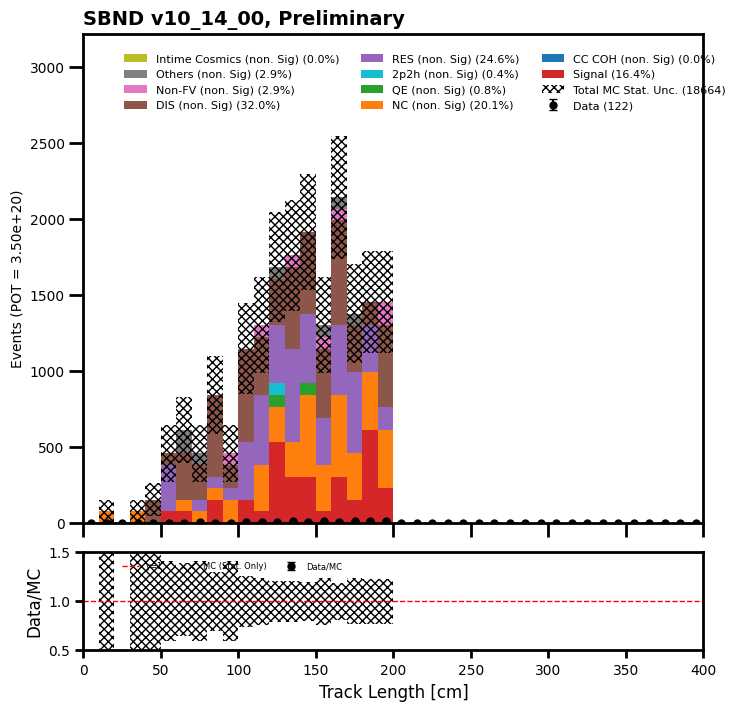

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[ 0  0  0  0  0  0  0  0  0  0  0  2  5  7  9 13 13  9 10 13  6  8  4  6
  2  2  1  3  5  4  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.        76.49085
  764.90857  917.89014 2065.253   1682.7988  2218.2349  2447.7097
 1529.8188  1300.3463   994.3817   764.9087   841.3993   611.92737
  688.41736  382.45447  611.9264   382.45377    0.       382.4536
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan 0.02614692
 0.00653673 0.00762619 0.00435782 0.00772523 0.00586052 0.00367691
 0.00653672 0.00999734 0.0060339  0.01045876 0.00475399 0.00980509
 0.0029052

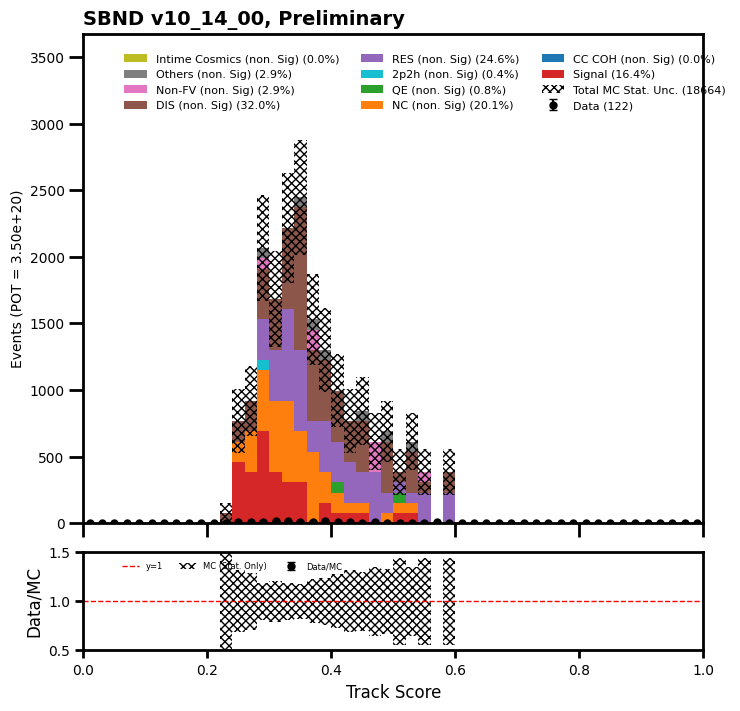

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 4 1 0 1 1 2 3 2 1 4 3 3 4 1 5 0 3
 2 3 0 6 4 1 6 2 1 1 1 3 0 1 0 3 1 0 2 1 3 1 5 2 1 3 2 1 1 2 2 3 2 3 1 1 0
 3 1 0 1 3 0 2 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.       305.9634   152.9817   305.9634   688.41766  229.47256
 382.45428  305.96338  229.47253  229.47253  229.47253  305.96347
 535.43604  229.47253  152.98169   76.490845 382.45428  764.90845
 305.96338  458.94507  152.9817   305.96344  305.96338  152.98169
 458.9452   152.98181  382.45422  688.4186   229.4729   229.47278
 382.4546   458.94568  458.94543  229.47266   76.49097  382.4547
 305.96375  305.96375  229.47278  229.47278  535.43665  305.96362
 152.98145   76.49072  382.45386    0.       152.98169  382.4546
 382.45474  305.96362  458.9453   152.98193  229.4729   382.45435
  7

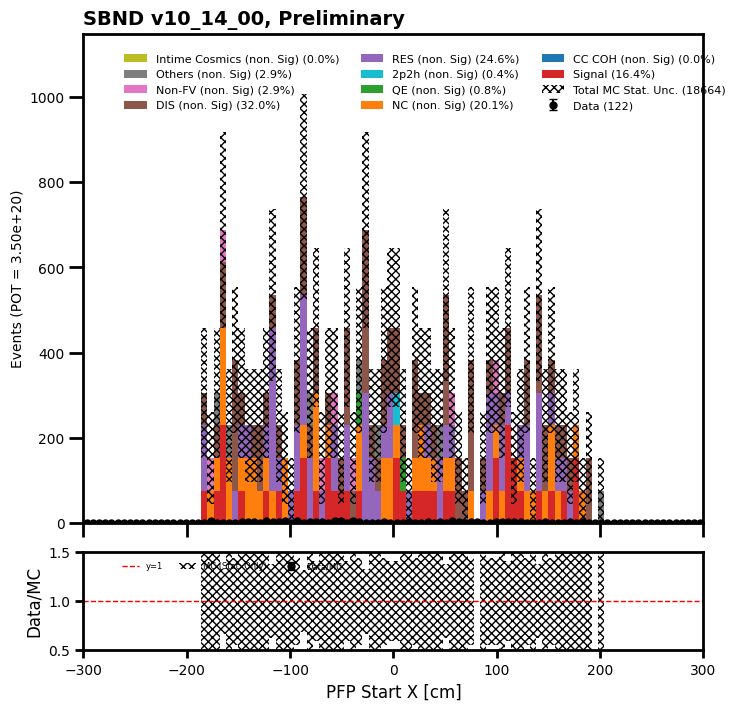

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 2 0 2 2 4 3 2 0 4 3 3 2 0 2 2 1 1
 3 3 1 3 1 3 1 4 1 5 4 5 1 6 2 3 1 0 5 5 2 2 2 3 2 1 2 1 2 0 0 1 0 1 1 1 0
 2 1 2 0 0 2 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.       229.47256
   0.       305.9634   229.47256  229.47255  305.96338  382.45428
 152.98174  305.96338  535.4359   382.45428  152.9817   305.96344
  76.490845 305.9634   305.96338  382.45422  535.436    611.92676
 229.47253  152.98169  305.9635   305.9635   152.98193  535.4364
 229.47266  611.92725  152.98169  535.43646  688.4182   535.4364
 229.47266  535.43677  458.94556  152.98193  458.94556  382.45447
  76.49097  382.45398  152.98169  305.9635   305.96338  305.96362
 305.96313  382.45447  764.90894  382.4547   229.47266  382.4541
   0.       229.4729   152.98169  229.47256  229.47241  152.98181

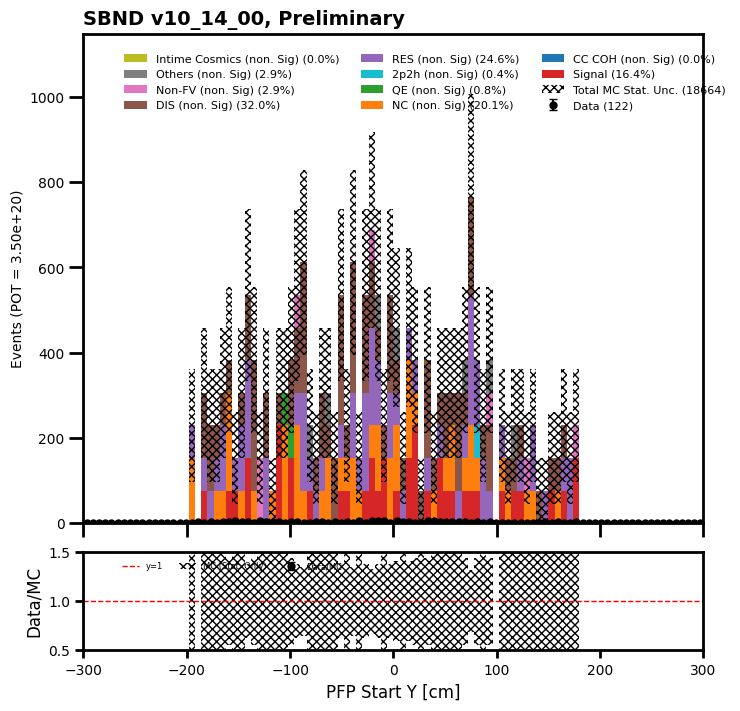

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  122
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 1 1 2 0 1 1 2 0 6 7 2 2 4 3 2 0 1 2 2 3
 2 0 2 2 2 3 4 2 1 3 0 2 1 3 1 1 0 1 0 0 3 1 0 0 1 0 2 1 3 3 3 4 1 2 2 5 3
 3 4 4 0 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.       152.9817   305.96344
 152.98169  229.47253  152.98174  305.96338  535.436     76.490875
 229.47253   76.490845 229.47255  458.94513  382.45425  229.47253
 152.98169  229.47253  611.9269   229.47253  305.96338  152.98169
 382.45422  611.92694  229.47253  611.9271   229.47266  382.4544
 152.98169   76.49097  229.47266  305.96375  305.96362  458.9453
 305.96362  229.47266  229.47278    0.        76.49097  305.96375
 305.96375   76.49097  229.4729   305.96375  305.96375  152.98169
 152.98181  229.47278  152.98169   76.49097  229.4729   382.4547
 229.47281  458.9458   382.45483  382.4546   229.47241  611.9267

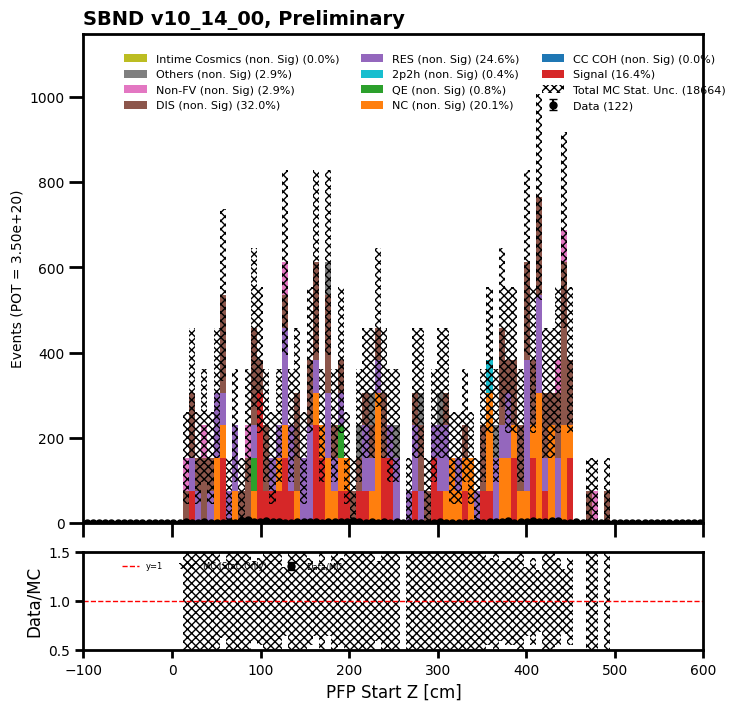

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  8
[0 0 3 2 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[   0.       917.89026 1070.872   1300.3445  1376.8352  1376.8357
  841.4001  2218.2354  1147.3641  1682.8     1912.272   1988.7628
 1453.3265  1300.344      0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [       nan 0.         0.00280146 0.00153805 0.0007263  0.
 0.         0.         0.00087156 0.         0.         0.00050283
 0.         0.                nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


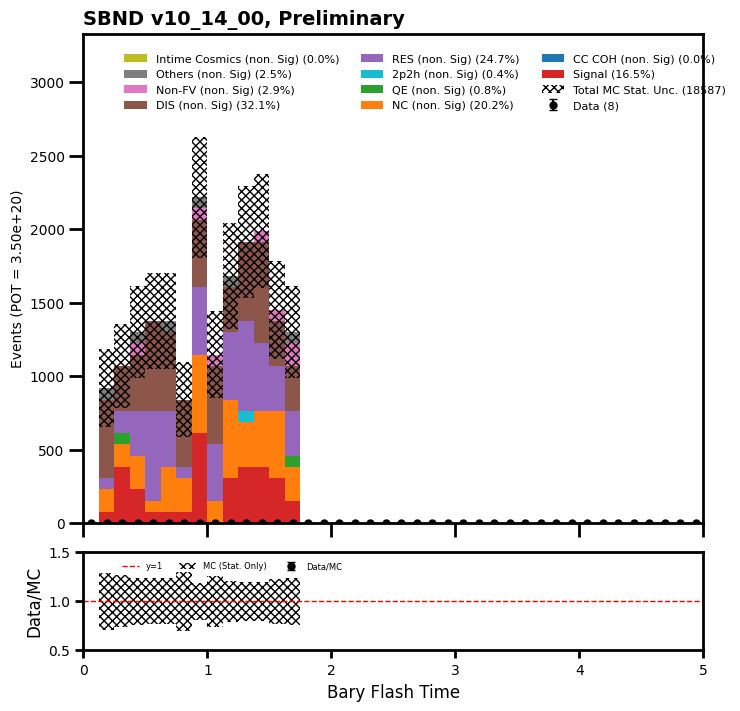

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  121
[42 28  9 10  4  5  4  3  4  1  3  1  1  1  0  0  1  2  1  0  1  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[6042.7773  6195.763   1759.2908  2065.2544   688.41797  152.98169
  611.92676   76.49072  382.45386   76.49097    0.        76.49072
    0.        76.49072    0.        76.49072    0.         0.
    0.        76.49072    0.         0.         0.        76.49072
    0.        76.49072    0.         0.        76.49097    0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [0.00695045 0.00451922 0.0051157  0.00484202 0.00581042 0.03268365
 0.00653673 0.03922044 0.01045878 0.01307344        inf 0.01307348
        inf 0.01307348        nan 0.                inf        inf
        inf 0.                inf        nan        nan 0.
        nan 0.                nan        nan 0.                nan
        nan        nan        nan        nan        nan        nan
        nan        n

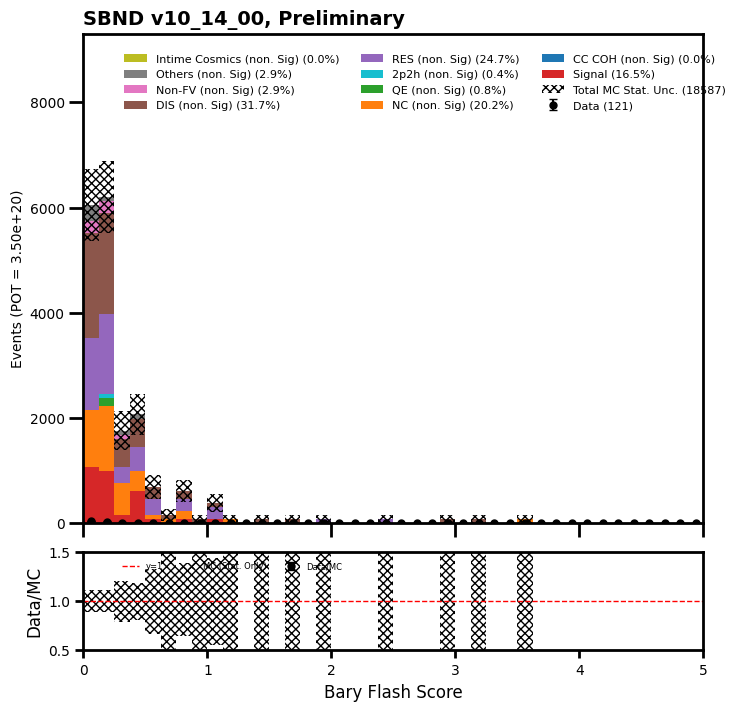

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  122
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 74 37  7  2
  2  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[    0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.
 11320.648     4895.418     1606.3076     535.43567    152.98145
    76.49072     76.490875     0.           0.           0.
     0.           0.           0.           0.           0.
     0.           0.           0.           0.           0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00653673 0.00755809 0.00435782 0.00373528
 0.01307348 0.         0.                nan        nan        nan
        nan        n

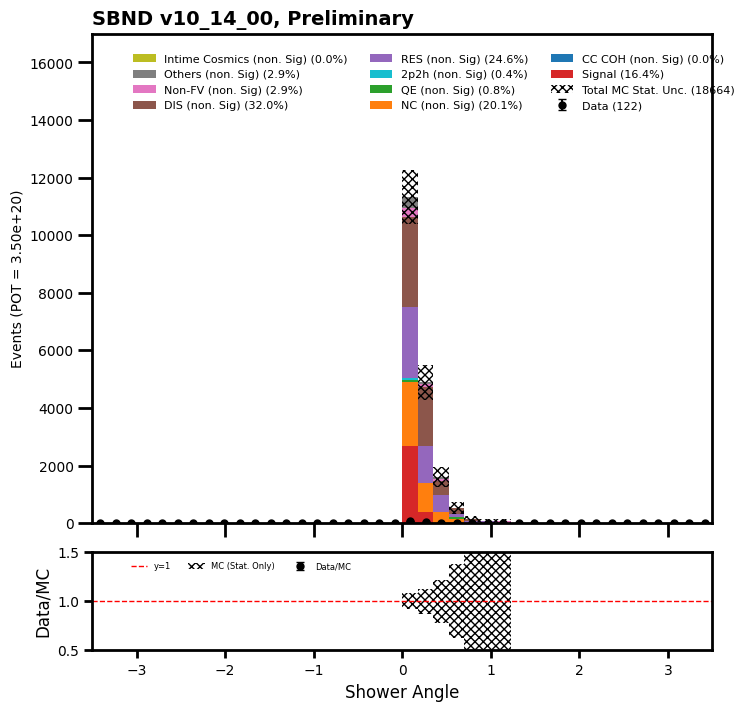

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  92
[20 14  8  4  3  3  4  5  2  2  0  0  3  1  3  2  1  0  1  1  2  1  1  0
  2  0  1  2  2  0  1  1  0  0  0  1  0  0  1  0]
[3977.5247  2141.744   1223.8535   535.43604  841.4      841.40027
  382.4546   229.47266  382.45447  305.96375  229.4729   229.4729
  152.98193  305.96387  152.98193   76.49097  305.96387  305.96387
   76.49097   76.49097  229.4729   229.47266  229.47241  152.98193
  152.98193   76.49072   76.49097   76.49097   76.49097    0.
  229.47266  152.98193   76.49072  152.98169    0.        76.49097
  229.47241   76.49072    0.       152.98169]
data ratio  [0.00502825 0.00653673 0.00653673 0.00747055 0.00356549 0.00356548
 0.01045876 0.02178909 0.00522938 0.00653672 0.         0.
 0.01961016 0.00326836 0.01961016 0.02614688 0.00326836 0.
 0.01307344 0.01307344 0.00871563 0.00435782 0.00435782 0.
 0.01307344 0.         0.01307344 0.02614688 0.02614688        nan
 0.00435782 0.00653672 0.         0.                nan 0.01307344
 0.         0.              

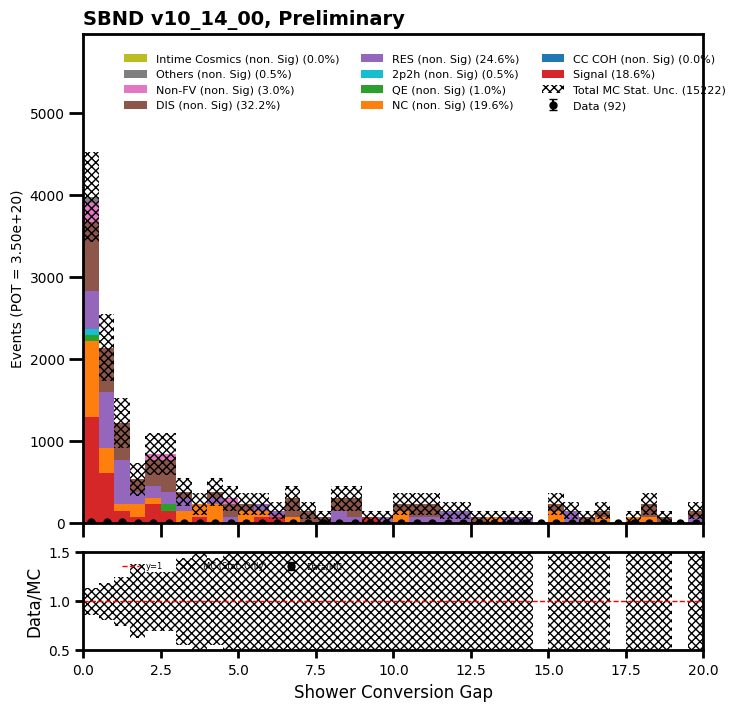

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  109
[ 0  5  6 22 12  5  8 11  7  6  4  2  3  2  1  2  0  0  4  0  1  0  1  3
  0  0  1  0  0  1  0  0  0  1  0  1  0  0  0  0]
[  76.49086  382.45425  458.9451  3442.0886  1376.8353   764.9087
  611.9271  1453.3276  2294.7275  1376.8372   917.89075  305.96362
  382.4541   305.96313  152.98169  229.47281  229.47266  229.47266
  152.98193   76.49072  229.47266    0.         0.       152.98169
  229.47241    0.        76.49072  152.98145    0.         0.
   76.49097    0.         0.         0.         0.        76.49097
    0.        76.49097   76.49072    0.     ]
data ratio  [0.         0.01307346 0.01307346 0.00639147 0.00871564 0.00653673
 0.01307345 0.00756884 0.00305047 0.00435781 0.00435782 0.00653672
 0.00784408 0.00653674 0.00653673 0.00871563 0.         0.
 0.02614688 0.         0.00435782        nan        inf 0.01961019
 0.                nan 0.01307348 0.                nan        inf
 0.                nan        nan        inf        nan 0.01307344
        nan

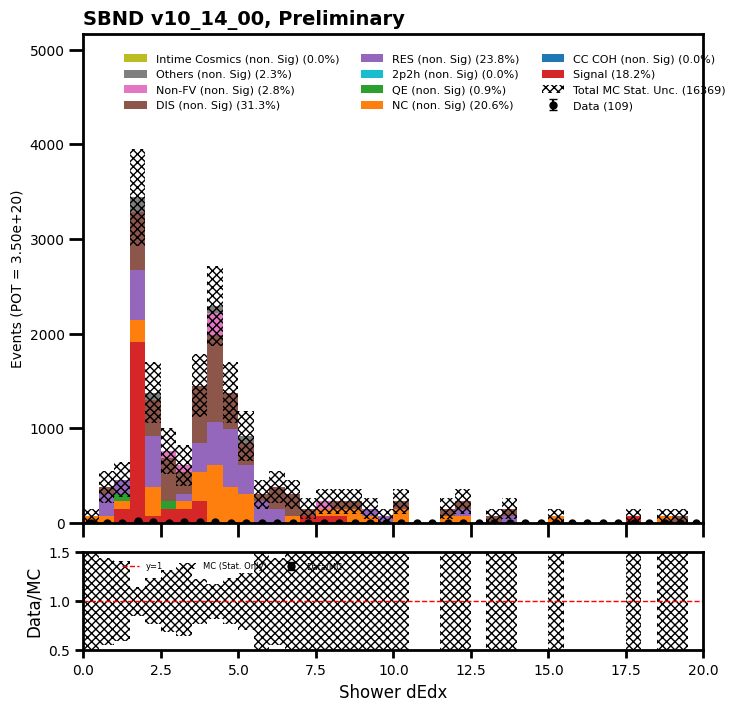

In [58]:
#track length


mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.trk.len < 200)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].pfp.trk.len < 200)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].pfp.trk.len < 200)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_len")

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  44
[44  0]
[7343.12182765    0.        ]
data ratio  [0.005992      nan]


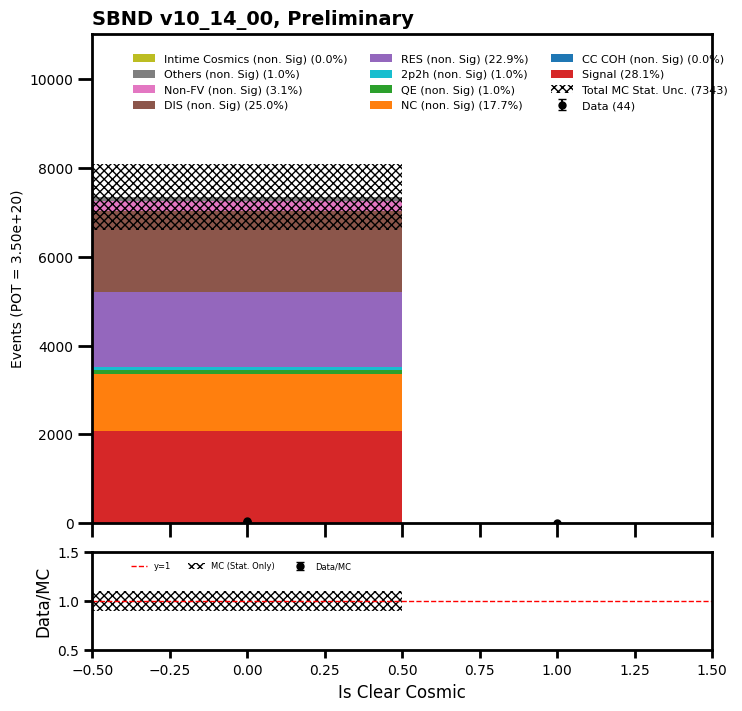

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  43
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  4  8 12 11  6  0  1  0  1  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.       152.9817   229.47256  152.9817    76.49086
  76.49086  152.98169  229.47255  229.47255   76.49086  305.9634
 152.98169   76.490845  76.490845 152.98172  229.47256  38

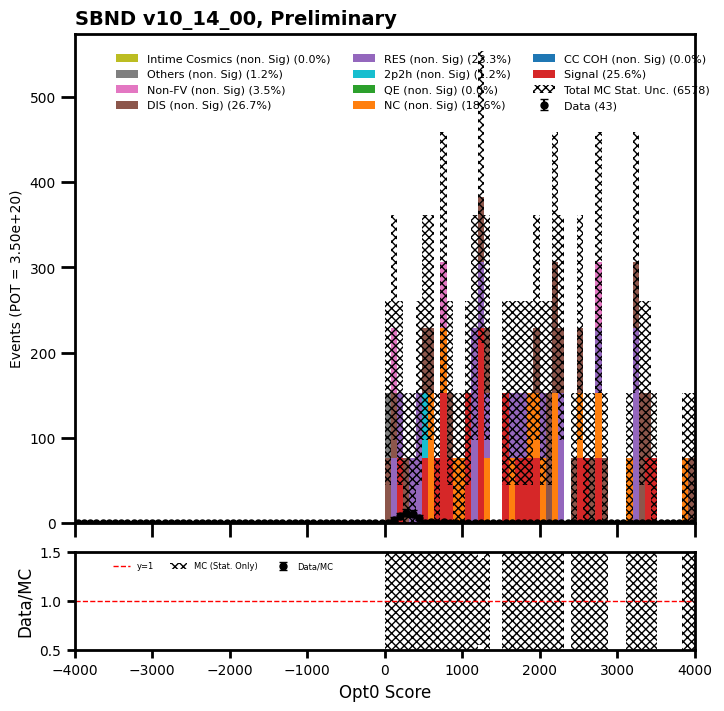

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  44
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  3  6  9 17  8  1  0  0  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.       611.9268   841.39935 1606.3079  2371.2166
 1682.7986   229.47255    0.         0.         0.         0.
    0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00490255 0.007

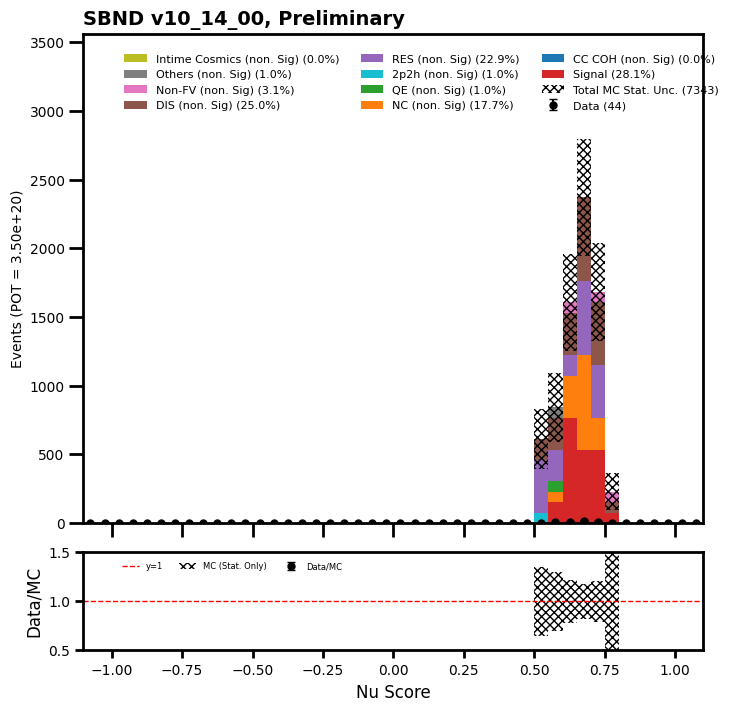

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 2 2 1 1 2 0 1 1 0 0 2
 1 2 1 1 1 0 2 0 1 0 1 2 0 0 0 0 1 0 2 1 0 0 0 1 1 0 2 0 0 1 0 0 0 1 1 0 0
 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.       229.47256  152.9817   152.9817   458.94513  152.98169
  76.49085  152.98169   76.49086   76.490845   0.       229.47256
   0.        76.490845  76.490875   0.       152.98169  229.47253
 152.98169   76.490845 152.98172  229.47256    0.         0.
 152.98169    0.        76.490845 229.47253   76.490845   0.
 229.47253  229.47253  152.98175  305.96338   76.49085  152.98175
  76.490845 152.98169  152.98175    0.       229.4726    76.490845
  76.490845   0.       229.47253    0.        76.490845  76.490845
  76.49086   76.490845 382.45422   76.490845  76.490845 229.47253
   0.     

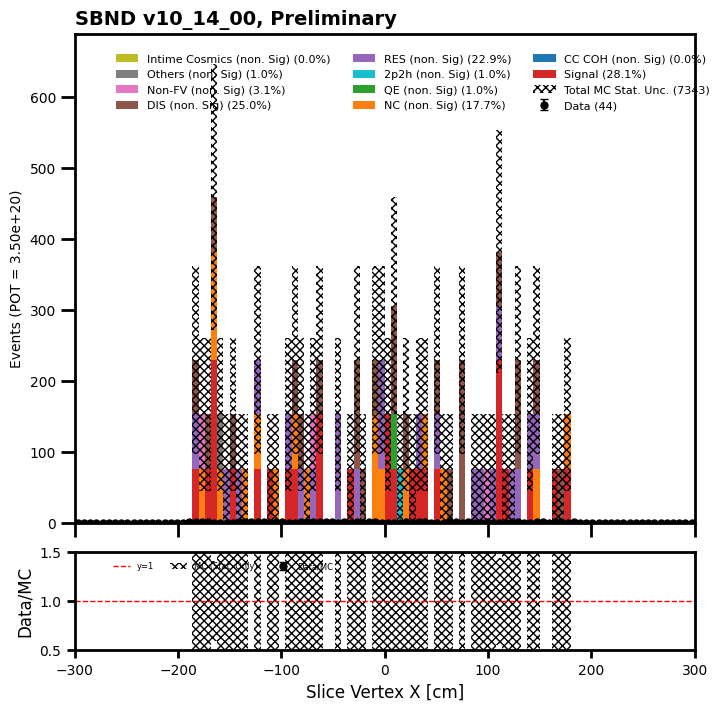

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 1 2 0 1 1 0 1 0 1 0 1 1
 3 0 0 0 1 3 0 1 0 2 0 3 1 0 0 0 1 0 1 3 2 1 3 0 0 1 1 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 2 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.        76.49085    0.       152.9817     0.       305.96344
  76.49085    0.       382.45422   76.49085   76.49085  152.9817
 152.98169  305.9634   229.47253   76.490845 152.98172  152.98175
  76.490845   0.         0.        76.490845   0.       229.47253
 152.98169  229.47253   76.490845 152.98169  305.96338   76.490845
   0.       305.96344  305.96338    0.       152.98175  152.98169
  76.490906 152.98169   76.490845 229.47253  152.98169  152.98175
   0.       305.96338  382.45422   76.490845  76.49085   76.490845
   0.        76.490845 152.98169   76.490845   0.         0.
 152.9

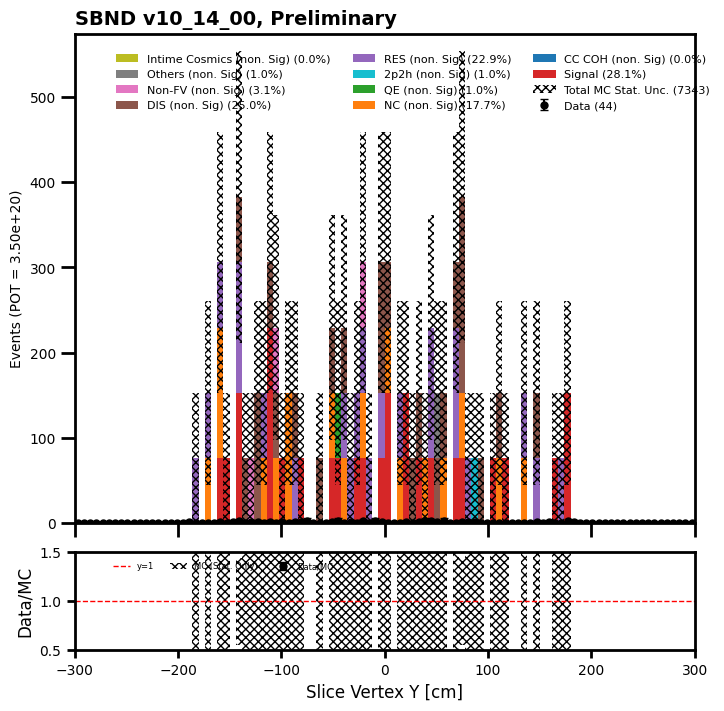

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 1 0 0 0 0 1 0 1 2 3 0 1 2 0 1 0 0 0 0 2
 2 0 1 0 1 2 1 1 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 1 0 2 0 1 1 0 1 1 1 0 0 1
 1 3 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.        76.49085    0.        76.49085
  76.49085   76.49085   76.49085   76.49085  152.9817     0.
  76.49086  152.9817    76.49085  152.98169  152.9817   229.47253
   0.        76.490875 152.98169  152.98172   76.49085   76.490845
 229.47256  382.45422  152.98169  152.98169  152.98169  229.4726
  76.490845  76.490845   0.       152.98169    0.       229.47263
 152.98169   76.490845  76.490845   0.         0.         0.
   0.        76.490845  76.490845  76.490845 152.98169   76.490845
   0.       152.98169   76.490845   0.        76.490845 229.47253
   0.         0.        76.490845 229.47253    0.       382.45428
 229.4

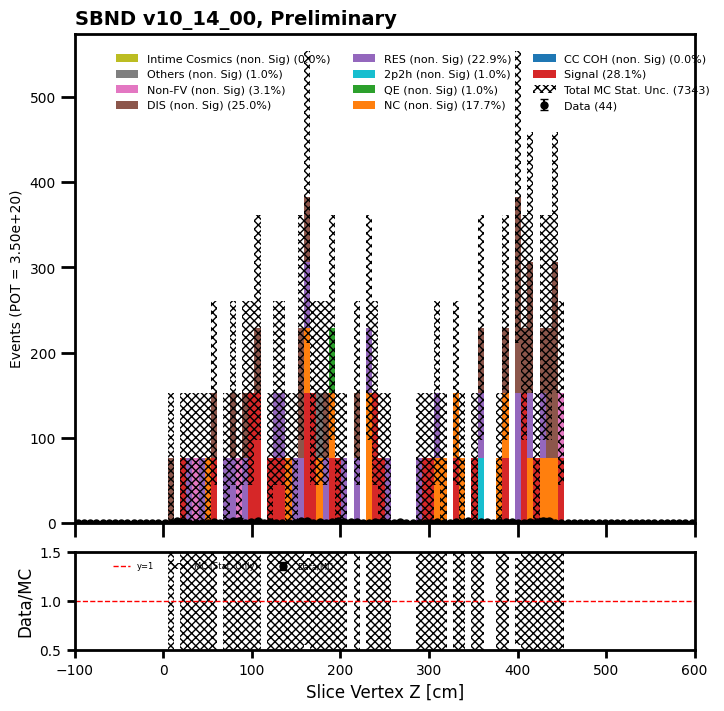

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  44
[0 0 0 0 0 2 0 1 2 1 1 4 2 5 2 4 5 9 2 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[  0.        0.        0.        0.        0.      152.9817  229.47256
  76.49085 305.9634  229.47256 458.94513 611.92676 764.9085  841.3994
 611.92676 305.96338 917.8903  535.4359  764.90845 535.4359    0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.     ]
data ratio  [       nan        nan        nan        nan        nan 0.01307346
 0.         0.01307346 0.00653673 0.00435782 0.00217891 0.00653673
 0.00261469 0.00594248 0.00326837 0.01307346 0.00544727 0.01680873
 0.00261469 0.00747055        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


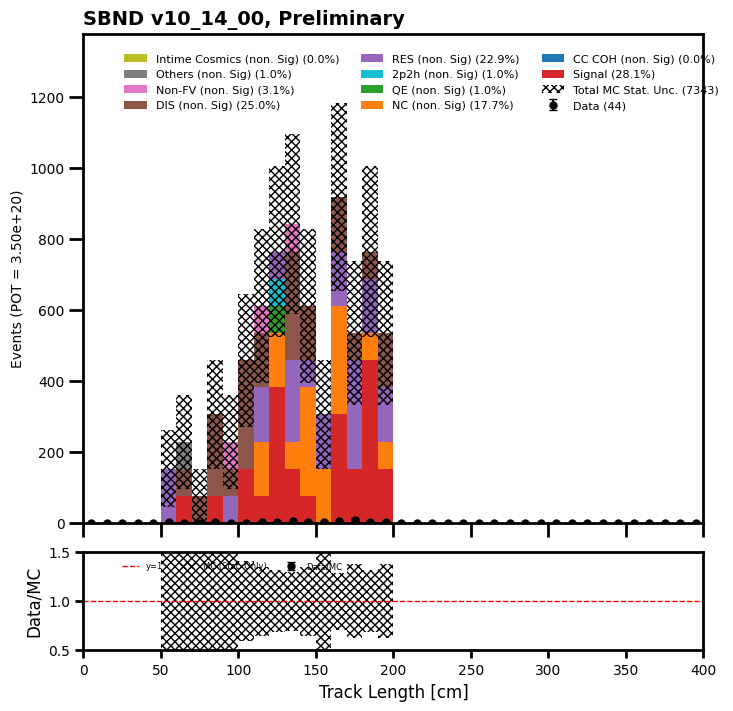

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 2 3 2 4 6 2 0 5 3 0 5 1 4 1 0 0 0 5 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.         76.49085
  535.436     382.45425  1070.872     382.45425   611.92676   994.381
  458.94513   535.43604   688.4176    229.47253   382.45428   305.96338
  152.98169   229.47253    76.490845   76.490845    0.        152.98169
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan 0.02614692
 0.00560291 0.00522938 0.00373527 0.01568815 0.00326837 0.
 0.01089455 0.00560291 0.         0.0217891  0.00261469 0.01307346
 0.00653673 0.         0.   

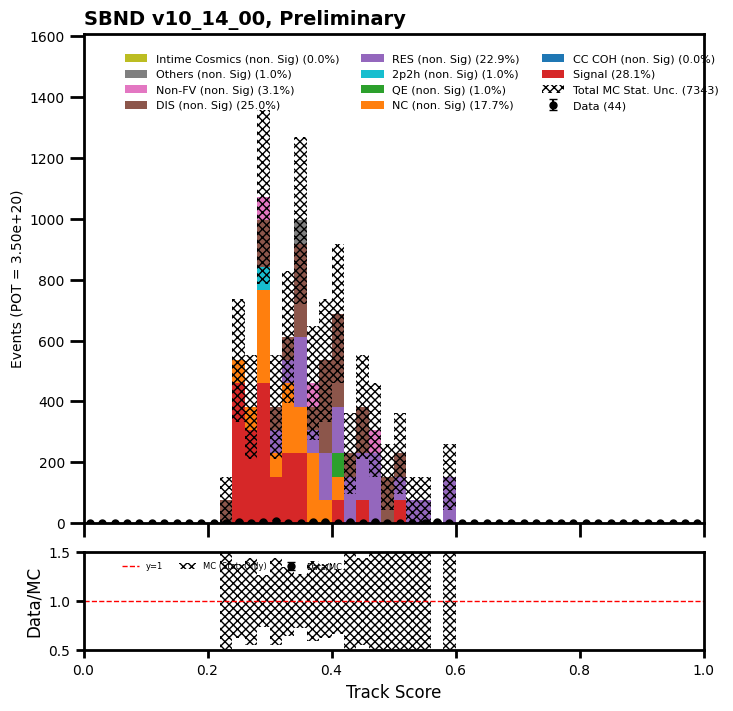

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 2 1 1 2 0 2 1 0 0 2
 1 2 0 2 1 0 2 0 1 0 1 2 0 0 0 1 0 0 2 1 0 0 0 1 1 1 1 0 0 1 0 0 0 1 1 0 0
 1 1 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.       229.47256  152.9817   152.9817   458.94513  152.98169
 152.98169   76.490845 152.9817     0.         0.       229.47256
   0.        76.490845  76.490875   0.       229.47253  229.47253
  76.490845  76.490845 152.98172  152.98172   76.490845   0.
  76.490845   0.        76.490845 305.96338    0.        76.490845
 305.96338  152.98169  305.96344  229.47253    0.       152.98175
  76.490845 152.98169  152.98175    0.       229.4726    76.490845
  76.490845   0.       229.47253    0.        76.490845  76.490845
  76.49086   76.490845 382.45422   76.490845  76.490845 229.47253
   0

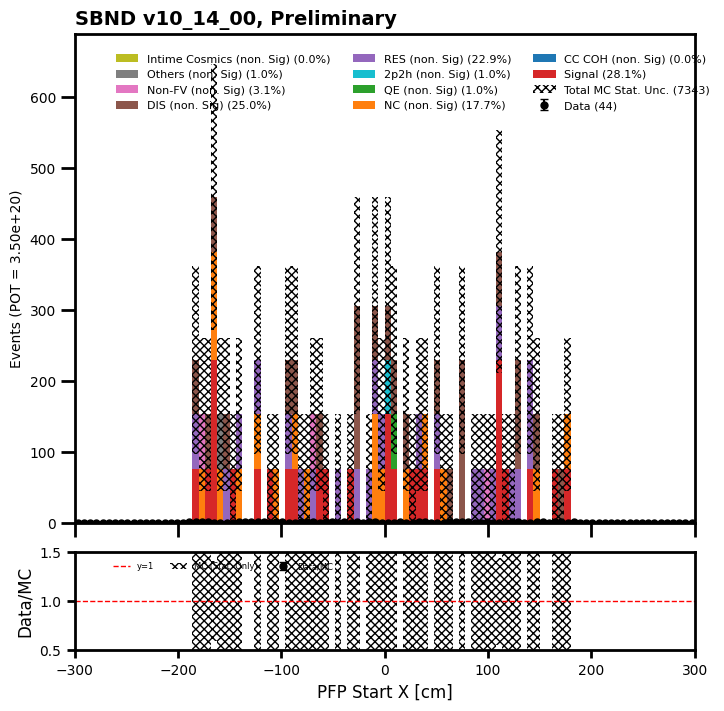

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 2 0 1 1 0 1 1 0 1 0 1 0 1 1
 2 1 0 0 1 1 1 1 0 2 1 2 1 1 1 0 1 0 1 3 1 1 3 0 0 1 1 1 0 0 0 0 0 0 0 0 0
 1 0 1 0 0 2 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.        76.49085    0.       152.9817    76.49086  229.47256
  76.49085    0.       305.9634    76.49085   76.49085  229.47255
  76.490845 305.9634   152.98169  152.98169  152.98169  305.96347
  76.490845   0.         0.        76.490845   0.       305.96338
  76.490845 229.47253   76.490845 152.98169  305.96338   76.490906
  76.490845 305.96344  152.98169   76.490845 152.98169  152.98169
  76.490906  76.490845  76.490845 152.98169   76.490845 152.98175
   0.       229.47253  535.4359   152.98169    0.       152.98169
   0.        76.490845 152.98169   76.490845   0.         0.
 152.9

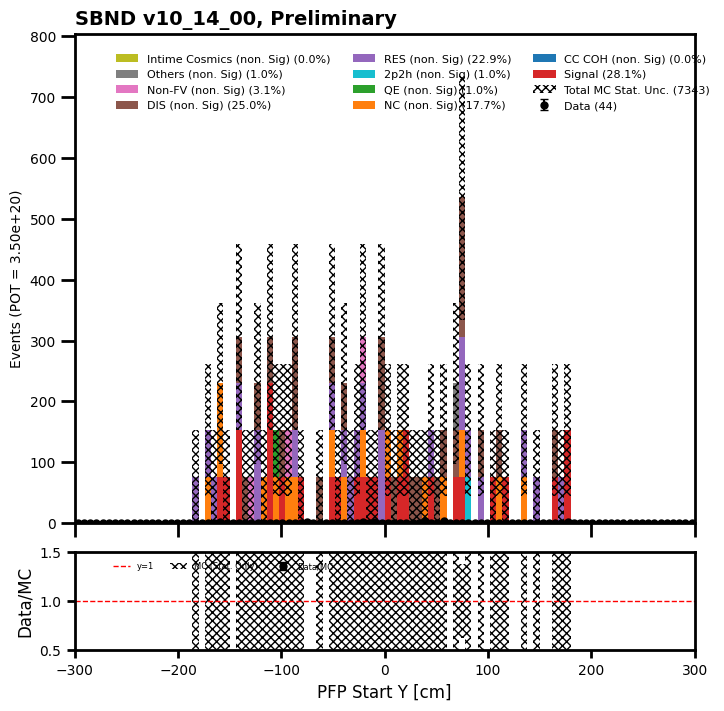

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 1 0 0 0 0 1 0 1 2 3 0 1 1 1 1 0 0 0 0 1
 2 0 1 1 1 1 2 1 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 1 0 2 0 1 1 0 1 1 1 0 0 1
 0 4 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.        76.49085   76.49085
  76.49085  152.9817    76.49085   76.49085   76.49085    0.
  76.49086   76.49086   76.49085  152.98169  152.9817   152.98169
   0.        76.490845 305.9634   152.98172  152.98169   76.490845
 152.98172  382.45422  152.98169  229.47253   76.490845 229.4726
  76.490845   0.         0.       152.98169    0.       229.47256
 152.98169  152.98175   76.490845   0.         0.         0.
   0.         0.       152.98169   76.490845  76.490845 152.98169
   0.       152.98169   76.490845   0.       152.98169   76.49085
  76.490845   0.        76.490845 229.47253   76.490845 382.45428
 229.47

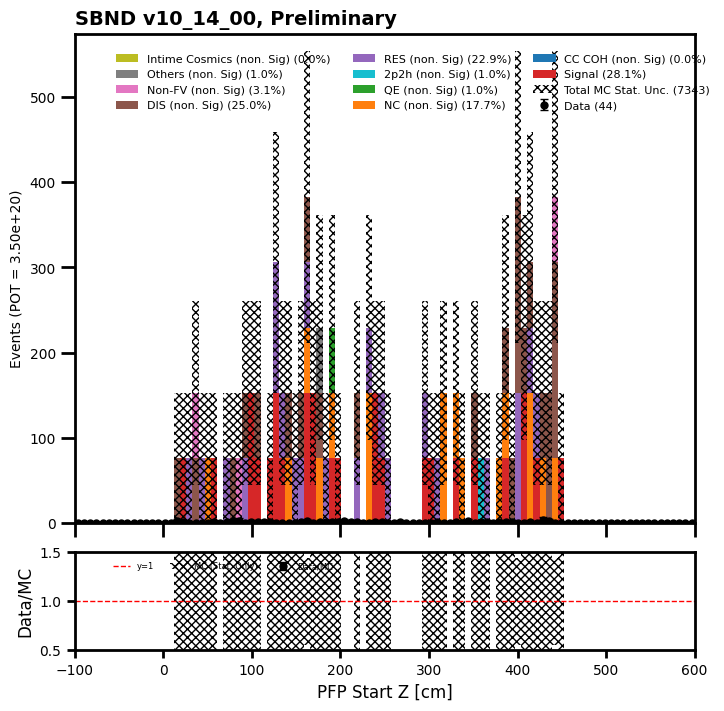

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  4
[0 0 3 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[   0.       458.94513  152.98172  611.92676  382.45422  382.45428
  305.9634   994.381    229.47253  764.90857  764.9085  1070.8718
  535.4359   688.4176     0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [       nan 0.         0.01961019 0.         0.00261469 0.
 0.         0.         0.         0.         0.         0.
 0.         0.                nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


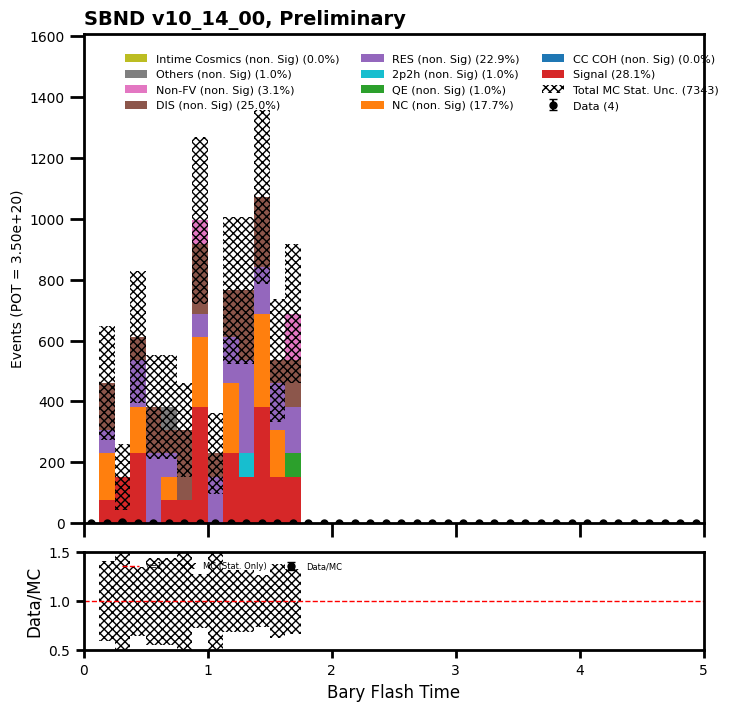

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  44
[15  9  4  1  0  2  2  2  3  1  1  0  0  0  0  0  1  2  1  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[2906.6526   2371.2163    458.94513   841.39935   229.47253     0.
  152.98169     0.        152.98169     0.          0.         76.490845
    0.          0.          0.         76.490845    0.          0.
    0.         76.490845    0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.      ]
data ratio  [0.00516058 0.00379552 0.00871564 0.0011885  0.                inf
 0.01307346        inf 0.01961019        inf        inf 0.
        nan        nan        nan 0.                inf        inf
        inf 0.                nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        

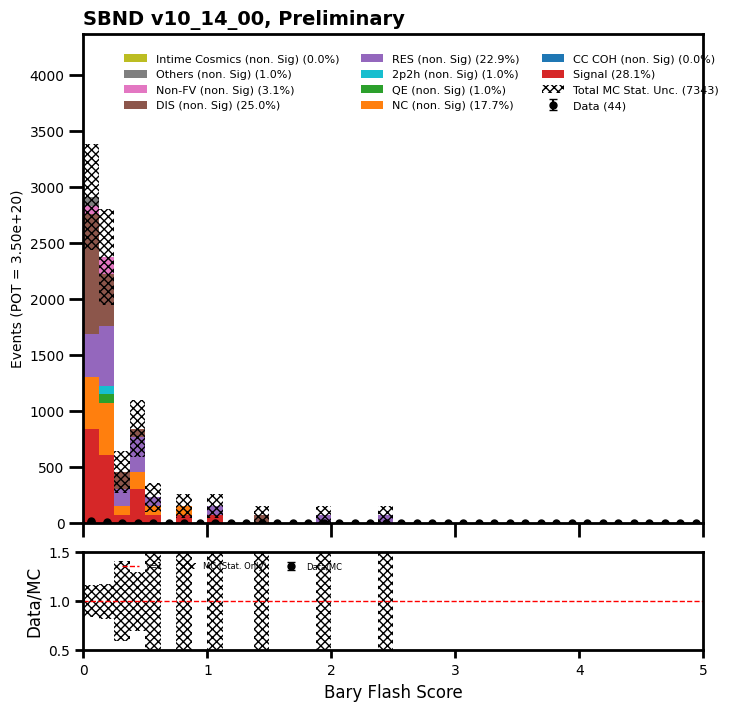

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  44
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 30  9  3  1
  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.      3977.5244  2447.7073   611.92676  152.98169
  152.98169    0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00754238 0.00367691 0.00490255 0.00653673
 0.00653673        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 

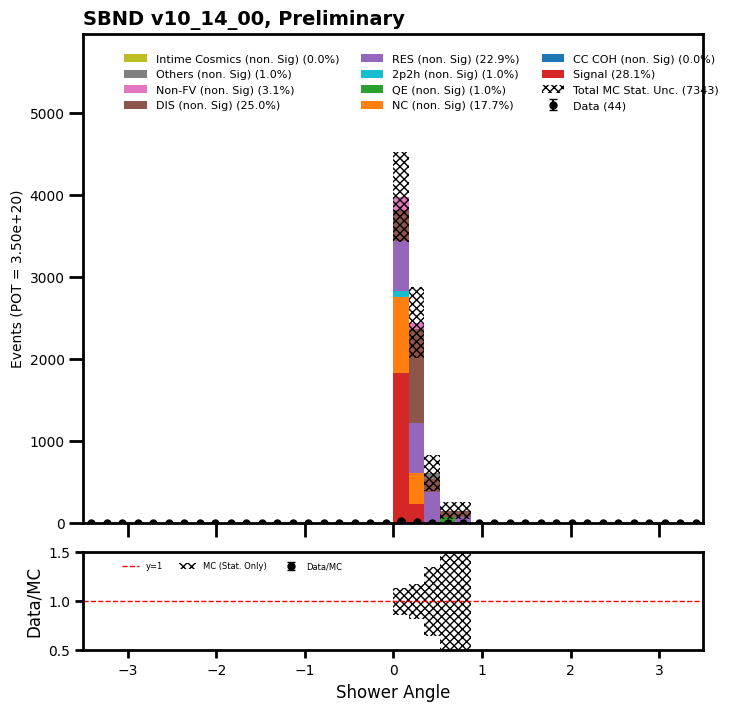

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  44
[22 14  8  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[3977.5247 2141.744  1223.8535    0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.    ]
data ratio  [0.00553108 0.00653673 0.00653673        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


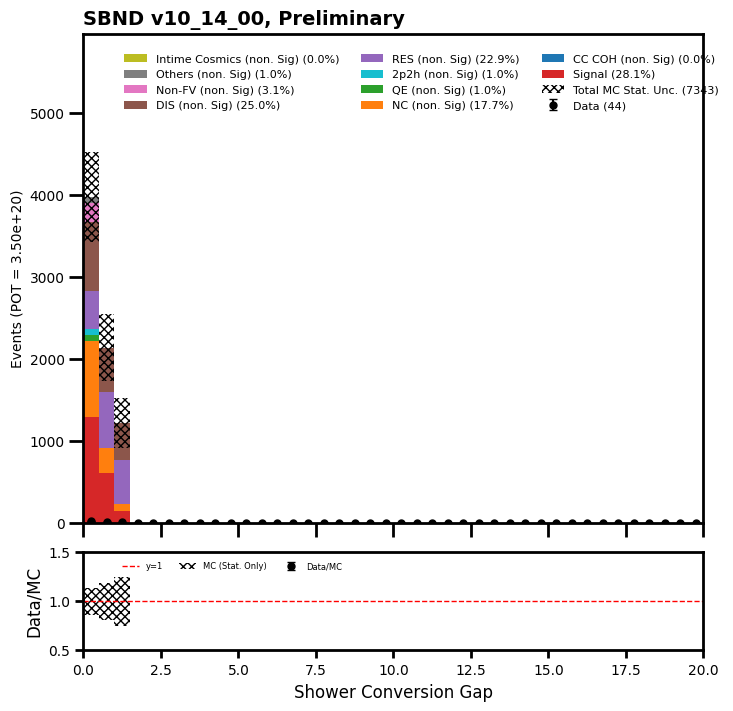

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  41
[ 0  1  3 11  7  2  4  2  1  0  0  1  1  2  1  2  0  0  0  0  0  0  1  0
  0  0  1  0  0  0  0  0  0  1  0  0  0  0  0  0]
[  76.49085    76.49085   305.96344  1529.817     688.41766   458.9451
  305.96338   535.4359    764.90857   152.98169   305.96344    76.490845
  152.98169    76.490845  152.98169    76.490906   76.490845    0.
   76.490845    0.         76.490845    0.          0.         76.490845
    0.          0.          0.        152.98169     0.          0.
    0.          0.          0.          0.          0.          0.
    0.         76.490845   76.490845    0.      ]
data ratio  [0.         0.01307346 0.00980509 0.0071904  0.01016825 0.00435782
 0.01307346 0.00373527 0.00130735 0.         0.         0.01307346
 0.00653673 0.02614692 0.00653673 0.0261469  0.                nan
 0.                nan 0.                nan        inf 0.
        nan        nan        inf 0.                nan        nan
        nan        nan        nan        inf        n

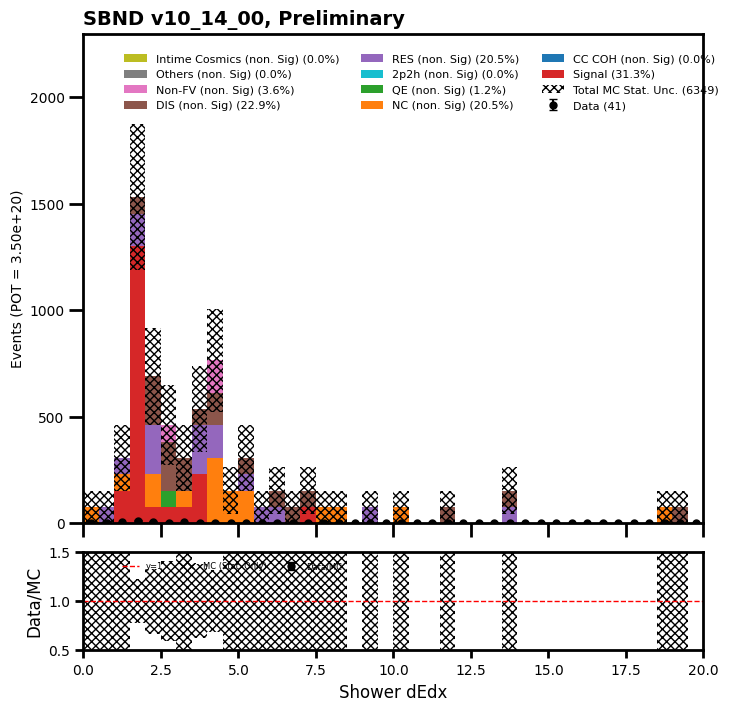

In [59]:
#shr conv length

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.shw.conversion_gap < 1.5)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].pfp.shw.conversion_gap < 1.5)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].pfp.shw.conversion_gap < 1.5)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_conv")

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  21
[21  0]
[2524.19812826    0.        ]
data ratio  [0.00831947        nan]


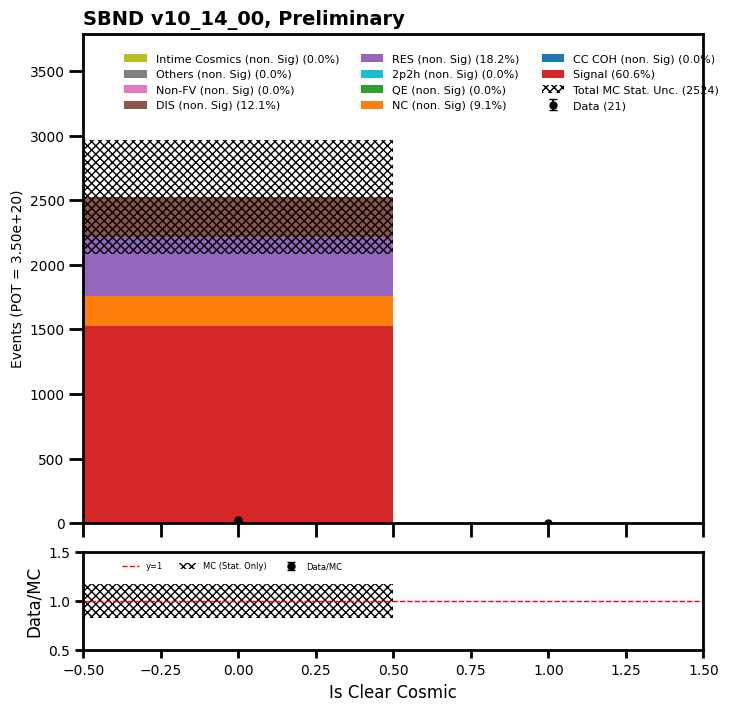

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  20
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 4 5 6 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.       152.9817     0.
   0.        76.49085   76.49085    0.        76.49085  152.9817
  76.490845  76.49085    0.       152.98172    0.       152.98169
   0.         0.         0.        76.490845   0.        76.49086
  76.490845  76.490845 152.98169 

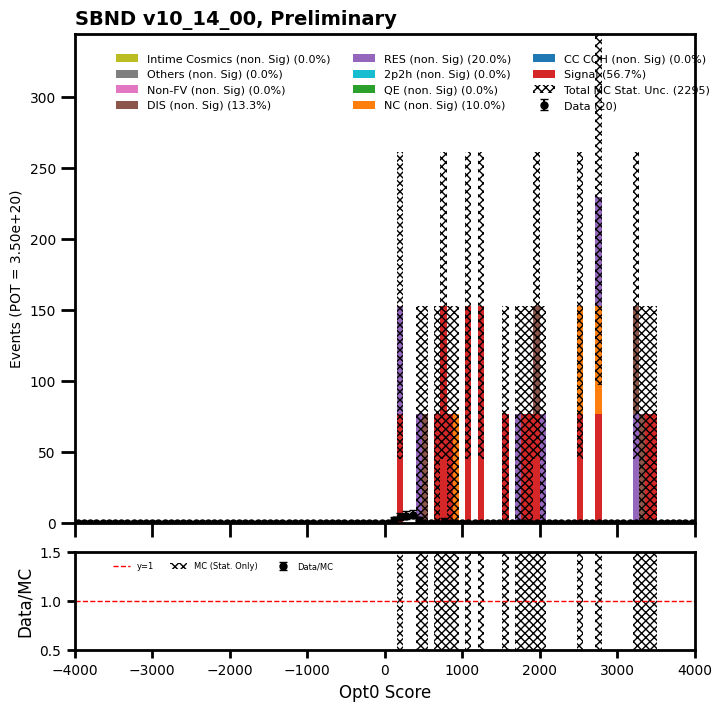

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 4 3 9 4
 0 0 0 0 0 0 0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.      152.9817  229.47256 688.41766
 764.90845 688.41766   0.        0.        0.        0.        0.
   0.        0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00653673 0.01743128 0.00435782 0.01176611
 0.00581043        nan        nan        nan        nan

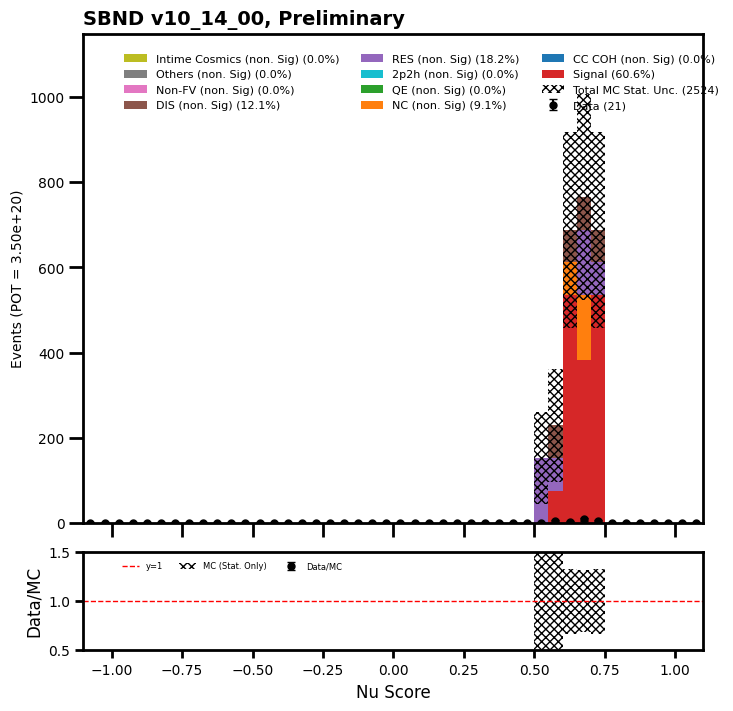

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 2 0 0 1 0 0 1 0 0 1
 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 1 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.        76.49085    0.         0.       229.47256    0.
  76.49085    0.         0.         0.         0.       152.98169
   0.        76.490845   0.         0.        76.490875  76.49085
  76.49085    0.        76.49086   76.490845   0.         0.
   0.         0.        76.490845  76.490845  76.49085    0.
   0.        76.49086   76.490845   0.         0.         0.
  76.490845  76.490845   0.         0.       152.98169    0.
   0.         0.       152.98172    0.        76.490845   0.
   0.         0.       229.4726    76.490845   0.        76.490845
   0.        76.490845   0.    

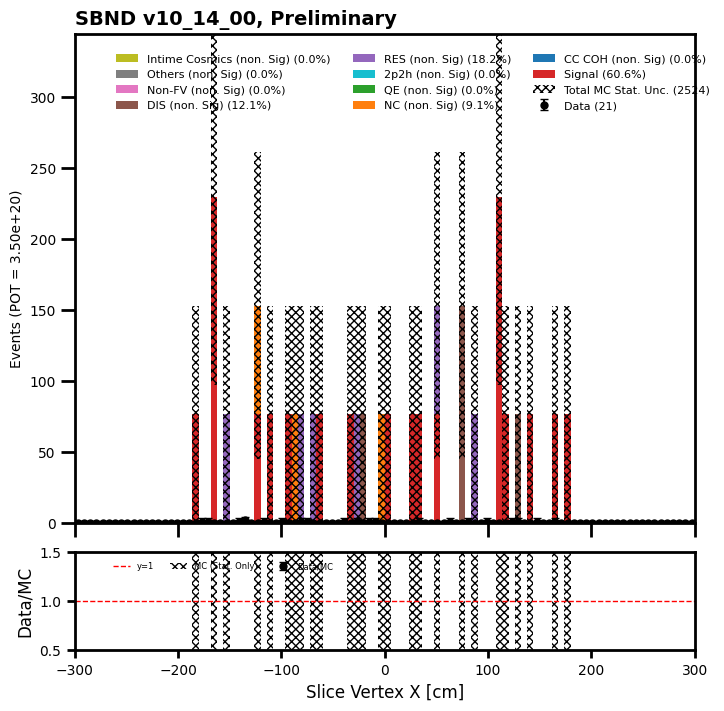

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0
 1 0 0 0 1 2 0 0 0 0 0 1 0 0 0 0 1 0 1 2 1 1 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.       152.9817     0.        76.49085
  76.49085    0.       152.9817     0.         0.         0.
  76.49085   76.490845  76.49085   76.490845   0.        76.49085
   0.         0.         0.         0.         0.        76.490875
  76.490845 152.98172   76.49086  152.98169    0.         0.
   0.        76.490845 152.98169    0.         0.       152.98175
   0.         0.         0.        76.490845  76.49086    0.
   0.       152.98169   76.490845   0.         0.         0.
   0.        76.490845   0.         0.         0.         0.
  76.490845   0.        76

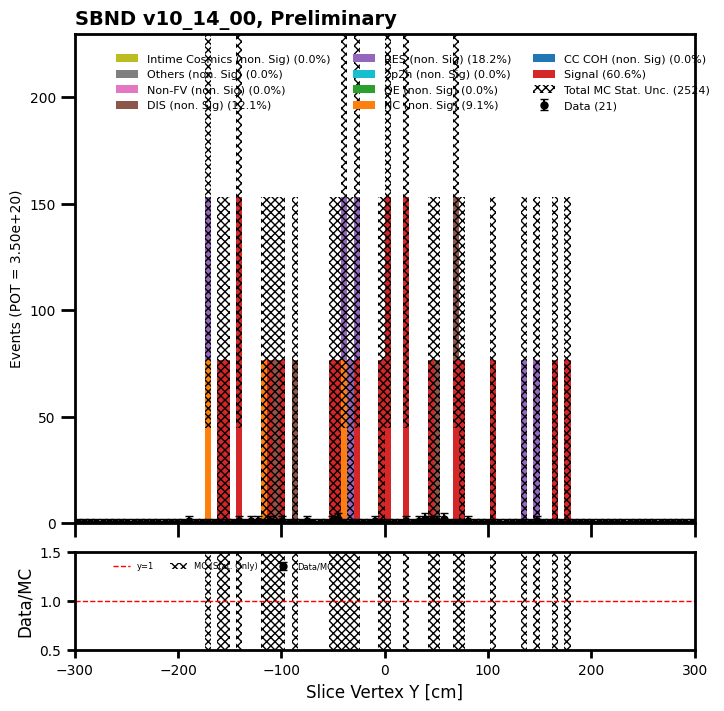

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 2 0 1 1 0 0 0 0 0 0 1
 1 0 0 0 1 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 1 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.        76.49085
  76.49085    0.         0.         0.         0.         0.
  76.49085    0.         0.         0.       152.98172   76.490845
   0.        76.490845 152.9817    76.490875   0.        76.490845
  76.490845 152.98169   76.490845   0.         0.         0.
  76.490845   0.         0.        76.490845   0.         0.
  76.490845  76.490845   0.         0.         0.         0.
   0.         0.        76.490906   0.         0.        76.49085
   0.        76.490845  76.49085    0.         0.         0.
   0.         0.         0.        76.490845   0.        76.49085
 152.98169  152.9817

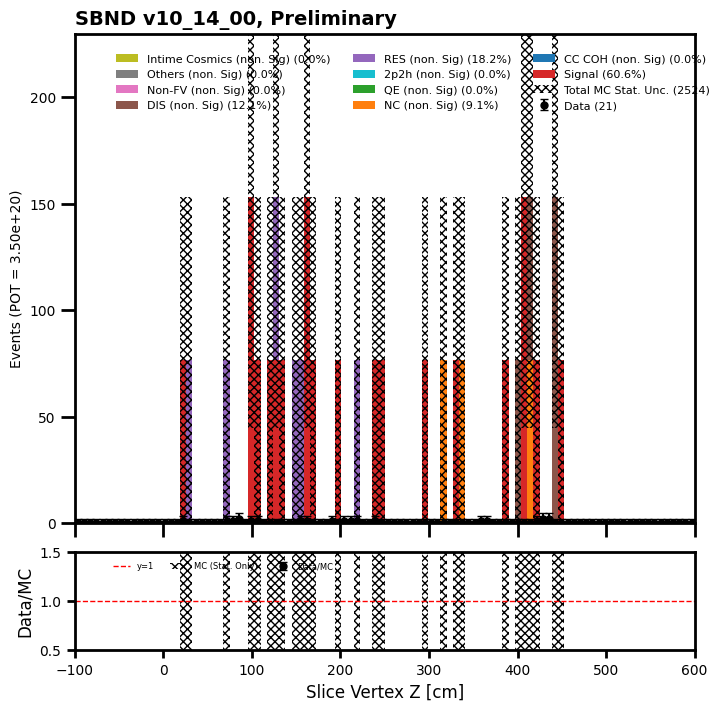

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 1 0 1 1 3 0 2 1 1 3 5 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[  0.        0.        0.        0.        0.       76.49085  76.49085
   0.      152.9817    0.      152.98172 152.98169 382.45425 152.98169
 152.98169   0.      382.4543  152.98169 382.45422 305.96338   0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.     ]
data ratio  [       nan        nan        nan        nan        nan 0.
 0.                inf 0.                inf 0.00653673 0.01961019
 0.         0.01307346 0.00653673        inf 0.00784407 0.03268365
 0.00261469 0.00653673        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


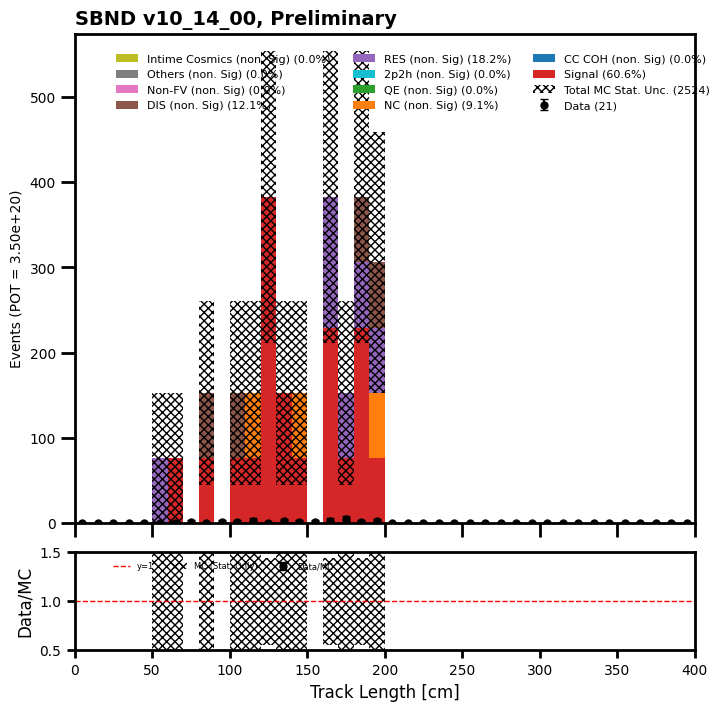

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 1 2 1 1 4 1 0 2 1 0 3 0 3 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
 305.9634   305.9634   305.96338  152.98169  152.98175  229.47253
 152.9817    76.49085  305.96344    0.        76.490845 152.9817
  76.490845  76.490845  76.490845   0.         0.        76.490845
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        inf
 0.00653673 0.00326836 0.00326837 0.02614692 0.00653673 0.
 0.01307346 0.01307346 0.                inf 0.         0.01961019
 0.01307346 0.         0.                nan        inf 0.
        nan        nan

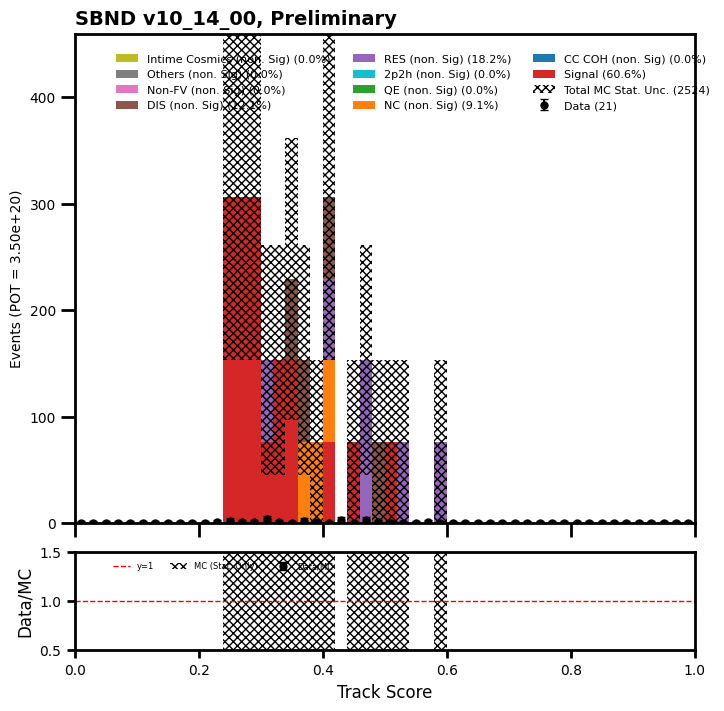

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 2 0 0 2 0 0 1 0 0 1
 1 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 0 0 1 1 0 0
 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.        76.49085    0.         0.       229.47256    0.
  76.49085    0.         0.         0.         0.       152.98169
   0.        76.490845   0.         0.        76.490875  76.49085
  76.49085    0.        76.49086   76.490845   0.         0.
   0.         0.        76.490845 152.98169    0.         0.
   0.        76.49086   76.490845   0.         0.         0.
  76.490845  76.490845   0.         0.       152.98169    0.
   0.         0.       152.98172    0.        76.490845   0.
   0.         0.       229.4726    76.490845   0.        76.490845
   0.        76.490845   0.    

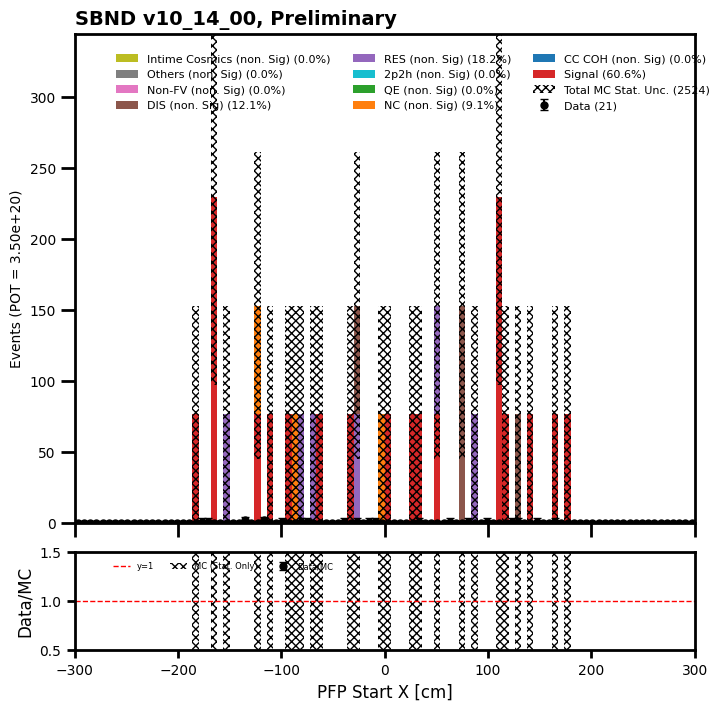

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0
 1 0 0 0 1 0 1 0 0 0 0 1 0 1 1 0 1 0 1 2 0 1 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.       152.9817     0.        76.49085
  76.49085    0.       152.9817     0.         0.         0.
  76.49085   76.490845   0.       152.98169    0.        76.49085
   0.         0.         0.         0.         0.        76.490875
  76.490845 152.98172   76.49086  152.98169    0.        76.490845
  76.490845   0.        76.490845   0.        76.490845  76.490906
   0.         0.         0.        76.490845   0.        76.49086
   0.       152.98169   76.490845   0.         0.         0.
   0.        76.490845   0.         0.         0.         0.
  76.490845   

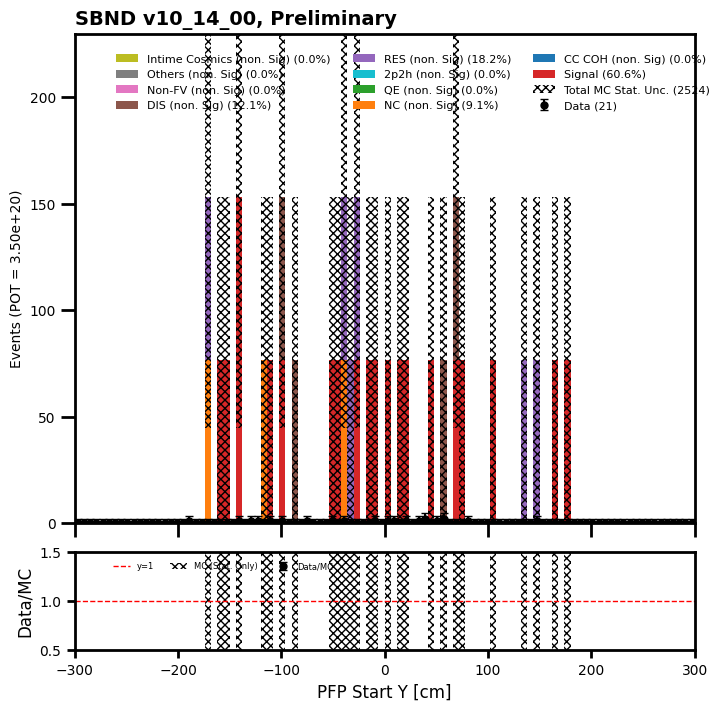

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 2 0 1 0 1 0 0 0 0 0 0
 1 0 0 1 1 0 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 3 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.        76.49085
  76.49085    0.         0.         0.         0.         0.
  76.49085    0.         0.         0.       152.98172    0.
   0.        76.490845 229.47255   76.490875   0.        76.490845
  76.490845 152.98169   76.490845   0.         0.         0.
  76.490845   0.         0.        76.490845   0.         0.
  76.490845  76.490845   0.         0.         0.         0.
   0.         0.        76.490906   0.         0.        76.49085
   0.        76.490845  76.49085    0.         0.         0.
   0.         0.         0.       152.98169    0.        76.49085
 152.98169   76.49086   76

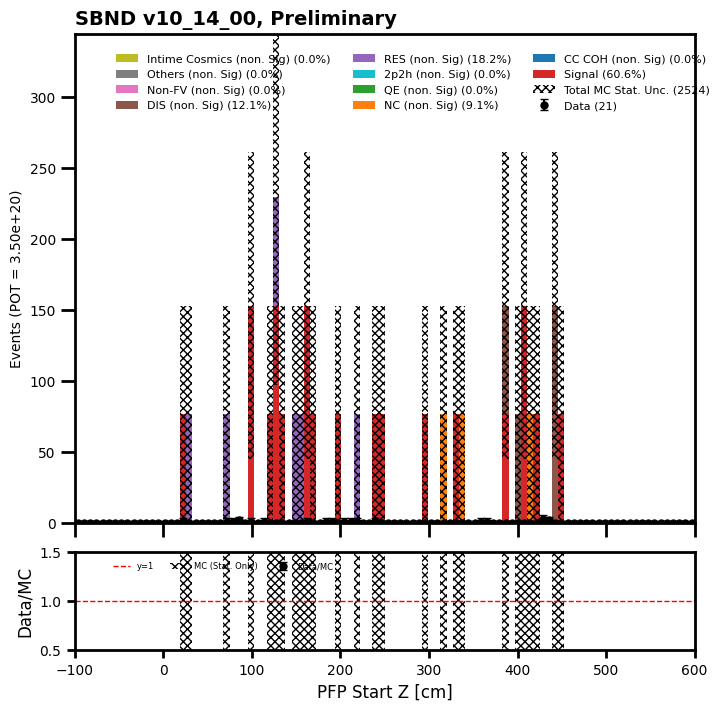

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[  0.       229.47256   76.49085  305.9634   229.47256   76.490845
  76.490845 382.45428    0.       305.96338  229.47253  382.45428
 152.98169   76.490845   0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.      ]
data ratio  [       nan 0.         0.01307346 0.         0.         0.
 0.         0.                nan 0.         0.         0.
 0.         0.                nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


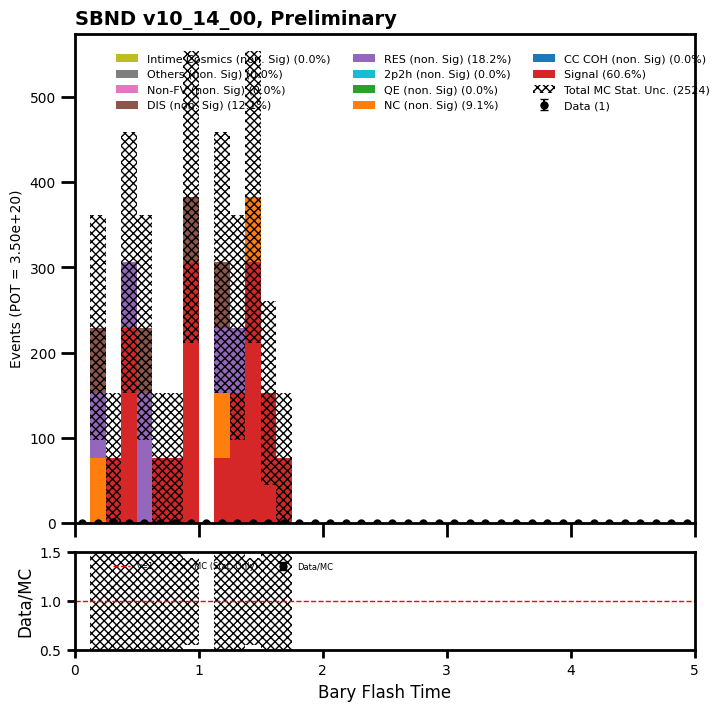

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[8 3 3 0 0 2 0 0 2 1 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[1070.872     841.3994    152.9817    305.96338    76.490845    0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.         76.490845    0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.      ]
data ratio  [0.00747055 0.00356549 0.01961019 0.         0.                inf
        nan        nan        inf        inf        nan        nan
        nan        nan        nan 0.                inf        nan
        inf        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan 

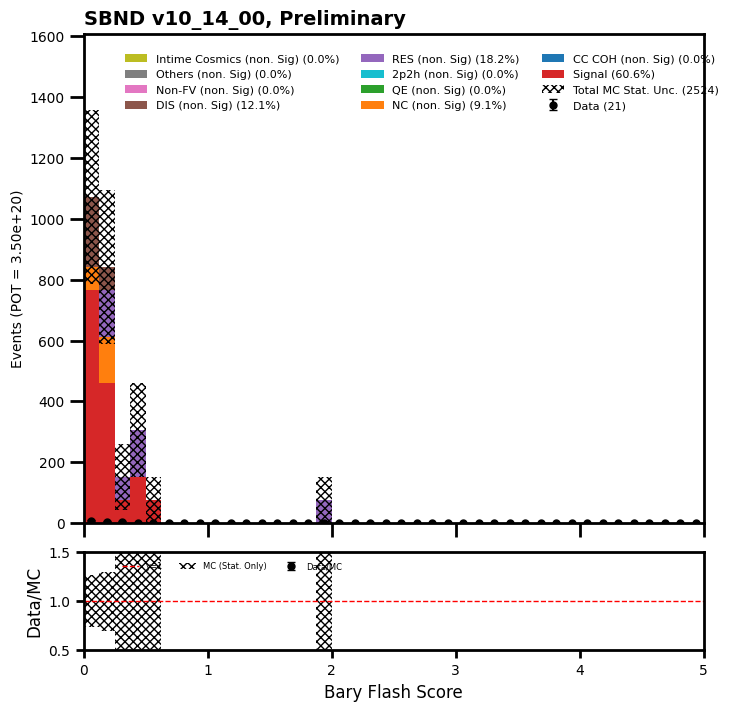

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  21
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 13  4  2  1
  1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[   0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.       1682.7987    764.9085     76.490845    0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0.          0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00772523 0.00522938 0.02614692        inf
        inf        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan      

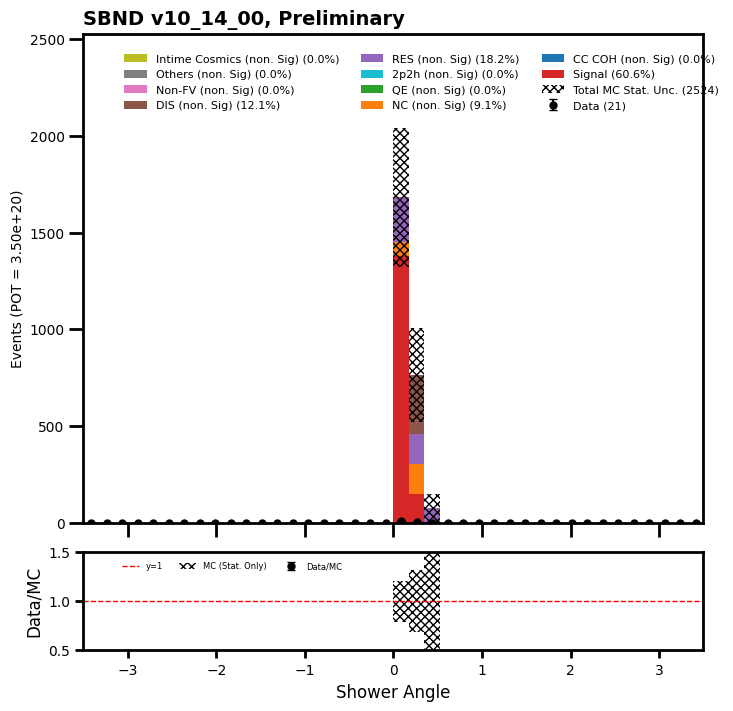

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  21
[13  5  3  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[1300.3445   917.89026  305.96338    0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [0.00999735 0.00544727 0.0098051         nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan      

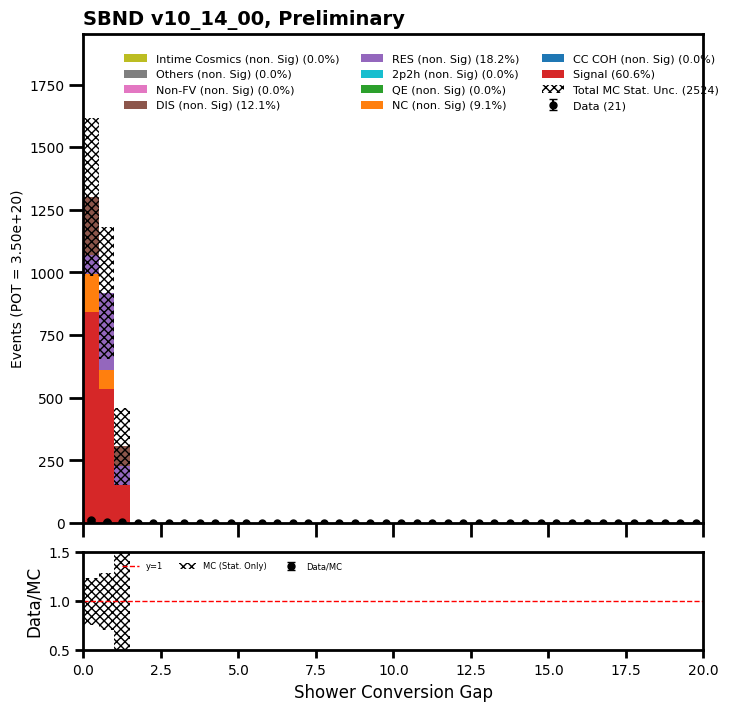

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  21
[ 0  0  3 11  7  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[   0.         0.       305.9634  1529.817    688.41766    0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [       nan        nan 0.00980509 0.0071904  0.01016825        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan      

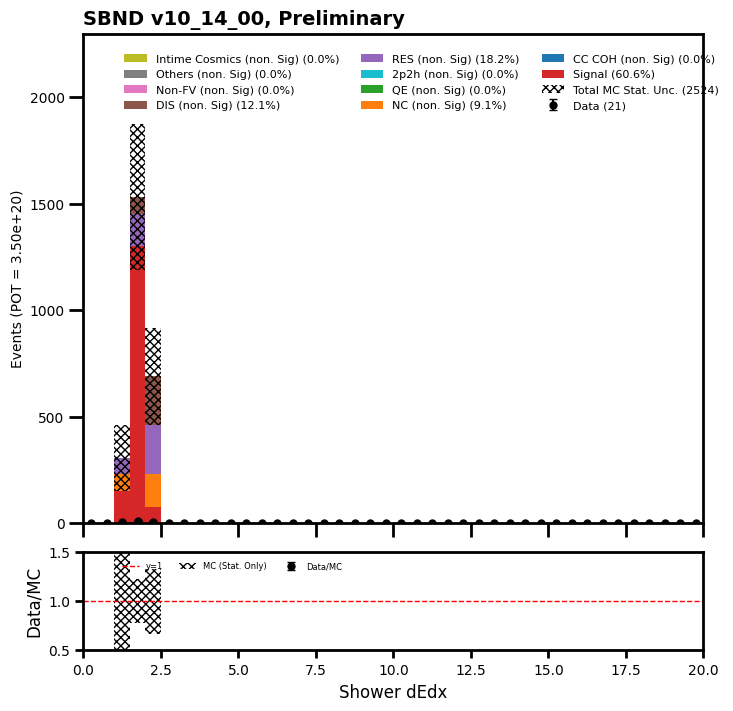

In [60]:
#dedx

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.shw.bestplane_dEdx < 2.5) & (mc_bnb_cosmic_dfs["evt"].pfp.shw.bestplane_dEdx > 1)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].pfp.shw.bestplane_dEdx < 2.5) & (data_offbeam_light_dfs["evt"].pfp.shw.bestplane_dEdx > 1)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].pfp.shw.bestplane_dEdx < 2.5) & (data_bnb_light_dfs["evt"].pfp.shw.bestplane_dEdx > 1)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_dedx")

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  14
[14  0]
[1835.78045691    0.        ]
data ratio  [0.00762618        nan]


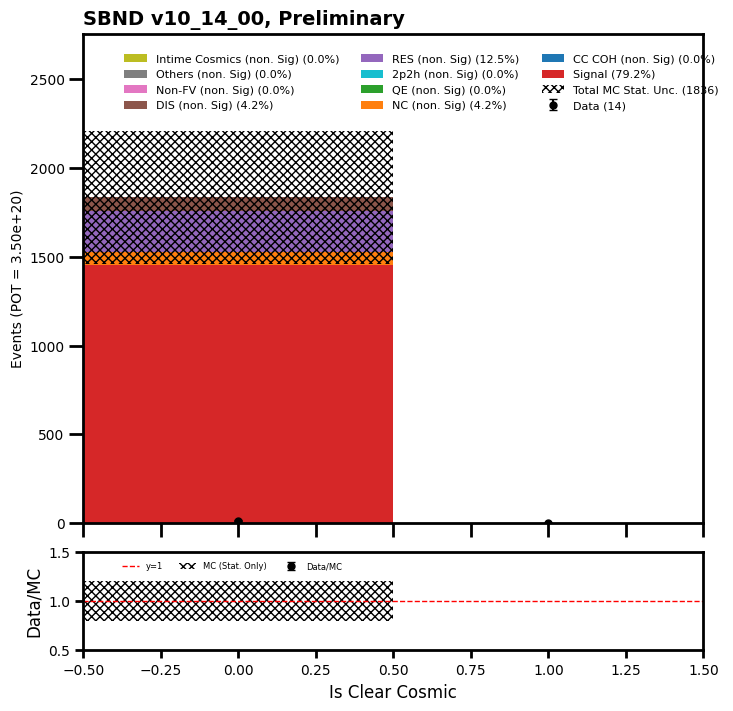

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  13
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 4 4 2 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.        76.49085    0.
   0.        76.49085    0.         0.        76.49085  152.9817
  76.490845   0.         0.       152.98172    0.       152.98169
   0.         0.         0.        76.490845   0.        76.49085
  76.490845  76.490845 152.98169 

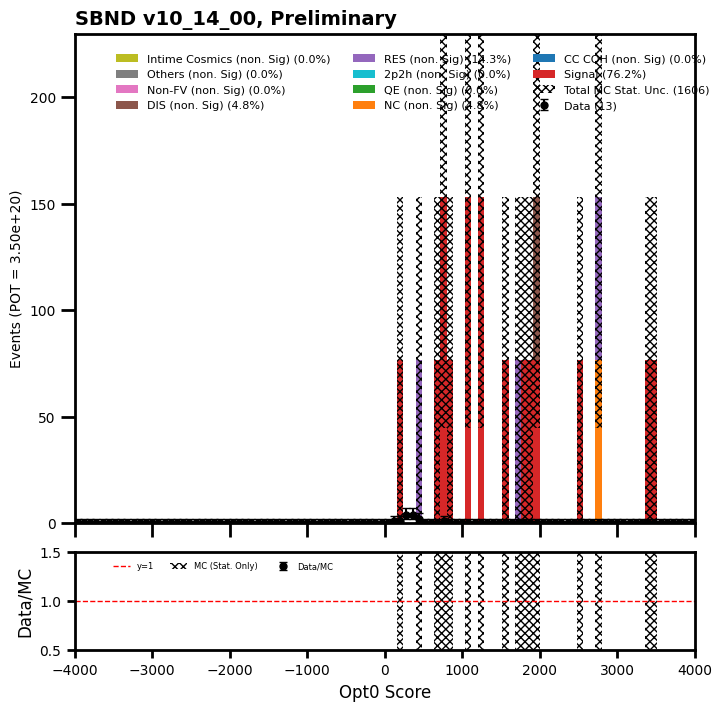

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 3 2 5 3
 0 0 0 0 0 0 0]
[  0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.       76.49085   0.      535.436
 611.92676 611.9268    0.        0.        0.        0.        0.
   0.        0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.01307346        inf 0.00373527 0.00817091
 0.00490255        nan        nan        nan        nan  

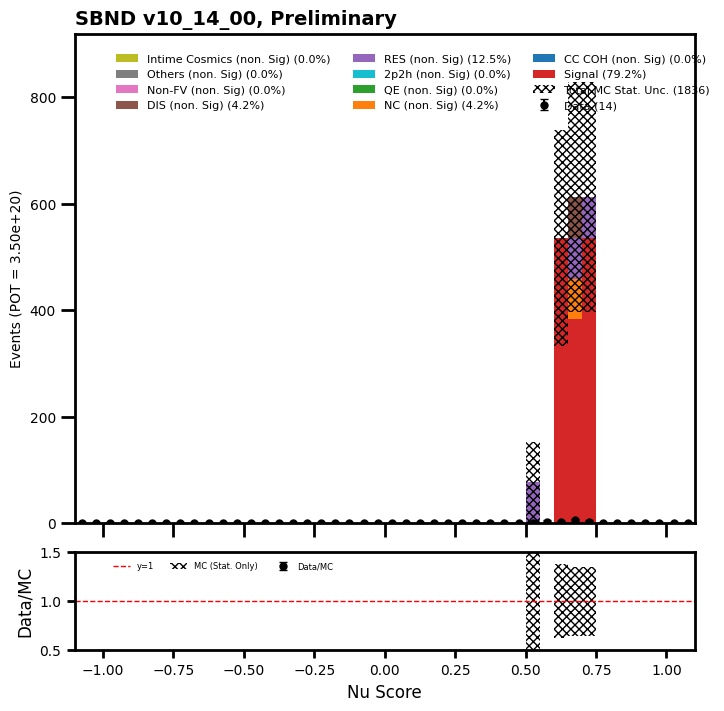

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 2 0 0 0 0 0 1 0 0 1
 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.        76.49085    0.         0.       229.47256    0.
   0.         0.         0.         0.         0.        76.490845
   0.        76.490845   0.         0.        76.490875   0.
  76.49085    0.         0.         0.         0.         0.
   0.         0.        76.490845  76.49085    0.         0.
   0.        76.49085   76.490845   0.         0.         0.
  76.490845  76.490845   0.         0.       152.9817     0.
   0.         0.        76.49085    0.         0.         0.
   0.         0.       229.4726    76.490845   0.         0.
   0.        76.490845   0.         0.   

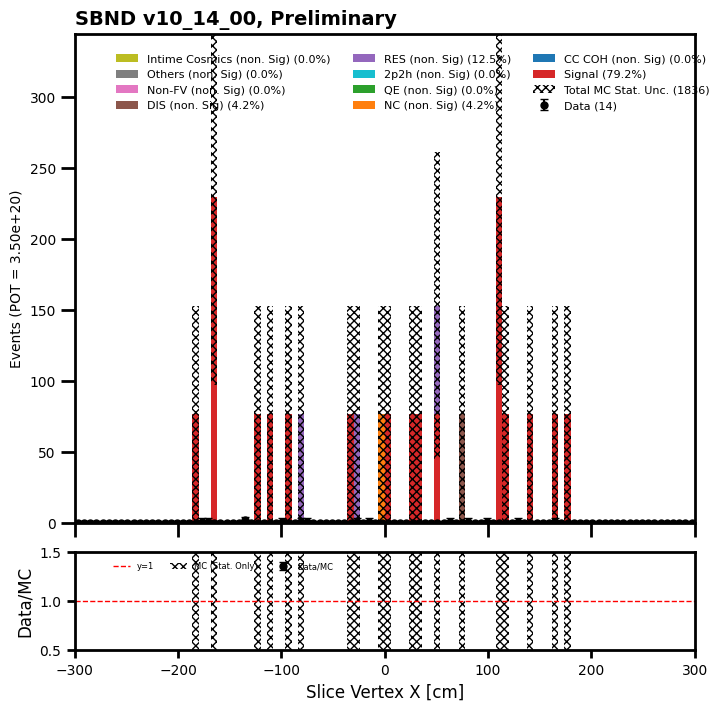

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc


total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.        76.49085    0.        76.49085
  76.49085    0.       152.9817     0.         0.         0.
   0.        76.490845   0.        76.490845   0.         0.
   0.         0.         0.         0.         0.        76.490875
  76.490845  76.49085    0.       152.98169    0.         0.
   0.         0.       152.98169    0.         0.       152.98169
   0.         0.         0.        76.490906   0.         0.
   0.       152.98169   76.490845   0.         0.         0.
   0.        76.490845   0.         0.         0.         0.
   0.         0.        76.4908

/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 - lolims), 1 - uplims]) * err


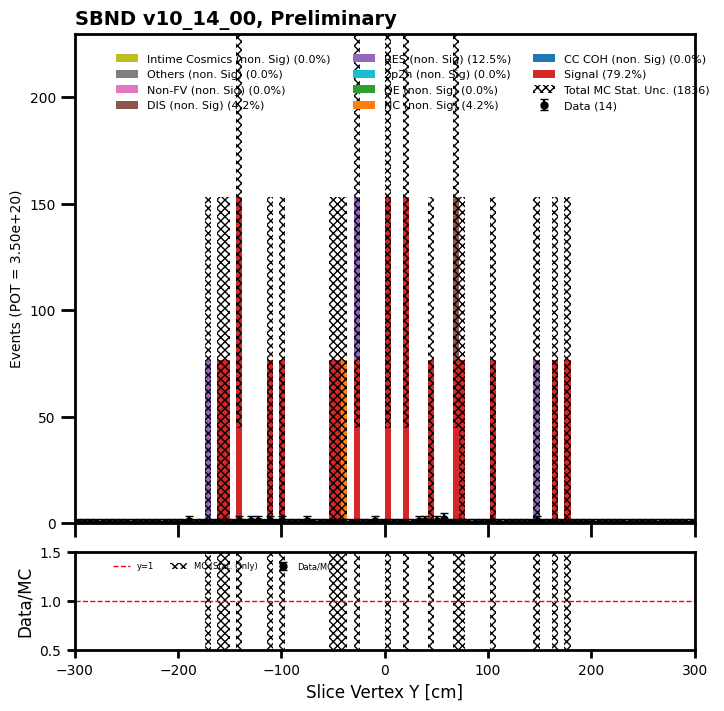

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 0 1 1 0 0 0 0 0 0 0
 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.        76.49085
   0.         0.         0.         0.         0.         0.
  76.49085    0.         0.         0.       152.98172   76.490845
   0.        76.490845  76.490845  76.490875   0.        76.49085
  76.49086  152.98169   76.490845   0.         0.         0.
  76.490845   0.         0.         0.         0.         0.
  76.490845  76.490845   0.         0.         0.         0.
   0.         0.        76.490906   0.         0.        76.49085
   0.        76.490845   0.         0.         0.         0.
   0.         0.         0.        76.490845   0.        76.49085
  76.490845   0.     

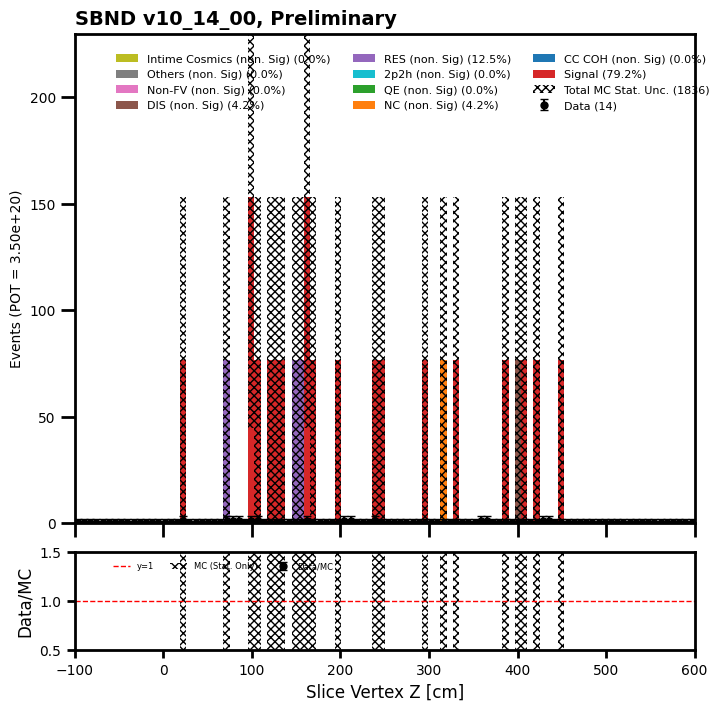

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 1 0 0 1 2 0 1 1 1 2 3 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[  0.         0.         0.         0.         0.        76.49085
  76.49085    0.        76.49085    0.        76.49086   76.490845
 305.9634   152.98169  152.98169    0.       229.4726    76.490845
 382.45422  152.9817     0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.      ]
data ratio  [       nan        nan        nan        nan        nan 0.
 0.                inf 0.                nan 0.01307346 0.02614692
 0.         0.00653673 0.00653673        inf 0.00871564 0.03922038
 0.         0.01307346        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


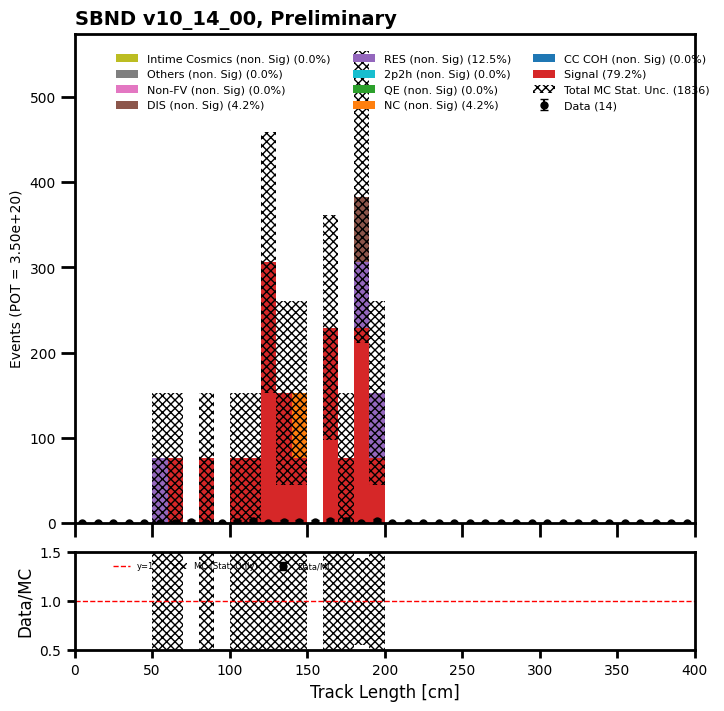

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 1 2 1 1 3 1 0 0 0 0 0 0 3 1 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
 305.9634   305.9634   305.96338  152.98169  152.98175  152.98169
   0.         0.       229.47253    0.         0.         0.
   0.        76.490845  76.49085    0.         0.        76.49086
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.      ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        inf
 0.00653673 0.00326836 0.00326837 0.01961019 0.00653673 0.
        nan        nan 0.                nan        nan        inf
        inf 0.         0.                nan        inf 0.
        nan        nan     

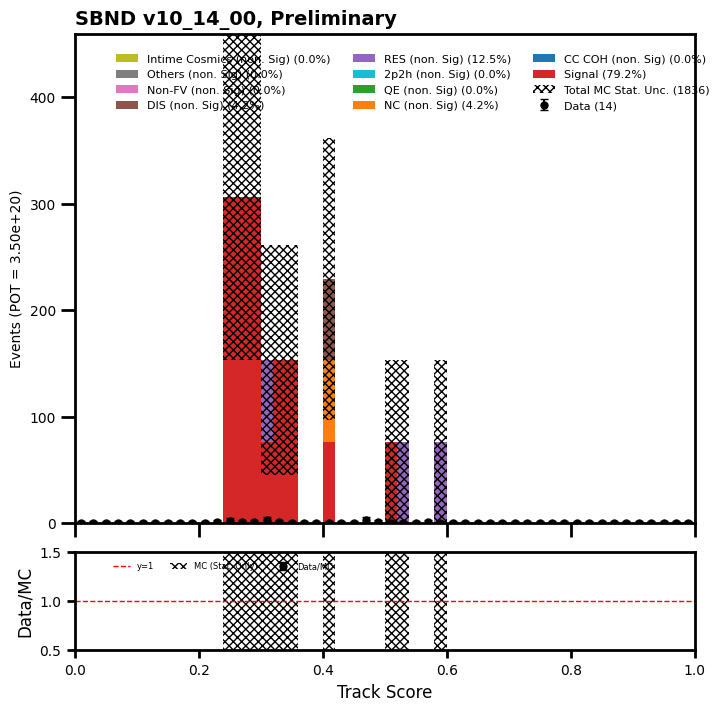

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 2 0 0 0 0 0 1 0 0 1
 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1 0 0 0 0 1 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.        76.49085    0.         0.       229.47256    0.
   0.         0.         0.         0.         0.        76.490845
   0.        76.490845   0.         0.        76.490875   0.
  76.49085    0.         0.         0.         0.         0.
   0.         0.        76.490845  76.49085    0.         0.
   0.        76.49085   76.490845   0.         0.         0.
  76.490845  76.490845   0.         0.       152.9817     0.
   0.         0.        76.49085    0.         0.         0.
   0.         0.       229.4726    76.490845   0.         0.
   0.        76.490845   0.         0.   

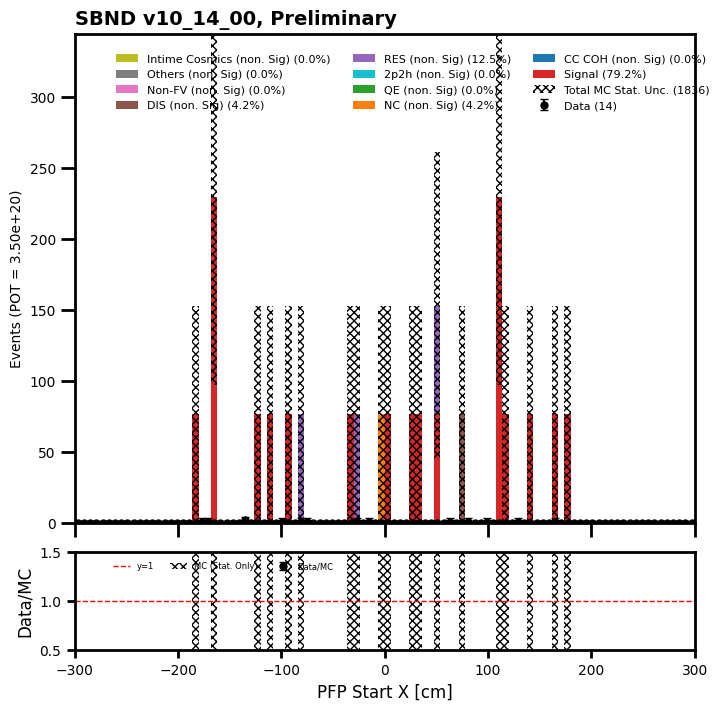

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.        76.49085    0.        76.49085
  76.49085    0.       152.9817     0.         0.         0.
   0.        76.490845   0.        76.490845   0.         0.
   0.         0.         0.         0.         0.        76.490875
  76.490845  76.49085    0.       152.98169    0.        76.490845
   0.         0.        76.490845   0.        76.490845  76.490845
   0.         0.         0.        76.490906   0.         0.
   0.       152.98169   76.490845   0.         0.         0.
   0.        76.490845   0.         0.         0.         0.
   0.         0.        

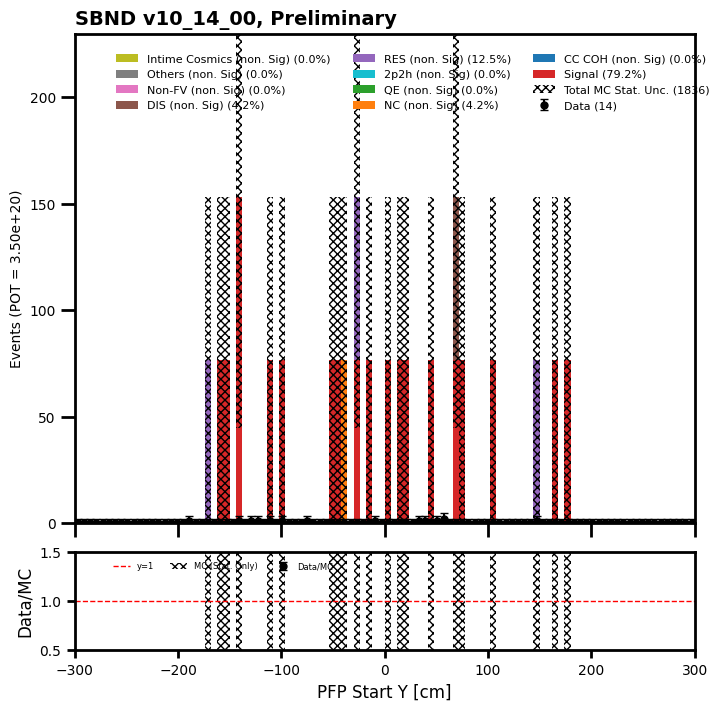

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 1 1 0 1 0 1 0 0 0 0 0 0
 1 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[  0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.        76.49085
   0.         0.         0.         0.         0.         0.
  76.49085    0.         0.         0.       152.98172    0.
   0.        76.490845 152.98169   76.490875   0.        76.49085
  76.49086  152.98169   76.490845   0.         0.         0.
  76.490845   0.         0.         0.         0.         0.
  76.490845  76.490845   0.         0.         0.         0.
   0.         0.        76.490906   0.         0.        76.49085
   0.        76.490845   0.         0.         0.         0.
   0.         0.         0.        76.490845   0.        76.49085
  76.490845   0.        76.

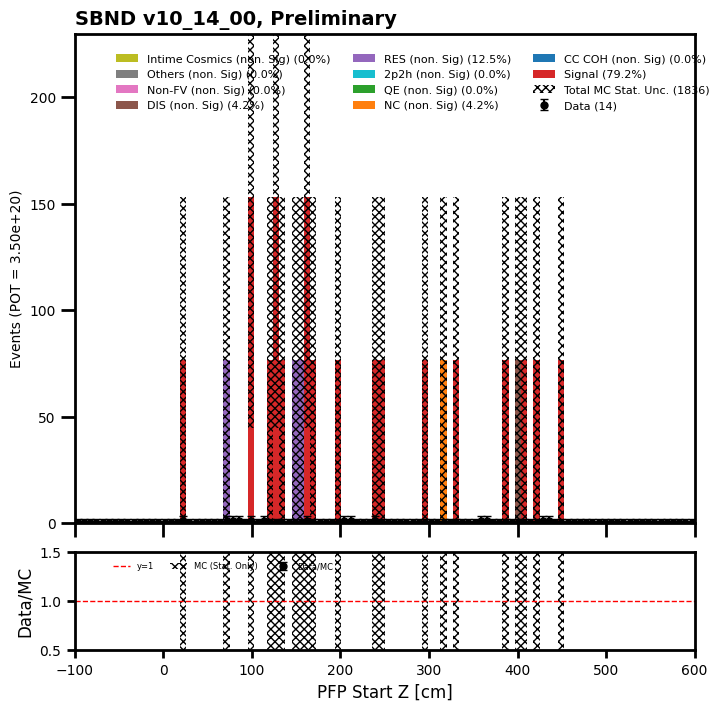

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  1
[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[  0.        76.49085   76.49085  229.47256   76.49085   76.490845
  76.490845 229.47256    0.       229.47253  229.47255  305.96344
 152.98169   76.490845   0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.      ]
data ratio  [       nan 0.         0.01307346 0.         0.         0.
 0.         0.                nan 0.         0.         0.
 0.         0.                nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


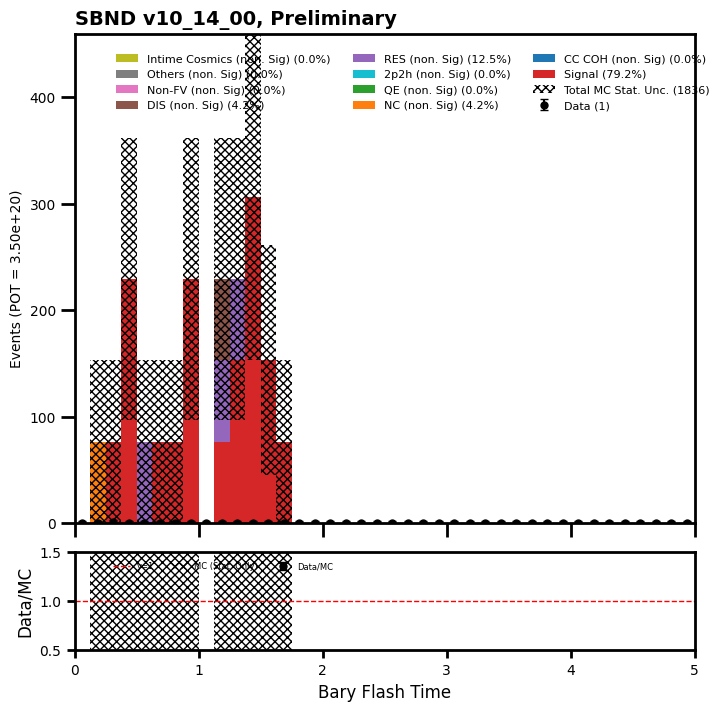

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: divide by zero encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc
/exp/sbnd/app/users/amoor/cafpyana/cafpyana/envs/venv_py39_cafpyana/lib/python3.9/site-packages/matplotlib/axes/_axes.py:3749: RuntimeWarning: overflow encountered in add
  low, high = dep + np.vstack([-(1 -

total data =  14
[3 2 3 0 0 2 0 0 2 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[688.41766  688.41766   76.490845 305.9634    76.490845   0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.         0.         0.      ]
data ratio  [0.00435782 0.00290521 0.03922038 0.         0.                inf
        nan        nan        inf        inf        nan        nan
        nan        nan        nan        nan        nan        nan
        inf        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


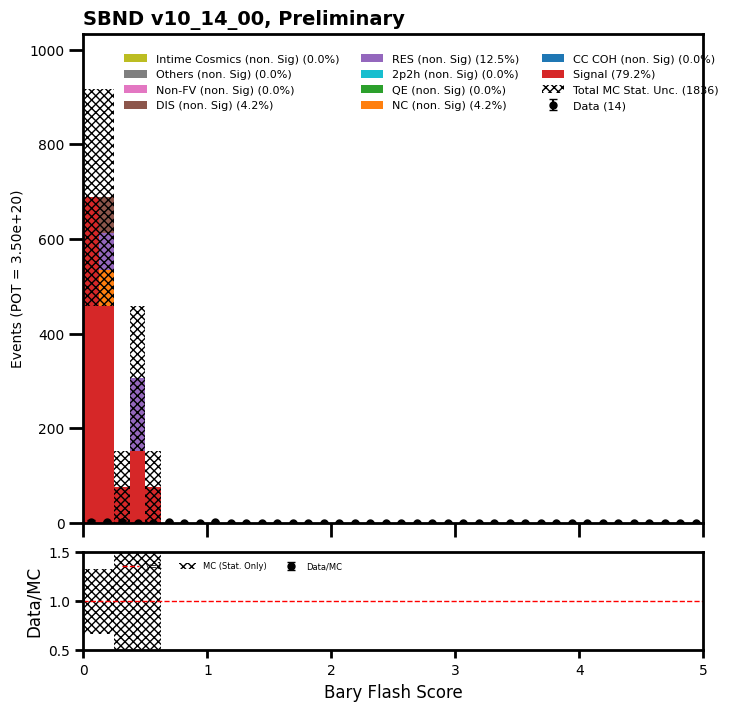

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  14
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 13  1  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
[   0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.      1682.7987   152.98169    0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.         0.         0.
    0.         0.         0.         0.     ]
data ratio  [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan 0.00772523 0.00653673        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan      

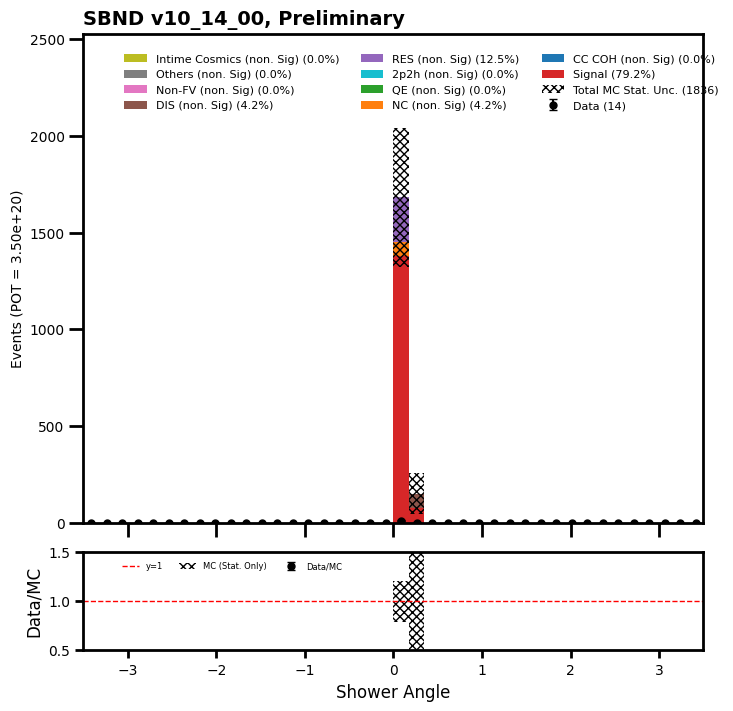

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  14
[9 4 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[917.8902  688.41766 229.47255   0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.        0.        0.
   0.        0.        0.        0.        0.     ]
data ratio  [0.00980509 0.00581043 0.00435782        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


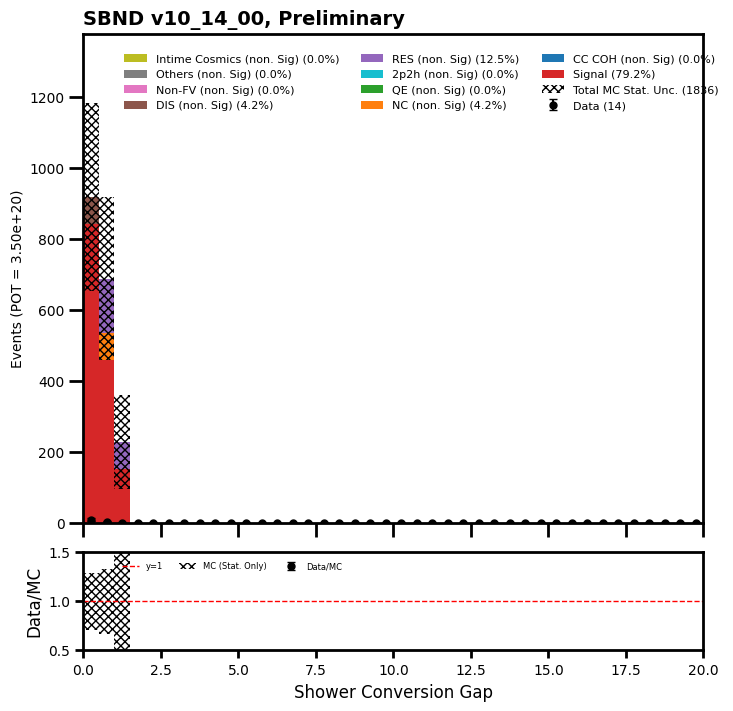

/tmp/ipykernel_2850/150918385.py:110: RuntimeWarning: invalid value encountered in divide
  mc_stat_err_ratio = mc_stat_err / total_mc
/tmp/ipykernel_2850/150918385.py:111: RuntimeWarning: invalid value encountered in divide
  mc_content_ratio = total_mc / total_mc
/tmp/ipykernel_2850/150918385.py:165: RuntimeWarning: invalid value encountered in divide
  data_ratio = norm_counts / total_mc
/tmp/ipykernel_2850/150918385.py:169: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eylow = data_eylow / total_mc
/tmp/ipykernel_2850/150918385.py:170: RuntimeWarning: divide by zero encountered in divide
  data_ratio_eyhigh = data_eyhigh / total_mc


total data =  14
[0 0 2 6 6 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
[   0.        0.      152.9817 1376.8353  305.9634    0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.        0.        0.
    0.        0.        0.        0.        0.    ]
data ratio  [       nan        nan 0.01307346 0.00435782 0.01961019        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan]


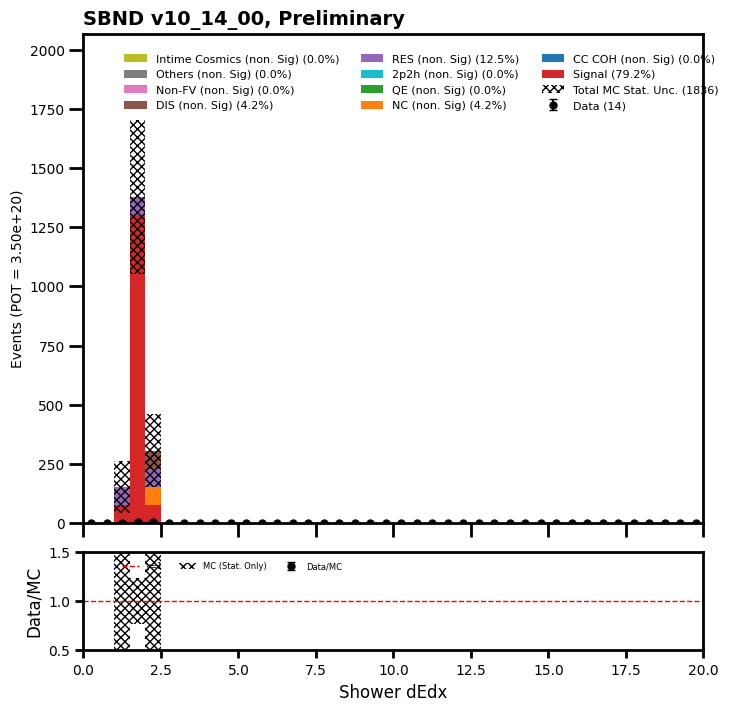

In [61]:
#shr opening angle

mc_bnb_cosmic_dfs["evt"] = mc_bnb_cosmic_dfs["evt"][(mc_bnb_cosmic_dfs["evt"].pfp.shw.open_angle < 0.2)]
data_offbeam_light_dfs["evt"] = data_offbeam_light_dfs["evt"][(data_offbeam_light_dfs["evt"].pfp.shw.open_angle < 0.2)]
data_bnb_light_dfs["evt"] = data_bnb_light_dfs["evt"][(data_bnb_light_dfs["evt"].pfp.shw.open_angle < 0.2)]

draw_reco_valid_plots(mc_bnb_cosmic_dfs["evt"], data_offbeam_light_dfs["evt"], data_bnb_light_dfs["evt"], "a_vtx_fv_and_not_clear_cosmic_conv")

In [62]:
## Check 
mc_bnb_cosmic_dfs["evt"].gen.nuint_categ.value_counts()

nuint_categ
1.0    19
5.0     3
6.0     1
0.0     1
Name: count, dtype: int64

In [65]:
print("number of tracks = ", 1835*0.792)

number of tracks =  1453.3200000000002


In [74]:
print("efficiency = ", 19/103)

efficiency =  0.18446601941747573
